In [2]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import numpy as np

from CloudSaturation import CloudSaturation

from Utils import *
# Configurator is awailable on
# https://apps.sentinel-hub.com/configurator/#/configurations
# username: koprivec.filip@gmail.com
# password: stefanpass

# If major edits are in order, just create new WMS instance (dont forget to update instanceid)


In [3]:
def plot_image(data, factor=1./255, cmap=None):
    """
    Utility function for plotting RGB images. The numpy arrays returned by the WMS and WCS requests have channels
    ordered as Blue (`B02`), Green (`B03`), and Red (`B04`) therefore the order has to be reversed before ploting 
    the image.
    """
    fig = plt.subplots(nrows=1, ncols=1, figsize=(15, 7))
    rgb = data.astype(np.float32)
    if len(rgb.shape) == 3 and rgb.shape[2] == 3:
        rgb = rgb[..., [2, 1, 0]]
    plt.imshow(rgb * factor, cmap=cmap)
    

In [5]:
# Requesting size of Slovenia BB results in error "The bounding box area is too large! Please zoom in."
home_box = [45.96916667, 14.31472222, 46.03416667, 14.35972222]
full_tulip_box = [52.82601970123596, 4.684766350546853,52.93210351553535, 4.860547600546853]
kocevje_box = [convert_to_dd("""45°34'52.69"N"""), convert_to_dd("""14°49'23.05"E"""),convert_to_dd("""45°36'34.31"N"""), convert_to_dd("""14°52'29.75"E""")]
tulip_box = home_box
# This bounding box is also small enough so that all images are from the same tile -> no problems with cut-off
cloud_sat = CloudSaturation(tulip_box, cloud_scale=6)
kocevje_cloud = CloudSaturation(kocevje_box)
netherlands_cloud = CloudSaturation(full_tulip_box, cloud_scale=6)

In [6]:
mask, true_c, bands, dates, cloud_masks = cloud_sat.get_cloud_saturation_mask()
mask_full, true_c_full, bands, dates_full, cloud_masks_full = netherlands_cloud.get_cloud_saturation_mask()

Saved True color
Saved bands
Saved bands
Downloaded
(122, 59)
Detected
(109, 732, 354)
(109, 723, 348)
(723, 348, 3)
Saved True color
Saved bands
Saved bands
Downloaded
(199, 198)
Detected
(120, 1194, 1188)
(120, 1180, 1180)
(1180, 1180, 3)


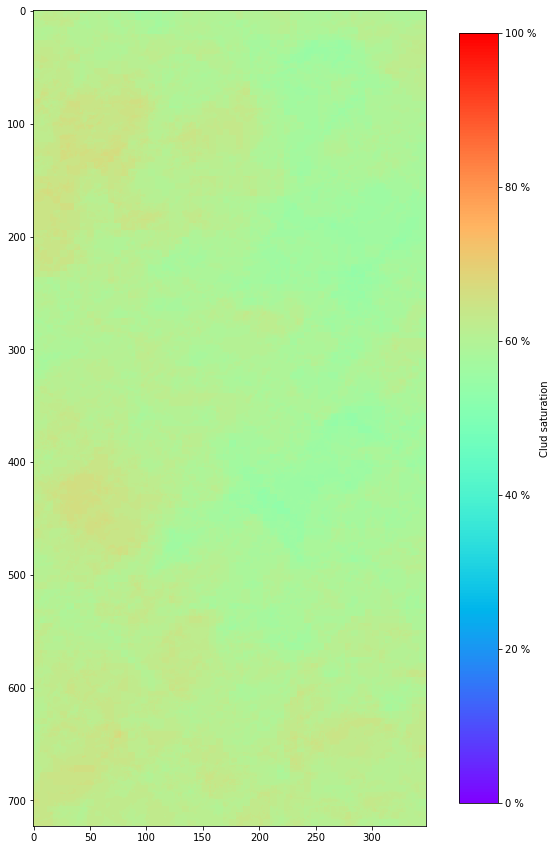

In [8]:
plot_cloud_mask(mask, cmap="rainbow", plot_cmap=True, cmap_frac=0.046)

In [9]:
# Collect sample indices (for the same area)
grayscale = netherlands_cloud.get_full_index_timeseries("MOISTURE-GRAYSCALE2")
ndvi = netherlands_cloud.get_full_index_timeseries("NDVI-GREEN-GRAYSCALE")

In [10]:
# Layers from geopedia that currently work (Also see CloudSaturation.py)
# layers = {'tulip_field_2016':'ttl1904', 'tulip_field_2017':'ttl1905', 'arable_land_2017':'ttl1917'}

# Get dataseries for same region (to reuse cloud data)
field, mask_t, nonzero = cloud_sat.get_tulip_mask("tulip_field_2016")
field_full, mask_full_t, nonzero_full = netherlands_cloud.get_tulip_mask("tulip_field_2016")
# Nonzero contains nonzero indices (tulips ARE on such index), see later code for correst indexing

Downloaded from http://service.geopedia.world/wms/ml_aws?service=WMS&request=GetMap&styles=&format=image%2Fpng&transparent=false&version=1.1.1&layers=ttl1904&height=723&width=348&srs=EPSG:3857&bbox=1593507.588377559,5775409.533498381,1598516.9654632562,5785826.144595303
Downloaded from http://service.geopedia.world/wms/ml_aws?service=WMS&request=GetMap&styles=&format=image%2Fpng&transparent=false&version=1.1.1&layers=ttl1904&height=1180&width=1180&srs=EPSG:3857&bbox=521505.8046283378,6950880.890877021,541073.6838693421,6970448.770118027


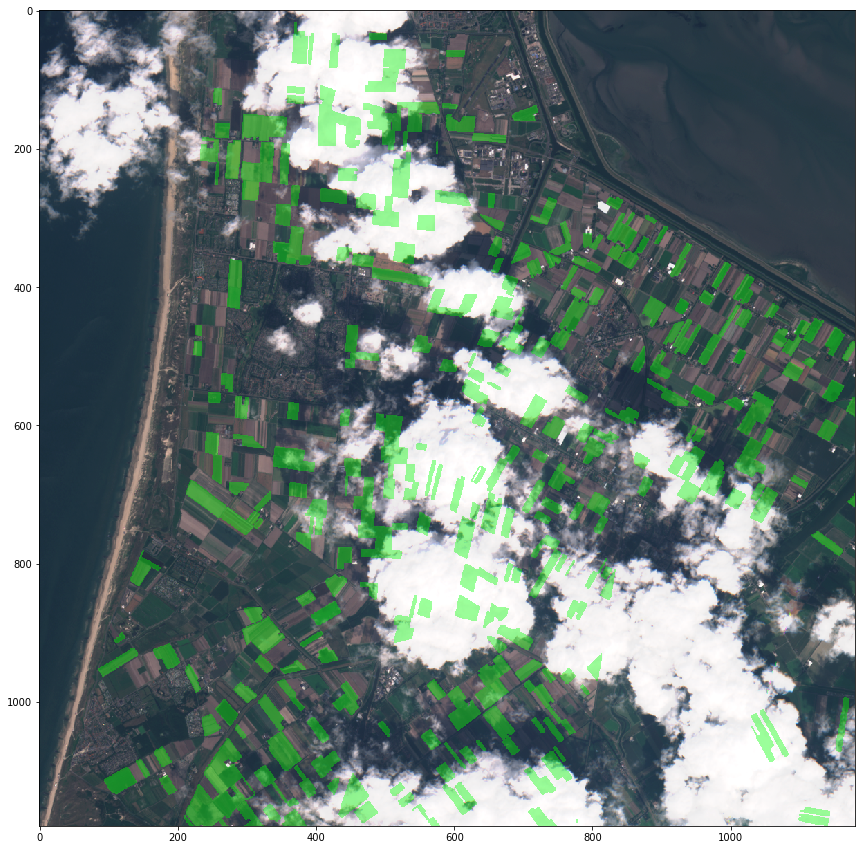

In [11]:
# If mask_maps is not None, for every image in images, each is overlayed with different color
overlay_cloud_mask(true_c_full[1], [mask_full_t], mask_maps = [[0, 255, 0]])

In [12]:
from sklearn.model_selection import train_test_split

In [13]:
def split_train_test_cv(data, train_p=0.5, cv_p=0.5, shuffle=None, state=None):
    if shuffle is 0:
        print("Probably not what you want")
    train, test = train_test_split(data, train_size=train_p, shuffle=shuffle, random_state=state)
    cv, test = train_test_split(test, train_size=cv_p, shuffle=shuffle, random_state=state)
    return train, cv, test

/Users/markbogataj/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_split.py:2026: FutureWarning: From version 0.21, test_size will always complement train_size unless both are specified.
  FutureWarning)


84221
42110
42111


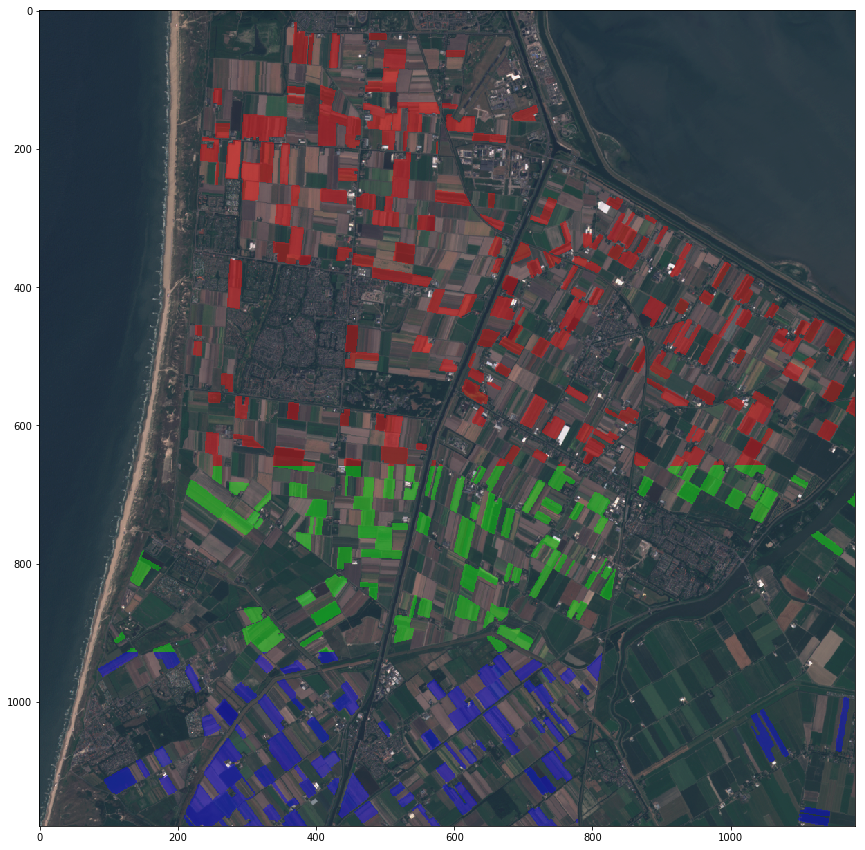

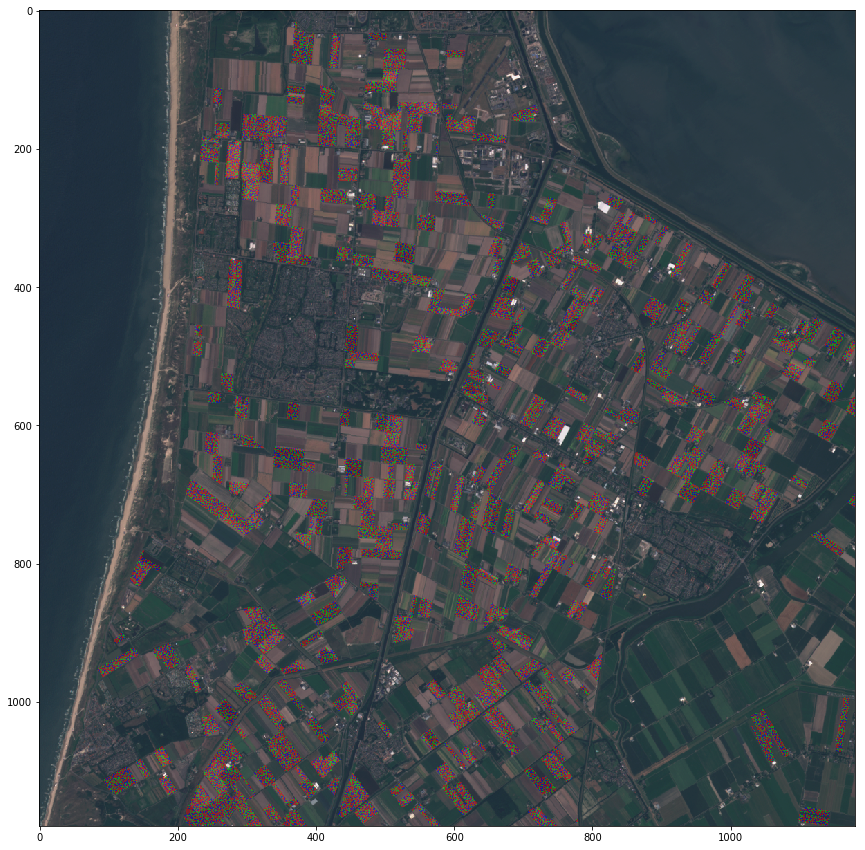

In [14]:
train, cv, test = split_train_test_cv(nonzero_full, shuffle=False)
overlay_cloud_mask(true_c_full[0], [train, cv, test], mask_maps = [[255, 0, 0, 100], [0,255,0], [0,0,255]])
train, cv, test = split_train_test_cv(nonzero_full, shuffle=1)
overlay_cloud_mask(true_c_full[0], [train, cv, test], mask_maps = [[255, 0, 0, 100], [0,255,0], [0,0,255]])
print(len(train))
print(len(cv))
print(len(test))

In [34]:
#
len(true_c_full)

120

In [35]:
#
len(true_c_full[0])

1180

In [36]:
#
len(true_c_full[0][0])

1180

In [60]:
#RGB barve
len(true_c_full[0][0][0])

3

In [102]:
#Izpiše vrednosti maske, na podlagi katere se potem sklepa ali je posamezen piksel tulipan ali ne 
#Število elementov 168442
#np.savetxt('tabelca', mask_full) -> da shranimo vrednosti tabele mask_full v txt datotekoc + deluje le za 1D tabele
array = []
for x in range (0, len(mask_full_t)):
    for y in range (0, len(mask_full_t[x])):
        if(mask_full_t[x][y] == 1):
            print(mask_full[x][y])

0.7142857142857143
0.7142857142857143
0.7232142857142857
0.7142857142857143
0.7142857142857143
0.7142857142857143
0.7232142857142857
0.7142857142857143
0.7142857142857143
0.7142857142857143
0.7232142857142857
0.7142857142857143
0.7142857142857143
0.7142857142857143
0.7232142857142857
0.7142857142857143
0.7142857142857143
0.7142857142857143
0.7232142857142857
0.7142857142857143
0.7142857142857143
0.7142857142857143
0.7142857142857143
0.7207207207207207
0.7142857142857143
0.7142857142857143
0.7079646017699115
0.7142857142857143
0.7142857142857143
0.7142857142857143
0.7142857142857143
0.7142857142857143
0.7142857142857143
0.7142857142857143
0.7142857142857143
0.7142857142857143
0.7142857142857143
0.7142857142857143
0.7142857142857143
0.7142857142857143
0.7142857142857143
0.7142857142857143
0.7142857142857143
0.7053571428571429
0.6991150442477876
0.6991150442477876
0.7079646017699115
0.6991150442477876
0.6991150442477876
0.6991150442477876
0.7079646017699115
0.6991150442477876
0.6991150442

0.7105263157894737
0.7105263157894737
0.6991150442477876
0.6991150442477876
0.7053571428571429
0.6991150442477876
0.6991150442477876
0.6929824561403509
0.6929824561403509
0.6929824561403509
0.6929824561403509
0.7522123893805309
0.7522123893805309
0.7522123893805309
0.7522123893805309
0.7522123893805309
0.7522123893805309
0.7522123893805309
0.7522123893805309
0.7522123893805309
0.7522123893805309
0.7610619469026548
0.7610619469026548
0.7610619469026548
0.7610619469026548
0.7610619469026548
0.7678571428571429
0.7589285714285714
0.7589285714285714
0.7589285714285714
0.7589285714285714
0.7589285714285714
0.75
0.75
0.7433628318584071
0.7368421052631579
0.7433628318584071
0.7433628318584071
0.7168141592920354
0.7168141592920354
0.7168141592920354
0.7168141592920354
0.6991150442477876
0.6991150442477876
0.6991150442477876
0.6991150442477876
0.6929824561403509
0.6929824561403509
0.6929824561403509
0.6929824561403509
0.7522123893805309
0.7522123893805309
0.7522123893805309
0.7522123893805309
0.

0.7391304347826086
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7433628318584071
0.7433628318584071
0.7522123893805309
0.7522123893805309
0.7522123893805309
0.7522123893805309
0.7522123893805309
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7433628318584071
0.7256637168141593
0.7256637168141593
0.7192982456140351
0.7192982456140351
0.7192982456140351
0.7105263157894737
0.7105263157894737
0.7105263157894737
0.7168141592

0.7256637168141593
0.7256637168141593
0.7256637168141593
0.7192982456140351
0.7192982456140351
0.7256637168141593
0.7256637168141593
0.7256637168141593
0.7345132743362832
0.7345132743362832
0.7345132743362832
0.7345132743362832
0.7256637168141593
0.7256637168141593
0.7256637168141593
0.7256637168141593
0.7256637168141593
0.7256637168141593
0.7345132743362832
0.7280701754385965
0.7280701754385965
0.7345132743362832
0.7345132743362832
0.7345132743362832
0.7699115044247787
0.7699115044247787
0.7699115044247787
0.7699115044247787
0.7699115044247787
0.7699115044247787
0.7699115044247787
0.7699115044247787
0.7699115044247787
0.7699115044247787
0.7699115044247787
0.7699115044247787
0.7699115044247787
0.7699115044247787
0.7699115044247787
0.7699115044247787
0.7699115044247787
0.7699115044247787
0.7787610619469026
0.7787610619469026
0.7787610619469026
0.7787610619469026
0.7787610619469026
0.7787610619469026
0.7787610619469026
0.7787610619469026
0.7787610619469026
0.7787610619469026
0.7719298245

0.7678571428571429
0.7747747747747747
0.7747747747747747
0.7747747747747747
0.7747747747747747
0.7678571428571429
0.7678571428571429
0.7678571428571429
0.7678571428571429
0.7678571428571429
0.7678571428571429
0.7767857142857143
0.7767857142857143
0.7767857142857143
0.7767857142857143
0.7699115044247787
0.7699115044247787
0.7699115044247787
0.7631578947368421
0.7631578947368421
0.7631578947368421
0.7699115044247787
0.7631578947368421
0.7631578947368421
0.7699115044247787
0.7767857142857143
0.7767857142857143
0.7767857142857143
0.7767857142857143
0.7699115044247787
0.7699115044247787
0.7699115044247787
0.7699115044247787
0.7631578947368421
0.7631578947368421
0.7631578947368421
0.7631578947368421
0.7631578947368421
0.7631578947368421
0.7631578947368421
0.7631578947368421
0.7345132743362832
0.7345132743362832
0.7345132743362832
0.7345132743362832
0.75
0.7433628318584071
0.7433628318584071
0.7678571428571429
0.7678571428571429
0.7747747747747747
0.7747747747747747
0.7747747747747747
0.76785

0.7456140350877193
0.7522123893805309
0.7522123893805309
0.7522123893805309
0.7522123893805309
0.7522123893805309
0.7522123893805309
0.7522123893805309
0.7522123893805309
0.7522123893805309
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7345132743362832
0.7345132743362832
0.7345132743362832
0.7345132743362832
0.7345132743362832
0.7280701754385965
0.7280701754385965
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7192982456140351
0.7192982456140351
0.7391304347826086
0.7391304347826086
0.7456140350877193
0.7522123893805309
0.7522123893805309
0.7522123893805309
0.7522123893805309
0.7522123893805309
0.7522123893805309
0.7522123893805309
0.7522123893805309
0.7456140350877193
0.7456140350877193
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7345132743

0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7631578947368421
0.7565217391304347
0.7631578947368421
0.7631578947368421
0.7631578947368421
0.7631578947368421
0.7631578947368421
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7631578947368421
0.7631578947368421
0.7631578947368421
0.7631578947368421
0.7631578947368421
0.7631578947368421
0.7631578947368421
0.7631578947368421
0.7631578947368421
0.7631578947368421
0.7631578947368421
0.7631578947368421
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7543859649122807
0.7456140350877193
0.7192982456140351
0.7192982456140351
0.7192982456140351
0.7192982456

0.7433628318584071
0.7433628318584071
0.7433628318584071
0.7433628318584071
0.7433628318584071
0.7433628318584071
0.7368421052631579
0.7304347826086957
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7543859649122807
0.7543859649122807
0.7543859649122807
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7565217391304347
0.7565217391304347
0.7631578947368421
0.7631578947368421
0.7631578947368421
0.7631578947368421
0.7631578947368421
0.7631578947368421
0.7631578947368421
0.7631578947368421
0.7631578947368421
0.7631578947368421
0.7631578947368421
0.7565217391304347
0.7631578947368421
0.7631578947368421
0.7631578947368421
0.7631578947368421
0.7631578947368421
0.7631578947368421
0.7631578947368421
0.7631578947368421
0.7631578947368421
0.7631578947

0.7017543859649122
0.7017543859649122
0.7017543859649122
0.7017543859649122
0.7017543859649122
0.7017543859649122
0.7017543859649122
0.7017543859649122
0.7017543859649122
0.7105263157894737
0.7105263157894737
0.7105263157894737
0.7105263157894737
0.7105263157894737
0.7105263157894737
0.7192982456140351
0.7192982456140351
0.7192982456140351
0.7192982456140351
0.7192982456140351
0.7192982456140351
0.7105263157894737
0.7105263157894737
0.7105263157894737
0.7105263157894737
0.7105263157894737
0.7105263157894737
0.7168141592920354
0.7168141592920354
0.7168141592920354
0.7168141592920354
0.7522123893805309
0.7522123893805309
0.7433628318584071
0.7433628318584071
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7543859649122807
0.7543859649

0.6991150442477876
0.7079646017699115
0.7079646017699115
0.7079646017699115
0.7017543859649122
0.7017543859649122
0.7017543859649122
0.7105263157894737
0.7105263157894737
0.7105263157894737
0.7105263157894737
0.7105263157894737
0.7105263157894737
0.7105263157894737
0.7105263157894737
0.7105263157894737
0.7105263157894737
0.7105263157894737
0.7105263157894737
0.7192982456140351
0.7192982456140351
0.7192982456140351
0.7192982456140351
0.7192982456140351
0.7192982456140351
0.7105263157894737
0.7105263157894737
0.7168141592920354
0.7168141592920354
0.7168141592920354
0.7168141592920354
0.7256637168141593
0.7256637168141593
0.7256637168141593
0.7256637168141593
0.7256637168141593
0.7256637168141593
0.7256637168141593
0.7256637168141593
0.7256637168141593
0.7256637168141593
0.7256637168141593
0.7256637168141593
0.7168141592920354
0.7168141592920354
0.7168141592920354
0.7168141592920354
0.7168141592920354
0.7168141592920354
0.7168141592920354
0.7543859649122807
0.7543859649122807
0.7543859649

0.7105263157894737
0.7105263157894737
0.7105263157894737
0.7168141592920354
0.7256637168141593
0.7256637168141593
0.7256637168141593
0.7256637168141593
0.7256637168141593
0.7256637168141593
0.7256637168141593
0.7321428571428571
0.7321428571428571
0.7321428571428571
0.7321428571428571
0.7321428571428571
0.7232142857142857
0.7232142857142857
0.7232142857142857
0.7232142857142857
0.7232142857142857
0.7168141592920354
0.7232142857142857
0.7232142857142857
0.7232142857142857
0.7232142857142857
0.7105263157894737
0.7105263157894737
0.7168141592920354
0.7168141592920354
0.7168141592920354
0.7168141592920354
0.7610619469026548
0.7543859649122807
0.7543859649122807
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7522123893805309
0.7522123893805309
0.7433628318584071
0.7433628318584071
0.7433628318584071
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7456140350

0.7017543859649122
0.7017543859649122
0.7017543859649122
0.7017543859649122
0.7105263157894737
0.7105263157894737
0.7105263157894737
0.7105263157894737
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7345132743362832
0.7345132743362832
0.7433628318584071
0.7433628318584071
0.7433628318584071
0.7433628318584071
0.7433628318584071
0.7433628318584071
0.7610619469026548
0.7610619469026548
0.7610619469026548
0.7610619469026548
0.7610619469026548
0.7610619469026548
0.7433628318584071
0.7433628318584071
0.7433628318584071
0.7433628318584071
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7433628318584071
0.7610619469026548
0.7678571428571429
0.7678571428571429
0.7610619469026548
0.7610619469026548
0.7522123893805309
0.7522123893805309
0.7522123893805309
0.7522123893805309
0.7456140350877193
0.7456140350877193
0.7543859649122807
0.7610619469026548
0.7543859649122807
0.7478260869

0.7168141592920354
0.7168141592920354
0.7168141592920354
0.7168141592920354
0.7168141592920354
0.7168141592920354
0.7256637168141593
0.7256637168141593
0.7256637168141593
0.7256637168141593
0.7256637168141593
0.7256637168141593
0.7168141592920354
0.7105263157894737
0.7105263157894737
0.7105263157894737
0.7105263157894737
0.7105263157894737
0.7105263157894737
0.7105263157894737
0.7105263157894737
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7368421052631579
0.7368421052631579
0.7433628318584071
0.7433628318584071
0.7433628318584071
0.7433628318584071
0.7433628318584071
0.7433628318584071
0.7433628318584071
0.7433628318584071
0.7433628318584071
0.7433628318584071
0.7433628318584071
0.7433628318584071
0.7433628318584071
0.7433628318584071
0.7433628318584071
0.7433628318584071
0.7522123893805309
0.7522123893805309
0.7522123893805309
0.7522123893805309
0.7522123893805309
0.7589285714285714
0.7589285714285714
0.7589285714

0.7368421052631579
0.7433628318584071
0.7368421052631579
0.7433628318584071
0.7433628318584071
0.7433628318584071
0.7433628318584071
0.7433628318584071
0.7368421052631579
0.7433628318584071
0.7433628318584071
0.7368421052631579
0.7433628318584071
0.7433628318584071
0.7522123893805309
0.7522123893805309
0.7522123893805309
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7522123893805309
0.7522123893805309
0.7522123893805309
0.7522123893805309
0.7610619469026548
0.7610619469026548
0.7543859649122807
0.7543859649122807
0.7543859649122807
0.7543859649122807
0.7456140350877193
0.7522123893805309
0.7522123893805309
0.7456140350877193
0.7456140350877193
0.7391304347826086
0.7565217391304347
0.7543859649122807
0.7543859649122807
0.7543859649122807
0.7543859649122807
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7543859649122807
0.7543859649122807
0.7543859649122807
0.7543859649122807
0.7543859649122807
0.7543859649122807
0.7543859649122807
0.7631578947

0.7391304347826086
0.7456140350877193
0.7456140350877193
0.7522123893805309
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7130434782608696
0.7130434782608696
0.7130434782608696
0.7130434782608696
0.7130434782608696
0.7130434782608696
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7130434782608696
0.7130434782608696
0.7130434782608696
0.7130434782608696
0.7130434782608696
0.7130434782

0.7631578947368421
0.7631578947368421
0.7631578947368421
0.7631578947368421
0.7631578947368421
0.7699115044247787
0.7787610619469026
0.7787610619469026
0.7787610619469026
0.7787610619469026
0.7787610619469026
0.7787610619469026
0.7787610619469026
0.7787610619469026
0.7787610619469026
0.7787610619469026
0.7787610619469026
0.7699115044247787
0.7699115044247787
0.7699115044247787
0.7699115044247787
0.7699115044247787
0.7699115044247787
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7433628318584071
0.7433628318584071
0.75
0.75
0.75
0.75
0.75
0.7410714285714286
0.7345132743362832
0.7345132743362832
0.7345132743362832
0.7345132743362832
0.7345132743362832
0.7345

0.7345132743362832
0.7345132743362832
0.7345132743362832
0.7256637168141593
0.7256637168141593
0.7256637168141593
0.7256637168141593
0.7256637168141593
0.7256637168141593
0.7256637168141593
0.7256637168141593
0.7345132743362832
0.7345132743362832
0.7345132743362832
0.7345132743362832
0.7345132743362832
0.7345132743362832
0.7345132743362832
0.7345132743362832
0.7345132743362832
0.7105263157894737
0.7105263157894737
0.7105263157894737
0.7105263157894737
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7368421052631579
0.7345132743362832
0.7345132743362832
0.7345132743362832
0.7345132743362832
0.7345132743362832
0.7433628318584071
0.7433628318584071
0.7368421052631579
0.7368421052631579
0.7433628318584071
0.7433628318584071
0.7345132743362832
0.7345132743362832
0.7345132743362832
0.7345132743362832
0.7345132743362832
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7345132743362832
0.7345132743362832
0.7345132743

0.7433628318584071
0.7433628318584071
0.7433628318584071
0.7433628318584071
0.7433628318584071
0.7433628318584071
0.7522123893805309
0.7522123893805309
0.7522123893805309
0.7522123893805309
0.7522123893805309
0.7522123893805309
0.7610619469026548
0.7610619469026548
0.7456140350877193
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7433628318584071
0.7433628318584071
0.7433628318584071
0.7433628318584071
0.7256637168141593
0.7256637168141593
0.7256637168141593
0.7345132743362832
0.7345132743362832
0.7345132743362832
0.7433628318584071
0.7433628318584071
0.7433628318584071
0.7433628318584071
0.7433628318584071
0.7433628318584071
0.7433628318584071
0.7433628318584071
0.7433628318584071
0.7433628318584071
0.7433628318584071
0.7345132743362832
0.7345132743362832
0.7345132743362832
0.7345132743362832
0.7345132743362832
0.7345132743362832
0.7345132743362832
0.7345132743362832
0.7345132743362832
0.7345132743362832
0.7345132743

0.7610619469026548
0.7610619469026548
0.7543859649122807
0.7543859649122807
0.7543859649122807
0.7217391304347827
0.7217391304347827
0.7304347826086957
0.7522123893805309
0.7522123893805309
0.7522123893805309
0.7522123893805309
0.7522123893805309
0.7522123893805309
0.7522123893805309
0.7522123893805309
0.7522123893805309
0.7767857142857143
0.7767857142857143
0.7767857142857143
0.7767857142857143
0.7767857142857143
0.7767857142857143
0.7767857142857143
0.7767857142857143
0.7699115044247787
0.7699115044247787
0.7767857142857143
0.7699115044247787
0.75
0.75
0.75
0.7433628318584071
0.7433628318584071
0.7433628318584071
0.7345132743362832
0.7345132743362832
0.7345132743362832
0.7345132743362832
0.7345132743362832
0.7345132743362832
0.7280701754385965
0.7280701754385965
0.7345132743362832
0.7345132743362832
0.7433628318584071
0.7433628318584071
0.75
0.7589285714285714
0.7589285714285714
0.7589285714285714
0.7589285714285714
0.7522123893805309
0.7522123893805309
0.7543859649122807
0.754385964

0.7610619469026548
0.7610619469026548
0.7610619469026548
0.7610619469026548
0.7610619469026548
0.7610619469026548
0.7610619469026548
0.7522123893805309
0.7522123893805309
0.7522123893805309
0.7522123893805309
0.7433628318584071
0.7433628318584071
0.7433628318584071
0.7433628318584071
0.7433628318584071
0.7433628318584071
0.7522123893805309
0.7522123893805309
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7192982456140351
0.7192982456140351
0.7280701754385965
0.7345132743362832
0.7433628318584071
0.7433628318584071
0.7433628318584071
0.7433628318584071
0.7433628318584071
0.7433628318584071
0.75
0.75
0.75
0.75
0.75
0.75
0.7767857142857143
0.7767857142857143
0.7767857142857143
0.7767857142857143
0.7767857142857143
0.7767857142857143
0.7857142857142857
0.7857142857142857
0.7857142857142857
0.7857142857142857
0.7857142857142857
0.7857142857142857
0.7857142857142857
0.7678571428571429
0

0.7456140350877193
0.7192982456140351
0.7192982456140351
0.7280701754385965
0.7217391304347827
0.7217391304347827
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7304347826086957
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7433628318584071
0.75
0.75
0.75
0.75
0.7433628318584071
0.7433628318584071
0.7433628318584071
0.7433628318584071
0.7522123893805309
0.7522123893805309
0.7522123893805309
0.7522123893805309
0.7522123893805309
0.7857142857142857
0.7857142857142857
0.7857142857142857
0.7787610619469026
0.7787610619469026
0.7787610619469026
0.7699115044247787
0.7699115044247787
0.7699115044247787
0.7699115044247787
0.7699115044247787
0.7699115044247787
0.7610619469026548
0.7610619469026548
0.7610619469026548
0.7522123893805309
0.7522123893805309
0.7522123893805309
0.7522123893805309
0.7522123893805309
0.7522123893805309
0.7522123893805309
0.7522123893805309
0.7522123893805309
0.7522123893805309
0.7522123893805309
0.752212389

0.7456140350877193
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7345132743362832
0.7433628318584071
0.7368421052631579
0.7433628318584071
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7433628318584071
0.7433628318

0.7105263157894737
0.7105263157894737
0.7105263157894737
0.7217391304347827
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7105263157894737
0.7105263157894737
0.7105263157894737
0.7105263157894737
0.7105263157894737
0.7105263157894737
0.7105263157894737
0.7105263157894737
0.7105263157894737
0.7105263157894737
0.7105263157894737
0.7105263157894737
0.7017543859649122
0.7017543859649122
0.7345132743362832
0.7345132743362832
0.7345132743362832
0.7256637168141593
0.7256637168141593
0.7345132743362832
0.7433628318584071
0.7433628318584071
0.7433628318584071
0.7433628318584071
0.7433628318584071
0.7433628318584071
0.7433628318584071
0.7433628318584071
0.7433628318584071
0.7433628318584071
0.7433628318584071
0.7433628318584071
0.7345132743362832
0.7345132743362832
0.7345132743362832
0.7345132743362832
0.7345132743362832
0.7345132743362832
0.7433628318584071
0.7368421052

0.7105263157894737
0.7105263157894737
0.7105263157894737
0.7105263157894737
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7456140350877193
0.7280701754385965
0.7345132743362832
0.7345132743362832
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7217391304347827
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7345132743362832
0.7192982456140351
0.7192982456140351
0.7192982456140351
0.7192982456140351
0.7192982456140351
0.7192982456140351
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7280701754

0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7192982456140351
0.7105263157894737
0.7105263157894737
0.7105263157894737
0.7105263157894737
0.7105263157894737
0.7105263157894737
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7105263157894737
0.7105263157894737
0.7105263157894737
0.7105263157894737
0.7105263157894737
0.7105263157894737
0.7017543859649122
0.7017543859649122
0.6956521739130435
0.6956521739130435
0.6956521739130435
0.6956521739130435
0.6869565217391305
0.6869565217391305
0.6869565217391305
0.6869565217391305
0.6869565217391305
0.6869565217391305
0.6956521739130435
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7304347826086957
0.7304347826086957
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052

0.7280701754385965
0.7280701754385965
0.7217391304347827
0.7217391304347827
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7345132743362832
0.7345132743362832
0.7256637168141593
0.7256637168141593
0.7256637168141593
0.7256637168141593
0.7256637168141593
0.7256637168141593
0.7079646017699115
0.7079646017699115
0.7079646017699115
0.7017543859649122
0.7017543859649122
0.7017543859649122
0.7017543859649122
0.7017543859649122
0.7017543859649122
0.7017543859649122
0.7017543859649122
0.7017543859649122
0.7168141592920354
0.7168141592920354
0.7477477477477478
0.7477477477477478
0.7477477477477478
0.7477477477477478
0.7477477477477478
0.7410714285714286
0.7345132743362832
0.7345132743362832
0.7345132743362832
0.7410714285714286
0.7130434782608696
0.7130434782608696
0.7130434782

0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7280701754385965
0.7280701754385965
0.7345132743362832
0.7433628318584071
0.7433628318584071
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7543859649122807
0.7543859649122807
0.7543859649122807
0.7543859649122807
0.7543859649122807
0.7543859649122807
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7543859649122807
0.7543859649122807
0.7543859649122807
0.7543859649122807
0.7543859649122807
0.7543859649122807
0.7543859649

0.7280701754385965
0.7280701754385965
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7217391304

0.7321428571428571
0.7321428571428571
0.7256637168141593
0.7256637168141593
0.7192982456140351
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7304347826086957
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7304347826086957
0.7368421052631579
0.7304347826086957
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7478260869565218
0.7478260869565218
0.7105263157894737
0.7105263157894737
0.7105263157894737
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7456140350

0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7543859649122807
0.7543859649122807
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7345132743362832
0.7345132743362832
0.7345132743362832
0.7345132743362832
0.6991150442477876
0.6991150442477876
0.6929824561403509
0.6929824561403509
0.6929824561403509
0.6929824561403509
0.6929824561403509
0.6929824561403509
0.6929824561403509
0.6929824561403509
0.6929824561403509
0.6929824561403509
0.7105263157894737
0.7105263157

0.7280701754385965
0.7280701754385965
0.7345132743362832
0.7345132743362832
0.7345132743362832
0.7345132743362832
0.7345132743362832
0.7345132743362832
0.7345132743362832
0.7345132743362832
0.7345132743362832
0.7345132743362832
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7456140350877193
0.7079646017699115
0.7079646017699115
0.7079646017699115
0.7079646017699115
0.6902654867256637
0.6842105263157895
0.6842105263157895
0.6842105263157895
0.6842105263157895
0.6842105263157895
0.6842105263157895
0.6842105263157895
0.6842105263157895
0.6902654867256637
0.6902654867256637
0.6902654867256637
0.7017543859649122
0.7017543859649122
0.7017543859649122
0.7017543859649122
0.7017543859649122
0.7017543859649122
0.7017543859649122
0.7017543859649122
0.7017543859649122
0.7017543859649122
0.7017543859649122
0.7017543859649122
0.7433628318584071
0.7433628318584071
0.7433628318584071
0.7345132743362832
0.7345132743362832
0.7345132743362832
0.7345132743362832
0.7345132743362832
0.7345132743

0.7345132743362832
0.7345132743362832
0.7192982456140351
0.7256637168141593
0.7192982456140351
0.7456140350877193
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7368421052631579
0.7368421052631579
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7543859649122807
0.7543859649122807
0.7543859649122807
0.7543859649122807
0.7543859649122807
0.7543859649122807
0.7543859649122807
0.7543859649122807
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347

0.7543859649122807
0.7543859649122807
0.7543859649122807
0.7543859649122807
0.7543859649122807
0.7543859649122807
0.7433628318584071
0.7433628318584071
0.7433628318584071
0.7631578947368421
0.7631578947368421
0.7699115044247787
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7631578947368421
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7433628318584071
0.7433628318584071
0.7433628318584071
0.7433628318584071
0.7433628318584071
0.7433628318584071
0.7433628318584071
0.7433628318584071
0.7433628318584071
0.7433628318584071
0.7433628318584071
0.7368421052631579
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7522123893805309
0.7522123893805309
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7456140350

0.7543859649122807
0.7543859649122807
0.7543859649122807
0.7543859649122807
0.7543859649122807
0.7543859649122807
0.7543859649122807
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7368421052631579
0.7280701754385965
0.7217391304347827
0.7217391304347827
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7368421052631579
0.7368421052631579
0.7391304347826086
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7610619469026548
0.7610619469026548
0.7610619469026548
0.7610619469026548
0.7610619469026548
0.7787610619469026
0.7787610619469026
0.7787610619469026
0.7787610619469026
0.7787610619469026
0.7719298245614035
0.7543859649122807
0.7543859649122807
0.7543859649122807
0.7543859649122807
0.7543859649122807
0.7543859649122807
0.7543859649122807
0.7543859649122807
0.7543859649122807
0.7543859649122807
0.7610619469026548
0.7610619469026548
0.7787610619469026
0.7787610619469026
0.7787610619469026
0.7719298245614035
0.7719298245

0.7631578947368421
0.7631578947368421
0.7631578947368421
0.7543859649122807
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7807017543859649
0.7739130434782608
0.7652173913043478
0.7652173913043478
0.7652173913043478
0.7652173913043478
0.7652173913043478
0.7652173913043478
0.7652173913043478
0.7652173913043478
0.7652173913043478
0.7652173913043478
0.7652173913043478
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7192982456140351
0.7192982456

0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7478260869565218
0.7478260869565218
0.7543859649122807
0.7543859649122807
0.7543859649122807
0.7543859649122807
0.7565217391304347
0.7631578947368421
0.7631578947368421
0.7631578947368421
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7631578947368421
0.7433628318584071
0.7433628318584071
0.75
0.75
0.75
0.75
0.7433628318584071
0.7433628318584071
0.75
0.75
0.75
0.75
0.75
0.75
0.7368421052631579
0.7368421052631579
0.7433628318584071
0.7130434782608696
0.7130434782608696
0.7130434782608696
0.7192982456140351
0.7192982456140351
0.7192982456140351
0.7256637168141593
0.7256637168141593
0.7256637168141593
0.7256637168141593
0.7168141592920354
0.7168141592920354
0.7168141592920354
0.7168141592920354
0.7168141592920354
0.7168141592920354


0.7565217391304347
0.7565217391304347
0.7631578947368421
0.7631578947368421
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7433628318584071
0.7433628318584071
0.7368421052631579
0.7433628318584071
0.7433628318584071
0.7433628318584071
0.7433628318584071
0.7433628318584071
0.7433628318584071
0.75
0.75
0.75
0.7567567567567568
0.7567567567567568
0.75
0.75
0.7410714285714286
0.7192982456140351
0.7192982456140351
0.7192982456140351
0.7192982456140351
0.7192982456140351
0.7192982456140351
0.7105263157894737
0.7168141592920354
0.7168141592920354
0.7168141592920354
0.7168

0.7456140350877193
0.7543859649122807
0.7543859649122807
0.7543859649122807
0.7543859649122807
0.7543859649122807
0.7543859649122807
0.7631578947368421
0.7631578947368421
0.7631578947368421
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7631578947368421
0.7631578947368421
0.7631578947368421
0.7522123893805309
0.7522123893805309
0.7522123893805309
0.7522123893805309
0.7522123893805309
0.7610619469026548
0.7678571428571429
0.7678571428571429
0.7678571428571429
0.7678571428571429
0.7678571428571429
0.7477477477477478
0.7477477477

0.7631578947368421
0.7631578947368421
0.7631578947368421
0.7631578947368421
0.7631578947368421
0.7807017543859649
0.7807017543859649
0.7807017543859649
0.7807017543859649
0.7807017543859649
0.7807017543859649
0.7631578947368421
0.7631578947368421
0.7631578947368421
0.7631578947368421
0.7631578947368421
0.7631578947368421
0.7543859649122807
0.7543859649122807
0.7543859649122807
0.7256637168141593
0.7256637168141593
0.7256637168141593
0.7256637168141593
0.7168141592920354
0.7168141592920354
0.7168141592920354
0.7232142857142857
0.7232142857142857
0.7982456140350878
0.7982456140350878
0.7982456140350878
0.7982456140350878
0.8070175438596491
0.8070175438596491
0.8070175438596491
0.8070175438596491
0.8
0.8
0.8070175438596491
0.8070175438596491
0.8070175438596491
0.8070175438596491
0.8070175438596491
0.8070175438596491
0.8070175438596491
0.8
0.8
0.8
0.8
0.8
0.808695652173913
0.808695652173913
0.808695652173913
0.808695652173913
0.808695652173913
0.8157894736842105
0.8157894736842105
0.808695

0.7304347826086957
0.7982456140350878
0.7982456140350878
0.8070175438596491
0.8070175438596491
0.8070175438596491
0.8070175438596491
0.8
0.8
0.8
0.8
0.8
0.8
0.8
0.8
0.8
0.8
0.8
0.8
0.8
0.8
0.808695652173913
0.808695652173913
0.8157894736842105
0.808695652173913
0.808695652173913
0.808695652173913
0.8157894736842105
0.808695652173913
0.7982456140350878
0.7913043478260869
0.7913043478260869
0.7982456140350878
0.7982456140350878
0.7982456140350878
0.8070175438596491
0.8
0.8070175438596491
0.8070175438596491
0.8070175438596491
0.8070175438596491
0.7964601769911505
0.7894736842105263
0.7964601769911505
0.7456140350877193
0.7456140350877193
0.7543859649122807
0.7543859649122807
0.7478260869565218
0.7543859649122807
0.7543859649122807
0.7478260869565218
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7304347826086957
0.7368421052631579
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7543859649122807
0.7543859649122807
0.7543859649122807
0.7543859649122807
0.7543859649122

0.7391304347826086
0.7391304347826086
0.7456140350877193
0.7391304347826086
0.7610619469026548
0.7610619469026548
0.7610619469026548
0.7543859649122807
0.7610619469026548
0.7610619469026548
0.7610619469026548
0.7543859649122807
0.7543859649122807
0.7543859649122807
0.7610619469026548
0.7543859649122807
0.7610619469026548
0.7522123893805309
0.7610619469026548
0.7610619469026548
0.7610619469026548
0.7610619469026548
0.7610619469026548
0.7610619469026548
0.7522123893805309
0.7522123893805309
0.7522123893805309
0.7522123893805309
0.7345132743362832
0.7345132743362832
0.7345132743362832
0.7280701754385965
0.7280701754385965
0.7368421052631579
0.7304347826086957
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7631578947368421
0.7631578947368421
0.7631578947368421
0.7631578947368421
0.7391304347826086
0.7391304347826086
0.7543859649122807
0.7543859649

0.7433628318584071
0.7433628318584071
0.7433628318584071
0.7433628318584071
0.7433628318584071
0.7433628318584071
0.7433628318584071
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7280701754385965
0.7105263157894737
0.7168141592920354
0.7168141592920354
0.7168141592920354
0.7168141592920354
0.7043478260869566
0.7280701754385965
0.7105263157894737
0.7105263157894737
0.7168141592920354
0.7105263157894737
0.7105263157894737
0.7105263157894737
0.7256637168141593
0.7256637168141593
0.7192982456140351
0.7130434782608696
0.7130434782608696
0.7130434782608696
0.7217391304347827
0.7168141592920354
0.7168141592920354
0.7105263157894737
0.7192982456140351
0.7192982456140351
0.7192982456140351
0.7192982456140351
0.7192982456140351
0.7256637168141593
0.7256637168141593
0.7256637168141593
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7391304347826086
0.7391304347

0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7478260869565218
0.7413793103448276
0.7478260869565218
0.7543859649122807
0.7543859649122807
0.7543859649122807
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7433628318584071
0.7368421052631579
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7522123893805309
0.7522123893805309
0.7522123893805309
0.7522123893805309
0.7456140350877193
0.7456140350877193
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7631578947368421
0.7631578947368421
0.7631578947368421
0.7631578947368421
0.7631578947368421
0.7631578947368421
0.7631578947368421
0.7964601769911505
0.7964601769911505
0.7699115044247787
0.7699115044247787
0.7699115044247787
0.7631578947368421
0.7631578947368421
0.7631578947368421
0.7543859649122807
0.7610619469

0.7631578947368421
0.7631578947368421
0.7631578947368421
0.7631578947368421
0.7631578947368421
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7433628318584071
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7522123893805309
0.7522123893805309
0.7589285714285714
0.7589285714285714
0.7589285714285714
0.7589285714285714
0.7589285714285714
0.7589285714285714
0.7522123893805309
0.7589285714285714
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7217391304347827
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7217391304347827
0.7280701754385965
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7456140350

0.7368421052631579
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7767857142857143
0.7767857142857143
0.7767857142857143
0.7767857142857143
0.7857142857142857
0.7857142857142857
0.7857142857142857
0.7857142857142857
0.7857142857142857
0.7857142857142857
0.7130434782608696
0.7130434782608696
0.7130434782608696
0.7130434782608696
0.7130434782608696
0.7130434782608696
0.7130434782608696
0.7130434782608696
0.7130434782608696
0.7130434782608696
0.7130434782608696
0.7068965517241379
0.7068965517241379
0.7068965517241379
0.7068965517241379
0.7068965517241379
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7699115044

0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7631578947368421
0.7631578947368421
0.7631578947368421
0.7543859649122807
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7130434782608696
0.7130434782608696
0.7130434782608696
0.7130434782608696
0.7130434782608696
0.7068965517241379
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7699115044247787
0.7699115044247787
0.7699115044247787
0.7699115044247787
0.7699115044247787
0.7699115044247787
0.7699115044247787
0.7631578947368421
0.7631578947368421
0.7631578947368421
0.7631578947368421
0.7631578947368421
0.7631578947368421
0.7631578947

0.7043478260869566
0.7043478260869566
0.7043478260869566
0.7043478260869566
0.7043478260869566
0.7043478260869566
0.7043478260869566
0.7043478260869566
0.7043478260869566
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.75
0.75
0.75
0.75
0.75
0.75
0.75
0.75
0.75
0.75
0.75
0.7565217391304347
0.7586206896551724
0.7652173913043478
0.7652173913043478
0.7652173913043478
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.7699115044247787
0.7699115044247787
0.7699115044247787
0.7699115044247787
0.7699115044247787
0.7699115044247787
0.7699115044247787
0.7699115044247787
0.7699115044247787
0.7631578947368421
0.7631578947368421
0.7631578947368421
0.7631578947368421
0.7631578947368421
0.7631578947368421
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.756521739130

0.7155172413793104
0.7155172413793104
0.7155172413793104
0.7155172413793104
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7155172413793104
0.7155172413793104
0.7155172413793104
0.7155172413793104
0.7155172413793104
0.7155172413793104
0.7699115044247787
0.7699115044247787
0.7610619469026548
0.7610619469026548
0.7610619469026548
0.7610619469026548
0.7610619469026548
0.7610619469026548
0.7522123893805309
0.7522123893805309
0.7522123893805309
0.7522123893805309
0.7478260869565218
0.7543859649122807
0.7610619469026548
0.7787610619469026
0.7787610619469026
0.7719298245614035
0.7787610619469026
0.7787610619469026
0.7719298245614035
0.7699115044247787
0.7699115044247787
0.7699115044247787
0.7699115044247787
0.7699115044247787
0.7192982456140351
0.7192982456140351
0.7130434782608696
0.7130434782608696
0.7130434782

0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7699115044247787
0.7699115044247787
0.7699115044247787
0.7631578947368421
0.7631578947368421
0.7522123893805309
0.7522123893805309
0.7522123893805309
0.7522123893805309
0.7522123893805309
0.7522123893805309
0.7433628318584071
0.7433628318584071
0.7433628318584071
0.7433628318584071
0.7433628318584071
0.7433628318584071
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7456140350877193
0.7522123893805309
0.7522123893805309
0.7522123893805309
0.7522123893805309
0.7522123893805309
0.7217391304347827
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7192982456140351
0.7130434782608696
0.7192982456

0.7652173913043478
0.7652173913043478
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7543859649122807
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7543859649122807
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7217391304347827
0.7043478260869566
0.7043478260869566
0.7043478260869566
0.7043478260869566
0.6982758620689655
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7241379310

0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7217391304347827
0.7217391304347827
0.7155172413793104
0.7068965517241379
0.7068965517241379
0.7068965517241379
0.7068965517241379
0.7068965517241379
0.7068965517241379
0.7068965517241379
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7241379310

0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7304347826086957
0.7304347826086957
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7217391304347827
0.7217391304347827
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7456140350877193
0.7456140350877193
0.7522123893805309
0.6982758620689655
0.6982758620689655
0.7043478260869566
0.7043478260869566
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.75
0.75
0.75
0.75
0.75
0.75
0.75
0.75
0.75
0.75
0.75
0.7413793103448276
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.741379310344

0.6956521739130435
0.6956521739130435
0.6956521739130435
0.7217391304347827
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7478260869565218
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7217391304347827
0.7217391304

0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7327586206896551
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7241379310344828
0.7241379310344828
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7304347826086957
0.7280701754385965
0.7280701754385965
0.7130434782608696
0.7192982456140351
0.7192982456140351
0.7256637168141593
0.7256637168141593
0.7256637168141593
0.7256637168141593
0.7256637168141593
0.7256637168141593
0.7256637168141593
0.7256637168141593
0.7256637168141593
0.7256637168141593
0.75
0.75
0.75
0.75
0.75
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.7844827586206896
0.7844

0.7586206896551724
0.75
0.75
0.75
0.75
0.75
0.75
0.75
0.75
0.75
0.75
0.75
0.75
0.75
0.75
0.75
0.75
0.75
0.75
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7456140350877193
0.7456140350877193
0.7543859649122807
0.7543859649122807
0.7543859649122807
0.7543859649122807
0.7543859649122807
0.7543859649122807
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7391304347826086
0.7327586206896551
0.7327586206896551
0.7391304347826086
0.7327586206896551
0.7391304347826086
0.7391304347826086
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7217391304347827
0.7280701754385965
0.7155172413793104
0.7155172413793104
0.7155172413793104
0.7155172413793104
0.7155172413793104
0.6982758620689655
0.6982758620689655
0.6982758620689655
0.7256637168141593
0.725663716814159

0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7304347826086957
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.75
0.75
0.75
0.75
0.75
0.75
0.75
0.75
0.75
0.75
0.75
0.7631578947368421
0.7565217391304347
0.7565217391304347
0.7456140350877193
0.7456140350877193
0.7391304347826086
0.7543859649122807
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7304347826086957
0.7368421052631579
0.7304347826086957
0.7217391304347827
0.7280701754385965
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.715517241379

0.7368421052631579
0.7368421052631579
0.717948717948718
0.717948717948718
0.717948717948718
0.717948717948718
0.717948717948718
0.717948717948718
0.717948717948718
0.717948717948718
0.717948717948718
0.717948717948718
0.717948717948718
0.717948717948718
0.717948717948718
0.717948717948718
0.717948717948718
0.717948717948718
0.717948717948718
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7368421052631579
0.7456140350877193
0.7391304347826086
0.7391304347826086
0.7304347826086957
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7391304347826086
0.7391304347826086
0.7327586206896551
0.7391304347826086
0.7391304347826086
0.7456140350877193
0.7345132743362832
0.7345132743362832
0.7345132743362832
0.7345132743362832
0.7280701754385965
0.72807017

0.7543859649122807
0.7652173913043478
0.7652173913043478
0.7652173913043478
0.7652173913043478
0.7652173913043478
0.7652173913043478
0.782608695652174
0.782608695652174
0.782608695652174
0.782608695652174
0.7894736842105263
0.782608695652174
0.782608695652174
0.782608695652174
0.782608695652174
0.782608695652174
0.782608695652174
0.782608695652174
0.782608695652174
0.7652173913043478
0.7652173913043478
0.7652173913043478
0.7652173913043478
0.7652173913043478
0.7719298245614035
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7068965517241379
0.7350427350427351
0.7350427350427351
0.7350427350427351
0.7350427350427351
0.7350427350427351
0.7350427350427351
0.7264957264957265
0.7264957264957265
0.7264957264957265
0.7264957264957265
0.7264957264957265
0.7264957264957265
0.717948717948718
0.717948717948718
0.717948717948718
0.717948717948718
0.717948717948718
0.7241379310344828
0.7241379310344828
0.7304347826086957
0.7304347826086957
0.72413793

0.7241379310344828
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7304347826086957
0.7130434782608696
0.7130434782608696
0.7130434782608696
0.7130434782608696
0.7130434782608696
0.7130434782608696
0.7256637168141593
0.7256637168141593
0.7321428571428571
0.7321428571428571
0.7256637168141593
0.7256637168141593
0.7192982456140351
0.7192982456140351
0.7192982456140351
0.7192982456140351
0.7192982456140351
0.7192982456140351
0.7017543859649122
0.7017543859649122
0.7017543859649122
0.7017543859649122
0.7017543859649122
0.7017543859649122
0.7017543859649122
0.7017543859649122
0.7413793103448276
0.75
0.75
0.75
0.75
0.75
0.75
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7652173913043478
0.7652173913043478
0.7652173913043478
0.7652173913043478
0.7807017543859649
0

0.7543859649122807
0.7543859649122807
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7304347826086957
0.7304347826086957
0.7217391304347827
0.7155172413793104
0.7155172413793104
0.7155172413793104
0.7155172413793104
0.7155172413793104
0.7155172413793104
0.7155172413793104
0.7155172413793104
0.7155172413793104
0.7155172413793104
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7217391304347827
0.7217391304347827
0.7304347826086957
0.7304347826086957
0.7241379310344828
0.7241379310344828
0.7304347826086957
0.7304347826086957
0.7304347826

0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7217391304347827
0.7217391304347827
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7631578947368421
0.7699115044247787
0.7719298245614035
0.7719298245614035
0.7652173913043478
0.7652173913043478
0.7652173913043478
0.7652173913043478
0.7652173913043478
0.7719298245614035
0.7719298245614035
0.7719298245614035
0.7652173913043478
0.7652173913043478
0.7652173913043478
0.7739130434782608
0.7739130434782608
0.7739130434782608
0.7739130434782608
0.7739130434782608
0.7739130434782608
0.7739130434782608
0.7739130434782608
0.7739130434782608
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7413793103448276
0.7413793103448276
0.7610619469026548
0.7522123893805309
0.7522123893805309
0.7522123893805309
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7478260869565218
0.7327586206896551
0.7327586206

0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7739130434782608
0.7739130434782608
0.7739130434782608
0.7739130434782608
0.7739130434782608
0.7807017543859649
0.7631578947368421
0.75
0.7589285714285714
0.7589285714285714
0.7589285714285714
0.7327586206896551
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7304347826086957
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.7521367521367521
0.7435897435897436
0.7435897435897436
0.7435897435897436
0.7565217391304347
0.7565217391304347
0.75
0.7586206896551724
0.7521367521367521
0.7521367521367521
0.7586206896551724
0.7652173913043478
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.

0.7478260869565218
0.7652173913043478
0.7652173913043478
0.7652173913043478
0.7652173913043478
0.7586206896551724
0.7586206896551724
0.75
0.75
0.75
0.75
0.75
0.75
0.75
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7217391304347827
0.7217391304347827
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7719298245614035
0.7719298245614035
0.7719298245614035
0.7719298245614035
0.7719298245614035
0.7719298245614035
0.7719298245614035
0.7719298245614035
0.7719298245614035
0.7719298245614035
0.7719298245614035
0.7652173913043478
0.7652173913043478
0.7719298245614035
0.7719298245614035
0.7631578947368421
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565

0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.75
0.75
0.7631578947368421
0.7631578947368421
0.7413793103448276
0.7478260869565218
0.7327586206896551
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7413793103448276
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7413793103448276
0.7327586206896551
0.7327586206896551
0.

0.7217391304347827
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7345132743362832
0.7280701754385965
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7433628318584071
0.7433628318584071
0.7433628318584071
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7304347826086957
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7456140350877193
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7192982456140351
0.7192982456140351
0.7192982456140351
0.7192982456140351
0.7565217391

0.7192982456140351
0.7192982456140351
0.7192982456140351
0.7192982456140351
0.7192982456140351
0.7192982456140351
0.7105263157894737
0.7105263157894737
0.7105263157894737
0.7105263157894737
0.7672413793103449
0.7672413793103449
0.7739130434782608
0.7739130434782608
0.7652173913043478
0.7652173913043478
0.7652173913043478
0.7652173913043478
0.7652173913043478
0.7652173913043478
0.7652173913043478
0.7652173913043478
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.7739130434782608
0.7672413793103449
0.7652173913043478
0.7652173913043478
0.7652173913043478
0.7652173913043478
0.7652173913043478
0.7652173913043478
0.7652173913043478
0.7652173913043478
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.7719298245614035
0.7719298245614035
0.7719298245614035
0.7719298245614035
0.7719298245614035
0.7719298245614035
0.7719298245614035
0.7719298245614035
0.7719298245614035
0.7719298245614035
0.7719298245614035
0.7719298245614035
0.7652173913043478
0.7565217391

0.782608695652174
0.782608695652174
0.782608695652174
0.782608695652174
0.782608695652174
0.8
0.8
0.8
0.8
0.8
0.8
0.8
0.8
0.8
0.8
0.8
0.8
0.7631578947368421
0.7631578947368421
0.7631578947368421
0.7631578947368421
0.7631578947368421
0.7631578947368421
0.7631578947368421
0.7631578947368421
0.7631578947368421
0.7631578947368421
0.7631578947368421
0.7631578947368421
0.7631578947368421
0.7631578947368421
0.7631578947368421
0.7433628318584071
0.7368421052631579
0.7304347826086957
0.7304347826086957
0.7456140350877193
0.7456140350877193
0.7522123893805309
0.7456140350877193
0.7456140350877193
0.7522123893805309
0.7610619469026548
0.7610619469026548
0.7543859649122807
0.7543859649122807
0.7543859649122807
0.7543859649122807
0.7280701754385965
0.7280701754385965
0.7345132743362832
0.7345132743362832
0.7345132743362832
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.74782

0.7739130434782608
0.7739130434782608
0.7739130434782608
0.782608695652174
0.75
0.75
0.75
0.7413793103448276
0.7931034482758621
0.7931034482758621
0.7931034482758621
0.7931034482758621
0.8
0.7931034482758621
0.7931034482758621
0.8
0.8
0.7931034482758621
0.7931034482758621
0.8
0.8
0.8
0.8
0.8
0.8070175438596491
0.7982456140350878
0.7913043478260869
0.7913043478260869
0.7913043478260869
0.7913043478260869
0.7844827586206896
0.7652173913043478
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.75
0.7565217391304347
0.75
0.7565217391304347
0.7565217391304347
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7565217391304347
0.7631578947368421
0.7678571428571429
0.7610619469026548
0.7610619469026548
0.7478260869565218
0.74137931034

0.7844827586206896
0.7844827586206896
0.7913043478260869
0.7913043478260869
0.7413793103448276
0.7413793103448276
0.7543859649122807
0.7543859649122807
0.7543859649122807
0.7543859649122807
0.7543859649122807
0.7543859649122807
0.7543859649122807
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7433628318584071
0.7433628318584071
0.7433628318584071
0.7433628318584071
0.7368421052631579
0.7368421052631579
0.7543859649122807
0.7543859649122807
0.7543859649122807
0.7543859649122807
0.7543859649122807
0.7543859649122807
0.7543859649122807
0.7543859649

0.7543859649122807
0.7631578947368421
0.7631578947368421
0.7631578947368421
0.7699115044247787
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7652173913043478
0.7652173913043478
0.7652173913043478
0.7652173913043478
0.7652173913043478
0.7652173913043478
0.7652173913043478
0.7652173913043478
0.7652173913043478
0.7652173913043478
0.7652173913043478
0.7631578947368421
0.7631578947368421
0.7631578947368421
0.7631578947368421
0.7631578947368421
0.7631578947368421
0.7543859649122807
0.7543859649122807
0.7543859649122807
0.7543859649122807
0.7543859649122807
0.7543859649122807
0.7565217391304347
0.7565217391304347
0.7631578947368421
0.7631578947368421
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.75
0.7672413793103449
0.7672413793103449
0.7672413793103449
0.7672413793103449
0.7672413793103449
0.7672413793103449
0.75862

0.7586206896551724
0.7586206896551724
0.7652173913043478
0.7652173913043478
0.7739130434782608
0.7739130434782608
0.7739130434782608
0.7739130434782608
0.7807017543859649
0.7739130434782608
0.7739130434782608
0.7739130434782608
0.7739130434782608
0.7565217391304347
0.7565217391304347
0.75
0.75
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.75
0.75
0.7565217391304347
0.7565217391304347
0.75
0.75
0.75
0.75
0.75
0.75
0.75
0.7565217391304347
0.7672413793103449
0.7672413793103449
0.7672413793103449
0.7672413793103449
0.7739130434782608
0.7739130434782608
0.7652173913043478
0.7719298245614035
0.7652173913043478
0.7565217391304347
0.7739130434782608
0.7739130434782608
0.7672413793103449
0.7739130434782608
0.7739130434782608
0.7739130434782608
0.7739130434782608
0.7739130434782608
0.7672413793103449
0.7672413793103449
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.719298245614

0.7652173913043478
0.7739130434782608
0.7739130434782608
0.7739130434782608
0.7739130434782608
0.7652173913043478
0.7652173913043478
0.7652173913043478
0.7652173913043478
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.75
0.75
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.7652173913043478
0.782608695652174
0.782608695652174
0.7758620689655172
0.7758620689655172
0.7758620689655172
0.7758620689655172
0.7606837606837606
0.7606837606837606
0.7606837606837606
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.75

0.7844827586206896
0.7844827586206896
0.7844827586206896
0.7844827586206896
0.7758620689655172
0.7758620689655172
0.7758620689655172
0.7758620689655172
0.7758620689655172
0.7758620689655172
0.7606837606837606
0.7606837606837606
0.7606837606837606
0.7606837606837606
0.7606837606837606
0.7606837606837606
0.7606837606837606
0.7672413793103449
0.7672413793103449
0.7672413793103449
0.7565217391304347
0.7652173913043478
0.7652173913043478
0.7652173913043478
0.7652173913043478
0.7652173913043478
0.7652173913043478
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7327586206896551
0.7327586206896551
0.75
0.7435897435897436
0.7435897435897436
0.7435897435897436
0.7435897435897436
0.7435897435897436
0.7435897435897436
0.7435897435897436
0.7435897435897436
0.7435897435897436
0.7435897435897436
0.7435897435897436
0.7521367521367521
0.7586206896551724
0.7586206896551724
0.7652173913043478
0.7652173913043478
0.7652173913043478
0.7652173913043478
0.76521

0.7931034482758621
0.7931034482758621
0.7931034482758621
0.7931034482758621
0.7931034482758621
0.8017241379310345
0.75
0.75
0.75
0.75
0.75
0.75
0.75
0.75
0.75
0.75
0.75
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.75
0.75
0.7586206896551724
0.7586206896551724
0.7672413793103449
0.7672413793103449
0.7672413793103449
0.7672413793103449
0.7672413793103449
0.7672413793103449
0.7672413793103449
0.7672413793103449
0.7672413793103449
0.7739130434782608
0.7672413793103449
0.7672413793103449
0.7652173913043478
0.7586206896551724
0.7652173913043478
0.7652173913043478
0.7652173913043478
0.7652173913043478
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7543859649122807
0.7610619469026548
0.7522123893805309
0.7522123893805309
0.7522123893805309
0.7522123893805309
0.7456140350877193
0.7522123893805309
0.7522123893805309
0.7264957264957265
0.7264957264957265
0.7264957264957265
0.7264957264957265
0.77

0.7304347826086957
0.7241379310344828
0.7304347826086957
0.7327586206896551
0.7391304347826086
0.7672413793103449
0.7672413793103449
0.7672413793103449
0.7672413793103449
0.7844827586206896
0.7844827586206896
0.7844827586206896
0.7844827586206896
0.7844827586206896
0.7844827586206896
0.7931034482758621
0.7931034482758621
0.7931034482758621
0.7931034482758621
0.7931034482758621
0.7931034482758621
0.8017241379310345
0.8017241379310345
0.8017241379310345
0.8017241379310345
0.8017241379310345
0.8017241379310345
0.808695652173913
0.808695652173913
0.808695652173913
0.808695652173913
0.7931034482758621
0.7931034482758621
0.7931034482758621
0.7931034482758621
0.7844827586206896
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.7652173913043478
0.7586206896551724
0.75
0.7565217391304347
0.75
0.7565217391304347
0.7631578947368421
0.7631578947368421
0.7543

0.7565217391304347
0.7327586206896551
0.7327586206896551
0.7672413793103449
0.7672413793103449
0.7672413793103449
0.7672413793103449
0.7672413793103449
0.7672413793103449
0.7931034482758621
0.7931034482758621
0.7931034482758621
0.7931034482758621
0.7931034482758621
0.7931034482758621
0.7931034482758621
0.7931034482758621
0.7931034482758621
0.7931034482758621
0.7931034482758621
0.7931034482758621
0.8017241379310345
0.8017241379310345
0.8017241379310345
0.8017241379310345
0.8017241379310345
0.8017241379310345
0.808695652173913
0.808695652173913
0.808695652173913
0.8157894736842105
0.7982456140350878
0.7982456140350878
0.7913043478260869
0.7913043478260869
0.7913043478260869
0.7913043478260869
0.7913043478260869
0.7913043478260869
0.7913043478260869
0.7844827586206896
0.7844827586206896
0.7844827586206896
0.7844827586206896
0.7844827586206896
0.7844827586206896
0.7844827586206896
0.7758620689655172
0.7155172413793104
0.7155172413793104
0.7155172413793104
0.7155172413793104
0.7155172413793

0.7068965517241379
0.7068965517241379
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7155172413793104
0.7155172413793104
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7241379310344828
0.7241379310344828
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7478260869565218
0.7413793103448276
0.7413793103448276
0.7894736842105263
0.7894736842105263
0.7894736842105263
0.7739130434782608
0.7739130434782608
0.7739130434782608
0.7739130434782608
0.7739130434782608
0.7739130434782608
0.7652173913043478
0.7652173913043478
0.7543859649122807
0.7543859649122807
0.7543859649122807
0.7543859649122807
0.7543859649122807
0.7543859649122807
0.7543859649122807
0.7543859649122807
0.7543859649122807
0.7456140350877193
0.7456140350877193
0.7543859649122807
0.7543859649122807
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7739130434782608
0.7606837606837606
0.7672413793103449
0.7672413793

0.7391304347826086
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7652173913043478
0.7652173913043478
0.7652173913043478
0.7652173913043478
0.7652173913043478
0.7652173913043478
0.7739130434782608
0.7807017543859649
0.7807017543859649
0.7807017543859649
0.7807017543859649
0.7739130434782608
0.7739130434782608
0.7739130434782608
0.7739130434782608
0.7652173913043478
0.7652173913043478
0.7652173913043478
0.7652173913043478
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.7652173913043478
0.7586206896551724
0.7586206896551724
0.75
0.75
0.75
0.75
0.75
0.7844827586206896
0.7844827586206896
0.7844827586206896
0.7844827586206896
0.7844827586206896
0.7844827586206896
0.7844827586206896
0.7844827586206896
0.7844827586206896
0.7844827586206896
0.808695652173913
0.808695652173913
0.808695652173913
0.808695652173913
0.808695652173913
0.808695652173913
0.808695652173913
0.80869565217

0.7739130434782608
0.7739130434782608
0.7739130434782608
0.7739130434782608
0.7739130434782608
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.75
0.75
0.75
0.75
0.75
0.808695652173913
0.808695652173913
0.808695652173913
0.8157894736842105
0.8157894736842105
0.8157894736842105
0.8157894736842105
0.8157894736842105
0.8070175438596491
0.8070175438596491
0.8070175438596491
0.8070175438596491
0.8
0.8
0.8
0.8
0.8
0.8
0.8
0.8
0.8
0.8
0.8
0.8
0.8
0.7913043478260869
0.7982456140350878
0.7982456140350878
0.7982456140350878
0.7982456140350878
0.7982456140350878
0.7565217391304347
0.7217391304347827
0.7155172413793104
0.7155172413793104
0.7155172413793104
0.7478260869565218
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7586206896551724
0.7586206896551724
0.7739130434782608
0.782608695652174
0.782608695652174
0.782608695652174
0.782608695652174
0.782608695652174
0.7894736842105263


0.7982456140350878
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7739130434782608
0.7739130434782608
0.7739130434782608
0.7739130434782608
0.7739130434782608
0.782608695652174
0.782608695652174
0.782608695652174
0.782608695652174
0.782608695652174
0.782608695652174
0.7739130434782608
0.7739130434782608
0.7739130434782608
0.7739130434782608
0.7739130434782608
0.7807017543859649
0.7807017543859649
0.7739130434782608
0.7807017543859649
0.7807017543859649
0.7807017543859649
0.7807017543859649
0.7719298245614035
0.7719298245614035
0.7719298245614035
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7456140350877193
0.782608695652174
0.782608695652174
0.782608695652174
0.782608695652174
0.7

0.75
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7413793103448276
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7327586206896551
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7241379310344828
0.7241379310344828
0.7155172413793104
0.7155172413793104
0.7155172413793104
0.7155172413793104
0.7155172413793104
0.7130434782608696
0.7043478260869566
0.7043478260869566
0.7130434782608696
0.7130434782608696
0.7130434782608696
0.7155172413793104
0.7155172413793104
0.7155172413793104
0.7155172413793104
0.7155172413793104
0.7217391304347827
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7478260869565218
0.7478260869565218
0.75
0.75
0.75
0.75
0.75
0.7652173913043478
0

0.75
0.75
0.75
0.75
0.75
0.75
0.75
0.75
0.75
0.75
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7391304347826086
0.7391304347826086
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7155172413793104
0.7155172413793104
0.7155172413793104
0.7155172413793104
0.7155172413793104
0.7043478260869566
0.7043478260869566
0.7043478260869566
0.7043478260869566
0.7043478260869566
0.7043478260869566
0.7130434782608696
0.7130434782608696
0.7130434782608696
0.7068965517241379
0.7068965517241379


0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7264957264957265
0.7327586206896551
0.7264957264957265
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.782608695652174
0.782608695652174
0.782608695652174
0.782608695652174
0.782608695652174
0.782608695652174
0.7913043478260869
0.7913043478260869
0.7913043478260869
0.7913043478260869
0.7913043478260869
0.7913043478260869
0.7913043478260869
0.7913043478260869
0.7913043478260869
0.7913043478260869
0.7913043478260869
0.7913043478260869
0.7913043478260869
0.7913043478260869
0.7913043478260869
0.7913043478260869
0.7913043478260869
0.7913043478260869
0.7913043478260869
0.7913043478260869
0.7913043478260869
0.7913043478260869
0.7913043478260869
0.7913043478260869
0.7913043478260869

0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.782608695652174
0.782608695652174
0.782608695652174
0.782608695652174
0.782608695652174
0.7758620689655172
0.7672413793103449
0.7672413793103449
0.7672413793103449
0.7672413793103449
0.7672413793103449
0.7672413793103449
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.75
0.75
0.75
0.75
0.75
0.75
0.75
0.75
0.75
0.75
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7543859649122807
0.7543859649122807
0.7543859649122807
0.7543859649122807
0.754

0.7652173913043478
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.75
0.75
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7739130434782608
0.7739130434782608
0.8
0.8
0.8
0.8
0.8
0.8
0.8
0.808695652173913
0.808695652173913
0.808695652173913
0.808695652173913
0.808695652173913
0.808695652173913
0.808695652173913
0.7913043478260869
0.7913043478260869
0.7913043478260869
0.7913043478260869
0.7913043478260869
0.782608695652174
0.782608695652174
0.782608695652174
0.782608695652174
0.782608695652174
0.782608695652174
0.7739130434782608
0.7739130434782608
0.7739130434782608
0.7739130434782608
0.7739130434782608
0.7739130434782608
0.7739130434782608
0.7739130434782608
0.7672413793103449
0.7672413793103449
0.7672413793103449
0.7672413793103449
0.7739130434782608
0.7739130434782608
0.7739130434782608
0.7739130434782608
0.7739130434782608
0.7672413793103449
0.7758620689655172
0.7758620689655172
0.7758

0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7130434782608696
0.7130434782608696
0.7130434782608696
0.7672413793103449
0.7672413793103449
0.7672413793103449
0.7672413793103449
0.7672413793103449
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.75
0.75
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7264957264957265
0.7350427350427351
0.7350427350427351
0.7350427350427351
0.7350427350427351
0.7350427350427351
0.7350427350427351
0.

0.75
0.75
0.75
0.75
0.75
0.75
0.75
0.75
0.75
0.75
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7652173913043478
0.7652173913043478
0.7807017543859649
0.7807017543859649
0.7807017543859649
0.7807017543859649
0.7739130434782608
0.7739130434782608
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7391304347826086
0.7391304347826086
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7155172413793104
0.7155172413793104
0.7155172413793104
0.7155172413793104
0.7719298245614035


0.7565217391304347
0.7631578947368421
0.7631578947368421
0.7631578947368421
0.7631578947368421
0.7631578947368421
0.7631578947368421
0.7456140350877193
0.7456140350877193
0.7391304347826086
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7565217391304347
0.75
0.75
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7807017543859649
0.7807017543859649
0.7807017543859649
0.7807017543859649
0.7807017543859649
0.7913043478260869
0.7913043478260869
0.7876106194690266
0.7807017543859649
0.7807017543859649
0.7739130434782608
0.7739130434782608
0.7739130434782608
0.7739130434782608
0.7652173913043478
0.7652173913043478
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7543859649122807
0.7543859649122807
0.

0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.75
0.75
0.75
0.7982456140350878
0.7982456140350878
0.8053097345132744
0.8053097345132744
0.8053097345132744
0.8053097345132744
0.7964601769911505
0.7894736842105263
0.7894736842105263
0.7894736842105263
0.7894736842105263
0.7894736842105263
0.782608695652174
0.782608695652174
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.75
0.75
0.75
0.7565217391304347
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7

0.7652173913043478
0.7652173913043478
0.7946428571428571
0.7946428571428571
0.7876106194690266
0.7522123893805309
0.7456140350877193
0.7522123893805309
0.7522123893805309
0.7456140350877193
0.7456140350877193
0.6956521739130435
0.7017543859649122
0.7105263157894737
0.7105263157894737
0.7105263157894737
0.7105263157894737
0.7105263157894737
0.7168141592920354
0.7345132743362832
0.7345132743362832
0.7280701754385965
0.7280701754385965
0.7345132743362832
0.7345132743362832
0.7586206896551724
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7739130434782608
0.7739130434782608
0.7739130434782608
0.7739130434782608
0.7739130434782608
0.7565217391304347
0.7565217391304347
0.75
0.75
0.75
0.75
0.75
0.75
0.7672413793103449
0.7672413793103449
0.7672413793103449
0.7672413793103449
0.7672413793103449
0

0.7652173913043478
0.7652173913043478
0.7586206896551724
0.7521367521367521
0.7586206896551724
0.7586206896551724
0.7521367521367521
0.7586206896551724
0.782608695652174
0.7758620689655172
0.7758620689655172
0.7758620689655172
0.7758620689655172
0.7758620689655172
0.7758620689655172
0.7758620689655172
0.7758620689655172
0.7758620689655172
0.7844827586206896
0.7844827586206896
0.7844827586206896
0.7844827586206896
0.7844827586206896
0.7844827586206896
0.8017241379310345
0.8017241379310345
0.8017241379310345
0.8017241379310345
0.8017241379310345
0.8017241379310345
0.8017241379310345
0.8017241379310345
0.8017241379310345
0.7787610619469026
0.7787610619469026
0.7787610619469026
0.7787610619469026
0.7787610619469026
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7610619469026548
0.7610619469026548
0.7610619469026548
0.7610619469026548
0.7610619469026548
0.7610619469026548
0.7456140350877193
0.7391304347826086
0.73913043478

0.7844827586206896
0.7844827586206896
0.7844827586206896
0.7844827586206896
0.7844827586206896
0.7844827586206896
0.7844827586206896
0.7844827586206896
0.7844827586206896
0.7844827586206896
0.7844827586206896
0.75
0.75
0.75
0.75
0.7456140350877193
0.7391304347826086
0.7456140350877193
0.7522123893805309
0.7522123893805309
0.7522123893805309
0.7522123893805309
0.7522123893805309
0.7522123893805309
0.7456140350877193
0.7433628318584071
0.7433628318584071
0.7433628318584071
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7256637168141593
0.7192982456140351
0.7192982456140351
0.7192982456140351
0.7192982456140351
0.7192982456140351
0.7105263157894737
0.7105263157894737
0.7105263157894737
0.7105263157894737
0.7105263157894737
0.7105263157894737
0.7105263157894737
0.7105263157894737
0.7105263157894737
0.7105263157894737
0.7105263157894737
0.7130434782608696
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.739130434

0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7631578947368421
0.75
0.75
0.75
0.75
0.75
0.75
0.75
0.75
0.75
0.75
0.75
0.75
0.75
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7435897435897436
0.7435897435897436
0.75
0.7435897435897436
0.7435897435897436
0.7435897435897436
0.7435897435897436
0.7521367521367521
0.7521367521367521
0.7521367521367521
0.7521367521367521
0.7521367521367521
0.7521367521367521
0.7435897435897436
0.7435897435897436
0.75
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.75862068965

0.7435897435897436
0.7435897435897436
0.7435897435897436
0.7435897435897436
0.75
0.75
0.75
0.75
0.75
0.7435897435897436
0.7521367521367521
0.7521367521367521
0.7521367521367521
0.7521367521367521
0.7521367521367521
0.7521367521367521
0.7521367521367521
0.7521367521367521
0.7521367521367521
0.7521367521367521
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.7652173913043478
0.7652173913043478
0.7652173913043478
0.7652173913043478
0.7652173913043478
0.7652173913043478
0.7652173913043478
0.7652173913043478
0.7652173913043478
0.7652173913043478
0.7652173913043478
0.7652173913043478
0.7652173913043478
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.7672413793103449
0.7672413793103449
0.7672413793103449
0.7672413793103449
0.7672413793103449
0.7672413793103449
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.7758620689655172
0.7758

0.7807017543859649
0.7807017543859649
0.7807017543859649
0.7807017543859649
0.7807017543859649
0.7807017543859649
0.7672413793103449
0.7672413793103449
0.7844827586206896
0.7844827586206896
0.7844827586206896
0.7844827586206896
0.7844827586206896
0.7844827586206896
0.7931034482758621
0.7931034482758621
0.7931034482758621
0.7758620689655172
0.7758620689655172
0.7758620689655172
0.7758620689655172
0.7758620689655172
0.7844827586206896
0.7844827586206896
0.7844827586206896
0.7844827586206896
0.7844827586206896
0.7844827586206896
0.7758620689655172
0.7758620689655172
0.7758620689655172
0.7758620689655172
0.7758620689655172
0.7758620689655172
0.7844827586206896
0.7844827586206896
0.7844827586206896
0.7719298245614035
0.7719298245614035
0.7719298245614035
0.7719298245614035
0.7719298245614035
0.7719298245614035
0.7719298245614035
0.7719298245614035
0.7719298245614035
0.7719298245614035
0.7719298245614035
0.7719298245614035
0.7719298245614035
0.75
0.75
0.75
0.75
0.7586206896551724
0.758620689

0.7606837606837606
0.7606837606837606
0.7606837606837606
0.7521367521367521
0.7521367521367521
0.7521367521367521
0.7521367521367521
0.7739130434782608
0.7672413793103449
0.7586206896551724
0.7586206896551724
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7565217391304347
0.7565217391304347
0.75
0.75
0.75
0.75
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.7672413793103449
0.7672413793103449
0.7672413793103449
0.7672413793103449
0.7672413793103449
0.7672413793103449
0.7672413793103449
0.7672413793103449
0.7672413793103449
0.7672413793103449
0.7672413793103449
0.7672413793103449
0.7672413793103449
0.7672413793103449
0.7672413793103449
0.7672413793103449
0.7844827586206896
0.7844827586206896
0.7844827586206896
0.7844827586206896
0.7844827586206896
0.7844827586206896
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.75
0.75
0.75
0.75
0.75
0.75
0.7586206896551724


0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7543859649122807
0.7543859649122807
0.7543859649122807
0.7543859649122807
0.7543859649122807
0.7543859649122807
0.7894736842105263
0.7894736842105263
0.7894736842105263
0.7894736842105263
0.7894736842105263
0.7894736842105263
0.8070175438596491
0.8070175438596491
0.8070175438596491
0.8070175438596491
0.8070175438596491
0.7931034482758621
0.7931034482758621
0.7931034482758621
0.7931034482758621
0.7931034482758621
0.7672413793103449
0.7672413793103449
0.7672413793103449
0.7739130434782608
0.7565217391304347
0.7631578947368421
0.7631578947368421
0.7631578947368421
0.7631578947368421
0.7719298245614035
0.7719298245614035
0.7719298245614035
0.7719298245614035
0.7719298245614035
0.7719298245614035
0.7719298245614035
0.7719298245614035
0.7719298245614035
0.7719298245614035
0.7719298245614035
0.7719298245614035
0.7631578947368421
0.7631578947368421
0.7631578947368421
0.7631578947368421
0.7631578947368421
0.7631578947368421
0.7543859649

0.7758620689655172
0.7758620689655172
0.7758620689655172
0.7758620689655172
0.7758620689655172
0.7758620689655172
0.7758620689655172
0.7672413793103449
0.7672413793103449
0.7672413793103449
0.7672413793103449
0.7672413793103449
0.7672413793103449
0.7672413793103449
0.7672413793103449
0.7672413793103449
0.7672413793103449
0.7672413793103449
0.7672413793103449
0.7672413793103449
0.7672413793103449
0.7672413793103449
0.7672413793103449
0.7672413793103449
0.7672413793103449
0.7672413793103449
0.7672413793103449
0.7672413793103449
0.7652173913043478
0.7652173913043478
0.7652173913043478
0.75
0.75
0.75
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7478260869565218
0.7478260869565218
0.7391304347826086
0.7391304347826086
0.73913043478260

0.7345132743362832
0.7345132743362832
0.7345132743362832
0.7345132743362832
0.7345132743362832
0.7345132743362832
0.7345132743362832
0.7345132743362832
0.7410714285714286
0.7410714285714286
0.7345132743362832
0.7345132743362832
0.7345132743362832
0.7433628318584071
0.7433628318584071
0.7433628318584071
0.7368421052631579
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7155172413793104
0.7155172413793104
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.7652173913043478
0.7652173913043478
0.7652173913043478
0.782608695652174
0.782608695652174
0.782608695652174
0.7826086956521

0.75
0.75
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.7719298245614035
0.7719298245614035
0.7719298245614035
0.7719298245614035
0.7543859649122807
0.7543859649122807
0.7543859649122807
0.7543859649122807
0.7543859649122807
0.7543859649122807
0.7543859649122807
0.7543859649122807
0.7543859649122807
0.7543859649122807
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7327586206896551
0.7327586206896551
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7327586206896551
0.7391304347826086
0.7456140350877193
0.

0.75
0.75
0.75
0.75
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7264957264957265
0.7264957264957265
0.7264957264957265
0.7652173913043478
0.7652173913043478
0.782608695652174
0.782608695652174
0.782608695652174
0.782608695652174
0.782608695652174
0.782608695652174
0.7739130434782608
0.7739130434782608
0.7739130434782608
0.7739130434782608
0.7807017543859649
0.7807017543859649
0.7652173913043478
0.7652173913043478
0.7758620689655172
0.775862068965517

0.7758620689655172
0.782608695652174
0.782608695652174
0.782608695652174
0.782608695652174
0.782608695652174
0.7758620689655172
0.7758620689655172
0.7758620689655172
0.7758620689655172
0.7844827586206896
0.7844827586206896
0.7844827586206896
0.7844827586206896
0.7844827586206896
0.7913043478260869
0.7844827586206896
0.7844827586206896
0.7844827586206896
0.7844827586206896
0.7844827586206896
0.7844827586206896
0.7844827586206896
0.7844827586206896
0.7844827586206896
0.7327586206896551
0.7327586206896551
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.7672413793103449
0.7672413793103449
0.7672413793103449
0.7672413793103449
0.7672413793103449
0.7739130434782608
0.7739130434782608
0.7739130434782608
0.7739130434782608
0.7739130434782608
0.7739130434782608
0.7672413793103449
0.75
0.75
0.7413793103448276
0.74137

0.75
0.75
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7478260869565218
0.7478260869565218
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7435897435897436
0.75
0.75
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.75
0.7565217391304347
0.7435897435897436
0.7435897435897436
0.7565217391304347
0.7652173913043478
0.7586206896551724
0.7652173913043478
0.7652173913043478
0.7652173913043478
0.7652173913043478
0.7652173913043478
0.7719298245614035
0.7719298245614035
0.7719298245614035
0.7719298245614035
0.7652173913043478
0.7807

0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7304347826086957
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7391304347826086
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.75
0.75
0.75
0.75
0.75
0.75
0.75
0.75
0.75
0.75
0.75
0.75
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.7758620689655172
0.7758620689655172
0.7758620689655172
0.7758620689655172
0.7758620689655172
0.7758620689655172
0.7758620689655172
0.7413793103448276
0.7413793

0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7327586206896551
0.7327586206896551
0.7739130434782608
0.7739130434782608
0.7739130434782608
0.7739130434782608
0.7739130434782608
0.7739130434782608
0.7739130434782608
0.7739130434782608
0.782608695652174
0.782608695652174
0.782608695652174
0.782608695652174
0.7894736842105263
0.7894736842105263
0.7807017543859649
0.7807017543859649
0.7807017543859649
0.7807017543859649
0.7807017543859649
0.7807017543859649
0.7894736842105263
0.7894736842105263
0.7894736842105263
0.7652173913043478
0.7739130434782608
0.7739130434782608
0.7739130434782608
0.7739130434782608
0.7739130434782608
0.7739130434782608
0.7652173913043478
0.7652173913043478
0.7652173913043478
0.7652173913043478
0.7652173913043478
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7652173913043478
0.7652173913043478
0.7652173913043478
0.7652173913043478
0.7652173913043478
0.75
0.75
0.75
0.75
0.75
0.75
0.75
0.75
0.75
0.75
0.72

0.7586206896551724
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.75
0.75
0.75
0.75
0.75
0.75
0.75
0.75
0.75
0.75
0.75
0.75
0.75
0.75
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.75
0.75
0.7435897435897436
0.7435897435897436
0.7435897435897436
0.7435897435897436
0.7264957264957265
0.7264957264957265
0.7264957264957265
0.7264957264957265
0.7327586206896551
0.7327586206896551
0.7264957264957265
0.7264957264957265
0.7264957264957265
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.724137

0.7672413793103449
0.7672413793103449
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7391304347826086
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.75
0.75
0.7565217391304347
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.

0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.75
0.75
0.75
0.75
0.75
0.75
0.7672413793103449
0.7672413793103449
0.7672413793103449
0.7672413793103449
0.7672413793103449
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.75
0.75
0.75
0.75
0.75
0.75
0.75
0.75
0.75
0.75
0.75
0.75
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.75
0.75
0.75
0.75
0.75
0.75
0.7435897435897436
0.7565217391304347
0.75
0.7478260869565218
0.7478260869565218
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0

0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.75
0.75
0.75
0.75
0.75
0.75
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.7672413793103449
0.7672413793103449
0.7672413793103449
0.7672413793103449
0.7672413793103449
0.7672413793103449
0.7672413793103449
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.7586206896551724
0

0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.75
0.75
0.75
0.75
0.75
0.75
0.7672413793103449
0.7672413793103449
0.7672413793103449
0.7672413793103449
0.7672413793103449
0.7672413793103449
0.7586206896551724
0.75
0.75
0.7241379310344828
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7478260869565218
0.74782608

0.7241379310344828
0.7241379310344828
0.717948717948718
0.717948717948718
0.7241379310344828
0.717948717948718
0.717948717948718
0.717948717948718
0.717948717948718
0.7327586206896551
0.7327586206896551
0.7264957264957265
0.7264957264957265
0.7327586206896551
0.7264957264957265
0.7350427350427351
0.7413793103448276
0.7413793103448276
0.7350427350427351
0.7413793103448276
0.7758620689655172
0.7758620689655172
0.7758620689655172
0.7758620689655172
0.7758620689655172
0.7758620689655172
0.7758620689655172
0.7758620689655172
0.7758620689655172
0.7758620689655172
0.7758620689655172
0.7758620689655172
0.7672413793103449
0.7739130434782608
0.7739130434782608
0.7739130434782608
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551

0.7586206896551724
0.7586206896551724
0.7652173913043478
0.75
0.75
0.75
0.75
0.75
0.75
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7478260869565218
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.75
0.75
0.75
0.75
0.75
0.75
0.75
0.75
0.7672413793103449
0.7672413793103449
0.7672413793103449
0.7672413793103449
0.7672413793103449
0.7672413793103449
0.75
0.75
0.75
0.75
0.75
0.75
0.75
0.75
0.75
0.75
0.75
0.75
0.75
0.75
0.75
0.75
0.75
0.75
0.75
0.75
0.75
0.75
0.75
0.75
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7327586206896551
0.7327586206896551
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7478260869565218
0.7543859649122807
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7565217391

0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.75
0.75
0.75
0.75
0.75
0.75
0.7264957264957265
0.7264957264957265
0.7264957264957265
0.7264957264957265
0.7264957264957265
0.7264957264957265
0.7264957264957265
0.7264957264957265
0.7264957264957265
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7631578947368421
0.7631578947368421
0.7631578947368421
0.7565217391304347
0.75
0.75
0.75
0.75
0.75
0.7672413793103449
0.7672413793103449
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.7672413793103449
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.730434782608

0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7304347826086957
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7017543859649122
0.7017543859649122
0.6929824561403509
0.6929824561403509
0.6929824561403509
0.6929824561403509
0.6929824561403509
0.6929824561403509
0.6869565217391305
0.6869565217391305
0.6869565217391305
0.6869565217391305
0.6869565217391305
0.6869565217391305
0.6782608695652174
0.6782608695652174
0.6782608695652174
0.6782608695652174
0.6782608695652174
0.6782608695652174
0.6608695652

0.6782608695652174
0.6782608695652174
0.6869565217391305
0.6869565217391305
0.6869565217391305
0.6869565217391305
0.6869565217391305
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.75
0.75
0.75
0.75
0.75
0.75
0.7327586206896551
0.7264957264957265
0.7264957264957265
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7435897435897436
0.7435897435897436
0.7672413793103449
0.7672413793103449
0.7758620689655172
0.7758620689655172
0.7758620689655172
0.7758620689655172
0.7692307692307693
0.7692307692307693
0.7672413793103449
0.7672413793103449
0.7672413793103449
0.7672413793103449
0.7863247863247863
0.7863247863247863
0.7863247863247863
0.7863247863247863
0.7863247863247863
0.7863247863247863
0.7692307692307693
0.7692307692307693
0

0.75
0.75
0.75
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.75
0.75
0.7435897435897436
0.7435897435897436
0.7435897435897436
0.7435897435897436
0.7264957264957265
0.7264957264957265
0.7264957264957265
0.7327586206896551
0.7264957264957265
0.7327586206896551
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.75
0.75
0.75
0.75
0.75
0.75
0.75
0.75
0.75
0.75
0.75
0.75
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.7739130434782608
0.7739130434782608
0.7672413793103449
0.7672413793103449
0.7672413793103449
0.7672413793103449
0.7672413793103449
0.7758620689655172
0.7758620689655172
0.7758620689655172
0.7758620689655172
0.7758620689655172
0.7758620689655172
0.7672413793103449
0.7606837606837606
0.7606837606837606
0.7606837606837606
0.7606837606837606
0.7606837606837606
0.7777777777777778
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7

0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7155172413793104
0.7155172413793104
0.7155172413793104
0.7155172413793104
0.7155172413793104
0.7155172413793104
0.7155172413793104
0.7155172413793104
0.7155172413793104
0.7155172413793104
0.7155172413793104
0.7155172413793104
0.7304347826086957
0.7304347826086957
0.7327586206896551
0.7327586206896551
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.75
0.75
0.75
0.75
0.75
0.75
0.7435897435897436
0.7435897435897436
0.7435897435897436
0.7435897435897436
0.7435897435897436
0.7435897435897436
0.7264957264957265
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.75
0.75
0.75
0.75
0.75
0.75
0.7586206896551724
0.7586206896551724
0.7652173913043478
0.7652173913043478
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.7586206

0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.6754385964912281
0.6754385964912281
0.6842105263157895
0.6842105263157895
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.6982758620689655
0.6982758620689655
0.6982758620689655
0.6982758620689655
0.6982758620689655
0.6982758620689655
0.7155172413793104
0.7155172413793104
0.7155172413793104
0.7155172413793104
0.7155172413793104
0.7155172413793104
0.7068965517241379
0.7068965517241379
0.7068965517241379
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7130434782608696
0.7130434782608696
0.7130434782608696
0.7130434782608696
0.7130434782608696
0.7068965517241379
0.6982758620689655
0.6982758620689655
0.6982758620689655
0.7043478260869566
0.7043478260869566
0.7043478260869566
0.7217391304347827
0.7217391304

0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7413793103448276
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7241379310344828
0.7280701754385965
0.7280701754385965
0.7192982456140351
0.7192982456140351
0.7192982456140351
0.7192982456140351
0.7130434782608696
0.7130434782608696
0.7130434782608696
0.7130434782608696
0.7130434782608696
0.7130434782608696
0.7130434782608696
0.7130434782608696
0.7130434782608696
0.7043478260869566
0.7043478260869566
0.7043478260869566
0.75
0.75
0.75
0.75
0.7565217391304347
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7155172413793104
0.7155172413793104
0.7094017094017094
0.7155172413793104
0.7433628318584071
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7304347826086957
0.7391304347826086
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7543859649122807
0.7543859649122807
0.754385964

0.782608695652174
0.7894736842105263
0.7894736842105263
0.7739130434782608
0.7739130434782608
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7105263157894737
0.7043478260869566
0.7043478260869566
0.7105263157894737
0.7217391304347827
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7105263157894737
0.7043478260869566
0.7043478260869566
0.7043478260869566
0.7043478260869566
0.7043478260869566
0.6956521739130435
0.6956521739130435
0.6956521739130435
0.6956521739130435
0.6956521739130435
0.6956521739130435
0.7043478260869566
0.7478260869565218
0.7478260869565218
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7478260869565218
0.7478260869565218
0.7413793103448276
0.7413793103448276
0.7068965517241379
0.7068965517241379
0.7155172413793104
0.7155172413793104
0.7155172413793104
0.7155172413793104
0.7155172413793104
0.7155172413793104
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.72413793103

0.7586206896551724
0.7586206896551724
0.7672413793103449
0.7672413793103449
0.7672413793103449
0.7672413793103449
0.7672413793103449
0.7672413793103449
0.7672413793103449
0.7672413793103449
0.7672413793103449
0.7672413793103449
0.7672413793103449
0.7672413793103449
0.7739130434782608
0.7739130434782608
0.7739130434782608
0.7739130434782608
0.7739130434782608
0.7739130434782608
0.782608695652174
0.782608695652174
0.782608695652174
0.782608695652174
0.782608695652174
0.782608695652174
0.782608695652174
0.75
0.75
0.75
0.75
0.75
0.75
0.75
0.75
0.75
0.75
0.75
0.75
0.75
0.75
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7192982456140351
0.7130434782608696
0.7043478260869566
0.7043478260869566
0.7043478260869566
0.6982758620689655
0.7043478260869566
0.7043478260869566
0.7217391304347827
0.7217

0.7155172413793104
0.7155172413793104
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7522123893805309
0.7456140350877193
0.7456140350877193
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7327586206896551
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7327586206896551
0.7327586206896551
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.75
0.75
0.75
0.7672413793103449
0.7672413793103449
0.7672413793103449
0.7672413793103449
0.7672413793103449
0.7672413793103449
0.7758620689655172
0.7758620689655172
0.782608695652174
0.782608695652174
0.782608695652174
0.782608695652174
0.7758620689655172
0.7894736842105263
0

0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7130434782608696
0.7130434782608696
0.7130434782608696
0.7130434782608696
0.7130434782608696
0.7130434782608696
0.7130434782608696
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7586206896551724
0.7652173913043478
0.7652173913043478
0.7652173913043478
0.7652173913043478
0.7652173913043478
0.7652173913043478
0.7652173913043478
0.7652173913043478
0.7652173913043478
0.7652173913043478
0.7652173913043478
0.782608695652174
0.782608695652174
0.782608695652174
0.782608695652174
0.782608695652174
0.782608695652174
0.7913043478260869
0.7913043478260869

0.7130434782608696
0.7130434782608696
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7478260869565218
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.782608695652174
0.782608695652174
0.782608695652174
0.782608695652174
0.782608695652174
0.7739130434782608
0.7739130434782608
0.7130434782608696
0.713043478260869

0.7043478260869566
0.7043478260869566
0.7105263157894737
0.7105263157894737
0.7105263157894737
0.7105263157894737
0.7105263157894737
0.7105263157894737
0.7105263157894737
0.7105263157894737
0.7105263157894737
0.7105263157894737
0.7105263157894737
0.7105263157894737
0.7043478260869566
0.7043478260869566
0.7043478260869566
0.7043478260869566
0.7043478260869566
0.7043478260869566
0.7043478260869566
0.7043478260869566
0.7043478260869566
0.7043478260869566
0.7043478260869566
0.7043478260869566
0.7043478260869566
0.7043478260869566
0.7130434782608696
0.7130434782608696
0.7130434782608696
0.7130434782608696
0.7130434782608696
0.7130434782608696
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7280701754385965
0.7280701754385965
0.7217391304347827
0.7217391304347827
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7652173913043478
0.7652173913

0.7105263157894737
0.7105263157894737
0.7105263157894737
0.7105263157894737
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7130434782608696
0.7130434782608696
0.7130434782608696
0.7130434782608696
0.7130434782608696
0.7130434782608696
0.7217391304347827
0.7217391304347827
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7652173913043478
0.7652173913043478
0.7652173913043478
0.7652173913043478
0.7241379310344828
0.7241379310344828
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869

0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7543859649122807
0.7543859649122807
0.7543859649122807
0.7543859649122807
0.7478260869565218
0.7586206896551724
0.7586206896551724
0.75
0.75
0.75
0.75
0.75
0.75
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7413793103448276
0.7413793103448276
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7043478260869566
0.7043478260869566
0.7043478260869566
0.7043478260869566
0.7043478260869566
0.6956521739130435
0.6956521739130435
0.6956521739130435
0.6982758620689655
0.6982758620689655
0.7068965517241379
0.7068965517241379
0.7068965517241379
0.7068965517241379
0.7068965517241379
0

0.7391304347826086
0.7456140350877193
0.7456140350877193
0.7327586206896551
0.7327586206896551
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.6869565217391305
0.6869565217391305
0.6869565217391305
0.6869565217391305
0.6869565217391305
0.6869565217391305
0.6869565217391305
0.6923076923076923
0.6837606837606838
0.6837606837606838
0.6837606837606838
0.6837606837606838
0.6837606837606838
0.6837606837606838
0.6923076923076923
0.6923076923076923
0.6923076923076923
0.6923076923076923
0.6923076923076923
0.6923076923076923
0.6923076923076923
0.6923076923076923
0.6923076923076923
0.6923076923076923
0.6923076923076923
0.6923076923076923
0.6923076923076923
0.6923076923076923
0.6923076923076923
0.6923076923076923
0.6923076923076923
0.6923076923076923
0.6923076923076923
0.6923076923076923
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7155172413793104
0.7155172413793104
0.7155172413

0.6982758620689655
0.6982758620689655
0.6982758620689655
0.6982758620689655
0.6923076923076923
0.6923076923076923
0.6923076923076923
0.6982758620689655
0.6982758620689655
0.6982758620689655
0.6896551724137931
0.6896551724137931
0.7033898305084746
0.717948717948718
0.717948717948718
0.717948717948718
0.717948717948718
0.717948717948718
0.7192982456140351
0.7192982456140351
0.7192982456140351
0.7192982456140351
0.7105263157894737
0.7043478260869566
0.7043478260869566
0.7043478260869566
0.7043478260869566
0.7043478260869566
0.7130434782608696
0.7192982456140351
0.7192982456140351
0.7256637168141593
0.7192982456140351
0.7130434782608696
0.7192982456140351
0.7256637168141593
0.7256637168141593
0.7256637168141593
0.7192982456140351
0.7192982456140351
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7678571428571429
0.7678571428571429
0.7678571428571429
0.7543859649122807
0.7543859649122807
0.7610619469026548
0.7610619469026548
0.761061946902654

0.7678571428571429
0.7678571428571429
0.7678571428571429
0.7678571428571429
0.7678571428571429
0.7678571428571429
0.7678571428571429
0.7678571428571429
0.7678571428571429
0.7857142857142857
0.7857142857142857
0.7857142857142857
0.7857142857142857
0.7857142857142857
0.7857142857142857
0.7678571428571429
0.7678571428571429
0.7610619469026548
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7565217391304347
0.7565217391304347
0.7631578947368421
0.7631578947368421
0.7631578947368421
0.7631578947368421
0.7652173913043478
0.7719298245614035
0.7719298245614035
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7192982456140351
0.7105263157894737
0.7105263157894737
0.7105263157894737
0.7168141592920354
0.7168141592920354
0.7105263157894737
0.6842105263157895
0.6842105263157895
0.6842105263

0.7033898305084746
0.7033898305084746
0.7033898305084746
0.7033898305084746
0.7033898305084746
0.7033898305084746
0.7033898305084746
0.7033898305084746
0.7033898305084746
0.7033898305084746
0.7033898305084746
0.7094017094017094
0.7155172413793104
0.7857142857142857
0.7857142857142857
0.7857142857142857
0.7857142857142857
0.7857142857142857
0.7857142857142857
0.7857142857142857
0.7857142857142857
0.7857142857142857
0.7857142857142857
0.7857142857142857
0.7857142857142857
0.7678571428571429
0.7678571428571429
0.7678571428571429
0.7678571428571429
0.7678571428571429
0.7678571428571429
0.7767857142857143
0.7767857142857143
0.7767857142857143
0.7767857142857143
0.7767857142857143
0.7767857142857143
0.7767857142857143
0.7767857142857143
0.7767857142857143
0.7767857142857143
0.7767857142857143
0.7767857142857143
0.7678571428571429
0.7678571428571429
0.7678571428571429
0.7678571428571429
0.7678571428571429
0.7678571428571429
0.7678571428571429
0.7610619469026548
0.7610619469026548
0.7192982456

0.7391304347826086
0.7456140350877193
0.7391304347826086
0.7391304347826086
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.75
0.75
0.75
0.75
0.75
0.75
0.7719298245614035
0.7719298245614035
0.7719298245614035
0.7719298245614035
0.7719298245614035
0.7719298245614035
0.7543859649122807
0.7543859649122807
0.7543859649122807
0.7543859649122807
0.7543859649122807
0.7543859649122807
0.7543859649122807
0.7543859649122807
0.7543859649122807
0.7543859649122807
0.7543859649122807
0.7543859649122807
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7391304347826086
0.7391304347826086
0.7456140350877193
0.7543859649122807
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7433628318584071
0.7345132743362832
0.7345132743362832
0.7345132743362832
0.7345132743362832
0.7345132743362832
0.7345132743362832
0.7168141592920354
0.7168141592920354
0.7168141592920354
0.7168141592920354
0.7168141592920354
0.7168141592920354
0.7079646017699115
0

0.7589285714285714
0.7589285714285714
0.7522123893805309
0.7522123893805309
0.7522123893805309
0.7522123893805309
0.7433628318584071
0.7433628318584071
0.7433628318584071
0.7433628318584071
0.7433628318584071
0.7256637168141593
0.7168141592920354
0.7168141592920354
0.7168141592920354
0.7168141592920354
0.7105263157894737
0.7168141592920354
0.7410714285714286
0.7345132743362832
0.7345132743362832
0.7345132743362832
0.7345132743362832
0.7345132743362832
0.7345132743362832
0.7345132743362832
0.7345132743362832
0.7345132743362832
0.7345132743362832
0.7345132743362832
0.7522123893805309
0.7522123893805309
0.7413793103448276
0.75
0.75
0.75
0.75
0.75
0.75
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7652173913043478
0.7652173913043478
0.7652173913043478
0.7586206896551724
0.7652173913043478
0.7652173913043478
0.7652173913043478
0.7652173913043478
0.7652173913043478
0.7652173913043478
0.7652173913043478
0.7652173913043478
0.7652173913043478
0

0.7913043478260869
0.6779661016949152
0.6779661016949152
0.6779661016949152
0.6864406779661016
0.6864406779661016
0.6864406779661016
0.6864406779661016
0.6982758620689655
0.6982758620689655
0.6982758620689655
0.6982758620689655
0.6982758620689655
0.6923076923076923
0.6923076923076923
0.6982758620689655
0.7264957264957265
0.7264957264957265
0.7264957264957265
0.7264957264957265
0.7264957264957265
0.7264957264957265
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7264957264957265
0.7264957264957265
0.7264957264957265
0.7264957264957265
0.7264957264957265
0.7264957264957265
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7699115044247787
0.7699115044247787
0.7699115044247787
0.7699115044247787
0.7699115044247787
0.7699115044247787
0.7610619469026548
0.7610619469026548
0.7610619469026548
0.7610619469026548
0.7610619469026548
0.7610619469026548
0.7610619469026548
0.7610619469026548
0.7678571428571429
0.7678571428571429
0.7678571428

0.7264957264957265
0.7264957264957265
0.7264957264957265
0.7264957264957265
0.7264957264957265
0.7264957264957265
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7678571428571429
0.7767857142857143
0.7767857142857143
0.7767857142857143
0.7767857142857143
0.7767857142857143
0.7767857142857143
0.7678571428571429
0.7678571428571429
0.7678571428571429
0.7610619469026548
0.7610619469026548
0.7610619469026548
0.7876106194690266
0.7876106194690266
0.7876106194690266
0.7876106194690266
0.7876106194690266
0.7876106194690266
0.7678571428571429
0.7678571428571429
0.7678571428571429
0.7610619469026548
0.7610619469026548
0.7610619469026548
0.7610619469026548
0.7610619469026548
0.7610619469026548
0.7678571428571429
0.7678571428571429
0.7678571428

0.7264957264957265
0.7264957264957265
0.7264957264957265
0.7264957264957265
0.7264957264957265
0.7264957264957265
0.7264957264957265
0.7264957264957265
0.7264957264957265
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7565217391304347
0.7565217391304347
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7699115044247787
0.7699115044247787
0.7876106194690266
0.7876106194690266
0.7876106194690266
0.7876106194690266
0.7876106194690266
0.7876106194690266
0.7964601769911505
0.7964601769911505
0.7964601769911505
0.7964601769911505
0.7964601769911505
0.7964601769911505
0.7787610619469026
0.7787610619469026
0.7787610619469026
0.7787610619469026
0.7787610619469026
0.7857142857142857
0.7857142857142857
0.7857142857142857
0.7927927927927928
0.7787610619

0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7652173913043478
0.7652173913043478
0.7008547008547008
0.7008547008547008
0.7008547008547008
0.7008547008547008
0.6837606837606838
0.6837606837606838
0.6837606837606838
0.6837606837606838
0.6837606837606838
0.6837606837606838
0.6837606837606838
0.6837606837606838
0.6837606837606838
0.6837606837606838
0.6837606837606838
0.6837606837606838
0.6923076923076923
0.6923076923076923
0.6923076923076923
0.6923076923076923
0.6923076923076923
0.6923076923076923
0.7008547008547008
0.7008547008547008
0.7008547008547008
0.7094017094017094
0.7094017094017094
0.7094017094017094
0.7094017094017094
0.7094017094017094
0.7094017094017094
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869

0.717948717948718
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7837837837837838
0.7837837837837838
0.7837837837837838
0.7837837837837838
0.7767857142857143
0.7767857142857143
0.7767857142857143
0.7767857142857143
0.7767857142857143
0.7767857142857143
0.7747747747747747
0.77477477477

0.7758620689655172
0.7758620689655172
0.7758620689655172
0.7758620689655172
0.7758620689655172
0.7672413793103449
0.7589285714285714
0.7589285714285714
0.7589285714285714
0.7589285714285714
0.7589285714285714
0.7589285714285714
0.7589285714285714
0.7522123893805309
0.7522123893805309
0.7522123893805309
0.6923076923076923
0.6923076923076923
0.6923076923076923
0.6923076923076923
0.6923076923076923
0.6837606837606838
0.6837606837606838
0.6837606837606838
0.6837606837606838
0.6837606837606838
0.6837606837606838
0.6837606837606838
0.6837606837606838
0.6837606837606838
0.6837606837606838
0.6837606837606838
0.6837606837606838
0.6837606837606838
0.7094017094017094
0.7094017094017094
0.7094017094017094
0.7094017094017094
0.7094017094017094
0.7094017094017094
0.7094017094017094
0.7094017094017094
0.7094017094017094
0.7094017094017094
0.7094017094017094
0.717948717948718
0.717948717948718
0.717948717948718
0.717948717948718
0.717948717948718
0.717948717948718
0.7264957264957265
0.7264957264957265

0.7837837837837838
0.7837837837837838
0.7837837837837838
0.7747747747747747
0.7747747747747747
0.7747747747747747
0.7747747747747747
0.7747747747747747
0.7747747747747747
0.7747747747747747
0.7747747747747747
0.7747747747747747
0.7747747747747747
0.7747747747747747
0.7747747747747747
0.7747747747747747
0.7747747747747747
0.7747747747747747
0.7747747747747747
0.7747747747747747
0.7747747747747747
0.7857142857142857
0.7857142857142857
0.7857142857142857
0.7610619469026548
0.7610619469026548
0.7610619469026548
0.7610619469026548
0.7610619469026548
0.7678571428571429
0.7678571428571429
0.7678571428571429
0.7678571428571429
0.7678571428571429
0.7678571428571429
0.7739130434782608
0.7672413793103449
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.7586206896551724
0.7894736842105263
0.7894736842105263
0.7894736842105263
0.7767857142857143
0.7767857142857143
0.7767857142857143
0.7678571428571429
0.7678571428571429
0.7678571428571429
0.7678571428571429
0.7678571428

0.7857142857142857
0.7857142857142857
0.7857142857142857
0.7857142857142857
0.7678571428571429
0.7678571428571429
0.7678571428571429
0.7678571428571429
0.7678571428571429
0.7678571428571429
0.7678571428571429
0.7678571428571429
0.7678571428571429
0.7678571428571429
0.7678571428571429
0.7678571428571429
0.7678571428571429
0.7678571428571429
0.7678571428571429
0.7678571428571429
0.7678571428571429
0.7678571428571429
0.7678571428571429
0.7678571428571429
0.7610619469026548
0.7610619469026548
0.7610619469026548
0.7610619469026548
0.7610619469026548
0.7610619469026548
0.7610619469026548
0.7610619469026548
0.7610619469026548
0.7610619469026548
0.7589285714285714
0.75
0.75
0.75
0.75
0.7433628318584071
0.7433628318584071
0.7522123893805309
0.7589285714285714
0.7589285714285714
0.7589285714285714
0.7589285714285714
0.7589285714285714
0.7522123893805309
0.7522123893805309
0.7522123893805309
0.7589285714285714
0.7589285714285714
0.7589285714285714
0.7767857142857143
0.7767857142857143
0.776785714

0.6982758620689655
0.6982758620689655
0.7068965517241379
0.7068965517241379
0.7068965517241379
0.7068965517241379
0.7767857142857143
0.7767857142857143
0.7767857142857143
0.7767857142857143
0.7767857142857143
0.7767857142857143
0.7767857142857143
0.7767857142857143
0.7767857142857143
0.7767857142857143
0.7699115044247787
0.7699115044247787
0.7787610619469026
0.7787610619469026
0.7787610619469026
0.7787610619469026
0.7787610619469026
0.7787610619469026
0.7699115044247787
0.7699115044247787
0.7767857142857143
0.7767857142857143
0.7767857142857143
0.7767857142857143
0.7678571428571429
0.7678571428571429
0.7678571428571429
0.7678571428571429
0.7610619469026548
0.7543859649122807
0.7631578947368421
0.7631578947368421
0.7631578947368421
0.7631578947368421
0.7631578947368421
0.7631578947368421
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7543859649122807
0.7543859649

0.7304347826086957
0.7304347826086957
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7543859649122807
0.7456140350877193
0.7543859649122807
0.7543859649122807
0.7543859649122807
0.7543859649122807
0.7610619469026548
0.7610619469026548
0.7610619469026548
0.7610619469026548
0.7610619469026548
0.7280701754385965
0.7280701754385965
0.7192982456140351
0.7192982456140351
0.7192982456140351
0.7256637168141593
0.7321428571428571
0.7321428571428571
0.7410714285714286
0.7345132743362832
0.7280701754385965
0.7410714285714286
0.7522123893805309
0.7522123893805309
0.7522123893805309
0.7522123893805309
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7543859649122807
0.7543859649122807
0.7543859649122807
0.7543859649122807
0.7807017543859649
0.7739130434782608
0.7739130434782608
0.7739130434782608
0.7807017543859649
0.7739130434782608
0.7739130434782608
0.7739130434782608
0.7672413793

0.7719298245614035
0.7719298245614035
0.7719298245614035
0.6956521739130435
0.6956521739130435
0.6956521739130435
0.6956521739130435
0.6896551724137931
0.6896551724137931
0.6896551724137931
0.6896551724137931
0.6956521739130435
0.6956521739130435
0.6956521739130435
0.6956521739130435
0.6956521739130435
0.6956521739130435
0.6956521739130435
0.6956521739130435
0.7043478260869566
0.7043478260869566
0.7043478260869566
0.7043478260869566
0.7043478260869566
0.7043478260869566
0.7043478260869566
0.7043478260869566
0.7043478260869566
0.7043478260869566
0.6956521739130435
0.6956521739130435
0.6956521739130435
0.6956521739130435
0.6956521739130435
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7068965517241379
0.7068965517241379
0.7068965517241379
0.7068965517241379
0.7068965517241379
0.7155172413793104
0.7155172413793104
0.7155172413

0.7217391304347827
0.7304347826086957
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7433628318584071
0.75
0.7345132743362832
0.7345132743362832
0.7345132743362832
0.7345132743362832
0.7345132743362832
0.7410714285714286
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7433628318584071
0.7433628318584071
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7631578947368421
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.75
0.75
0.7478260869565218
0.7478260869565218
0.7610619469026548
0.7610619469026548
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.75652173913043

0.7543859649122807
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7631578947368421
0.7631578947368421
0.7631578947368421
0.7565217391304347
0.7565217391304347
0.7631578947368421
0.7631578947368421
0.7631578947368421
0.7631578947368421
0.7652173913043478
0.7719298245614035
0.7719298245614035
0.7719298245614035
0.7719298245614035
0.7719298245614035
0.7719298245614035
0.7719298245614035
0.7719298245614035
0.7719298245614035
0.6956521739130435
0.7043478260869566
0.7043478260869566
0.7043478260869566
0.7105263157894737
0.7043478260869566
0.7105263157894737
0.7105263157894737
0.7105263157894737
0.7105263157894737
0.7043478260869566
0.7043478260869566
0.7043478260869566
0.7043478260869566
0.7043478260869566
0.7130434782608696
0.7130434782608696
0.7130434782608696
0.7130434782608696
0.7130434782608696
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7241379310

0.7155172413793104
0.7155172413793104
0.7155172413793104
0.7155172413793104
0.7155172413793104
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7130434782608696
0.7130434782608696
0.7130434782608696
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7368421052631579
0.7719298245614035
0.7719298245614035
0.7719298245614035
0.7719298245614035
0.7719298245614035
0.7719298245614035
0.7543859649122807
0.7543859649122807
0.7543859649122807
0.7543859649122807
0.7543859649122807
0.7543859649122807
0.7543859649

0.7391304347826086
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.75
0.75
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7478260869565218
0.7478260869565218
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7280701754385965
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7304347826086957
0.7241379310344828
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7368421052631579
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7522123893805309
0.7522123893805309
0.7522123893805309
0.7456140350877193
0.7327586206896551
0.7456140350877193
0.7456140350877193
0.

0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7155172413793104
0.7155172413793104
0.7155172413793104
0.7155172413793104
0.7155172413793104
0.7155172413793104
0.7155172413793104
0.7155172413793104
0.7155172413793104
0.7155172413793104
0.7155172413793104
0.7155172413793104
0.7155172413793104
0.7155172413793104
0.7155172413793104
0.7155172413793104
0.7217391304347827
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7456140350877193
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.75
0.75
0.75
0.7391304347826086
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7241379310344828
0.7241379310344828
0.7304347826086957
0.7304347826086957
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7304347826086957
0.7217391304347827
0.7217391304347827
0.72173913043478

0.7068965517241379
0.7068965517241379
0.7068965517241379
0.7068965517241379
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7155172413793104
0.7155172413793104
0.7155172413793104
0.7155172413793104
0.7155172413793104
0.7155172413793104
0.7155172413793104
0.7155172413793104
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.75
0.75
0.7413793103448276
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7413793103448276
0.7413793103448276
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7456140350877193
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.

0.7699115044247787
0.7699115044247787
0.7699115044247787
0.7699115044247787
0.7807017543859649
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7304347826086957
0.7304347826086957
0.7241379310344828
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7217391304347827
0.7217391304347827
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7192982456140351
0.7192982456140351
0.7192982456140351
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7130434782608696
0.7130434782608696
0.7130434782608696
0.7130434782608696
0.7130434782608696
0.7130434782608696
0.7043478260869566
0.7043478260869566
0.7043478260869566
0.7043478260869566
0.7043478260869566
0.7043478260869566
0.7130434782608696
0.7130434782608696
0.7130434782608696
0.7130434782608696
0.7130434782608696
0.7130434782608696
0.7043478260869566
0.7043478260869566
0.7043478260869566
0.7043478260869566
0.7043478260

0.7155172413793104
0.7155172413793104
0.7155172413793104
0.7155172413793104
0.7155172413793104
0.7155172413793104
0.7155172413793104
0.7068965517241379
0.7068965517241379
0.7068965517241379
0.7130434782608696
0.7130434782608696
0.7130434782608696
0.7217391304347827
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.6982758620689655
0.6982758620689655
0.6982758620689655
0.7068965517241379
0.7068965517241379
0.7068965517241379
0.7068965517241379
0.7068965517241379
0.7068965517241379
0.7068965517241379
0.7068965517241379
0.7068965517241379
0.7068965517241379
0.7068965517241379
0.7130434782608696
0.7130434782608696
0.7130434782608696
0.7130434782608696
0.7130434782608696
0.7130434782608696
0.7130434782608696
0.7130434782608696
0.7130434782608696
0.7130434782608696
0.7130434782608696
0.7130434782608696
0.7130434782608696
0.7068965517241379
0.7068965517241379
0.7068965517241379
0.7068965517241379
0.7068965517241379
0.7130434782608696
0.7130434782

0.7652173913043478
0.7130434782608696
0.7130434782608696
0.7130434782608696
0.7130434782608696
0.7130434782608696
0.7130434782608696
0.7130434782608696
0.7130434782608696
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7130434782608696
0.7192982456140351
0.7130434782608696
0.7130434782608696
0.7130434782608696
0.7130434782608696
0.7192982456140351
0.7130434782608696
0.7130434782608696
0.7130434782608696
0.7043478260869566
0.7043478260869566
0.7043478260869566
0.7043478260869566
0.7043478260869566
0.7043478260869566
0.7043478260869566
0.7130434782608696
0.7130434782608696
0.7068965517241379
0.7068965517241379
0.7068965517241379
0.7068965517241379
0.7068965517241379
0.7068965517241379
0.7068965517241379
0.7068965517241379
0.7068965517241379
0.7068965517241379
0.7068965517241379
0.7130434782608696
0.7068965517241379
0.7068965517241379
0.7068965517241379
0.7068965517241379
0.7304347826086957
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7241379310

0.7130434782608696
0.7130434782608696
0.7130434782608696
0.7130434782608696
0.7130434782608696
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7304347826086957
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.717948717948718
0.7264957264957265
0.7264957264957265
0.7264957264957265
0.7264957264957265
0.7391304347826086
0.7327586206896551
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7391304347826086
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7155172413793104
0.7155172413793104
0.7068965517241379
0.7068965517241379
0.7068965517241379
0.7068965517241379
0.7068965517241379
0.7068965517241379
0.7155172413793104
0.7304347826086957
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.72173913043

0.7155172413793104
0.7155172413793104
0.7155172413793104
0.7155172413793104
0.7155172413793104
0.7155172413793104
0.7155172413793104
0.7155172413793104
0.7155172413793104
0.7155172413793104
0.7155172413793104
0.7155172413793104
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7155172413793104
0.7155172413793104
0.7155172413793104
0.7155172413793104
0.7155172413793104
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052

0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7280701754385965
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7241379310344828
0.7155172413793104
0.7155172413793104
0.7155172413793104
0.7155172413793104
0.7155172413793104
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7155172413793104
0.7327586206896551
0.7327586206896551
0.7327586206

0.7368421052631579
0.7368421052631579
0.75
0.75
0.7433628318584071
0.7345132743362832
0.7345132743362832
0.7410714285714286
0.7410714285714286
0.7410714285714286
0.7410714285714286
0.7410714285714286
0.7410714285714286
0.7345132743362832
0.7345132743362832
0.7345132743362832
0.7345132743362832
0.7345132743362832
0.7345132743362832
0.7345132743362832
0.7410714285714286
0.7410714285714286
0.7410714285714286
0.7410714285714286
0.7410714285714286
0.7410714285714286
0.7410714285714286
0.7410714285714286
0.7410714285714286
0.7321428571428571
0.7321428571428571
0.7256637168141593
0.7256637168141593
0.7256637168141593
0.7256637168141593
0.7345132743362832
0.7345132743362832
0.7345132743362832
0.7345132743362832
0.7345132743362832
0.7345132743362832
0.7345132743362832
0.7192982456140351
0.7068965517241379
0.7068965517241379
0.7068965517241379
0.7068965517241379
0.7068965517241379
0.7155172413793104
0.7155172413793104
0.7155172413793104
0.7155172413793104
0.7155172413793104
0.7155172413793104
0.

0.7631578947368421
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7863247863247863
0.7863247863247863
0.7863247863247863
0.7863247863247863
0.7863247863247863
0.7863247863247863
0.7863247863247863
0.7863247863247863
0.7863247863247863
0.7863247863247863
0.7863247863247863
0.7863247863247863
0.7863247863247863
0.7948717948717948
0.7948717948717948
0.7948717948717948
0.7948717948717948
0.7948717948717948
0.7948717948717948
0.8017241379310345
0.8017241379310345
0.8017241379310345
0.8017241379310345
0.8017241379310345
0.8017241379310345
0.7931034482758621
0.7931034482758621
0.7345132743362832
0.7410714285714286
0.7410714285714286
0.7410714285714286
0.7345132743362832
0.7410714285714286
0.7410714285714286
0.7410714285714286
0.7410714285714286
0.7410714285714286
0.7410714285714286
0.7410714285714286
0.7410714285714286
0.7410714285714286
0.7410714285714286
0.7410714285714286
0.7410714285714286
0.7345132743362832
0.7345132743362832
0.7345132743362832
0.7345132743362832
0.7345132743

0.7241379310344828
0.717948717948718
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7304347826086957
0.7241379310344828
0.7304347826086957
0.7304347826086957
0.7217391304347827
0.7391304347826086
0.7391304347826086
0.7391304347826086
0.7327586206896551
0.7391304347826086
0.7391304347826086
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7155172413793104
0.7155172413793104
0.7155172413793104
0.7155172413793104
0.7155172413793104
0.7155172413793104
0.7155172413793104
0.7155172413793104
0.7155172413793104
0.7155172413793104
0.7155172413793104
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.7478260869565218
0.74782608695

0.7192982456140351
0.7256637168141593
0.7256637168141593
0.7256637168141593
0.7321428571428571
0.7256637168141593
0.7345132743362832
0.7345132743362832
0.7410714285714286
0.7410714285714286
0.7410714285714286
0.7410714285714286
0.7410714285714286
0.7410714285714286
0.7345132743362832
0.7345132743362832
0.7345132743362832
0.7105263157894737
0.7105263157894737
0.7105263157894737
0.7043478260869566
0.6956521739130435
0.6956521739130435
0.6956521739130435
0.6956521739130435
0.7017543859649122
0.7017543859649122
0.7017543859649122
0.7017543859649122
0.7017543859649122
0.7017543859649122
0.7017543859649122
0.7017543859649122
0.6869565217391305
0.6869565217391305
0.6869565217391305
0.6869565217391305
0.6929824561403509
0.6869565217391305
0.6869565217391305
0.6956521739130435
0.6956521739130435
0.6956521739130435
0.6956521739130435
0.7217391304347827
0.7217391304347827
0.7217391304347827
0.7130434782608696
0.7130434782608696
0.7130434782608696
0.7130434782608696
0.7130434782608696
0.7130434782

0.7565217391304347
0.75
0.75
0.75
0.75
0.75
0.75
0.7413793103448276
0.7413793103448276
0.7478260869565218
0.7478260869565218
0.7543859649122807
0.7543859649122807
0.7543859649122807
0.7543859649122807
0.7543859649122807
0.7456140350877193
0.7522123893805309
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7543859649122807
0.7543859649122807
0.7478260869565218
0.7844827586206896
0.7844827586206896
0.8017241379310345
0.8017241379310345
0.8017241379310345
0.8017241379310345
0.8017241379310345
0.8017241379310345
0.8017241379310345
0.8017241379310345
0.8017241379310345
0.8017241379310345
0.8017241379310345
0.8017241379310345
0.8103448275862069
0.8103448275862069
0.8103448275862069
0.8103448275862069
0.8103448275862069
0.8103448275862069
0.7931034482758621
0.7256637168141593
0.7256637168141593
0.7321428571428571
0.7321428571428571
0.7321428571428571
0.7321428571428571
0.7321428571428571
0.7321428571428571
0.7321428571428571
0.7410714285714286
0.7410714285714286
0

0.75
0.75
0.75
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7155172413793104
0.7155172413793104
0.7155172413793104
0.7155172413793104
0.7155172413793104
0.7155172413793104
0.7155172413793104
0.7155172413793104
0.7155172413793104
0.7155172413793104
0.7327586206896551
0.7327586206896551
0.7586206896551724
0.7586206896551724
0.7672413793103449
0.7672413793103449
0.7672413793103449
0.7672413793103449
0.7672413793103449
0.7672413793103449
0.75
0.75
0.7565217391304347
0.75
0.7565217391304347
0.7565217391304347
0.7543859649122807
0.7543859649122807
0.7543859649122807
0.7543859649122807
0.7543859649122807
0.7543859649122807
0.7543859649122807
0.7543859649122807
0.7543859649122807
0.7478260869565218
0.7413793103448276
0.7478260869565218
0.7478260869565218
0.7610619469026548
0.7543859649122807
0.7543859649122807
0.7807017543859649
0.7807017543859649
0.6956521739130435
0.6956521739130435
0.6956521739130435
0.6956521739130435
0.6956521739130435
0.6956521739130435
0

0.7280701754385965
0.7280701754385965
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.7565217391304347
0.75
0.75
0.75
0.75
0.75
0.75
0.75
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.7413793103448276
0.75
0.75
0.75
0.75
0.75
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7327586206896551
0.7155172413793104
0.7155172413793104
0.7155172413793104
0.7155172413793104
0.7155172413793104
0.7155172413793104
0.7155172413793104
0.7155172413793104
0.7155172413793104
0.7155172413793104
0.7155172413793104
0.7155172413793104
0.7155172413793104
0.7672413793103449
0.7672413793103449
0.7672413793103449
0.7739130434782608
0.7672413793103449
0.7672413

0.7876106194690266
0.7876106194690266
0.7876106194690266
0.7876106194690266
0.7876106194690266
0.7876106194690266
0.7876106194690266
0.7876106194690266
0.7876106194690266
0.7807017543859649
0.7807017543859649
0.7876106194690266
0.7876106194690266
0.6869565217391305
0.6869565217391305
0.6869565217391305
0.6929824561403509
0.7017543859649122
0.7017543859649122
0.7017543859649122
0.7017543859649122
0.6956521739130435
0.6956521739130435
0.7017543859649122
0.6956521739130435
0.7017543859649122
0.7079646017699115
0.7079646017699115
0.7079646017699115
0.7079646017699115
0.7079646017699115
0.7079646017699115
0.7079646017699115
0.7142857142857143
0.7142857142857143
0.6991150442477876
0.7053571428571429
0.7053571428571429
0.7117117117117117
0.7053571428571429
0.7053571428571429
0.7232142857142857
0.7297297297297297
0.7297297297297297
0.7232142857142857
0.7297297297297297
0.7232142857142857
0.7387387387387387
0.7387387387387387
0.7321428571428571
0.7256637168141593
0.7454545454545455
0.7387387387

0.7454545454545455
0.7454545454545455
0.7387387387387387
0.7477477477477478
0.7477477477477478
0.7477477477477478
0.7477477477477478
0.7477477477477478
0.7477477477477478
0.7477477477477478
0.7477477477477478
0.7477477477477478
0.7477477477477478
0.7477477477477478
0.7477477477477478
0.7477477477477478
0.7477477477477478
0.7477477477477478
0.7477477477477478
0.7477477477477478
0.7477477477477478
0.7567567567567568
0.7567567567567568
0.7567567567567568
0.7567567567567568
0.7567567567567568
0.7567567567567568
0.7477477477477478
0.7477477477477478
0.7477477477477478
0.7477477477477478
0.7477477477477478
0.7477477477477478
0.7387387387387387
0.7387387387387387
0.7387387387387387
0.7321428571428571
0.7321428571428571
0.7321428571428571
0.75
0.75
0.75
0.75
0.75
0.75
0.75
0.75
0.75
0.75
0.75
0.7433628318584071
0.7433628318584071
0.7631578947368421
0.7565217391304347
0.7543859649122807
0.7478260869565218
0.7543859649122807
0.7543859649122807
0.7478260869565218
0.7478260869565218
0.756521739130

0.7876106194690266
0.7876106194690266
0.7876106194690266
0.7807017543859649
0.7787610619469026
0.7787610619469026
0.7719298245614035
0.7787610619469026
0.7787610619469026
0.7913043478260869
0.7913043478260869
0.7913043478260869
0.7913043478260869
0.7913043478260869
0.7913043478260869
0.782608695652174
0.782608695652174
0.7758620689655172
0.7758620689655172
0.7758620689655172
0.7758620689655172
0.782608695652174
0.782608695652174
0.782608695652174
0.782608695652174
0.782608695652174
0.782608695652174
0.782608695652174
0.7913043478260869
0.7913043478260869
0.7982456140350878
0.7982456140350878
0.7982456140350878
0.7982456140350878
0.7982456140350878
0.7982456140350878
0.7913043478260869
0.7913043478260869
0.7982456140350878
0.7913043478260869
0.7982456140350878
0.7982456140350878
0.7982456140350878
0.7982456140350878
0.7894736842105263
0.7894736842105263
0.7894736842105263
0.7964601769911505
0.7964601769911505
0.7964601769911505
0.7787610619469026
0.7787610619469026
0.7787610619469026
0.

0.7876106194690266
0.7876106194690266
0.7777777777777778
0.7913043478260869
0.7913043478260869
0.7913043478260869
0.7844827586206896
0.7913043478260869
0.782608695652174
0.782608695652174
0.782608695652174
0.782608695652174
0.782608695652174
0.782608695652174
0.782608695652174
0.782608695652174
0.782608695652174
0.782608695652174
0.782608695652174
0.782608695652174
0.782608695652174
0.782608695652174
0.782608695652174
0.782608695652174
0.7913043478260869
0.7913043478260869
0.7982456140350878
0.7894736842105263
0.7894736842105263
0.7894736842105263
0.7894736842105263
0.7964601769911505
0.7964601769911505
0.7787610619469026
0.7787610619469026
0.7787610619469026
0.7787610619469026
0.7719298245614035
0.7719298245614035
0.7807017543859649
0.7807017543859649
0.7807017543859649
0.7807017543859649
0.7807017543859649
0.7807017543859649
0.7807017543859649
0.7807017543859649
0.7807017543859649
0.7807017543859649
0.7807017543859649
0.7807017543859649
0.7719298245614035
0.7719298245614035
0.7719298

0.7207207207207207
0.7207207207207207
0.7079646017699115
0.6991150442477876
0.7117117117117117
0.7117117117117117
0.7117117117117117
0.7117117117117117
0.7117117117117117
0.7207207207207207
0.7272727272727273
0.7207207207207207
0.7387387387387387
0.7387387387387387
0.7387387387387387
0.7387387387387387
0.7387387387387387
0.7387387387387387
0.7477477477477478
0.7477477477477478
0.7477477477477478
0.7477477477477478
0.7410714285714286
0.7410714285714286
0.7410714285714286
0.7410714285714286
0.7410714285714286
0.7410714285714286
0.7410714285714286
0.7410714285714286
0.7345132743362832
0.7345132743362832
0.7345132743362832
0.7410714285714286
0.7410714285714286
0.7410714285714286
0.7410714285714286
0.7410714285714286
0.7477477477477478
0.7477477477477478
0.7477477477477478
0.7477477477477478
0.7410714285714286
0.7345132743362832
0.7345132743362832
0.7410714285714286
0.7410714285714286
0.7410714285714286
0.7410714285714286
0.7410714285714286
0.7410714285714286
0.7410714285714286
0.7410714285

0.8
0.7739130434782608
0.7739130434782608
0.7739130434782608
0.7739130434782608
0.7739130434782608
0.7739130434782608
0.7652173913043478
0.7652173913043478
0.7652173913043478
0.7652173913043478
0.7652173913043478
0.7652173913043478
0.7652173913043478
0.7586206896551724
0.6956521739130435
0.6956521739130435
0.6956521739130435
0.6956521739130435
0.6956521739130435
0.7017543859649122
0.7079646017699115
0.7079646017699115
0.7079646017699115
0.7079646017699115
0.7079646017699115
0.7079646017699115
0.7079646017699115
0.7079646017699115
0.7142857142857143
0.7232142857142857
0.7232142857142857
0.7232142857142857
0.7232142857142857
0.7232142857142857
0.7232142857142857
0.7053571428571429
0.7053571428571429
0.7053571428571429
0.6991150442477876
0.6991150442477876
0.6991150442477876
0.6902654867256637
0.6902654867256637
0.6902654867256637
0.6902654867256637
0.6842105263157895
0.6902654867256637
0.6991150442477876
0.6991150442477876
0.6991150442477876
0.6991150442477876
0.6991150442477876
0.699115

0.7053571428571429
0.7142857142857143
0.7142857142857143
0.7142857142857143
0.7297297297297297
0.7297297297297297
0.7297297297297297
0.7297297297297297
0.7297297297297297
0.7297297297297297
0.7297297297297297
0.7297297297297297
0.7207207207207207
0.7387387387387387
0.7387387387387387
0.7387387387387387
0.7321428571428571
0.7321428571428571
0.7321428571428571
0.7321428571428571
0.7387387387387387
0.7387387387387387
0.7387387387387387
0.7387387387387387
0.7477477477477478
0.7477477477477478
0.7477477477477478
0.7477477477477478
0.7477477477477478
0.7477477477477478
0.7477477477477478
0.7477477477477478
0.7477477477477478
0.7477477477477478
0.7280701754385965
0.7280701754385965
0.7368421052631579
0.7368421052631579
0.7433628318584071
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7368421052631579
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7456140350877193
0.7456140350

In [119]:
#Izpiše vse tri vrednosti barv iz modela RGB za posamezen piksel na katerem se nahaja tulipan
#Število elementov 168442
for x in range (0, len(mask_full_t)):
    for y in range (0, len(mask_full_t[x])):
        if(mask_full_t[x][y] == 1):
            print(true_c_full[0][x][y])

[78 78 68]
[69 63 56]
[75 70 65]
[71 69 62]
[70 69 62]
[76 72 63]
[70 64 51]
[70 70 55]
[68 67 54]
[81 78 79]
[76 70 66]
[85 85 82]
[70 68 60]
[75 73 64]
[75 73 62]
[104 104 106]
[80 75 68]
[70 66 59]
[68 66 57]
[96 95 86]
[75 71 66]
[69 67 62]
[67 65 55]
[69 70 57]
[74 71 66]
[70 68 62]
[68 66 57]
[73 73 70]
[76 72 68]
[71 67 61]
[67 63 56]
[85 85 97]
[76 72 68]
[71 66 59]
[67 62 54]
[ 90  90 107]
[75 72 69]
[69 67 60]
[67 64 58]
[ 88  90 104]
[74 73 72]
[69 69 65]
[70 66 60]
[ 86  91 104]
[74 72 71]
[71 69 67]
[70 66 58]
[ 86  90 107]
[72 69 65]
[72 68 65]
[68 65 57]
[ 86  88 102]
[72 69 62]
[70 67 62]
[68 67 56]
[101  81  80]
[82 74 65]
[69 61 51]
[67 60 47]
[63 59 48]
[67 63 52]
[74 71 64]
[70 65 54]
[84 84 95]
[71 70 64]
[69 67 61]
[67 64 54]
[87 81 75]
[139 120 129]
[93 90 84]
[74 68 62]
[77 74 66]
[78 72 68]
[73 71 67]
[75 70 69]
[80 77 77]
[82 83 91]
[71 70 64]
[69 67 61]
[68 65 54]
[70 63 52]
[77 63 55]
[90 87 86]
[124 117 118]
[86 91 81]
[84 79 75]
[77 76 70]
[77 75 63]
[77 7

[88 83 96]
[89 84 97]
[89 83 98]
[87 82 94]
[87 82 95]
[84 77 86]
[76 68 72]
[72 63 65]
[ 90  92 115]
[81 80 89]
[69 67 57]
[67 64 58]
[67 63 55]
[67 63 55]
[69 65 61]
[70 67 65]
[69 65 61]
[71 67 57]
[72 69 51]
[73 70 53]
[72 70 52]
[71 69 50]
[71 67 50]
[68 63 46]
[69 65 57]
[73 71 71]
[73 66 69]
[69 63 54]
[78 75 71]
[87 88 87]
[64 62 39]
[67 69 44]
[67 71 45]
[68 67 48]
[67 66 49]
[70 71 61]
[71 68 65]
[80 77 89]
[83 82 94]
[86 81 92]
[89 83 97]
[89 84 97]
[88 84 98]
[87 83 95]
[88 82 94]
[83 77 86]
[76 67 72]
[73 64 66]
[77 72 70]
[69 66 58]
[67 63 57]
[67 62 53]
[67 64 56]
[69 65 62]
[71 67 64]
[69 66 60]
[68 65 58]
[72 68 58]
[72 70 51]
[73 71 52]
[71 70 53]
[71 69 50]
[71 68 50]
[67 64 47]
[68 64 56]
[72 71 70]
[71 66 66]
[68 65 54]
[81 78 75]
[86 89 90]
[64 64 39]
[66 70 43]
[67 71 44]
[68 67 49]
[66 66 49]
[71 70 65]
[71 69 67]
[80 78 89]
[85 81 96]
[86 80 92]
[88 82 95]
[87 83 97]
[88 83 96]
[87 81 94]
[86 82 93]
[83 77 85]
[75 65 70]
[72 63 65]
[70 67 52]
[70 65 58]
[68 64 

[69 66 56]
[68 66 60]
[68 63 60]
[67 62 56]
[68 64 57]
[68 64 57]
[68 65 58]
[67 65 56]
[70 68 55]
[73 71 55]
[72 71 55]
[72 71 56]
[71 69 53]
[71 69 51]
[68 64 50]
[66 63 50]
[71 70 69]
[71 66 65]
[69 64 56]
[73 72 60]
[91 86 94]
[65 60 40]
[66 67 41]
[67 71 46]
[69 68 47]
[69 64 51]
[68 67 53]
[71 65 65]
[78 73 84]
[84 82 93]
[88 83 98]
[ 91  87 101]
[90 85 98]
[87 81 94]
[84 78 90]
[85 78 90]
[84 79 88]
[76 68 74]
[72 63 65]
[75 67 66]
[76 69 65]
[79 74 78]
[86 79 87]
[84 77 87]
[83 75 85]
[83 76 85]
[86 79 87]
[86 78 89]
[84 76 88]
[82 76 87]
[83 76 86]
[83 76 85]
[81 74 84]
[78 71 82]
[77 71 81]
[79 72 80]
[79 72 81]
[77 70 78]
[74 67 76]
[73 65 72]
[72 66 72]
[75 66 73]
[72 66 72]
[71 65 71]
[71 65 71]
[72 65 70]
[72 65 70]
[70 63 69]
[70 62 67]
[74 67 70]
[75 68 65]
[73 65 50]
[67 57 58]
[80 78 69]
[73 72 59]
[73 75 63]
[73 75 66]
[73 74 63]
[72 73 57]
[71 72 56]
[71 72 56]
[72 71 56]
[72 72 54]
[73 72 56]
[72 72 56]
[72 73 58]
[72 73 59]
[72 74 59]
[72 73 61]
[73 73 60]
[72 73 

[75 71 70]
[86 76 88]
[84 77 88]
[84 77 87]
[84 77 86]
[84 76 85]
[83 75 85]
[83 75 84]
[83 76 85]
[84 77 86]
[83 76 85]
[83 75 83]
[82 74 81]
[83 74 82]
[83 74 82]
[83 75 83]
[83 74 82]
[83 74 82]
[83 75 81]
[83 75 82]
[83 76 84]
[84 76 86]
[84 77 86]
[84 77 85]
[84 77 85]
[84 76 86]
[85 76 86]
[85 77 85]
[84 76 86]
[79 73 75]
[77 74 68]
[80 77 76]
[79 74 77]
[74 69 72]
[76 71 70]
[78 73 71]
[71 65 65]
[71 66 66]
[70 66 62]
[70 66 57]
[72 69 54]
[71 68 52]
[71 70 52]
[71 69 53]
[72 68 54]
[70 68 53]
[67 61 49]
[70 68 60]
[71 68 67]
[71 64 63]
[71 67 61]
[86 83 86]
[88 86 94]
[66 64 44]
[68 70 47]
[67 66 47]
[67 65 49]
[68 64 54]
[68 66 57]
[72 72 72]
[83 81 95]
[87 83 95]
[ 90  87 102]
[ 94  89 104]
[ 91  87 101]
[ 88  85 101]
[90 85 99]
[90 85 98]
[83 78 85]
[75 67 69]
[85 80 96]
[78 78 75]
[79 71 71]
[85 80 88]
[88 82 93]
[87 82 92]
[86 81 91]
[85 80 90]
[85 81 89]
[86 80 90]
[85 80 90]
[84 78 89]
[84 78 86]
[82 74 82]
[81 73 81]
[81 73 81]
[82 74 81]
[83 74 81]
[82 74 82]
[82 73 82

[70 64 64]
[75 69 65]
[79 72 81]
[79 72 82]
[79 72 78]
[82 77 81]
[79 73 78]
[72 65 68]
[71 65 65]
[70 65 61]
[72 64 61]
[72 64 64]
[72 64 60]
[75 70 69]
[64 66 44]
[62 60 40]
[63 61 40]
[63 61 40]
[63 61 40]
[62 60 40]
[62 61 41]
[63 62 41]
[62 62 41]
[64 62 42]
[62 61 42]
[63 61 43]
[62 60 43]
[63 60 42]
[63 59 41]
[62 58 40]
[62 59 41]
[62 60 42]
[62 60 42]
[61 60 42]
[62 60 42]
[64 62 45]
[75 70 70]
[70 65 56]
[77 78 72]
[81 81 80]
[77 76 67]
[79 80 70]
[82 82 75]
[85 84 84]
[85 84 83]
[85 82 81]
[83 81 79]
[80 77 74]
[76 74 69]
[74 72 63]
[71 70 57]
[71 70 56]
[71 70 57]
[72 71 57]
[73 69 58]
[72 69 60]
[70 68 56]
[68 65 51]
[67 65 51]
[80 77 69]
[74 72 64]
[67 62 50]
[65 61 48]
[66 61 51]
[67 60 49]
[65 59 48]
[64 59 47]
[64 59 47]
[64 60 47]
[64 59 47]
[64 59 46]
[65 60 45]
[64 59 45]
[63 58 45]
[65 58 44]
[64 59 44]
[63 59 44]
[64 59 44]
[64 59 45]
[64 59 46]
[64 60 45]
[65 60 46]
[64 59 48]
[64 58 47]
[75 70 66]
[76 73 79]
[74 68 80]
[74 69 81]
[75 69 80]
[75 70 81]
[75 70 82]

[73 68 69]
[72 67 67]
[69 64 60]
[67 60 53]
[68 60 55]
[74 82 56]
[79 75 73]
[78 76 73]
[73 71 65]
[72 68 63]
[74 69 62]
[72 69 62]
[73 69 60]
[73 69 63]
[72 69 64]
[72 69 62]
[71 68 62]
[72 69 63]
[73 71 61]
[73 70 62]
[73 70 63]
[73 69 62]
[72 69 61]
[73 70 60]
[72 70 61]
[73 70 62]
[73 70 61]
[72 69 59]
[73 72 62]
[75 67 64]
[73 67 58]
[72 70 59]
[69 68 52]
[70 67 52]
[69 67 54]
[70 68 54]
[71 68 55]
[70 69 57]
[71 70 57]
[70 69 56]
[71 69 55]
[71 69 55]
[71 69 54]
[71 69 56]
[74 74 62]
[72 65 67]
[73 67 68]
[83 79 95]
[84 78 92]
[89 84 99]
[ 89  89 106]
[ 86  85 100]
[72 66 66]
[71 66 66]
[71 64 61]
[67 59 52]
[68 60 56]
[78 79 72]
[76 76 70]
[74 69 64]
[72 69 62]
[72 69 61]
[73 70 61]
[73 69 61]
[72 70 61]
[73 70 62]
[72 70 61]
[71 69 61]
[73 69 60]
[73 69 60]
[72 68 63]
[72 69 62]
[73 68 62]
[71 68 62]
[72 68 62]
[71 69 61]
[72 69 61]
[73 71 63]
[73 69 65]
[72 68 63]
[74 69 67]
[75 67 66]
[76 70 67]
[73 72 61]
[70 69 54]
[70 67 53]
[71 68 54]
[69 68 54]
[70 69 55]
[69 68 53]
[69 

[70 69 68]
[71 70 69]
[71 70 70]
[71 70 70]
[71 70 68]
[71 71 70]
[71 71 71]
[71 71 69]
[74 71 73]
[81 78 89]
[ 89  94 115]
[ 92  96 120]
[ 92  98 122]
[ 93  99 124]
[ 93  99 126]
[ 92 100 124]
[ 92  99 127]
[ 93 100 127]
[ 93 101 128]
[ 94 100 127]
[ 93  98 124]
[ 91  98 122]
[ 91  97 123]
[ 92  98 123]
[ 92  99 124]
[ 93  99 126]
[ 94 100 127]
[ 93 101 129]
[ 94 102 130]
[ 95 103 130]
[ 95 102 131]
[ 94 101 129]
[ 94 100 126]
[ 94  98 125]
[ 91  94 116]
[ 88  91 109]
[83 83 89]
[74 73 66]
[70 65 57]
[83 76 78]
[81 76 75]
[79 74 73]
[79 73 73]
[78 73 71]
[79 73 69]
[80 73 70]
[79 72 71]
[78 72 70]
[79 74 70]
[81 76 72]
[81 76 75]
[80 75 75]
[80 76 75]
[83 78 76]
[83 79 77]
[83 78 78]
[81 77 78]
[85 81 84]
[ 96  92 106]
[87 87 93]
[75 69 69]
[76 72 75]
[78 73 73]
[76 69 66]
[75 69 63]
[74 69 62]
[73 72 61]
[76 74 63]
[79 79 67]
[86 83 83]
[67 61 49]
[88 80 90]
[ 94  91 103]
[ 93  88 100]
[ 93  88 100]
[ 94  88 102]
[ 95  92 104]
[ 94  91 104]
[ 93  90 103]
[ 93  90 103]
[ 92  88 101]
[

[94 91 96]
[94 92 98]
[93 91 98]
[ 95  93 100]
[ 95  93 100]
[ 95  93 101]
[ 95  93 100]
[95 92 99]
[94 91 97]
[90 85 96]
[67 65 55]
[77 74 79]
[ 92  94 122]
[ 96 100 132]
[ 97 101 133]
[ 97 101 135]
[ 95  98 125]
[83 78 81]
[82 78 84]
[80 77 85]
[81 79 86]
[83 80 88]
[83 81 87]
[82 79 87]
[82 78 86]
[81 76 84]
[81 77 85]
[84 80 88]
[88 85 95]
[ 91  88 101]
[ 93  90 104]
[ 93  89 103]
[87 84 96]
[84 83 98]
[84 85 96]
[84 85 98]
[ 87  85 102]
[ 87  86 103]
[ 88  89 107]
[ 89  91 109]
[ 89  91 111]
[ 88  90 110]
[ 89  90 111]
[ 89  91 113]
[ 89  92 114]
[ 90  92 114]
[ 90  93 117]
[ 90  93 116]
[ 89  91 111]
[ 88  90 111]
[ 87  87 101]
[80 78 86]
[88 82 87]
[94 87 94]
[92 87 96]
[91 87 95]
[88 87 96]
[86 87 95]
[ 95  98 124]
[ 95  97 122]
[ 93  94 117]
[ 90  91 109]
[81 81 81]
[77 72 73]
[81 76 78]
[78 72 71]
[74 69 64]
[74 67 60]
[74 69 62]
[75 72 62]
[74 69 63]
[74 71 62]
[75 72 62]
[75 73 60]
[75 75 62]
[74 74 60]
[74 74 58]
[76 75 61]
[75 75 60]
[76 77 63]
[78 77 65]
[77 77 63]
[76 7

[80 74 90]
[75 71 82]
[75 69 80]
[76 69 77]
[75 68 78]
[77 70 80]
[80 74 86]
[82 75 88]
[80 74 84]
[73 66 72]
[72 64 69]
[72 64 67]
[74 66 73]
[72 64 73]
[70 65 73]
[72 66 75]
[75 69 76]
[75 68 76]
[75 68 79]
[75 69 81]
[78 72 85]
[79 73 84]
[76 70 80]
[73 67 77]
[82 78 80]
[91 85 94]
[90 83 96]
[80 77 84]
[80 77 79]
[82 76 80]
[81 74 81]
[79 72 80]
[79 73 76]
[83 78 81]
[82 77 80]
[81 74 80]
[80 74 80]
[78 75 77]
[82 77 76]
[82 77 77]
[79 74 77]
[77 75 75]
[77 75 71]
[80 77 72]
[80 75 74]
[80 76 79]
[82 82 83]
[83 83 78]
[84 81 76]
[81 78 78]
[79 78 77]
[81 80 76]
[67 61 50]
[70 65 58]
[75 66 69]
[77 68 74]
[78 70 76]
[77 68 75]
[76 67 72]
[75 65 71]
[74 64 68]
[73 63 67]
[73 63 67]
[74 64 68]
[76 68 71]
[76 67 72]
[76 67 71]
[78 70 75]
[74 71 67]
[70 66 63]
[69 63 64]
[70 64 64]
[71 63 65]
[71 64 66]
[71 64 67]
[71 64 67]
[72 64 65]
[71 64 64]
[70 64 62]
[70 63 59]
[70 65 57]
[69 64 58]
[70 64 61]
[71 65 66]
[73 68 70]
[75 70 76]
[79 75 83]
[84 80 90]
[89 85 94]
[90 87 96]
[91 87 97]

[82 76 86]
[78 75 78]
[81 76 84]
[84 80 88]
[77 72 76]
[71 70 70]
[70 67 68]
[79 74 81]
[83 77 87]
[72 69 69]
[74 69 73]
[75 72 77]
[77 74 78]
[75 71 71]
[75 71 67]
[76 73 66]
[79 79 92]
[78 78 93]
[80 80 98]
[80 78 93]
[72 71 67]
[71 74 69]
[72 75 71]
[71 71 68]
[71 71 69]
[72 73 72]
[ 85  85 100]
[ 94  97 123]
[ 94  98 126]
[ 94  99 131]
[ 94 100 128]
[ 92  97 121]
[ 92  97 120]
[ 93  97 122]
[ 93  97 125]
[ 91  96 119]
[ 92  95 117]
[ 93  97 123]
[ 93  96 124]
[ 93  97 120]
[ 91  95 113]
[ 91  95 118]
[ 88  93 113]
[78 76 87]
[ 86  88 106]
[ 92  96 114]
[ 94  97 124]
[ 95  97 124]
[ 94  97 124]
[ 93  97 121]
[ 95  99 126]
[ 95  99 127]
[ 94  98 125]
[ 93  97 124]
[ 92  97 125]
[84 79 95]
[79 74 86]
[75 70 77]
[77 76 84]
[79 79 88]
[78 79 89]
[79 79 89]
[80 76 88]
[78 73 84]
[80 76 86]
[77 75 85]
[76 72 74]
[74 69 70]
[73 69 66]
[76 70 74]
[77 71 76]
[78 76 82]
[ 89  91 110]
[ 90  90 113]
[ 84  86 100]
[ 86  85 103]
[65 61 52]
[73 70 70]
[75 72 79]
[75 71 80]
[76 71 79]
[75 71 82]
[7

[75 68 81]
[86 81 96]
[ 99  95 113]
[ 90  84 101]
[79 75 88]
[80 76 88]
[79 72 84]
[76 70 80]
[76 70 80]
[77 71 82]
[77 73 84]
[80 75 88]
[ 90  85 101]
[ 95  91 107]
[ 95  89 106]
[ 95  90 105]
[ 92  89 102]
[ 91  86 102]
[82 79 89]
[79 73 82]
[78 72 80]
[83 77 89]
[83 79 91]
[82 77 92]
[82 77 92]
[80 75 89]
[79 75 87]
[71 71 63]
[71 72 55]
[64 59 48]
[69 63 58]
[74 65 67]
[76 65 69]
[75 66 70]
[74 64 68]
[73 63 66]
[75 64 67]
[75 65 70]
[74 65 70]
[75 64 68]
[75 64 68]
[75 64 69]
[74 65 69]
[74 65 70]
[75 64 69]
[74 65 69]
[73 64 68]
[75 65 69]
[74 63 68]
[73 63 68]
[73 62 65]
[72 61 64]
[71 60 63]
[72 61 65]
[73 66 69]
[71 67 56]
[71 66 55]
[71 66 56]
[72 66 59]
[71 65 60]
[72 64 62]
[72 65 66]
[73 66 72]
[74 67 74]
[73 67 71]
[73 68 69]
[71 67 68]
[73 67 68]
[75 71 68]
[77 70 71]
[84 75 85]
[83 76 84]
[84 77 88]
[82 76 83]
[77 73 76]
[82 77 85]
[82 77 86]
[73 71 71]
[71 67 67]
[72 68 70]
[81 75 83]
[75 72 73]
[69 63 62]
[69 64 62]
[67 65 60]
[67 65 58]
[67 66 59]
[67 66 61]
[69 70 6

[ 95  90 106]
[ 95  89 105]
[ 94  90 105]
[ 95  90 106]
[ 90  87 100]
[78 75 84]
[75 70 76]
[78 72 81]
[85 80 92]
[83 80 93]
[81 77 91]
[82 77 92]
[80 75 89]
[78 73 79]
[69 69 56]
[75 70 68]
[75 68 70]
[75 66 71]
[75 65 70]
[74 63 65]
[73 63 65]
[74 64 65]
[74 63 66]
[74 65 69]
[74 65 69]
[74 65 67]
[76 65 68]
[75 65 69]
[75 65 69]
[75 64 68]
[74 64 67]
[73 64 68]
[74 63 69]
[75 64 68]
[75 64 70]
[75 64 69]
[74 64 68]
[74 64 69]
[75 66 70]
[76 67 73]
[75 67 68]
[76 70 70]
[81 74 81]
[84 78 89]
[85 78 88]
[84 78 90]
[78 75 80]
[80 75 81]
[84 78 89]
[80 76 82]
[71 70 68]
[70 67 65]
[75 70 73]
[83 77 85]
[72 68 68]
[67 63 59]
[67 64 60]
[67 64 60]
[68 65 60]
[69 65 63]
[69 66 67]
[70 72 64]
[89 92 99]
[79 76 88]
[79 78 89]
[78 78 88]
[77 77 88]
[77 77 86]
[78 76 87]
[79 77 92]
[79 77 95]
[75 76 84]
[72 75 72]
[71 76 72]
[70 72 70]
[70 70 70]
[70 72 70]
[75 78 82]
[ 92  94 122]
[ 94  98 130]
[ 93  99 130]
[ 94  98 128]
[ 92  96 122]
[ 93  97 125]
[ 95 100 129]
[ 93  99 126]
[ 92  98 121]
[

[84 79 82]
[72 67 56]
[66 63 45]
[74 68 65]
[81 73 81]
[78 70 77]
[79 71 78]
[80 78 81]
[75 69 66]
[80 74 83]
[ 85  90 108]
[ 87  90 111]
[ 86  90 112]
[ 87  91 112]
[ 88  93 115]
[ 89  94 115]
[ 88  94 116]
[ 87  92 115]
[ 88  93 113]
[ 88  92 114]
[ 88  92 115]
[ 88  92 113]
[ 88  91 113]
[ 87  91 113]
[ 87  91 113]
[ 88  91 112]
[ 84  87 103]
[66 57 49]
[73 66 60]
[79 73 85]
[77 73 83]
[81 75 88]
[84 78 94]
[81 76 91]
[74 68 79]
[73 64 76]
[72 63 74]
[75 70 80]
[80 74 90]
[76 70 83]
[74 69 78]
[73 68 77]
[75 69 79]
[80 73 84]
[80 75 85]
[80 74 85]
[76 71 80]
[74 67 75]
[74 66 75]
[73 65 73]
[71 64 71]
[71 64 70]
[71 63 70]
[71 64 70]
[71 64 68]
[71 64 70]
[73 66 76]
[76 70 82]
[77 73 85]
[77 70 84]
[73 68 78]
[71 66 74]
[81 76 87]
[ 98  94 112]
[ 91  88 105]
[80 74 88]
[80 76 88]
[80 74 85]
[77 70 81]
[77 71 81]
[77 71 82]
[78 72 83]
[79 74 82]
[89 84 99]
[ 96  92 108]
[ 95  91 109]
[ 95  91 108]
[ 94  91 106]
[ 96  92 108]
[86 82 93]
[78 73 80]
[77 72 81]
[82 77 89]
[84 78 94]
[80 

[ 98  94 110]
[86 80 97]
[79 74 88]
[79 75 84]
[82 74 77]
[76 68 72]
[71 64 67]
[74 68 70]
[81 76 82]
[81 76 84]
[79 72 85]
[81 75 89]
[81 76 91]
[80 75 85]
[85 82 89]
[76 75 76]
[74 66 67]
[75 66 71]
[74 67 71]
[75 64 70]
[73 62 66]
[72 62 65]
[73 62 66]
[74 64 68]
[74 64 67]
[73 63 66]
[73 64 66]
[74 64 70]
[75 66 72]
[75 66 70]
[75 65 69]
[73 64 67]
[73 63 68]
[73 63 66]
[74 64 67]
[73 64 68]
[73 62 66]
[73 62 65]
[73 63 66]
[75 65 70]
[75 65 71]
[74 64 67]
[83 80 85]
[72 72 61]
[76 77 71]
[77 76 72]
[78 75 71]
[78 76 71]
[78 77 70]
[77 76 70]
[77 76 70]
[78 76 70]
[78 77 72]
[76 77 70]
[78 77 69]
[79 78 74]
[79 78 74]
[74 71 62]
[71 71 71]
[75 71 77]
[74 73 68]
[75 74 68]
[77 74 69]
[75 73 67]
[76 75 71]
[80 78 78]
[79 76 75]
[79 75 75]
[84 80 85]
[85 81 89]
[85 82 89]
[87 83 92]
[87 84 93]
[86 83 91]
[86 82 91]
[85 81 88]
[80 75 79]
[68 66 46]
[68 64 50]
[75 66 68]
[77 70 76]
[79 71 77]
[82 77 86]
[79 80 71]
[82 84 83]
[78 78 70]
[66 63 50]
[67 64 50]
[66 64 50]
[65 64 50]
[67 64 

[75 74 65]
[76 75 68]
[76 73 67]
[76 73 68]
[78 75 71]
[78 76 73]
[75 73 65]
[78 75 75]
[81 78 83]
[83 78 83]
[83 79 84]
[84 79 86]
[84 82 89]
[82 81 86]
[84 80 87]
[80 74 77]
[73 69 59]
[67 63 46]
[70 65 58]
[75 66 71]
[77 71 76]
[79 74 78]
[71 72 53]
[73 77 59]
[72 78 55]
[72 67 55]
[77 74 69]
[84 84 99]
[ 86  87 103]
[ 86  86 103]
[ 85  86 105]
[ 85  87 104]
[81 78 89]
[72 67 61]
[82 81 77]
[80 71 73]
[99 90 96]
[110 109 121]
[93 88 96]
[77 66 61]
[75 65 65]
[80 72 68]
[74 71 67]
[ 90  89 113]
[ 99 106 139]
[ 99 106 142]
[100 107 143]
[100 108 144]
[ 99 106 143]
[ 98 106 141]
[ 98 104 142]
[ 93 100 122]
[73 71 66]
[71 68 59]
[65 62 48]
[65 61 49]
[66 63 49]
[74 77 73]
[ 87  88 107]
[ 85  89 108]
[79 77 82]
[80 74 82]
[78 70 79]
[74 66 73]
[72 65 59]
[73 64 57]
[71 62 60]
[70 59 61]
[69 59 58]
[69 61 53]
[70 59 55]
[67 65 51]
[70 61 50]
[69 62 54]
[69 59 56]
[68 61 55]
[71 66 56]
[73 65 57]
[72 64 59]
[69 62 58]
[69 64 53]
[66 59 48]
[70 61 61]
[74 63 67]
[75 64 70]
[76 66 71]
[76 67

[71 64 59]
[74 70 69]
[80 75 80]
[83 76 90]
[80 78 93]
[81 80 99]
[80 81 98]
[78 78 93]
[78 78 89]
[77 81 92]
[77 82 93]
[78 81 89]
[78 82 91]
[79 82 94]
[78 81 93]
[76 78 88]
[76 79 87]
[78 79 92]
[77 79 94]
[77 79 91]
[75 77 85]
[76 77 84]
[79 76 88]
[77 72 82]
[74 70 77]
[77 71 75]
[74 69 74]
[71 68 55]
[82 81 94]
[ 95 100 130]
[ 97 104 141]
[ 99 105 143]
[ 98 104 142]
[ 97 105 141]
[ 99 106 143]
[ 99 107 144]
[ 99 104 141]
[ 99 105 143]
[ 99 104 143]
[101 106 143]
[ 99 107 145]
[100 107 145]
[100 107 147]
[101 106 145]
[ 98 104 141]
[ 97 101 138]
[71 66 62]
[72 67 60]
[66 61 49]
[65 61 45]
[65 62 49]
[68 67 51]
[78 80 92]
[ 84  90 111]
[ 84  90 108]
[ 84  92 113]
[ 85  88 110]
[ 84  90 106]
[80 84 88]
[72 81 56]
[72 79 56]
[73 80 61]
[77 76 77]
[78 74 82]
[78 76 83]
[73 68 69]
[77 77 73]
[85 84 87]
[ 96  97 106]
[100  99 115]
[ 99  98 114]
[101 100 116]
[103 102 119]
[104 103 119]
[102 102 119]
[ 93  91 105]
[82 78 86]
[83 78 89]
[82 77 83]
[67 60 47]
[70 62 49]
[68 61 53]
[78 76 6

[100  96 110]
[ 91  87 100]
[81 76 83]
[80 76 83]
[81 78 87]
[80 79 80]
[63 49 44]
[66 58 49]
[76 71 70]
[79 69 77]
[79 69 76]
[81 72 80]
[78 69 77]
[75 67 74]
[74 67 76]
[74 66 76]
[73 65 74]
[73 65 74]
[75 66 74]
[76 67 74]
[76 67 73]
[75 66 72]
[76 68 75]
[77 70 80]
[78 71 81]
[78 69 79]
[75 67 77]
[74 65 76]
[75 68 77]
[79 71 81]
[79 75 75]
[ 96  95 107]
[75 73 62]
[70 73 63]
[71 77 62]
[69 77 63]
[70 67 50]
[81 77 90]
[ 96 101 135]
[ 98 103 139]
[ 99 105 142]
[ 99 105 144]
[ 98 105 144]
[100 105 145]
[ 99 106 147]
[ 99 106 144]
[ 99 106 145]
[ 99 105 144]
[ 99 105 144]
[ 99 104 143]
[100 106 144]
[ 99 105 143]
[ 99 104 144]
[ 98 103 140]
[ 94  97 132]
[80 79 87]
[73 70 73]
[ 94  93 114]
[ 96  98 132]
[ 97 101 131]
[ 98 103 137]
[ 98 102 139]
[ 98 103 139]
[ 97 101 137]
[ 99 103 135]
[ 97 101 135]
[ 99 100 134]
[ 97 101 135]
[ 97 101 134]
[ 97 102 134]
[ 97 101 133]
[ 96  99 131]
[ 96  98 131]
[ 95  99 131]
[ 96 100 132]
[ 99 102 136]
[ 98 101 134]
[ 97 100 133]
[ 97 100 131]
[ 97 

[ 98 106 145]
[ 98 105 142]
[ 99 104 143]
[ 99 105 144]
[ 99 104 145]
[ 99 105 144]
[ 98 104 140]
[ 97 101 136]
[ 88  87 105]
[68 62 51]
[77 75 90]
[ 96  99 126]
[ 96  99 128]
[ 96 100 132]
[ 97 102 136]
[ 99 103 137]
[ 98 102 136]
[ 98 101 139]
[ 98 101 137]
[ 97 101 133]
[ 99 101 135]
[ 98 101 135]
[ 97 100 133]
[ 99 103 137]
[ 98 101 133]
[ 96  99 130]
[ 97 100 132]
[ 97 101 133]
[ 98 102 135]
[100 103 138]
[100 103 137]
[ 98 103 136]
[ 98 102 134]
[ 97 101 133]
[ 92  92 113]
[87 85 97]
[80 76 75]
[68 69 63]
[67 73 63]
[69 72 63]
[69 72 66]
[71 72 69]
[69 72 68]
[70 70 68]
[69 69 67]
[67 68 65]
[69 71 68]
[70 69 69]
[70 72 65]
[69 71 64]
[69 70 66]
[69 71 67]
[69 69 66]
[70 69 68]
[72 67 68]
[78 80 75]
[83 84 91]
[ 97  94 103]
[ 97  96 108]
[100  98 114]
[ 98  98 111]
[ 94  95 103]
[ 97  94 108]
[ 98  96 111]
[ 99  96 111]
[ 97  95 108]
[ 99  97 109]
[85 83 91]
[75 67 69]
[77 73 74]
[83 81 89]
[84 86 91]
[83 85 91]
[84 85 92]
[85 86 90]
[84 86 94]
[85 86 93]
[85 87 93]
[85 86 92]
[8

[84 96 87]
[85 97 90]
[87 97 97]
[84 95 97]
[85 96 91]
[84 94 88]
[84 94 91]
[85 91 93]
[82 91 89]
[82 83 83]
[80 80 83]
[79 80 82]
[80 81 78]
[80 80 78]
[80 78 81]
[81 76 81]
[81 76 81]
[77 86 78]
[77 65 73]
[80 73 80]
[78 71 78]
[77 69 77]
[75 66 74]
[76 66 76]
[76 67 78]
[74 66 76]
[73 65 75]
[75 66 75]
[75 65 74]
[76 64 73]
[75 66 72]
[77 67 74]
[80 73 80]
[81 74 84]
[78 70 81]
[76 68 78]
[75 68 77]
[74 66 75]
[74 65 73]
[76 69 77]
[81 73 81]
[ 97  95 109]
[78 74 69]
[70 76 62]
[71 77 60]
[70 73 59]
[74 68 61]
[80 80 88]
[ 95  99 127]
[ 98 101 138]
[ 96 100 137]
[ 97 100 137]
[ 97 102 137]
[ 98 103 140]
[ 98 105 143]
[ 98 103 141]
[ 98 103 140]
[ 98 104 141]
[100 104 144]
[ 99 105 144]
[ 99 105 142]
[ 99 103 140]
[ 99 103 141]
[ 98 101 140]
[ 95  99 128]
[70 63 52]
[ 83  81 103]
[ 95  99 129]
[ 96  98 128]
[ 98 101 133]
[ 98 102 137]
[ 98 103 138]
[ 98 102 134]
[ 96 100 135]
[ 97 100 135]
[ 97 101 133]
[ 97 101 136]
[ 98 103 137]
[ 98 101 135]
[ 98 103 136]
[ 97 102 136]
[ 97  98 1

[79 71 82]
[79 71 81]
[77 68 81]
[76 68 78]
[80 76 76]
[87 88 93]
[72 70 56]
[70 76 62]
[69 74 58]
[64 61 49]
[70 74 56]
[76 87 65]
[75 84 60]
[84 88 90]
[ 93  94 118]
[ 94  97 120]
[ 95  96 123]
[ 93  94 122]
[ 92  93 117]
[ 92  92 111]
[ 91  91 110]
[ 92  88 111]
[ 89  86 108]
[ 86  83 101]
[85 84 95]
[86 81 94]
[85 79 94]
[81 76 91]
[79 75 84]
[80 76 80]
[80 76 80]
[81 76 83]
[87 87 97]
[84 79 83]
[77 73 76]
[79 74 75]
[79 73 77]
[77 71 76]
[75 69 73]
[74 70 72]
[76 71 69]
[76 70 69]
[74 69 68]
[69 68 61]
[70 69 61]
[75 71 67]
[80 75 85]
[82 77 85]
[83 79 85]
[83 78 89]
[80 76 85]
[82 82 82]
[90 88 97]
[91 89 98]
[91 86 96]
[89 84 92]
[84 81 90]
[90 88 97]
[92 87 99]
[ 95  92 105]
[ 97  94 107]
[ 95  95 107]
[89 87 90]
[73 69 66]
[80 71 84]
[83 78 88]
[84 78 92]
[84 77 90]
[83 77 90]
[84 78 91]
[82 76 88]
[80 73 85]
[82 74 85]
[81 74 85]
[80 73 85]
[80 73 86]
[81 74 87]
[81 74 86]
[81 74 86]
[81 75 86]
[82 76 89]
[81 74 86]
[79 72 83]
[80 72 83]
[76 70 79]
[76 67 77]
[79 70 77]
[87 

[ 97 102 134]
[ 97 102 134]
[ 97 101 134]
[ 96  99 131]
[ 95  99 129]
[ 97 100 133]
[ 96  99 131]
[ 96  99 130]
[ 96 100 131]
[ 97  99 131]
[ 96 100 128]
[ 94  93 110]
[87 84 97]
[83 83 91]
[ 84  83 101]
[ 84  87 109]
[ 86  86 108]
[ 85  88 110]
[ 85  88 110]
[ 86  87 112]
[ 85  88 112]
[ 85  87 108]
[ 86  88 108]
[ 85  88 110]
[ 91  94 122]
[82 81 85]
[79 72 80]
[80 71 77]
[80 73 78]
[80 73 80]
[81 72 80]
[80 72 79]
[79 71 78]
[79 70 77]
[79 71 78]
[78 70 79]
[79 69 76]
[78 68 75]
[78 70 75]
[77 69 76]
[79 70 77]
[78 70 77]
[79 70 76]
[79 71 76]
[79 71 78]
[79 72 79]
[78 72 78]
[80 73 78]
[80 74 76]
[80 72 74]
[79 71 76]
[77 72 78]
[77 72 76]
[77 73 74]
[80 75 76]
[81 75 77]
[79 74 79]
[78 75 78]
[80 77 76]
[82 79 76]
[82 78 79]
[80 74 78]
[73 76 59]
[81 74 84]
[86 81 93]
[83 78 89]
[79 75 85]
[81 74 87]
[84 77 90]
[82 77 90]
[80 74 88]
[82 76 87]
[84 78 89]
[84 78 90]
[82 75 89]
[82 75 88]
[81 76 88]
[80 74 85]
[80 73 84]
[84 78 90]
[84 79 90]
[83 78 89]
[82 75 88]
[80 72 84]
[78 70 

[77 71 81]
[77 72 78]
[71 68 65]
[70 66 64]
[73 67 70]
[73 67 72]
[70 65 67]
[70 63 64]
[69 64 61]
[68 63 62]
[67 62 61]
[68 63 60]
[67 63 61]
[68 62 60]
[68 63 59]
[67 61 57]
[67 61 56]
[67 61 57]
[67 62 56]
[67 61 56]
[67 62 56]
[66 61 55]
[67 62 57]
[66 62 57]
[67 62 57]
[66 62 57]
[67 62 58]
[67 63 59]
[70 64 62]
[67 61 58]
[68 63 60]
[68 63 59]
[68 63 58]
[68 63 57]
[67 62 57]
[67 61 57]
[67 62 58]
[67 63 58]
[68 62 57]
[68 62 56]
[68 62 55]
[67 61 54]
[65 61 53]
[71 67 64]
[74 68 68]
[68 60 53]
[73 74 63]
[72 72 59]
[67 70 43]
[64 66 38]
[64 67 38]
[64 67 36]
[65 67 37]
[64 67 38]
[63 65 38]
[69 67 53]
[70 73 54]
[75 86 60]
[74 86 62]
[84 91 90]
[ 96  98 126]
[ 95  98 127]
[ 97  99 130]
[ 96 100 130]
[ 97 100 131]
[ 96  99 130]
[ 95  99 131]
[ 97 101 134]
[ 97 101 134]
[ 98 101 134]
[ 98 100 131]
[ 96  99 128]
[ 97  99 129]
[ 95  99 130]
[ 95  98 128]
[ 96  98 129]
[ 95  98 128]
[ 95  98 130]
[ 96  97 121]
[86 83 95]
[88 81 89]
[81 79 92]
[ 83  86 106]
[ 84  85 105]
[ 82  85 103]

[68 70 47]
[67 70 43]
[66 72 41]
[65 73 41]
[66 74 41]
[66 74 41]
[66 74 40]
[67 75 40]
[87 83 93]
[87 82 87]
[75 75 67]
[70 68 51]
[71 71 55]
[71 69 54]
[68 65 49]
[69 65 55]
[75 72 74]
[72 62 59]
[78 72 73]
[75 73 63]
[71 70 57]
[71 68 55]
[73 68 56]
[75 70 58]
[73 69 56]
[79 74 70]
[81 81 77]
[82 80 76]
[82 79 84]
[82 80 91]
[84 85 94]
[ 87  87 101]
[ 90  89 107]
[ 90  90 111]
[ 90  91 113]
[ 91  93 113]
[ 94  96 120]
[ 96  97 124]
[ 94  96 125]
[ 93  95 123]
[ 93  95 120]
[ 94  95 121]
[ 95  95 124]
[ 94  94 124]
[ 96  96 118]
[ 99  98 116]
[ 99  99 118]
[ 99  96 114]
[89 84 99]
[87 80 90]
[80 81 96]
[82 82 97]
[80 83 95]
[80 83 98]
[80 82 95]
[79 81 91]
[80 83 95]
[78 81 91]
[75 77 80]
[ 83  88 106]
[79 75 75]
[79 69 75]
[78 68 74]
[80 72 79]
[81 73 81]
[80 72 79]
[80 72 79]
[80 72 78]
[80 71 79]
[79 72 79]
[80 71 77]
[79 71 78]
[80 71 79]
[78 71 77]
[78 69 75]
[78 69 76]
[78 69 76]
[79 69 76]
[77 68 75]
[78 69 75]
[77 68 75]
[78 69 75]
[77 68 75]
[79 68 75]
[79 70 76]
[78 69 74]


[70 68 52]
[66 62 41]
[78 73 72]
[87 82 92]
[85 77 87]
[84 77 87]
[82 76 86]
[82 74 85]
[80 73 81]
[79 71 80]
[78 70 77]
[78 70 78]
[80 72 81]
[71 68 63]
[73 67 60]
[72 66 60]
[69 65 61]
[68 64 59]
[69 65 56]
[69 66 57]
[68 65 58]
[67 66 60]
[68 66 59]
[68 66 60]
[69 69 63]
[71 71 65]
[72 71 67]
[74 73 69]
[75 74 73]
[76 76 75]
[76 76 73]
[78 78 75]
[80 78 78]
[80 79 81]
[81 80 83]
[83 82 85]
[85 83 85]
[88 84 89]
[78 75 77]
[79 75 74]
[77 72 73]
[74 69 72]
[71 68 69]
[72 71 68]
[72 67 61]
[70 62 56]
[71 71 55]
[67 69 44]
[64 67 38]
[64 67 37]
[64 67 37]
[64 67 37]
[64 66 37]
[64 66 37]
[64 66 39]
[66 68 44]
[102  99 115]
[102 100 115]
[ 95  92 106]
[ 91  88 101]
[85 84 93]
[82 83 86]
[84 85 86]
[88 88 93]
[91 89 96]
[90 87 97]
[85 83 91]
[81 78 85]
[79 76 83]
[77 75 81]
[79 77 71]
[81 77 90]
[81 79 85]
[78 72 76]
[74 70 72]
[71 67 64]
[70 66 61]
[71 68 60]
[71 69 63]
[73 71 61]
[71 70 59]
[69 68 54]
[66 66 49]
[66 64 46]
[66 64 46]
[67 65 48]
[68 67 49]
[69 68 52]
[71 72 52]
[72 74 54

[79 72 81]
[68 68 48]
[68 67 48]
[67 66 49]
[69 67 53]
[71 69 60]
[73 70 68]
[78 75 76]
[78 74 74]
[77 74 74]
[76 74 76]
[77 74 79]
[78 74 80]
[77 74 79]
[78 73 81]
[81 79 78]
[81 76 74]
[74 69 67]
[74 67 69]
[76 74 76]
[ 99 104 140]
[ 87  90 103]
[86 80 89]
[ 92  90 105]
[ 91  88 101]
[ 92  89 104]
[ 92  88 103]
[ 91  86 102]
[90 85 99]
[87 81 94]
[85 80 93]
[87 81 98]
[ 91  92 114]
[ 93  92 114]
[ 92  90 112]
[ 90  90 112]
[ 89  87 113]
[ 86  84 104]
[83 79 99]
[84 79 98]
[85 81 99]
[83 80 97]
[81 77 80]
[83 80 80]
[83 78 79]
[81 76 78]
[80 74 78]
[77 73 73]
[78 73 70]
[79 76 70]
[79 75 71]
[71 66 53]
[85 81 91]
[86 81 93]
[85 79 90]
[84 77 88]
[84 76 89]
[83 74 84]
[80 71 80]
[81 72 80]
[80 73 81]
[81 74 86]
[80 72 82]
[70 70 50]
[70 70 50]
[69 68 49]
[68 67 48]
[67 67 47]
[67 67 49]
[76 72 75]
[78 75 80]
[77 75 80]
[77 75 79]
[78 74 76]
[76 72 74]
[77 73 75]
[79 74 84]
[78 78 71]
[ 97 103 138]
[ 89  86 101]
[84 84 95]
[ 92  89 103]
[ 91  87 101]
[ 91  88 102]
[ 91  87 102]
[ 90  86

[73 69 74]
[73 68 72]
[74 71 78]
[74 72 82]
[74 72 81]
[76 72 85]
[75 69 82]
[76 70 74]
[77 73 74]
[76 73 71]
[72 64 59]
[65 54 49]
[65 54 50]
[64 52 47]
[64 53 49]
[64 54 49]
[65 54 50]
[65 54 50]
[66 55 51]
[67 56 53]
[74 66 64]
[67 59 52]
[76 67 69]
[84 79 86]
[86 80 89]
[85 79 88]
[86 80 90]
[86 81 91]
[85 81 90]
[85 84 89]
[86 81 88]
[79 75 75]
[77 74 73]
[76 70 63]
[80 78 76]
[86 85 89]
[ 93  89 103]
[ 94  90 101]
[ 95  91 102]
[94 90 99]
[91 86 92]
[86 82 85]
[72 70 68]
[73 70 68]
[72 70 68]
[72 69 69]
[73 69 71]
[71 69 69]
[74 71 71]
[75 73 70]
[76 75 69]
[77 78 67]
[72 74 58]
[73 74 56]
[72 72 51]
[75 73 62]
[83 79 88]
[78 74 82]
[81 75 79]
[80 72 77]
[78 68 70]
[76 66 69]
[78 68 68]
[104 104 125]
[105 106 122]
[ 91  92 104]
[87 81 83]
[80 79 83]
[86 82 87]
[88 83 91]
[ 94  91 100]
[87 84 89]
[72 64 63]
[75 68 65]
[76 73 74]
[75 71 64]
[74 72 62]
[75 71 60]
[74 72 58]
[75 72 58]
[76 72 61]
[ 99 103 139]
[ 95  96 123]
[83 81 92]
[87 86 95]
[ 91  86 101]
[ 91  87 100]
[ 90  87 1

[ 94  91 105]
[ 94  90 105]
[92 88 99]
[76 73 67]
[77 78 71]
[77 81 64]
[78 79 71]
[81 77 76]
[83 77 85]
[80 75 86]
[79 74 79]
[79 72 80]
[77 70 71]
[74 65 67]
[75 65 66]
[76 67 70]
[87 84 87]
[77 75 77]
[84 80 84]
[87 83 90]
[ 94  90 100]
[ 93  90 101]
[73 69 63]
[72 69 61]
[73 71 62]
[75 71 63]
[75 72 66]
[75 72 65]
[74 70 62]
[78 72 64]
[71 69 64]
[65 55 42]
[ 91  93 117]
[82 80 84]
[ 95  89 106]
[ 93  90 107]
[ 95  90 107]
[ 92  88 103]
[ 91  85 101]
[89 83 97]
[85 81 93]
[85 78 90]
[85 80 96]
[ 92  88 111]
[ 92  91 114]
[ 91  89 112]
[ 91  89 114]
[ 90  89 115]
[ 87  84 106]
[85 80 98]
[84 80 97]
[84 80 97]
[83 79 96]
[78 76 84]
[91 85 95]
[ 91  86 100]
[ 92  87 100]
[ 93  87 101]
[ 92  88 103]
[ 93  88 102]
[ 95  91 103]
[85 82 88]
[75 71 70]
[78 73 73]
[86 82 88]
[ 94  93 106]
[ 95  94 110]
[ 93  92 106]
[ 92  92 103]
[ 90  89 101]
[ 95  93 104]
[108 107 125]
[102 100 114]
[83 80 82]
[74 71 74]
[73 68 70]
[77 73 77]
[91 86 96]
[ 94  89 102]
[ 93  90 103]
[91 87 98]
[89 84 95]
[8

[73 68 72]
[77 74 74]
[74 70 61]
[72 61 60]
[72 61 59]
[71 60 59]
[70 59 56]
[66 54 50]
[64 52 47]
[64 51 47]
[64 51 47]
[64 52 48]
[64 52 48]
[69 61 56]
[71 63 63]
[81 74 80]
[88 83 92]
[89 85 97]
[90 85 97]
[90 85 98]
[ 92  87 101]
[ 93  89 103]
[ 91  87 100]
[90 85 96]
[87 82 89]
[83 79 80]
[80 76 74]
[79 73 71]
[71 67 56]
[75 69 62]
[76 73 66]
[85 82 84]
[100  99 114]
[102 100 114]
[101  99 113]
[ 99  97 112]
[ 97  95 110]
[79 74 83]
[79 74 78]
[78 71 77]
[76 67 67]
[73 63 64]
[72 62 63]
[76 66 69]
[79 71 75]
[81 73 77]
[83 75 82]
[83 77 81]
[80 80 76]
[75 81 66]
[71 74 57]
[68 69 55]
[72 74 61]
[73 75 62]
[67 72 52]
[70 73 56]
[72 74 64]
[79 81 80]
[88 89 94]
[88 87 95]
[73 71 65]
[75 71 64]
[74 72 63]
[76 73 70]
[74 69 66]
[72 68 60]
[78 76 80]
[82 79 85]
[87 83 93]
[87 84 93]
[88 84 95]
[78 76 74]
[81 79 75]
[85 82 83]
[81 79 82]
[78 75 80]
[75 73 72]
[75 73 68]
[76 76 71]
[80 77 72]
[82 78 83]
[81 78 90]
[83 79 90]
[72 70 60]
[71 66 66]
[72 67 64]
[73 68 70]
[73 67 68]
[72 68 7

[82 76 78]
[80 80 75]
[77 83 70]
[74 77 62]
[73 75 72]
[77 79 71]
[75 75 65]
[67 74 60]
[69 75 61]
[67 74 62]
[69 75 62]
[68 75 65]
[69 74 60]
[68 74 58]
[79 79 81]
[91 90 96]
[91 88 97]
[86 85 88]
[79 76 75]
[78 73 69]
[76 73 65]
[69 73 50]
[65 70 40]
[65 70 40]
[64 71 40]
[65 70 44]
[67 69 60]
[68 71 58]
[68 67 59]
[87 86 85]
[82 81 75]
[71 67 56]
[74 67 58]
[76 69 67]
[75 69 64]
[75 69 66]
[78 71 68]
[71 68 51]
[75 76 69]
[78 73 79]
[85 80 95]
[82 78 94]
[84 79 96]
[84 80 97]
[85 81 99]
[86 81 99]
[ 86  82 102]
[ 85  84 103]
[ 87  84 104]
[ 87  84 105]
[ 86  83 103]
[85 81 99]
[86 82 99]
[85 80 98]
[85 81 98]
[83 79 88]
[67 66 45]
[70 66 55]
[74 68 62]
[76 72 65]
[87 82 86]
[ 99  97 112]
[ 99  98 113]
[ 99  97 112]
[ 99  96 110]
[ 98  94 109]
[ 96  92 106]
[89 87 99]
[87 87 96]
[ 92  89 101]
[ 91  90 101]
[ 90  88 106]
[ 85  84 106]
[84 84 95]
[86 85 97]
[88 88 98]
[ 90  91 101]
[ 93  93 109]
[85 87 95]
[78 77 71]
[71 64 56]
[73 70 58]
[77 72 65]
[81 76 67]
[80 77 67]
[83 79 90]
[80

[79 68 64]
[77 67 60]
[70 66 58]
[68 71 63]
[69 72 62]
[79 80 76]
[90 87 98]
[90 88 94]
[88 85 90]
[84 81 82]
[81 76 73]
[74 72 61]
[66 70 43]
[64 69 40]
[64 69 39]
[65 69 39]
[64 69 44]
[66 69 55]
[67 69 61]
[67 69 54]
[67 64 44]
[68 65 45]
[67 65 44]
[68 64 44]
[67 64 43]
[67 64 43]
[66 64 42]
[66 63 42]
[67 64 43]
[68 64 45]
[73 69 58]
[85 81 87]
[83 79 77]
[78 72 72]
[77 72 66]
[78 70 67]
[77 69 67]
[75 68 64]
[76 68 68]
[77 73 74]
[74 73 62]
[66 65 44]
[76 68 64]
[77 72 78]
[79 77 87]
[82 77 94]
[83 79 96]
[85 80 99]
[85 81 99]
[84 81 98]
[ 85  81 100]
[ 88  84 104]
[ 86  84 105]
[ 87  84 103]
[ 86  83 102]
[ 86  82 101]
[ 87  81 101]
[85 81 98]
[85 80 95]
[85 80 93]
[89 87 94]
[79 85 82]
[82 96 87]
[ 86 100  94]
[ 88 101 101]
[ 88  97 102]
[83 82 89]
[76 69 74]
[76 71 66]
[71 69 51]
[73 69 53]
[73 70 53]
[78 74 65]
[68 66 45]
[71 66 56]
[75 69 63]
[76 71 65]
[82 80 80]
[ 93  91 104]
[88 85 95]
[83 78 87]
[ 94  90 104]
[87 85 99]
[82 80 97]
[ 83  84 106]
[ 83  85 107]
[ 82  84 106

[78 78 87]
[79 79 79]
[82 81 79]
[82 79 75]
[81 77 74]
[84 80 80]
[76 74 68]
[71 67 61]
[71 67 63]
[71 67 61]
[71 66 59]
[71 65 57]
[70 65 57]
[69 65 57]
[69 66 56]
[70 66 53]
[67 63 48]
[69 66 55]
[73 71 63]
[77 77 72]
[82 78 74]
[78 70 69]
[83 78 79]
[76 76 68]
[69 69 57]
[68 69 60]
[68 68 60]
[68 66 55]
[68 65 45]
[68 64 46]
[67 65 43]
[66 64 42]
[66 64 42]
[67 64 42]
[66 64 42]
[67 63 42]
[66 63 44]
[67 64 45]
[69 68 53]
[86 82 92]
[86 82 83]
[84 80 83]
[85 80 81]
[86 83 87]
[88 88 95]
[84 82 75]
[73 67 60]
[80 76 74]
[77 71 69]
[78 74 74]
[71 66 65]
[72 67 59]
[75 73 56]
[63 65 35]
[64 66 37]
[64 66 36]
[63 67 35]
[63 67 36]
[64 68 36]
[63 66 36]
[64 66 35]
[64 65 36]
[64 65 35]
[64 66 36]
[64 65 36]
[63 66 36]
[64 67 35]
[64 66 36]
[64 66 36]
[65 67 37]
[64 66 37]
[64 65 37]
[66 66 45]
[73 72 67]
[80 77 87]
[84 78 95]
[84 80 97]
[85 80 98]
[ 87  83 102]
[ 85  81 100]
[85 82 99]
[ 87  83 103]
[ 85  82 102]
[ 86  83 104]
[ 87  83 101]
[ 85  82 100]
[ 85  82 100]
[85 82 98]
[85 81 9

[66 73 51]
[66 73 52]
[66 73 54]
[67 73 58]
[70 72 62]
[72 74 61]
[79 74 70]
[76 75 68]
[68 68 56]
[67 65 53]
[70 66 60]
[68 65 45]
[68 64 44]
[67 65 42]
[68 64 42]
[67 64 42]
[66 64 41]
[66 63 42]
[66 63 42]
[68 63 45]
[70 64 52]
[79 74 67]
[89 85 87]
[85 81 90]
[88 85 86]
[84 79 83]
[89 84 87]
[87 83 89]
[86 82 84]
[87 83 91]
[89 86 91]
[84 80 86]
[78 74 71]
[85 77 77]
[79 81 61]
[67 69 42]
[65 65 37]
[64 65 36]
[64 66 36]
[65 66 37]
[65 66 36]
[64 66 35]
[64 65 35]
[64 66 35]
[64 65 35]
[63 65 35]
[63 65 35]
[64 65 35]
[64 66 36]
[64 65 36]
[64 66 36]
[64 66 37]
[64 66 37]
[63 66 36]
[65 66 39]
[70 70 54]
[77 76 79]
[83 79 93]
[83 80 98]
[ 85  81 100]
[ 87  83 101]
[ 86  83 102]
[ 85  81 100]
[ 86  83 102]
[ 87  83 105]
[ 87  83 104]
[ 86  83 102]
[ 86  83 101]
[ 86  82 101]
[ 87  83 102]
[ 85  82 100]
[85 81 97]
[84 79 92]
[72 67 64]
[65 58 41]
[69 67 52]
[77 73 70]
[75 71 71]
[73 70 70]
[73 71 69]
[75 72 69]
[76 73 72]
[77 72 74]
[77 72 75]
[77 73 77]
[77 75 79]
[80 76 83]
[82 78 

[73 76 67]
[83 80 75]
[85 75 76]
[82 77 67]
[73 65 59]
[69 67 56]
[70 66 50]
[71 63 48]
[73 65 56]
[72 71 66]
[73 69 62]
[77 73 70]
[77 74 68]
[76 72 70]
[68 64 45]
[66 64 44]
[66 64 43]
[66 63 41]
[67 63 43]
[80 73 63]
[88 85 76]
[77 74 57]
[67 64 43]
[75 67 57]
[86 84 88]
[88 85 87]
[83 81 87]
[81 75 75]
[83 79 80]
[88 85 89]
[85 81 85]
[86 82 84]
[87 84 93]
[89 85 88]
[73 70 57]
[69 68 48]
[65 65 38]
[63 64 35]
[63 62 35]
[63 62 35]
[62 63 34]
[63 63 34]
[63 62 34]
[63 63 34]
[63 63 35]
[64 65 35]
[63 64 35]
[64 64 36]
[63 64 35]
[66 64 43]
[74 70 65]
[81 78 87]
[84 79 93]
[84 80 99]
[ 86  82 100]
[ 87  84 102]
[ 85  82 100]
[ 85  81 100]
[ 87  83 102]
[ 87  84 103]
[ 87  84 103]
[ 87  83 103]
[ 86  82 100]
[ 85  83 100]
[ 86  82 101]
[85 81 97]
[85 80 98]
[78 76 78]
[66 60 42]
[72 69 57]
[74 72 68]
[74 73 69]
[75 74 70]
[75 73 69]
[74 74 69]
[74 74 69]
[75 74 69]
[76 73 72]
[76 74 72]
[75 74 68]
[74 72 65]
[74 73 69]
[75 73 70]
[74 73 69]
[76 73 71]
[ 90  99 118]
[ 87  95 113]
[79 

[68 69 49]
[70 77 50]
[80 93 80]
[ 87 103 103]
[82 86 80]
[78 74 64]
[76 70 61]
[71 64 55]
[67 60 51]
[66 61 52]
[68 63 57]
[73 71 62]
[68 70 52]
[66 70 49]
[65 71 48]
[64 71 47]
[64 69 45]
[64 69 44]
[64 68 44]
[65 69 46]
[65 70 46]
[65 71 47]
[65 71 47]
[65 69 47]
[65 71 49]
[66 72 51]
[66 72 52]
[67 73 58]
[66 66 49]
[71 67 67]
[72 69 75]
[75 69 77]
[74 68 75]
[74 68 75]
[73 67 72]
[72 66 68]
[71 66 60]
[70 65 57]
[69 64 56]
[70 65 55]
[75 69 65]
[75 74 69]
[75 72 70]
[74 71 65]
[75 70 68]
[75 72 72]
[74 69 71]
[76 75 74]
[79 78 76]
[83 78 78]
[85 81 80]
[84 76 75]
[72 69 59]
[90 86 92]
[93 90 99]
[89 86 92]
[81 78 77]
[85 80 81]
[86 83 89]
[86 81 84]
[84 80 86]
[87 83 86]
[86 83 91]
[72 62 51]
[67 64 45]
[64 65 40]
[65 64 38]
[64 63 35]
[63 62 34]
[64 63 34]
[63 64 34]
[63 65 34]
[63 64 34]
[63 63 34]
[63 64 34]
[64 66 36]
[65 68 41]
[83 82 92]
[ 94  98 123]
[ 93  97 125]
[ 93  96 124]
[ 91  95 119]
[ 88  95 116]
[ 88  94 114]
[ 87  93 111]
[ 86  91 107]
[ 84  88 102]
[ 83  89 102]

[64 66 37]
[72 73 56]
[78 84 69]
[78 85 67]
[79 86 73]
[76 84 62]
[73 81 55]
[73 80 54]
[73 80 54]
[72 78 53]
[72 78 52]
[73 78 52]
[72 79 52]
[73 81 54]
[75 83 67]
[79 86 75]
[80 86 84]
[83 85 87]
[83 85 93]
[79 77 77]
[75 69 63]
[71 64 54]
[68 59 54]
[66 53 52]
[66 52 49]
[65 52 49]
[65 53 50]
[66 53 50]
[66 51 49]
[65 53 51]
[66 52 50]
[66 53 50]
[66 51 48]
[64 51 48]
[66 53 51]
[67 55 53]
[67 55 53]
[69 63 51]
[72 69 60]
[76 75 70]
[76 75 70]
[76 75 71]
[76 75 72]
[77 75 73]
[77 75 75]
[76 75 74]
[76 75 74]
[76 75 75]
[76 75 72]
[76 74 73]
[73 68 67]
[77 65 57]
[67 57 48]
[73 73 60]
[71 74 52]
[69 71 49]
[69 71 49]
[69 72 49]
[69 72 49]
[69 72 48]
[69 71 48]
[68 71 48]
[69 72 50]
[70 72 51]
[69 72 50]
[69 73 50]
[69 71 51]
[70 73 50]
[69 72 52]
[69 71 52]
[69 71 51]
[70 72 52]
[71 75 56]
[73 75 57]
[72 75 59]
[74 77 63]
[74 77 65]
[76 78 68]
[76 80 70]
[76 80 71]
[77 81 71]
[80 81 81]
[ 92  99 121]
[ 91  97 119]
[ 85  87 100]
[74 72 63]
[64 62 41]
[64 60 40]
[64 59 39]
[63 60 39]
[

[66 55 50]
[67 52 51]
[66 52 49]
[66 52 49]
[65 52 48]
[65 51 49]
[64 51 48]
[65 51 49]
[66 51 49]
[65 52 48]
[65 51 47]
[65 52 49]
[67 53 52]
[68 55 53]
[70 60 49]
[69 60 54]
[72 74 59]
[69 71 50]
[68 71 49]
[69 70 50]
[70 70 51]
[69 70 52]
[69 70 52]
[69 69 51]
[69 69 51]
[69 70 53]
[70 70 54]
[71 70 55]
[71 71 55]
[71 72 55]
[71 71 55]
[72 72 56]
[71 72 56]
[70 72 55]
[71 71 55]
[71 70 54]
[70 72 53]
[69 71 51]
[69 70 51]
[68 70 50]
[69 70 50]
[68 70 49]
[69 70 50]
[69 71 53]
[83 82 90]
[76 78 77]
[74 74 72]
[71 69 65]
[68 66 58]
[67 66 50]
[67 65 46]
[66 63 45]
[64 60 43]
[63 59 41]
[63 59 39]
[63 60 37]
[64 60 37]
[63 60 38]
[62 60 36]
[63 60 37]
[63 59 37]
[63 59 37]
[63 60 38]
[63 60 39]
[64 61 39]
[70 64 48]
[ 95  94 109]
[ 93  91 100]
[78 80 74]
[76 76 70]
[76 75 70]
[81 79 75]
[78 80 73]
[68 66 44]
[66 67 42]
[68 68 48]
[70 68 54]
[72 72 63]
[80 80 67]
[75 83 64]
[74 78 64]
[74 75 63]
[73 72 61]
[72 70 60]
[77 72 79]
[77 73 83]
[79 75 87]
[81 77 85]
[80 76 79]
[79 73 74]
[78 

[82 90 88]
[81 88 88]
[80 87 87]
[78 85 82]
[76 83 75]
[76 81 72]
[79 84 82]
[ 89  88 103]
[ 99  94 110]
[ 94  93 106]
[83 81 79]
[80 77 76]
[84 82 86]
[89 88 92]
[79 80 71]
[66 67 43]
[66 68 44]
[70 66 45]
[88 85 91]
[81 81 78]
[75 82 65]
[76 83 64]
[79 78 72]
[71 69 63]
[67 63 55]
[68 62 53]
[68 62 53]
[69 63 54]
[68 63 54]
[68 63 53]
[69 64 54]
[72 66 56]
[74 71 61]
[80 77 75]
[93 89 97]
[ 94  91 102]
[91 89 98]
[81 78 76]
[74 70 60]
[70 66 52]
[68 65 47]
[68 69 47]
[67 70 47]
[71 77 57]
[83 96 88]
[82 92 87]
[76 76 70]
[81 72 78]
[75 63 66]
[68 55 53]
[63 58 42]
[68 64 52]
[72 67 57]
[75 72 65]
[80 79 78]
[83 86 89]
[84 88 94]
[81 88 92]
[83 90 97]
[86 88 98]
[81 78 85]
[74 70 75]
[75 71 78]
[73 70 77]
[74 70 76]
[74 71 76]
[75 72 75]
[74 72 75]
[75 71 75]
[75 72 76]
[75 71 76]
[75 71 77]
[77 71 77]
[76 71 78]
[76 71 79]
[78 73 80]
[77 75 76]
[75 74 68]
[70 71 58]
[75 73 71]
[81 77 81]
[83 78 86]
[81 75 82]
[78 75 80]
[75 72 78]
[76 71 75]
[76 73 75]
[75 72 78]
[78 75 85]
[76 75 76

[72 69 72]
[73 69 73]
[73 69 73]
[74 70 74]
[74 71 72]
[75 71 73]
[77 74 77]
[74 73 59]
[70 68 52]
[75 71 68]
[81 78 97]
[ 85  84 107]
[ 88  89 115]
[ 86  87 114]
[ 84  82 106]
[ 83  82 105]
[81 78 97]
[79 76 93]
[80 80 96]
[87 80 94]
[88 86 99]
[ 94  96 110]
[77 84 71]
[65 71 38]
[63 71 39]
[63 68 37]
[63 68 37]
[63 68 37]
[64 66 37]
[64 72 38]
[67 71 48]
[64 58 42]
[74 67 65]
[79 71 78]
[79 70 77]
[79 71 78]
[81 72 80]
[90 84 96]
[ 95  90 107]
[ 93  92 107]
[82 78 88]
[71 67 69]
[70 66 72]
[71 65 73]
[77 73 83]
[77 76 87]
[71 65 66]
[75 69 75]
[77 70 80]
[71 67 73]
[82 89 76]
[79 74 69]
[70 68 55]
[70 66 55]
[69 66 51]
[70 66 50]
[70 66 50]
[70 66 49]
[70 66 49]
[70 66 48]
[69 67 48]
[68 66 48]
[70 65 49]
[69 65 49]
[69 65 51]
[69 65 51]
[69 67 50]
[70 67 51]
[70 66 51]
[69 66 50]
[69 65 51]
[71 66 52]
[71 66 55]
[70 66 57]
[69 66 58]
[69 66 56]
[71 70 57]
[72 72 63]
[75 73 69]
[74 77 76]
[74 76 72]
[74 76 68]
[76 81 76]
[81 85 87]
[82 87 95]
[ 82  89 101]
[ 85  91 103]
[ 86  94 106]

[73 68 63]
[74 68 64]
[74 69 66]
[75 70 70]
[75 71 71]
[74 69 70]
[75 69 68]
[73 68 63]
[72 67 61]
[73 67 63]
[73 65 63]
[72 65 61]
[72 66 61]
[71 65 58]
[70 64 55]
[70 63 54]
[70 64 52]
[70 64 52]
[70 64 52]
[71 64 53]
[71 65 54]
[72 65 53]
[72 66 54]
[72 66 55]
[72 66 57]
[73 67 59]
[73 68 61]
[75 68 63]
[75 68 63]
[75 68 63]
[74 68 63]
[74 67 61]
[74 67 61]
[73 68 61]
[74 68 61]
[74 67 60]
[72 67 58]
[72 66 57]
[73 66 57]
[72 67 57]
[72 66 58]
[73 67 58]
[78 69 64]
[78 73 74]
[78 78 77]
[76 72 71]
[73 69 67]
[72 68 63]
[71 68 59]
[70 67 54]
[70 67 51]
[69 66 50]
[67 65 47]
[66 64 45]
[66 63 43]
[66 65 42]
[66 65 42]
[67 64 42]
[65 64 42]
[66 63 40]
[74 74 70]
[76 77 70]
[79 78 70]
[79 75 76]
[82 78 80]
[90 85 96]
[ 95  93 108]
[ 99  94 113]
[83 80 75]
[97 93 97]
[75 76 72]
[69 64 51]
[71 67 69]
[70 63 62]
[71 67 61]
[86 80 90]
[89 83 95]
[89 83 94]
[88 84 97]
[85 82 89]
[76 79 74]
[76 80 72]
[74 78 70]
[70 68 57]
[82 78 77]
[83 79 89]
[84 81 96]
[ 86  85 108]
[ 84  86 103]
[81 75 76

[63 70 41]
[62 68 39]
[63 70 39]
[63 68 39]
[64 67 38]
[64 72 38]
[66 71 44]
[79 78 86]
[72 70 60]
[64 63 47]
[67 66 50]
[74 72 68]
[86 80 86]
[77 75 70]
[65 64 46]
[63 63 40]
[63 62 41]
[63 63 41]
[64 62 41]
[63 61 41]
[62 61 39]
[64 62 47]
[66 63 47]
[71 65 61]
[81 72 77]
[79 72 78]
[81 72 80]
[80 71 77]
[84 76 86]
[ 93  86 101]
[ 93  89 102]
[89 86 96]
[76 70 75]
[70 65 71]
[70 65 72]
[73 67 74]
[77 75 85]
[74 68 73]
[72 67 68]
[75 70 77]
[75 69 80]
[69 61 56]
[66 59 54]
[66 61 54]
[67 63 54]
[68 64 58]
[71 66 63]
[71 66 67]
[71 66 68]
[71 67 66]
[72 68 67]
[74 68 70]
[74 68 71]
[73 67 71]
[73 67 72]
[73 67 71]
[73 68 72]
[74 68 73]
[74 67 71]
[73 67 69]
[74 68 69]
[74 68 69]
[74 69 69]
[75 70 71]
[75 69 72]
[75 71 73]
[74 72 74]
[76 73 74]
[76 74 75]
[76 72 75]
[75 69 70]
[75 68 69]
[75 68 68]
[74 68 67]
[76 69 71]
[77 76 73]
[81 79 81]
[83 80 92]
[80 79 90]
[80 79 89]
[79 78 85]
[78 78 86]
[79 77 86]
[79 78 86]
[79 78 86]
[78 77 87]
[79 77 87]
[79 77 82]
[79 77 86]
[80 77 85]
[80 

[80 79 89]
[80 77 81]
[70 69 60]
[65 63 42]
[66 66 52]
[77 73 67]
[86 80 86]
[75 74 69]
[66 64 43]
[65 64 46]
[63 64 41]
[64 64 41]
[65 62 40]
[64 62 42]
[64 62 43]
[65 63 47]
[70 68 51]
[69 65 56]
[77 73 74]
[78 73 75]
[76 69 72]
[76 69 69]
[76 71 68]
[77 72 74]
[78 73 77]
[77 72 77]
[77 71 71]
[74 71 67]
[75 71 69]
[76 70 71]
[78 73 75]
[77 74 76]
[70 64 64]
[72 66 67]
[74 69 78]
[72 67 72]
[66 60 49]
[67 64 55]
[67 57 50]
[62 49 42]
[61 49 41]
[61 48 40]
[61 48 40]
[61 48 41]
[60 48 41]
[60 47 41]
[60 48 41]
[61 49 41]
[60 48 41]
[61 48 41]
[60 47 42]
[60 48 42]
[61 48 41]
[60 48 41]
[61 49 42]
[61 49 42]
[60 49 42]
[ 97  91 102]
[99 91 99]
[ 98  96 102]
[85 83 91]
[75 72 64]
[72 75 67]
[75 78 71]
[70 72 63]
[69 63 53]
[81 77 83]
[77 73 78]
[75 72 62]
[73 71 58]
[68 68 49]
[63 67 41]
[61 64 37]
[62 67 37]
[64 69 39]
[79 79 87]
[76 72 70]
[66 64 49]
[65 65 45]
[69 69 59]
[83 78 80]
[82 77 77]
[68 68 54]
[66 64 44]
[65 63 44]
[62 63 40]
[64 63 41]
[64 62 42]
[64 63 44]
[65 63 44]
[66 

[78 77 82]
[77 77 80]
[76 77 79]
[78 77 83]
[79 78 85]
[81 78 86]
[80 77 84]
[78 77 84]
[76 74 72]
[81 76 72]
[84 79 74]
[83 75 71]
[78 70 67]
[74 66 64]
[72 65 60]
[72 67 56]
[75 68 57]
[75 67 62]
[73 67 67]
[73 67 68]
[78 74 67]
[77 66 67]
[65 55 51]
[62 50 44]
[60 48 41]
[61 48 40]
[61 48 41]
[61 49 41]
[61 49 42]
[85 80 74]
[83 78 74]
[78 79 77]
[79 81 80]
[81 84 83]
[81 84 86]
[82 83 88]
[82 84 89]
[82 85 90]
[81 84 88]
[82 85 89]
[82 86 93]
[83 86 93]
[84 86 94]
[83 85 91]
[82 85 86]
[82 84 85]
[81 84 85]
[81 85 84]
[79 88 78]
[79 90 74]
[79 91 78]
[102 100 115]
[101  98 113]
[85 85 87]
[69 70 59]
[67 68 54]
[67 71 53]
[66 71 54]
[75 74 67]
[88 86 93]
[ 94  90 103]
[ 93  89 103]
[ 94  92 106]
[87 84 87]
[69 70 60]
[70 68 61]
[64 57 40]
[71 65 53]
[76 72 69]
[72 72 62]
[70 69 51]
[69 70 53]
[70 70 57]
[73 70 65]
[74 70 72]
[73 71 76]
[74 71 73]
[73 70 68]
[69 65 58]
[65 61 45]
[73 70 65]
[66 64 49]
[67 65 49]
[73 71 64]
[84 77 81]
[84 78 83]
[74 72 67]
[67 66 46]
[66 64 47]
[64 63

[ 90  97 117]
[80 84 83]
[73 74 63]
[73 74 64]
[72 74 64]
[72 72 63]
[71 72 55]
[77 82 67]
[73 75 60]
[68 67 58]
[69 63 57]
[72 69 69]
[73 70 71]
[72 68 71]
[71 65 69]
[72 68 71]
[76 72 76]
[80 77 80]
[82 78 77]
[82 80 76]
[83 80 72]
[78 76 81]
[78 75 87]
[79 75 87]
[80 74 82]
[79 75 78]
[78 74 72]
[75 73 64]
[71 70 54]
[67 70 47]
[67 68 42]
[74 76 66]
[72 65 56]
[70 65 50]
[69 67 58]
[81 73 76]
[77 72 76]
[75 68 70]
[77 74 74]
[84 83 80]
[81 82 81]
[83 80 83]
[103 102 118]
[103 100 115]
[92 92 99]
[73 71 61]
[65 65 46]
[64 64 42]
[64 63 45]
[74 70 65]
[89 86 94]
[ 94  91 105]
[ 94  90 103]
[ 95  91 107]
[90 87 93]
[74 74 66]
[69 67 57]
[74 65 66]
[74 65 66]
[75 64 67]
[75 64 66]
[74 63 64]
[74 64 65]
[74 66 64]
[74 69 65]
[76 71 67]
[77 76 69]
[76 74 65]
[79 77 73]
[72 66 54]
[78 74 71]
[73 73 68]
[71 71 58]
[71 71 59]
[69 72 60]
[71 71 61]
[71 72 63]
[71 72 63]
[70 70 63]
[70 70 61]
[71 70 59]
[70 71 59]
[70 69 58]
[69 68 56]
[68 68 55]
[68 68 53]
[69 68 52]
[69 68 50]
[72 72 65]
[69

[70 63 57]
[70 65 57]
[68 65 52]
[66 66 45]
[65 62 43]
[71 65 61]
[79 71 73]
[79 71 74]
[77 68 69]
[73 65 63]
[72 66 60]
[74 71 65]
[75 66 63]
[76 77 82]
[90 78 77]
[71 74 63]
[68 68 53]
[75 76 71]
[91 88 97]
[91 88 97]
[88 84 95]
[ 91  88 102]
[90 85 95]
[72 71 63]
[70 69 60]
[75 64 65]
[74 65 66]
[76 65 67]
[75 65 68]
[76 66 69]
[77 66 69]
[77 67 70]
[78 68 71]
[79 69 73]
[79 70 73]
[78 69 72]
[79 69 72]
[78 68 71]
[77 68 70]
[77 67 70]
[77 69 72]
[78 68 72]
[77 67 71]
[76 68 72]
[75 67 70]
[75 69 71]
[77 73 72]
[75 72 63]
[73 73 62]
[70 72 52]
[63 69 36]
[64 71 36]
[64 72 36]
[63 71 37]
[64 71 36]
[63 70 36]
[64 71 36]
[63 72 37]
[63 71 38]
[65 71 43]
[70 72 53]
[75 75 65]
[79 77 74]
[83 80 82]
[79 74 73]
[76 72 66]
[71 70 60]
[70 70 58]
[70 70 60]
[70 71 59]
[71 71 61]
[71 70 60]
[74 74 69]
[78 80 75]
[75 82 67]
[77 73 65]
[76 74 68]
[75 72 67]
[72 72 66]
[70 68 59]
[72 69 61]
[76 73 69]
[76 75 70]
[73 75 63]
[67 69 54]
[80 77 77]
[75 69 63]
[83 79 85]
[88 83 94]
[89 84 96]
[88 85 

[72 65 68]
[71 64 68]
[71 65 69]
[74 70 78]
[76 71 77]
[75 73 81]
[74 73 60]
[100 100 110]
[ 95  94 102]
[91 86 96]
[90 86 97]
[92 86 98]
[90 85 96]
[89 83 94]
[87 83 92]
[84 79 89]
[82 76 86]
[82 78 92]
[81 80 94]
[82 80 92]
[77 72 73]
[77 70 70]
[81 73 79]
[82 74 80]
[82 75 82]
[82 75 82]
[82 75 83]
[82 74 82]
[83 74 82]
[82 74 80]
[82 74 80]
[82 75 80]
[73 64 66]
[74 64 65]
[76 66 68]
[77 67 68]
[76 67 70]
[76 66 70]
[77 67 69]
[77 67 70]
[78 68 71]
[79 70 74]
[79 69 73]
[78 68 70]
[77 68 70]
[77 67 69]
[77 67 71]
[76 67 69]
[76 67 69]
[77 68 70]
[78 68 71]
[79 69 71]
[78 68 72]
[77 67 71]
[77 68 72]
[77 68 72]
[76 67 68]
[77 68 72]
[77 69 71]
[76 65 68]
[73 67 63]
[73 73 61]
[72 71 60]
[65 65 41]
[64 71 37]
[64 71 37]
[63 71 36]
[64 72 36]
[64 72 36]
[64 71 36]
[63 71 36]
[64 71 36]
[63 71 35]
[64 72 37]
[64 72 37]
[64 72 37]
[64 72 36]
[63 69 35]
[66 66 41]
[77 73 73]
[88 80 80]
[101  94  97]
[101  95  94]
[99 93 95]
[94 87 90]
[73 69 63]
[71 67 57]
[69 66 56]
[70 68 59]
[70 67 61

[79 68 73]
[78 70 72]
[76 69 71]
[77 67 71]
[77 67 71]
[77 68 70]
[76 66 68]
[76 65 67]
[77 66 68]
[75 64 66]
[77 67 68]
[71 66 60]
[70 67 53]
[68 70 47]
[65 71 40]
[64 70 36]
[63 69 35]
[64 70 36]
[63 70 36]
[63 71 36]
[62 70 35]
[63 71 36]
[62 72 36]
[63 72 36]
[64 70 37]
[63 72 36]
[69 73 48]
[83 79 83]
[80 74 71]
[102  92  93]
[106 104 102]
[99 94 93]
[99 93 91]
[96 94 92]
[98 96 95]
[88 89 84]
[73 70 62]
[73 71 62]
[72 70 64]
[76 71 60]
[86 80 71]
[82 71 67]
[72 65 57]
[68 59 50]
[74 70 66]
[71 68 57]
[68 65 53]
[69 66 58]
[68 68 58]
[71 68 62]
[68 68 53]
[65 64 40]
[65 61 40]
[65 63 42]
[64 62 40]
[67 65 45]
[86 85 67]
[85 90 70]
[87 88 95]
[94 90 97]
[86 83 85]
[81 78 81]
[81 78 84]
[80 79 84]
[78 77 80]
[78 77 78]
[77 77 77]
[79 77 82]
[77 76 81]
[78 75 80]
[76 75 78]
[79 78 83]
[76 76 75]
[80 74 81]
[ 90  91 106]
[ 94  94 119]
[ 94  95 118]
[ 95  96 119]
[ 96  96 118]
[ 95  96 119]
[ 95  95 118]
[ 94  96 118]
[ 94  95 118]
[ 95  94 118]
[ 94  94 119]
[ 94  94 119]
[ 94  94 117

[64 62 40]
[65 64 43]
[66 64 43]
[67 64 44]
[82 81 64]
[87 86 68]
[84 81 83]
[87 85 88]
[86 84 93]
[85 83 97]
[84 84 97]
[85 86 98]
[ 88  90 100]
[ 91  91 104]
[ 92  92 109]
[ 91  91 111]
[ 91  92 112]
[ 93  93 111]
[ 92  93 112]
[ 94  92 113]
[ 93  92 115]
[ 92  91 112]
[ 92  93 108]
[83 79 85]
[83 83 96]
[ 88  98 112]
[ 91  99 121]
[ 91  97 118]
[ 92  97 120]
[ 89  94 114]
[ 89  92 108]
[87 90 96]
[79 80 76]
[85 85 80]
[69 66 58]
[78 72 75]
[79 76 83]
[76 72 81]
[77 72 81]
[78 73 81]
[79 72 82]
[78 70 86]
[77 70 86]
[76 69 83]
[76 70 84]
[78 72 89]
[83 79 96]
[81 78 96]
[80 75 89]
[79 72 88]
[76 70 81]
[78 71 81]
[79 71 83]
[78 73 84]
[78 73 84]
[77 72 82]
[78 71 81]
[74 69 76]
[73 66 72]
[75 67 74]
[74 67 73]
[73 66 73]
[73 66 72]
[72 66 67]
[71 64 66]
[70 63 66]
[71 64 64]
[70 63 63]
[69 65 60]
[84 80 93]
[84 79 91]
[82 77 86]
[80 75 80]
[77 74 78]
[77 72 64]
[76 74 70]
[80 76 74]
[83 75 83]
[81 73 81]
[80 72 78]
[79 72 79]
[80 77 81]
[80 77 79]
[82 76 80]
[83 78 87]
[80 78 88]
[78

[78 73 75]
[75 75 83]
[75 69 73]
[75 71 71]
[76 69 68]
[82 73 79]
[81 75 81]
[80 72 78]
[80 72 83]
[79 75 89]
[79 75 89]
[80 75 89]
[81 76 90]
[80 75 90]
[79 77 90]
[78 71 74]
[65 57 50]
[60 48 40]
[62 49 41]
[61 49 42]
[60 49 42]
[62 50 43]
[61 51 43]
[61 51 44]
[62 51 43]
[62 50 43]
[63 53 46]
[70 63 55]
[61 52 39]
[65 56 45]
[69 62 55]
[71 61 60]
[74 62 64]
[75 66 67]
[75 64 66]
[71 61 58]
[81 82 76]
[87 87 88]
[91 89 97]
[84 81 86]
[84 78 84]
[88 84 87]
[85 85 85]
[83 80 80]
[78 74 75]
[73 71 60]
[73 71 59]
[90 82 80]
[98 94 94]
[100  94  98]
[99 93 97]
[96 93 91]
[96 93 89]
[101  98  96]
[90 90 83]
[77 74 73]
[72 68 68]
[74 69 72]
[75 70 75]
[77 73 80]
[74 70 73]
[69 64 59]
[68 61 53]
[67 60 54]
[67 60 58]
[67 60 58]
[67 61 57]
[67 61 53]
[71 65 54]
[69 66 53]
[69 64 55]
[70 67 57]
[88 82 66]
[71 76 56]
[73 75 56]
[74 76 62]
[76 75 67]
[80 76 74]
[67 59 44]
[66 66 48]
[66 63 41]
[63 62 39]
[66 64 44]
[70 68 51]
[73 69 56]
[78 73 61]
[80 71 67]
[64 55 41]
[63 60 45]
[73 66 65]
[70 

[80 76 82]
[95 85 83]
[87 84 84]
[73 67 62]
[63 52 43]
[60 47 39]
[62 48 40]
[61 49 40]
[61 49 40]
[61 49 41]
[60 48 41]
[60 48 40]
[60 47 40]
[61 49 41]
[65 53 46]
[64 62 45]
[74 67 63]
[77 71 71]
[72 72 59]
[69 64 51]
[72 66 63]
[76 74 77]
[75 73 75]
[76 73 77]
[75 70 80]
[76 72 82]
[76 73 83]
[77 74 85]
[75 71 75]
[73 68 65]
[77 70 67]
[ 94  91 101]
[ 93  90 101]
[90 86 93]
[87 82 85]
[83 77 78]
[85 81 84]
[88 84 87]
[84 78 80]
[79 74 70]
[79 78 77]
[79 76 73]
[78 73 69]
[83 78 82]
[81 76 73]
[80 76 74]
[78 74 68]
[76 76 67]
[74 72 61]
[82 78 69]
[97 88 86]
[97 92 90]
[98 93 90]
[100  96  92]
[106  97  98]
[73 68 62]
[70 65 58]
[68 62 54]
[67 61 52]
[68 63 53]
[69 66 53]
[69 63 53]
[69 64 55]
[92 95 84]
[72 70 47]
[65 64 41]
[61 58 33]
[59 56 32]
[60 57 32]
[60 57 32]
[59 58 33]
[64 62 41]
[76 87 69]
[79 93 78]
[ 86  91 102]
[ 88  89 109]
[ 89  92 116]
[ 92  94 121]
[ 92  95 123]
[84 86 93]
[68 62 48]
[66 58 45]
[65 61 44]
[64 62 38]
[61 62 36]
[63 64 36]
[62 64 36]
[63 62 36]
[63 6

[74 75 64]
[72 72 63]
[89 85 98]
[ 91  87 100]
[79 78 81]
[67 66 56]
[68 68 59]
[66 68 57]
[66 68 54]
[67 67 56]
[66 68 57]
[67 69 58]
[66 55 41]
[60 55 39]
[60 55 34]
[59 56 34]
[59 56 33]
[59 55 34]
[59 55 33]
[60 55 34]
[60 56 34]
[61 56 34]
[59 56 34]
[59 55 34]
[60 55 35]
[60 55 36]
[59 55 34]
[61 57 38]
[66 61 50]
[70 68 59]
[69 67 55]
[69 65 53]
[67 65 46]
[65 63 42]
[66 64 42]
[67 65 44]
[67 66 45]
[66 64 45]
[67 64 46]
[67 65 47]
[69 66 50]
[69 66 51]
[69 66 53]
[71 65 64]
[70 64 63]
[70 64 63]
[71 63 62]
[62 48 41]
[61 48 41]
[60 47 39]
[60 47 38]
[60 46 40]
[60 47 39]
[60 48 40]
[60 47 40]
[66 56 51]
[72 71 63]
[74 81 62]
[74 82 64]
[75 85 68]
[78 88 69]
[74 69 58]
[76 72 65]
[88 82 88]
[83 83 85]
[80 75 76]
[77 71 71]
[78 72 70]
[77 70 65]
[74 69 62]
[65 58 44]
[62 58 42]
[63 53 41]
[61 48 40]
[61 49 41]
[67 55 47]
[75 73 74]
[73 71 66]
[68 62 49]
[70 65 58]
[76 73 74]
[75 73 74]
[74 72 75]
[77 71 80]
[75 72 82]
[76 72 82]
[77 73 84]
[75 73 78]
[72 69 67]
[79 73 70]
[ 93  9

[61 46 39]
[61 47 39]
[61 46 40]
[60 47 39]
[61 48 40]
[66 57 48]
[72 71 62]
[73 78 64]
[73 82 64]
[76 84 68]
[79 93 72]
[86 83 84]
[80 81 74]
[85 79 83]
[79 81 80]
[79 74 71]
[82 78 77]
[80 78 80]
[85 82 88]
[85 81 90]
[85 82 88]
[81 78 79]
[75 68 66]
[73 66 63]
[75 70 66]
[74 75 63]
[80 84 90]
[ 84  84 101]
[ 84  85 100]
[ 84  85 101]
[ 84  85 100]
[84 83 96]
[83 81 90]
[80 78 83]
[79 75 73]
[76 71 72]
[75 74 69]
[68 65 52]
[69 63 54]
[75 72 72]
[77 74 75]
[76 73 76]
[75 72 80]
[76 71 83]
[77 71 82]
[77 72 84]
[75 72 78]
[72 69 67]
[75 70 67]
[80 73 71]
[93 88 96]
[93 89 99]
[91 86 92]
[86 83 85]
[84 79 81]
[86 80 83]
[88 84 88]
[85 79 79]
[81 75 77]
[82 79 84]
[81 76 74]
[76 79 76]
[83 76 73]
[80 78 79]
[82 76 76]
[77 74 69]
[81 77 77]
[67 67 44]
[75 74 62]
[78 75 70]
[75 71 65]
[76 71 68]
[74 70 69]
[75 72 66]
[73 73 60]
[72 73 62]
[81 73 67]
[95 91 87]
[99 91 89]
[98 91 90]
[99 94 92]
[98 94 91]
[73 67 58]
[73 66 58]
[74 69 63]
[69 63 54]
[65 62 48]
[66 61 47]
[66 60 47]
[65 60 46

[60 56 36]
[60 56 36]
[65 59 45]
[81 85 93]
[83 86 91]
[88 87 93]
[ 93  90 106]
[93 88 99]
[ 92  88 102]
[ 91  88 103]
[90 84 97]
[89 85 99]
[ 90  88 107]
[ 90  91 110]
[ 89  91 110]
[ 90  92 110]
[ 86  87 103]
[81 78 90]
[80 78 89]
[84 81 93]
[ 90  94 117]
[71 67 61]
[71 68 59]
[68 67 52]
[68 68 48]
[67 67 46]
[67 67 47]
[68 67 48]
[68 68 48]
[68 68 47]
[68 68 49]
[69 68 49]
[69 68 51]
[69 69 50]
[68 68 50]
[68 68 50]
[69 69 50]
[69 68 50]
[69 68 49]
[68 67 48]
[68 67 49]
[68 67 48]
[67 66 48]
[66 66 47]
[66 65 45]
[64 64 43]
[68 66 47]
[77 68 73]
[84 80 82]
[ 92  91 100]
[89 90 91]
[74 78 64]
[72 71 56]
[70 66 54]
[67 58 49]
[64 52 44]
[62 48 39]
[60 46 37]
[61 47 38]
[61 48 39]
[61 47 39]
[60 46 37]
[63 50 42]
[70 65 58]
[73 78 63]
[73 80 61]
[77 86 70]
[80 94 72]
[76 76 64]
[77 75 63]
[76 72 64]
[76 70 64]
[75 71 63]
[83 81 80]
[81 81 78]
[90 83 94]
[81 81 79]
[82 78 77]
[82 75 77]
[80 77 77]
[86 81 87]
[83 83 85]
[82 78 79]
[77 70 69]
[73 68 66]
[75 70 70]
[74 73 62]
[71 76 55]
[7

[69 69 50]
[69 69 50]
[69 69 51]
[69 67 47]
[68 67 48]
[68 67 50]
[68 68 48]
[75 74 58]
[82 72 70]
[87 84 82]
[82 78 84]
[68 70 52]
[67 66 51]
[65 68 47]
[66 68 47]
[67 71 49]
[70 75 52]
[72 82 58]
[75 85 64]
[76 83 64]
[73 81 62]
[71 76 55]
[70 75 54]
[71 72 55]
[76 72 67]
[79 82 73]
[77 80 70]
[75 83 66]
[77 87 71]
[78 79 72]
[75 74 60]
[71 69 51]
[70 64 48]
[69 66 48]
[68 63 45]
[70 65 48]
[71 67 48]
[70 67 49]
[73 70 53]
[72 72 55]
[76 75 68]
[78 75 69]
[77 72 64]
[69 66 50]
[81 79 76]
[83 79 80]
[83 83 80]
[89 84 94]
[81 81 79]
[82 80 80]
[81 77 77]
[80 78 77]
[85 81 87]
[83 81 84]
[82 76 77]
[76 69 68]
[74 68 67]
[78 73 73]
[75 74 62]
[71 77 58]
[80 83 88]
[ 83  85 101]
[ 84  85 100]
[ 86  85 103]
[ 86  85 104]
[86 84 99]
[ 85  83 100]
[ 87  86 106]
[ 87  84 102]
[82 78 88]
[76 71 70]
[75 75 70]
[69 67 55]
[67 63 53]
[75 70 71]
[76 73 76]
[76 73 74]
[74 71 76]
[74 69 79]
[76 71 80]
[77 73 84]
[77 73 84]
[74 71 72]
[76 73 68]
[91 88 97]
[ 94  90 100]
[89 87 96]
[87 81 87]
[84 80 8

[82 76 86]
[84 84 92]
[83 89 78]
[81 89 71]
[81 90 72]
[80 88 71]
[79 82 69]
[78 81 69]
[75 76 67]
[71 66 58]
[67 60 42]
[61 50 37]
[61 55 34]
[59 55 33]
[59 56 34]
[59 56 34]
[59 56 34]
[60 56 34]
[60 56 34]
[59 56 34]
[59 56 35]
[60 56 34]
[60 56 35]
[60 57 35]
[61 57 36]
[64 59 43]
[ 86  90 102]
[87 85 93]
[83 84 91]
[ 94  90 104]
[ 93  90 105]
[ 92  88 103]
[ 93  88 103]
[89 85 99]
[88 82 93]
[86 84 98]
[ 90  90 109]
[ 90  92 109]
[ 91  94 115]
[ 89  90 110]
[81 78 91]
[78 76 87]
[81 79 91]
[ 92  96 125]
[100 106 144]
[ 99 106 143]
[104 107 135]
[112 120 132]
[104 107 118]
[100  95 110]
[ 94  90 103]
[85 81 84]
[68 66 54]
[65 64 43]
[64 63 37]
[63 63 35]
[63 62 35]
[63 63 36]
[63 63 35]
[63 63 35]
[63 62 36]
[62 62 36]
[63 62 36]
[63 62 37]
[63 63 38]
[63 63 37]
[63 62 37]
[63 63 36]
[63 63 36]
[63 62 36]
[64 62 36]
[62 62 36]
[64 64 38]
[64 64 38]
[66 66 44]
[71 70 56]
[75 75 60]
[70 70 54]
[65 68 44]
[66 71 49]
[70 74 56]
[76 78 67]
[82 82 77]
[83 82 79]
[78 78 72]
[73 73 61]
[69

[85 85 87]
[81 90 74]
[79 89 70]
[81 90 71]
[80 88 71]
[79 85 69]
[79 82 71]
[72 66 59]
[64 57 39]
[62 52 37]
[60 57 35]
[61 56 36]
[60 57 34]
[60 57 34]
[60 57 34]
[60 57 34]
[59 57 34]
[60 57 35]
[59 56 35]
[60 57 34]
[59 56 34]
[60 56 35]
[61 56 37]
[76 70 69]
[79 75 78]
[85 75 78]
[85 84 96]
[ 94  89 106]
[ 92  87 102]
[ 93  89 105]
[ 92  87 102]
[87 82 94]
[85 79 91]
[ 87  83 100]
[ 90  92 110]
[ 90  93 108]
[ 91  94 114]
[ 85  88 105]
[80 77 91]
[79 76 88]
[84 83 99]
[ 95 102 137]
[ 99 105 141]
[100 107 145]
[101 110 150]
[101 112 152]
[101 111 151]
[100 107 148]
[ 99 107 145]
[100 108 143]
[ 98 106 140]
[69 69 51]
[70 70 50]
[68 69 49]
[66 67 44]
[64 62 40]
[64 59 39]
[62 58 37]
[61 59 35]
[62 60 35]
[62 62 36]
[63 64 38]
[67 66 50]
[80 75 67]
[67 65 49]
[65 65 45]
[64 66 42]
[65 68 41]
[65 68 43]
[66 69 45]
[69 71 51]
[74 76 62]
[80 81 74]
[84 82 80]
[80 80 76]
[75 75 65]
[70 72 56]
[69 71 51]
[68 71 51]
[68 70 51]
[70 71 51]
[70 72 51]
[70 74 54]
[72 78 59]
[74 84 67]
[77 87 7

[82 76 82]
[82 77 87]
[85 81 91]
[85 90 83]
[80 90 70]
[80 90 71]
[80 89 71]
[80 85 73]
[79 85 70]
[78 77 71]
[71 68 56]
[64 53 38]
[60 55 37]
[60 56 34]
[60 55 34]
[60 57 34]
[60 57 35]
[60 56 34]
[60 55 34]
[60 56 34]
[59 56 34]
[59 56 34]
[59 56 34]
[60 57 35]
[60 56 35]
[61 56 39]
[82 83 92]
[86 77 82]
[ 92  89 106]
[ 92  87 100]
[ 92  88 102]
[ 92  88 105]
[89 84 97]
[87 81 95]
[87 85 98]
[ 91  91 105]
[ 91  94 109]
[ 91  96 111]
[ 88  89 104]
[80 79 92]
[78 75 85]
[80 79 93]
[ 92  94 121]
[ 96 104 140]
[ 98 105 140]
[100 106 143]
[ 98 106 144]
[ 99 106 143]
[ 98 104 142]
[ 97 104 140]
[ 98 103 140]
[ 98 105 140]
[ 90  94 114]
[71 68 61]
[70 69 56]
[69 70 53]
[67 72 51]
[67 74 52]
[67 74 53]
[69 75 55]
[70 76 57]
[71 77 61]
[76 79 70]
[80 81 78]
[80 80 77]
[75 78 71]
[71 74 62]
[69 72 56]
[69 71 55]
[70 74 52]
[69 75 53]
[70 75 54]
[73 80 65]
[73 66 57]
[76 79 78]
[75 76 68]
[73 73 57]
[71 68 50]
[70 65 50]
[70 66 49]
[68 66 47]
[69 65 49]
[71 68 49]
[70 66 49]
[69 69 49]
[68 68 4

[76 69 71]
[73 65 58]
[73 65 60]
[75 71 68]
[66 62 42]
[73 72 61]
[74 68 55]
[70 67 49]
[70 66 49]
[70 65 49]
[70 66 50]
[70 66 50]
[70 67 50]
[70 66 50]
[71 67 52]
[72 66 51]
[68 64 49]
[69 66 50]
[70 67 52]
[72 71 63]
[102  99 103]
[76 79 64]
[69 72 47]
[63 71 36]
[64 71 37]
[63 70 36]
[63 71 36]
[63 70 37]
[63 71 37]
[63 72 37]
[63 72 37]
[64 73 39]
[67 73 48]
[76 75 69]
[80 76 80]
[78 75 79]
[79 77 81]
[82 77 85]
[81 78 87]
[78 73 82]
[74 68 73]
[74 68 76]
[76 70 77]
[79 72 84]
[78 74 74]
[72 66 60]
[65 57 43]
[64 66 43]
[63 66 38]
[62 65 36]
[62 64 36]
[62 63 36]
[61 61 35]
[64 63 42]
[72 75 63]
[74 71 69]
[75 74 82]
[80 79 93]
[81 80 97]
[85 83 98]
[ 86  85 101]
[ 84  84 101]
[ 85  83 102]
[ 85  84 102]
[83 81 89]
[82 79 85]
[80 75 84]
[79 74 83]
[84 83 86]
[81 90 74]
[81 89 71]
[82 90 73]
[80 87 73]
[79 83 71]
[80 83 73]
[73 74 62]
[85 86 74]
[77 76 67]
[79 85 68]
[81 88 72]
[81 88 73]
[80 88 73]
[81 89 72]
[80 84 73]
[78 79 78]
[82 79 83]
[81 79 83]
[80 79 82]
[83 82 82]
[85 83

[78 90 67]
[79 90 67]
[80 90 68]
[78 86 68]
[75 77 65]
[78 80 79]
[75 84 74]
[75 85 75]
[74 85 73]
[75 85 73]
[74 85 74]
[75 83 73]
[74 83 72]
[75 84 72]
[75 83 72]
[73 81 71]
[73 81 70]
[73 81 70]
[73 81 70]
[74 80 70]
[72 79 71]
[72 79 70]
[73 79 70]
[72 79 71]
[71 78 70]
[72 79 70]
[72 78 69]
[72 78 71]
[72 77 72]
[72 77 71]
[72 77 71]
[72 77 72]
[72 77 70]
[71 77 69]
[71 77 67]
[72 77 68]
[74 78 74]
[74 72 60]
[70 65 56]
[67 67 51]
[70 71 55]
[75 84 66]
[77 80 77]
[81 76 88]
[72 74 68]
[67 65 47]
[64 65 38]
[63 67 37]
[63 62 36]
[63 61 36]
[64 62 37]
[63 59 36]
[62 57 34]
[62 57 33]
[63 57 35]
[65 61 43]
[82 75 77]
[80 75 78]
[83 77 81]
[72 66 62]
[73 63 61]
[72 64 61]
[72 64 62]
[74 70 64]
[78 75 66]
[75 71 67]
[71 65 65]
[69 61 58]
[70 65 58]
[69 66 48]
[74 72 60]
[72 66 53]
[70 66 51]
[71 66 51]
[71 66 50]
[70 67 50]
[70 66 50]
[70 67 51]
[70 65 51]
[71 67 49]
[70 65 49]
[67 62 46]
[69 65 50]
[72 68 55]
[74 75 70]
[96 87 84]
[69 76 52]
[66 71 37]
[65 72 38]
[64 71 36]
[63 71 35]

[71 66 56]
[70 65 53]
[70 64 53]
[68 65 55]
[70 67 50]
[70 68 51]
[86 84 81]
[ 94  88 102]
[ 96  93 104]
[ 96  92 105]
[ 96  93 107]
[ 96 102 123]
[ 95 106 130]
[ 95 108 133]
[ 95 110 135]
[82 80 75]
[76 78 65]
[74 78 61]
[77 82 67]
[76 84 67]
[77 86 69]
[76 88 70]
[76 88 69]
[77 87 68]
[78 87 68]
[77 88 67]
[77 85 69]
[75 80 65]
[65 59 43]
[73 76 62]
[74 83 61]
[75 85 64]
[77 87 65]
[78 87 65]
[76 85 65]
[76 84 63]
[76 83 66]
[79 87 68]
[80 89 68]
[78 90 68]
[79 89 69]
[79 90 68]
[79 80 76]
[77 75 72]
[78 80 77]
[87 80 87]
[ 92  87 103]
[ 92  87 100]
[ 93  88 102]
[ 93  88 104]
[ 92  87 102]
[ 90  86 102]
[ 90  86 100]
[ 91  87 102]
[ 90  85 101]
[ 89  84 100]
[ 89  85 101]
[90 85 99]
[90 85 99]
[89 85 98]
[88 84 96]
[ 89  88 100]
[88 85 89]
[72 69 63]
[67 65 54]
[69 67 58]
[69 64 53]
[69 71 54]
[75 83 63]
[76 81 70]
[77 77 81]
[186 181 189]
[173 174 183]
[123 115 114]
[78 83 78]
[71 70 51]
[67 69 47]
[71 73 54]
[73 73 59]
[76 74 65]
[78 74 72]
[76 80 75]
[74 78 74]
[67 67 49]
[64 65 

[ 86  83 101]
[87 83 99]
[84 82 86]
[77 79 75]
[70 64 54]
[77 70 70]
[76 71 72]
[74 67 63]
[71 65 60]
[71 65 58]
[72 68 61]
[73 70 63]
[74 73 66]
[72 72 61]
[68 62 46]
[66 63 46]
[62 55 37]
[77 72 57]
[76 76 75]
[67 63 43]
[66 63 45]
[67 64 46]
[67 65 48]
[67 65 48]
[67 63 46]
[65 63 45]
[66 64 46]
[67 66 46]
[66 67 45]
[67 66 44]
[66 67 42]
[65 68 41]
[65 67 41]
[64 67 42]
[65 68 42]
[66 68 41]
[66 69 42]
[67 68 41]
[69 73 56]
[76 69 62]
[74 71 60]
[72 68 55]
[68 64 48]
[65 61 40]
[64 58 38]
[63 58 37]
[74 65 57]
[85 84 84]
[89 87 94]
[89 85 98]
[76 81 70]
[72 77 62]
[72 75 59]
[72 77 59]
[74 81 61]
[76 83 63]
[75 84 64]
[75 83 62]
[73 81 59]
[74 81 59]
[73 79 59]
[72 79 59]
[73 78 58]
[73 79 57]
[74 82 60]
[75 84 63]
[77 85 64]
[77 85 64]
[76 83 64]
[76 82 64]
[75 81 63]
[75 80 63]
[75 82 65]
[75 83 65]
[74 80 64]
[73 75 59]
[72 72 55]
[71 73 55]
[73 78 57]
[74 80 57]
[80 94 68]
[80 83 76]
[77 74 76]
[77 72 79]
[78 73 84]
[80 74 85]
[81 75 85]
[81 78 88]
[86 84 94]
[ 94  91 102]
[100

[77 73 78]
[77 72 80]
[76 70 80]
[76 70 76]
[74 68 74]
[73 67 70]
[73 68 71]
[74 69 74]
[77 71 79]
[79 77 80]
[72 70 63]
[73 74 64]
[72 71 60]
[73 72 61]
[74 74 65]
[70 69 55]
[69 68 52]
[68 67 51]
[69 68 53]
[70 70 57]
[70 70 58]
[73 72 65]
[75 72 65]
[74 71 64]
[72 72 65]
[72 71 64]
[72 69 62]
[72 68 62]
[75 72 65]
[77 72 70]
[76 71 73]
[76 71 74]
[76 72 74]
[76 72 75]
[76 72 77]
[76 71 76]
[77 72 78]
[77 72 79]
[77 74 77]
[75 72 78]
[76 71 78]
[75 69 79]
[76 69 79]
[77 71 80]
[80 76 82]
[81 75 72]
[69 63 56]
[68 66 49]
[72 69 57]
[72 77 67]
[69 71 59]
[69 70 54]
[71 75 55]
[74 77 59]
[76 73 66]
[77 75 69]
[79 78 74]
[81 78 83]
[77 71 80]
[76 71 80]
[77 72 80]
[77 71 79]
[76 71 79]
[75 69 76]
[74 68 73]
[73 68 72]
[77 71 76]
[79 76 71]
[71 71 64]
[75 76 65]
[73 72 61]
[72 73 61]
[74 74 65]
[70 70 56]
[71 69 56]
[68 67 52]
[69 68 54]
[71 69 58]
[71 70 59]
[72 71 64]
[74 72 64]
[72 71 63]
[72 70 63]
[72 70 62]
[71 68 61]
[72 69 62]
[74 72 60]
[75 73 67]
[76 72 72]
[76 71 74]
[76 72 75]

[62 66 34]
[62 66 34]
[62 66 35]
[62 65 35]
[63 65 35]
[62 66 35]
[63 65 35]
[62 66 35]
[62 66 35]
[63 66 34]
[62 65 35]
[61 64 35]
[61 64 34]
[62 65 38]
[65 66 44]
[68 64 51]
[68 66 48]
[70 70 54]
[72 71 57]
[73 74 63]
[72 72 62]
[73 72 63]
[72 71 64]
[74 74 70]
[75 74 71]
[73 70 66]
[107 110 121]
[82 82 69]
[72 64 61]
[66 59 45]
[61 52 40]
[61 51 40]
[62 52 41]
[62 51 42]
[61 51 43]
[62 52 43]
[62 52 44]
[62 52 45]
[62 52 45]
[61 53 46]
[61 53 45]
[63 53 45]
[62 54 45]
[62 56 44]
[66 62 48]
[68 69 53]
[70 75 55]
[72 82 58]
[68 74 53]
[66 64 43]
[67 61 53]
[88 81 92]
[88 81 91]
[87 80 92]
[87 79 90]
[86 79 90]
[85 78 89]
[85 79 89]
[85 79 88]
[86 79 89]
[86 79 91]
[64 57 43]
[72 63 55]
[79 72 72]
[83 77 87]
[84 78 87]
[84 79 87]
[85 78 87]
[81 75 82]
[76 71 68]
[68 65 53]
[65 61 41]
[63 58 37]
[62 59 35]
[62 61 36]
[62 62 36]
[64 64 38]
[65 66 41]
[65 66 42]
[67 68 43]
[67 66 45]
[68 67 50]
[75 73 65]
[82 77 77]
[86 81 86]
[73 72 53]
[72 73 55]
[79 76 73]
[71 71 55]
[65 63 43]
[65 64 

[84 78 87]
[84 78 86]
[84 77 85]
[83 78 85]
[84 77 84]
[83 77 84]
[84 77 84]
[84 78 84]
[84 78 85]
[86 80 87]
[87 81 88]
[87 81 88]
[85 80 84]
[81 76 74]
[72 69 59]
[67 63 45]
[75 72 64]
[78 73 74]
[78 77 74]
[84 80 91]
[ 90  91 107]
[ 89  90 106]
[ 90  89 107]
[ 90  90 107]
[ 90  89 105]
[ 91  89 102]
[ 89  88 102]
[ 88  87 100]
[87 85 96]
[86 85 92]
[89 88 91]
[94 94 88]
[99 95 88]
[98 92 85]
[89 83 78]
[80 75 72]
[74 69 68]
[72 68 66]
[72 68 65]
[72 67 62]
[73 69 64]
[80 75 74]
[84 80 83]
[70 66 54]
[65 62 41]
[65 62 41]
[64 62 40]
[63 61 38]
[63 60 37]
[63 60 36]
[63 61 36]
[64 62 37]
[63 63 37]
[63 62 37]
[63 61 37]
[63 62 37]
[64 62 37]
[63 62 37]
[64 62 40]
[65 63 42]
[63 62 38]
[64 62 38]
[64 62 39]
[65 63 39]
[63 62 38]
[65 63 39]
[65 65 40]
[65 62 45]
[68 64 51]
[73 68 61]
[74 69 68]
[74 67 69]
[71 64 67]
[63 62 42]
[70 67 54]
[74 74 67]
[73 75 57]
[74 77 58]
[75 78 59]
[76 79 58]
[75 77 58]
[73 75 57]
[72 72 54]
[71 72 53]
[70 70 52]
[71 70 53]
[70 69 54]
[70 67 53]
[68 65 5

[ 90  91 108]
[ 90  90 107]
[ 90  89 106]
[ 89  88 103]
[ 88  87 100]
[86 86 99]
[85 84 97]
[86 83 94]
[87 86 91]
[90 87 85]
[87 85 76]
[90 85 77]
[86 81 76]
[79 74 71]
[72 68 65]
[71 67 66]
[71 66 64]
[70 66 59]
[69 66 57]
[77 74 61]
[97 96 98]
[79 72 69]
[76 71 64]
[72 67 57]
[65 62 46]
[63 61 40]
[63 63 39]
[62 62 38]
[62 62 39]
[64 63 38]
[63 63 37]
[63 63 38]
[63 62 38]
[63 63 38]
[62 63 37]
[63 63 38]
[63 62 38]
[63 63 40]
[64 63 42]
[64 63 41]
[61 57 35]
[74 69 57]
[74 70 60]
[74 72 57]
[71 68 56]
[70 68 53]
[74 68 60]
[78 74 69]
[81 78 75]
[79 77 72]
[77 76 72]
[73 69 65]
[77 77 77]
[83 89 90]
[85 83 77]
[78 74 69]
[73 71 55]
[71 71 51]
[70 72 51]
[71 72 53]
[72 72 54]
[71 72 55]
[71 71 56]
[71 71 56]
[72 72 56]
[74 75 56]
[74 77 58]
[75 78 59]
[75 78 57]
[73 76 57]
[73 74 54]
[71 72 53]
[71 71 53]
[71 69 52]
[70 67 50]
[67 63 47]
[64 61 43]
[63 60 41]
[63 61 40]
[67 69 52]
[67 70 50]
[66 69 47]
[63 65 39]
[61 64 35]
[61 64 34]
[62 65 34]
[62 65 35]
[61 66 35]
[62 65 35]
[63 65

[63 58 40]
[74 72 64]
[76 72 66]
[71 75 55]
[67 74 46]
[67 71 44]
[68 69 47]
[69 69 52]
[71 69 55]
[73 72 57]
[75 75 62]
[78 77 70]
[79 78 71]
[81 79 73]
[81 80 74]
[80 78 71]
[77 75 67]
[75 72 62]
[73 71 58]
[73 72 59]
[76 75 65]
[80 77 72]
[82 78 76]
[88 85 84]
[89 86 86]
[85 87 84]
[144 132 147]
[219 229 235]
[234 230 234]
[160 172 165]
[65 63 51]
[73 63 59]
[77 77 81]
[82 81 88]
[81 79 82]
[79 74 70]
[76 72 61]
[73 70 56]
[71 70 54]
[70 71 53]
[71 73 55]
[72 72 55]
[72 74 54]
[71 72 55]
[71 72 56]
[73 74 58]
[74 77 59]
[76 79 59]
[77 80 60]
[76 78 58]
[74 76 55]
[71 73 52]
[70 71 52]
[71 71 52]
[71 72 53]
[78 75 72]
[88 86 94]
[63 70 35]
[74 73 59]
[86 87 87]
[82 80 85]
[74 73 73]
[73 69 69]
[70 65 63]
[71 67 65]
[79 81 80]
[81 86 91]
[78 83 77]
[76 78 70]
[75 70 73]
[76 69 72]
[77 71 74]
[79 72 72]
[78 74 67]
[68 63 51]
[82 72 67]
[83 76 74]
[79 72 68]
[77 72 66]
[78 74 66]
[77 72 65]
[72 67 56]
[72 67 59]
[69 62 53]
[66 58 49]
[64 57 48]
[65 59 49]
[67 59 50]
[68 62 52]
[68 62 54

[79 81 87]
[ 89  91 106]
[ 88  92 108]
[ 86  91 101]
[ 88  92 108]
[ 86  90 106]
[ 86  89 103]
[ 86  90 104]
[85 89 99]
[ 85  88 100]
[ 85  88 101]
[ 86  89 102]
[ 85  89 103]
[84 86 99]
[83 85 96]
[ 85  86 100]
[ 85  87 100]
[85 86 95]
[84 83 87]
[82 75 80]
[80 76 81]
[78 74 74]
[75 72 66]
[75 73 62]
[74 73 60]
[74 71 57]
[73 74 58]
[74 69 61]
[67 65 54]
[68 71 50]
[82 84 79]
[80 77 81]
[70 67 64]
[72 67 68]
[71 66 65]
[69 65 60]
[69 64 58]
[69 64 57]
[69 65 59]
[69 65 59]
[75 76 64]
[77 82 78]
[79 85 81]
[77 82 72]
[78 77 73]
[78 73 76]
[76 71 70]
[76 71 71]
[77 73 71]
[77 73 67]
[77 71 65]
[76 73 64]
[77 72 65]
[77 72 66]
[76 71 66]
[76 70 67]
[77 72 67]
[77 73 67]
[78 74 67]
[67 60 46]
[70 61 54]
[63 52 44]
[62 51 41]
[62 50 41]
[62 50 41]
[61 51 41]
[61 51 41]
[62 50 41]
[61 51 41]
[62 50 41]
[62 51 42]
[61 51 42]
[61 50 43]
[61 50 43]
[67 59 56]
[72 70 60]
[72 74 60]
[76 74 72]
[80 76 79]
[80 77 76]
[77 75 71]
[75 73 65]
[72 67 57]
[ 91  90 104]
[ 94  90 105]
[84 81 84]
[80 73 73

[80 78 74]
[79 79 69]
[76 78 63]
[75 78 61]
[80 78 62]
[85 80 68]
[88 81 72]
[84 82 81]
[83 82 76]
[74 78 59]
[74 77 55]
[75 77 56]
[73 76 55]
[73 74 56]
[74 75 57]
[75 76 56]
[75 77 57]
[74 77 58]
[74 75 57]
[74 76 58]
[75 76 60]
[76 75 64]
[77 72 64]
[75 70 60]
[70 66 53]
[71 67 53]
[84 85 91]
[78 81 82]
[ 88  89 106]
[ 88  94 110]
[ 85  90 103]
[ 87  90 107]
[ 87  91 108]
[ 87  88 106]
[ 87  90 106]
[ 85  89 101]
[ 85  88 103]
[ 86  89 105]
[ 86  88 101]
[ 84  88 100]
[ 85  86 102]
[ 85  86 101]
[85 86 99]
[ 85  88 100]
[86 88 99]
[84 84 89]
[82 74 82]
[80 73 80]
[80 73 79]
[80 73 80]
[80 74 81]
[81 74 82]
[82 76 83]
[83 77 85]
[83 77 85]
[81 76 84]
[80 74 82]
[80 74 80]
[73 73 64]
[74 78 66]
[77 83 72]
[78 84 75]
[76 79 75]
[73 72 70]
[72 67 67]
[70 66 64]
[71 67 63]
[71 67 64]
[71 66 65]
[78 79 71]
[80 86 90]
[79 84 83]
[78 81 73]
[79 77 78]
[80 76 80]
[80 75 79]
[80 74 79]
[77 73 68]
[75 71 64]
[76 72 64]
[77 73 66]
[79 75 68]
[81 78 71]
[82 77 73]
[83 79 75]
[83 81 77]
[83 82 77

[76 68 56]
[76 67 56]
[73 64 59]
[69 61 57]
[67 59 50]
[ 97  95 110]
[ 97  94 110]
[88 86 96]
[77 74 81]
[77 72 77]
[76 71 75]
[77 73 77]
[79 76 84]
[82 78 90]
[81 74 81]
[77 67 58]
[88 74 67]
[ 88  86 100]
[ 95  92 108]
[ 93  90 103]
[83 79 78]
[82 77 81]
[81 77 78]
[77 75 73]
[77 78 76]
[74 74 69]
[73 72 67]
[76 72 73]
[77 73 70]
[81 80 75]
[80 78 77]
[78 72 76]
[76 70 70]
[75 71 66]
[77 76 70]
[77 76 72]
[78 77 72]
[80 77 73]
[80 80 74]
[74 68 70]
[74 71 61]
[77 73 72]
[80 75 78]
[67 69 48]
[67 68 49]
[67 68 48]
[67 68 47]
[67 69 49]
[67 69 50]
[69 69 51]
[74 74 60]
[78 77 72]
[73 73 66]
[69 67 49]
[67 67 48]
[68 68 48]
[68 68 48]
[67 68 46]
[65 67 46]
[66 67 47]
[67 67 47]
[69 70 51]
[70 73 52]
[72 75 53]
[72 77 55]
[73 77 54]
[74 78 55]
[74 78 56]
[74 78 55]
[75 80 57]
[75 81 58]
[75 79 58]
[74 78 57]
[73 76 56]
[73 75 54]
[72 74 54]
[71 73 53]
[72 72 52]
[73 72 55]
[76 75 67]
[87 85 94]
[82 86 79]
[92 89 85]
[97 90 89]
[87 89 81]
[83 84 81]
[86 85 88]
[86 86 99]
[ 87  87 104]
[ 8

[70 69 49]
[70 69 50]
[70 70 50]
[69 70 50]
[67 65 47]
[68 67 49]
[70 71 52]
[71 73 53]
[74 76 55]
[79 80 73]
[88 89 99]
[83 80 83]
[84 85 73]
[98 93 90]
[98 94 93]
[79 79 71]
[73 68 64]
[75 71 61]
[74 70 61]
[75 71 63]
[70 68 59]
[68 65 56]
[69 66 58]
[70 67 60]
[72 68 64]
[77 73 71]
[79 75 75]
[78 77 75]
[81 80 81]
[89 87 98]
[88 86 98]
[84 77 87]
[81 76 82]
[81 76 82]
[80 74 80]
[80 73 80]
[81 75 83]
[81 76 85]
[84 78 87]
[84 77 86]
[81 76 84]
[81 75 81]
[80 74 79]
[64 61 41]
[66 63 45]
[69 65 55]
[76 76 69]
[70 65 49]
[68 63 48]
[64 62 42]
[65 64 43]
[64 62 40]
[63 63 40]
[63 63 39]
[64 61 39]
[64 62 39]
[63 64 39]
[64 65 40]
[63 63 39]
[63 64 40]
[64 62 41]
[91 93 93]
[78 82 67]
[66 63 44]
[65 61 44]
[66 61 43]
[64 60 42]
[65 60 41]
[65 61 42]
[65 61 41]
[65 60 41]
[64 60 42]
[64 59 40]
[65 60 40]
[64 60 40]
[66 65 46]
[73 68 65]
[71 70 60]
[79 78 86]
[81 81 90]
[82 83 92]
[78 81 87]
[72 81 70]
[71 78 66]
[76 81 74]
[ 90  89 100]
[ 85  83 100]
[81 79 96]
[83 81 97]
[ 90  87 102]
[

[87 80 89]
[88 83 92]
[87 81 90]
[87 80 88]
[88 81 90]
[87 81 90]
[88 84 94]
[90 87 97]
[88 83 91]
[85 79 86]
[81 77 84]
[82 80 92]
[85 84 97]
[85 84 96]
[83 82 96]
[82 80 77]
[76 72 75]
[77 74 76]
[78 75 71]
[78 74 73]
[78 74 73]
[ 92  93 111]
[89 90 96]
[82 84 81]
[92 86 82]
[97 96 89]
[92 92 88]
[79 75 69]
[74 70 62]
[76 72 63]
[75 71 62]
[73 71 60]
[68 66 55]
[67 65 55]
[69 65 57]
[69 65 57]
[71 64 60]
[73 67 66]
[77 73 78]
[78 74 78]
[77 73 78]
[78 73 81]
[82 80 80]
[80 76 74]
[80 76 75]
[74 72 77]
[72 71 64]
[70 69 61]
[68 66 58]
[71 66 62]
[69 66 61]
[69 67 61]
[69 66 59]
[68 66 56]
[69 65 53]
[68 65 57]
[68 65 58]
[69 65 60]
[70 67 62]
[72 69 64]
[75 72 68]
[76 78 75]
[77 81 74]
[72 66 53]
[69 66 51]
[70 68 51]
[71 69 54]
[68 66 50]
[66 66 49]
[66 64 45]
[66 62 43]
[66 64 42]
[64 63 42]
[63 63 41]
[63 63 40]
[63 62 40]
[74 79 61]
[70 70 53]
[64 61 41]
[64 62 42]
[65 61 42]
[65 60 42]
[65 62 43]
[65 62 43]
[65 62 42]
[65 62 43]
[65 61 42]
[64 60 42]
[64 61 41]
[64 62 42]
[73 73 

[89 83 93]
[88 83 93]
[90 84 96]
[90 85 97]
[89 83 93]
[85 80 90]
[82 79 88]
[84 80 92]
[ 87  86 100]
[86 84 99]
[85 83 97]
[84 84 88]
[92 88 86]
[74 67 71]
[74 69 77]
[74 74 75]
[73 72 70]
[71 68 67]
[75 72 69]
[78 75 82]
[76 73 80]
[81 76 86]
[85 90 96]
[ 85  95 109]
[ 87  94 105]
[80 85 78]
[73 75 57]
[79 78 81]
[83 80 88]
[82 78 86]
[81 77 84]
[85 81 85]
[76 72 64]
[80 86 80]
[83 80 83]
[82 78 84]
[85 80 89]
[85 81 90]
[85 82 92]
[85 81 91]
[85 83 93]
[83 78 90]
[78 72 79]
[76 72 76]
[77 78 84]
[ 90  93 105]
[ 90  91 102]
[83 84 88]
[86 81 77]
[93 94 84]
[96 94 91]
[82 78 71]
[72 66 59]
[73 70 58]
[74 70 60]
[73 71 60]
[69 66 56]
[67 65 55]
[67 65 55]
[71 63 59]
[71 63 64]
[75 70 73]
[77 73 76]
[76 72 76]
[76 71 80]
[82 79 87]
[76 79 70]
[75 77 69]
[74 73 67]
[70 69 57]
[64 64 44]
[75 71 80]
[73 69 66]
[70 68 62]
[68 66 60]
[71 67 64]
[71 67 66]
[70 67 65]
[71 67 63]
[69 67 61]
[69 66 58]
[69 65 57]
[67 65 55]
[67 63 54]
[70 63 59]
[69 65 63]
[69 64 60]
[69 64 58]
[68 63 58]
[69 64

[ 92  92 105]
[ 92  91 104]
[84 87 87]
[75 82 71]
[78 84 80]
[80 79 71]
[76 74 61]
[75 73 62]
[73 71 63]
[70 68 60]
[68 63 58]
[71 65 65]
[75 72 75]
[76 73 76]
[77 72 77]
[77 75 80]
[85 82 93]
[72 78 60]
[74 78 59]
[75 80 62]
[75 82 66]
[76 82 70]
[77 83 70]
[77 84 68]
[78 84 70]
[79 84 72]
[74 71 72]
[72 70 63]
[71 67 62]
[71 66 66]
[72 67 67]
[71 66 65]
[71 66 63]
[71 66 62]
[70 65 61]
[70 66 63]
[71 67 63]
[68 66 57]
[68 65 57]
[71 65 66]
[70 66 65]
[69 64 59]
[69 64 59]
[68 63 59]
[70 64 60]
[67 64 57]
[67 63 53]
[67 63 53]
[67 63 53]
[71 67 59]
[79 78 77]
[71 69 63]
[77 71 74]
[79 70 77]
[77 68 71]
[78 68 70]
[77 69 69]
[76 70 68]
[75 68 69]
[73 68 66]
[73 66 64]
[74 68 63]
[74 69 66]
[73 69 68]
[71 65 64]
[72 64 63]
[75 69 67]
[78 72 72]
[79 77 77]
[81 77 80]
[ 91  97 123]
[ 95  99 126]
[101 101 121]
[102 101 113]
[ 98  96 107]
[100  97 106]
[100  97 108]
[ 98  95 104]
[ 96  94 103]
[ 96  93 102]
[ 99  95 107]
[101  98 109]
[104 101 112]
[105 103 115]
[102 101 115]
[103 100 115]


[76 76 68]
[77 76 67]
[81 80 74]
[ 96  99 118]
[100  98 110]
[ 98  96 105]
[ 97  93 102]
[92 86 91]
[90 86 91]
[91 87 92]
[91 88 92]
[96 92 98]
[96 92 98]
[ 96  92 102]
[ 96  93 103]
[102 103 114]
[101  99 111]
[100  97 107]
[ 99  96 106]
[ 98  95 105]
[ 97  95 104]
[102  99 111]
[104 103 117]
[102 102 113]
[82 78 76]
[85 80 85]
[88 82 90]
[87 80 88]
[83 77 86]
[83 79 89]
[86 84 96]
[87 86 99]
[86 84 96]
[86 84 95]
[73 67 69]
[74 71 75]
[74 73 71]
[73 70 67]
[71 68 68]
[78 74 77]
[77 74 82]
[79 76 86]
[85 81 94]
[84 93 96]
[ 82  90 104]
[81 88 86]
[73 78 60]
[74 76 68]
[82 80 88]
[83 80 89]
[81 77 86]
[82 77 88]
[68 69 48]
[68 71 52]
[72 74 61]
[77 76 71]
[80 77 78]
[81 77 80]
[81 79 81]
[81 79 82]
[81 77 80]
[82 78 80]
[82 78 81]
[81 77 79]
[79 76 75]
[77 76 68]
[74 71 64]
[72 69 61]
[73 71 67]
[75 73 76]
[76 74 81]
[76 74 81]
[75 74 79]
[74 73 77]
[75 74 77]
[76 73 78]
[76 73 79]
[76 74 78]
[74 72 76]
[73 69 70]
[70 67 59]
[70 65 66]
[81 77 78]
[82 77 86]
[84 78 88]
[85 80 88]
[85 80

[85 82 83]
[77 74 72]
[79 77 75]
[77 76 70]
[73 74 61]
[74 74 67]
[79 76 80]
[78 75 79]
[78 74 79]
[87 81 89]
[86 83 95]
[81 76 70]
[80 74 83]
[84 77 84]
[83 77 83]
[83 76 79]
[78 73 70]
[73 68 59]
[68 63 52]
[67 63 50]
[69 65 53]
[70 68 53]
[69 68 51]
[67 67 48]
[75 75 65]
[79 77 75]
[81 79 82]
[83 80 85]
[82 80 85]
[82 79 85]
[83 79 85]
[84 81 89]
[77 72 72]
[82 79 79]
[83 80 83]
[84 80 86]
[84 79 88]
[79 77 76]
[84 82 91]
[78 77 76]
[74 66 66]
[79 73 70]
[77 79 72]
[77 82 75]
[79 83 77]
[63 59 36]
[63 62 40]
[69 64 57]
[64 58 52]
[62 53 49]
[63 54 49]
[62 53 48]
[62 53 49]
[63 52 48]
[63 53 49]
[63 55 50]
[64 56 51]
[66 63 54]
[70 68 57]
[73 73 64]
[72 78 56]
[72 76 55]
[73 78 58]
[75 80 63]
[75 81 64]
[76 83 67]
[77 83 69]
[75 82 65]
[75 81 69]
[79 79 77]
[78 75 72]
[76 69 74]
[82 74 80]
[79 71 78]
[78 71 77]
[79 70 77]
[79 71 80]
[78 70 77]
[77 68 73]
[77 69 75]
[77 68 75]
[76 66 73]
[77 69 74]
[77 69 74]
[77 68 74]
[78 70 77]
[84 78 88]
[92 88 99]
[ 90  89 100]
[85 74 75]
[93 90 

[63 52 47]
[62 52 47]
[62 52 47]
[63 52 47]
[62 52 47]
[62 52 48]
[64 53 48]
[64 53 48]
[62 53 48]
[62 53 48]
[63 53 49]
[63 54 49]
[63 53 48]
[64 56 53]
[71 64 60]
[78 78 76]
[75 71 65]
[78 72 78]
[79 71 78]
[79 71 79]
[81 72 80]
[78 69 75]
[79 71 76]
[79 70 78]
[76 68 75]
[77 68 75]
[77 68 73]
[77 68 75]
[78 68 77]
[77 68 74]
[77 68 72]
[79 71 77]
[87 79 91]
[ 94  91 105]
[81 74 73]
[82 76 78]
[82 78 82]
[83 78 83]
[85 79 82]
[87 81 84]
[87 82 87]
[85 81 86]
[84 79 85]
[85 78 79]
[85 78 79]
[83 78 79]
[79 75 77]
[77 72 73]
[77 70 68]
[77 70 67]
[74 69 65]
[71 69 64]
[70 65 59]
[70 64 56]
[71 67 58]
[74 70 63]
[74 71 64]
[68 64 45]
[80 70 74]
[ 94  89 101]
[ 94  90 103]
[ 95  90 105]
[ 95  91 104]
[ 93  90 103]
[ 93  88 101]
[80 73 70]
[77 75 65]
[72 72 60]
[74 76 65]
[77 79 68]
[78 77 66]
[82 81 71]
[82 82 76]
[83 81 79]
[85 82 79]
[88 85 82]
[91 89 86]
[90 90 91]
[90 88 92]
[92 88 92]
[94 90 93]
[95 93 99]
[ 97  94 103]
[ 96  94 103]
[ 99  94 103]
[100  96 105]
[102  99 108]
[101 10

[72 76 49]
[73 75 49]
[72 76 49]
[72 75 49]
[72 74 48]
[72 75 49]
[73 75 49]
[71 75 50]
[72 74 49]
[73 74 49]
[72 74 48]
[72 75 48]
[72 74 48]
[71 73 49]
[71 72 47]
[70 73 46]
[69 73 46]
[75 75 61]
[83 77 74]
[85 80 76]
[89 88 84]
[63 64 40]
[64 64 40]
[68 67 48]
[70 70 51]
[69 72 52]
[70 72 52]
[70 71 51]
[69 72 50]
[69 72 51]
[70 72 52]
[70 72 53]
[70 73 53]
[72 73 57]
[73 77 64]
[80 80 71]
[75 74 67]
[72 72 62]
[70 69 61]
[73 69 65]
[76 73 69]
[70 68 55]
[73 71 60]
[77 73 72]
[83 79 85]
[88 84 94]
[ 93  88 100]
[ 94  91 104]
[ 95  91 105]
[ 96  92 105]
[ 96  91 104]
[93 88 98]
[88 82 91]
[81 76 82]
[77 71 73]
[74 70 71]
[75 71 72]
[77 72 75]
[80 75 80]
[81 76 82]
[79 75 78]
[75 71 71]
[72 69 68]
[73 70 70]
[75 72 74]
[77 74 78]
[79 74 79]
[81 75 82]
[75 71 70]
[62 54 36]
[64 58 40]
[74 72 68]
[82 76 82]
[82 75 84]
[82 77 84]
[81 76 82]
[81 75 82]
[81 75 81]
[81 75 81]
[80 75 82]
[81 75 80]
[79 74 77]
[77 75 74]
[76 75 71]
[78 75 71]
[62 61 38]
[65 61 39]
[68 65 56]
[67 57 52]
[63 53

[71 75 48]
[72 74 48]
[71 75 48]
[71 75 48]
[71 75 47]
[71 75 49]
[72 75 48]
[72 75 49]
[70 75 48]
[71 75 48]
[71 75 49]
[72 75 48]
[71 75 46]
[72 75 48]
[71 74 47]
[71 74 46]
[70 76 46]
[70 74 47]
[71 74 46]
[71 75 47]
[71 76 48]
[71 76 48]
[71 75 47]
[71 74 47]
[71 75 47]
[70 75 46]
[70 76 46]
[71 74 47]
[70 74 46]
[70 74 45]
[70 73 44]
[68 72 44]
[70 72 45]
[75 74 63]
[65 65 43]
[70 75 51]
[69 70 53]
[70 71 52]
[69 70 53]
[69 71 52]
[70 72 51]
[69 71 50]
[69 71 51]
[69 72 53]
[70 73 53]
[69 73 52]
[72 73 57]
[78 79 67]
[76 82 58]
[69 68 54]
[74 72 65]
[80 77 72]
[85 80 88]
[83 81 91]
[80 81 92]
[79 80 89]
[78 79 88]
[79 79 88]
[77 77 85]
[78 78 85]
[78 77 84]
[78 76 82]
[76 74 80]
[75 72 77]
[72 69 68]
[70 69 59]
[72 67 56]
[80 75 82]
[80 76 82]
[76 73 67]
[69 65 50]
[72 66 54]
[74 70 64]
[78 74 73]
[84 80 83]
[88 85 93]
[ 93  89 100]
[ 95  90 103]
[ 96  92 104]
[ 96  92 106]
[ 96  92 105]
[ 93  89 101]
[88 84 94]
[83 77 85]
[77 71 75]
[74 69 70]
[76 70 74]
[80 75 81]
[79 75 77]
[70

[82 76 83]
[82 76 83]
[82 76 83]
[82 76 83]
[81 76 84]
[82 77 85]
[82 77 83]
[83 76 84]
[82 77 85]
[82 76 84]
[83 76 83]
[81 76 83]
[83 77 84]
[84 83 88]
[82 81 84]
[81 81 85]
[88 84 94]
[ 91  90 102]
[ 91  90 103]
[ 90  89 100]
[ 90  87 100]
[ 90  89 100]
[ 90  89 100]
[89 86 96]
[84 80 86]
[77 72 69]
[71 65 58]
[68 60 55]
[66 58 53]
[65 55 50]
[64 55 50]
[64 54 49]
[64 54 49]
[63 54 49]
[64 54 48]
[63 53 47]
[66 57 54]
[69 62 57]
[78 80 90]
[78 75 73]
[86 80 92]
[81 75 85]
[78 73 81]
[72 69 75]
[73 70 76]
[76 72 82]
[77 71 79]
[78 73 77]
[80 78 81]
[83 81 88]
[83 80 85]
[78 78 71]
[72 65 62]
[71 66 48]
[67 62 39]
[66 60 41]
[67 60 40]
[68 61 40]
[68 62 42]
[68 62 43]
[68 62 44]
[67 62 43]
[68 63 43]
[68 63 45]
[67 61 44]
[66 60 43]
[66 60 42]
[66 60 42]
[66 59 42]
[66 59 41]
[66 59 42]
[64 58 42]
[66 59 42]
[67 62 46]
[69 64 50]
[66 61 46]
[64 58 44]
[64 57 42]
[64 57 41]
[65 58 42]
[63 57 41]
[59 52 33]
[60 52 34]
[59 53 35]
[59 53 35]
[59 53 37]
[59 54 38]
[60 54 36]
[59 54 36]
[60

[66 62 39]
[67 62 40]
[68 62 42]
[68 62 43]
[68 63 44]
[69 64 46]
[70 65 46]
[70 65 46]
[71 67 48]
[71 65 46]
[71 65 48]
[71 65 48]
[70 65 46]
[71 65 47]
[70 64 47]
[69 64 44]
[70 65 46]
[70 64 45]
[70 64 44]
[68 62 41]
[67 62 39]
[67 62 39]
[66 61 38]
[66 61 39]
[65 60 39]
[67 62 40]
[67 60 40]
[67 60 39]
[66 62 39]
[66 62 39]
[66 61 41]
[66 61 39]
[67 60 39]
[66 60 38]
[67 61 39]
[67 62 39]
[66 62 42]
[72 70 51]
[ 91  92 114]
[ 90  93 114]
[ 88  89 111]
[74 73 68]
[64 58 44]
[62 59 43]
[62 59 43]
[62 58 43]
[63 58 43]
[63 57 42]
[76 74 72]
[75 73 69]
[77 74 70]
[80 77 73]
[80 78 77]
[80 77 81]
[81 76 80]
[84 78 81]
[86 83 87]
[86 85 92]
[86 84 93]
[86 79 88]
[77 69 74]
[88 79 90]
[90 90 99]
[74 70 64]
[74 76 60]
[74 74 54]
[72 75 51]
[71 74 49]
[72 74 49]
[72 75 49]
[72 74 49]
[71 74 48]
[72 76 49]
[72 76 50]
[74 77 49]
[73 76 50]
[72 76 50]
[72 76 49]
[74 77 49]
[73 76 50]
[72 75 50]
[72 76 48]
[71 77 48]
[72 75 48]
[71 75 48]
[72 76 49]
[73 77 49]
[72 76 48]
[72 76 49]
[72 76 49]
[

[ 88  87 100]
[86 85 95]
[79 78 74]
[73 69 62]
[70 63 57]
[74 69 59]
[80 79 68]
[79 84 75]
[82 89 78]
[84 88 82]
[86 87 88]
[86 83 82]
[81 77 72]
[79 77 68]
[86 85 91]
[83 84 87]
[84 80 87]
[88 85 96]
[ 90  90 102]
[ 91  90 103]
[ 90  89 102]
[ 91  90 102]
[ 90  89 102]
[ 89  88 102]
[ 91  89 103]
[ 90  90 102]
[ 91  89 102]
[ 91  91 103]
[91 89 99]
[82 80 90]
[78 76 78]
[77 75 76]
[74 72 72]
[70 65 61]
[70 64 59]
[68 66 52]
[66 65 50]
[71 72 57]
[70 67 52]
[69 65 53]
[78 77 77]
[80 80 86]
[75 75 78]
[74 73 73]
[75 74 73]
[76 73 72]
[78 75 78]
[79 80 83]
[81 77 86]
[83 78 89]
[80 75 85]
[75 72 77]
[71 69 74]
[72 69 74]
[73 69 75]
[71 68 69]
[72 71 69]
[74 72 78]
[77 73 80]
[76 74 80]
[79 77 77]
[73 67 59]
[68 62 45]
[67 62 39]
[67 61 39]
[67 61 39]
[68 61 39]
[66 60 39]
[66 60 38]
[66 60 38]
[66 60 38]
[65 60 38]
[65 60 38]
[65 59 38]
[67 59 38]
[66 60 37]
[65 59 37]
[65 60 38]
[65 61 38]
[67 60 38]
[66 60 38]
[66 60 38]
[67 61 38]
[67 61 39]
[67 61 39]
[66 62 39]
[67 62 39]
[66 60 39]

[77 72 81]
[75 69 74]
[63 59 39]
[67 64 47]
[76 74 65]
[82 76 78]
[80 75 81]
[83 79 86]
[83 81 85]
[83 80 85]
[82 78 86]
[76 74 68]
[75 71 69]
[79 75 78]
[82 77 85]
[82 78 87]
[81 77 87]
[81 78 90]
[83 79 93]
[84 82 94]
[84 81 93]
[82 79 91]
[80 79 88]
[80 77 86]
[80 79 87]
[79 80 87]
[78 79 82]
[81 85 90]
[77 76 75]
[ 94  93 105]
[ 90  91 104]
[ 85  89 104]
[ 86  89 105]
[ 87  89 105]
[ 86  89 105]
[ 87  91 106]
[ 86  89 107]
[ 87  92 106]
[ 88  91 107]
[ 88  92 112]
[ 95 100 127]
[ 94 100 124]
[82 86 94]
[82 84 82]
[82 83 87]
[78 85 73]
[73 77 58]
[71 75 61]
[78 81 75]
[ 90  90 100]
[87 84 92]
[79 75 75]
[77 71 68]
[78 72 71]
[81 76 78]
[83 77 84]
[83 78 84]
[83 78 83]
[82 78 84]
[82 76 83]
[84 79 84]
[81 81 80]
[87 85 97]
[86 85 95]
[86 83 90]
[83 80 90]
[81 83 82]
[79 85 76]
[79 84 74]
[81 88 76]
[81 92 76]
[81 89 77]
[80 86 76]
[79 85 75]
[78 84 71]
[74 77 65]
[64 59 42]
[83 81 86]
[81 80 82]
[82 79 82]
[87 84 93]
[89 87 99]
[ 92  91 103]
[ 90  90 103]
[ 91  89 102]
[ 91  88 102]


[65 59 42]
[61 56 39]
[61 55 39]
[61 55 39]
[60 55 38]
[61 55 39]
[60 56 37]
[60 55 37]
[60 56 37]
[61 56 40]
[61 56 40]
[60 55 39]
[60 55 38]
[60 55 37]
[60 54 38]
[60 54 36]
[60 55 36]
[60 55 38]
[61 55 37]
[61 55 37]
[60 54 37]
[61 55 39]
[ 90  94 117]
[85 88 95]
[77 80 76]
[75 75 72]
[76 74 76]
[77 75 79]
[79 77 85]
[82 79 89]
[81 79 82]
[88 88 91]
[100  97 112]
[101 100 117]
[102 102 120]
[104 104 121]
[103 102 117]
[102 100 115]
[ 99  98 112]
[ 97  94 109]
[ 95  94 106]
[ 94  90 102]
[91 88 98]
[89 85 98]
[74 71 56]
[69 63 49]
[69 68 52]
[71 78 55]
[77 81 74]
[76 79 76]
[82 83 86]
[105  95  94]
[ 98  95 104]
[91 87 93]
[84 78 85]
[83 79 82]
[75 78 65]
[73 75 63]
[69 70 60]
[66 64 47]
[77 71 70]
[78 69 70]
[76 68 64]
[75 66 61]
[72 65 57]
[83 80 92]
[79 76 79]
[73 68 65]
[72 68 66]
[75 70 75]
[77 71 81]
[78 73 85]
[78 74 84]
[76 72 80]
[74 71 76]
[75 71 79]
[76 71 81]
[76 71 81]
[74 70 74]
[74 69 63]
[83 82 76]
[84 84 79]
[86 83 86]
[85 78 86]
[83 77 85]
[84 80 89]
[85 82 91]
[85 

[76 75 77]
[78 77 83]
[81 78 90]
[81 79 81]
[90 90 96]
[ 97  96 108]
[100  99 114]
[102 101 118]
[101 100 117]
[102  99 117]
[102 100 115]
[101  98 115]
[ 96  96 109]
[ 94  90 104]
[ 94  90 104]
[ 97  94 109]
[ 92  92 100]
[67 66 47]
[66 61 46]
[70 66 52]
[70 77 53]
[76 81 71]
[79 80 75]
[82 81 88]
[88 86 88]
[85 84 84]
[84 79 82]
[81 78 83]
[83 78 86]
[77 78 71]
[72 77 62]
[67 63 47]
[67 63 49]
[86 79 87]
[85 78 86]
[77 74 76]
[73 71 64]
[73 71 61]
[70 68 58]
[72 70 62]
[72 71 61]
[83 79 90]
[78 75 76]
[72 68 64]
[73 68 67]
[74 70 76]
[78 72 82]
[80 74 86]
[78 74 85]
[77 73 84]
[75 71 78]
[75 70 77]
[76 71 80]
[77 71 80]
[73 69 71]
[74 71 58]
[85 83 81]
[85 82 84]
[81 75 82]
[83 76 83]
[85 80 89]
[86 81 91]
[85 81 92]
[85 82 92]
[88 83 92]
[86 82 90]
[84 81 90]
[82 78 79]
[88 89 94]
[87 88 99]
[ 86  89 103]
[ 87  90 107]
[ 86  90 105]
[ 86  90 104]
[ 86  90 107]
[ 86  90 103]
[ 88  92 108]
[ 89  93 113]
[ 91  95 116]
[ 97 101 131]
[ 92  97 119]
[82 85 88]
[83 85 87]
[82 86 86]
[77 83 

[ 95  91 105]
[ 94  92 104]
[ 98  95 111]
[ 93  90 101]
[69 66 49]
[66 60 44]
[70 67 53]
[71 77 55]
[76 81 71]
[79 76 77]
[72 71 62]
[72 71 61]
[79 70 65]
[81 79 81]
[79 76 78]
[82 78 83]
[75 76 64]
[70 71 51]
[162 156 150]
[116 115 105]
[75 70 65]
[86 80 89]
[85 79 89]
[81 77 81]
[72 72 64]
[73 71 64]
[69 69 57]
[71 69 62]
[71 70 58]
[69 67 52]
[84 82 95]
[80 78 87]
[74 71 63]
[73 68 69]
[72 67 69]
[73 69 72]
[77 73 82]
[78 72 84]
[75 72 79]
[76 72 78]
[74 69 72]
[76 71 78]
[75 70 77]
[75 72 77]
[64 61 38]
[65 62 39]
[70 66 52]
[76 70 68]
[78 72 74]
[80 74 75]
[82 74 80]
[83 79 85]
[81 77 86]
[79 77 83]
[80 77 83]
[78 76 77]
[80 78 76]
[78 71 78]
[79 71 79]
[74 75 68]
[75 76 69]
[81 83 85]
[ 88  92 103]
[85 89 99]
[82 84 85]
[81 85 85]
[77 82 74]
[72 76 59]
[72 76 61]
[76 79 72]
[91 90 98]
[ 91  90 103]
[83 80 91]
[82 75 85]
[80 75 85]
[80 75 85]
[80 76 86]
[81 77 87]
[82 77 88]
[81 77 88]
[81 77 87]
[80 76 84]
[79 75 76]
[83 80 84]
[82 79 81]
[84 79 87]
[79 76 77]
[77 80 71]
[75 79 6

[67 64 43]
[73 69 59]
[78 70 70]
[79 74 75]
[78 73 74]
[80 74 80]
[84 79 86]
[78 75 81]
[78 75 77]
[78 74 74]
[74 71 63]
[73 71 60]
[74 73 68]
[75 74 75]
[76 74 78]
[75 73 75]
[74 72 70]
[73 71 70]
[75 72 71]
[77 73 73]
[79 73 77]
[79 70 75]
[77 69 74]
[78 69 74]
[78 70 74]
[78 69 74]
[80 72 76]
[80 71 74]
[79 70 73]
[72 73 57]
[73 73 59]
[78 74 70]
[71 66 56]
[73 69 62]
[72 70 60]
[68 65 54]
[69 65 54]
[75 73 68]
[77 77 71]
[79 78 72]
[80 77 69]
[81 80 72]
[84 81 77]
[82 80 77]
[91 93 97]
[86 87 83]
[81 81 85]
[81 78 87]
[80 75 84]
[79 74 84]
[80 75 86]
[80 75 86]
[81 76 87]
[81 76 87]
[81 76 88]
[80 75 79]
[63 65 39]
[65 62 44]
[66 61 45]
[64 60 47]
[66 61 47]
[65 61 50]
[67 63 57]
[68 64 61]
[68 63 58]
[69 64 61]
[70 66 68]
[71 67 72]
[70 67 75]
[77 73 73]
[92 89 86]
[92 90 86]
[82 79 70]
[77 72 65]
[76 70 62]
[77 73 68]
[80 80 74]
[82 83 75]
[80 81 74]
[78 80 71]
[67 63 44]
[66 70 48]
[75 76 72]
[84 84 85]
[78 79 70]
[74 77 62]
[72 77 58]
[72 78 57]
[73 79 58]
[72 79 58]
[70 78 55]

[87 86 89]
[81 80 80]
[82 80 87]
[80 76 83]
[76 72 77]
[77 72 79]
[76 75 71]
[87 88 85]
[ 97  95 111]
[ 98  96 113]
[ 99  97 114]
[ 99  97 114]
[100  98 116]
[100 100 117]
[100  99 119]
[101 100 119]
[102 100 118]
[102 101 120]
[105 103 124]
[104 103 124]
[104 103 123]
[102 102 122]
[103 101 121]
[103 101 121]
[102 101 120]
[101 100 120]
[101 100 119]
[83 77 80]
[79 74 77]
[77 73 76]
[79 74 78]
[81 76 79]
[81 75 75]
[74 68 73]
[75 69 74]
[85 84 81]
[79 78 72]
[76 75 62]
[71 68 54]
[82 79 95]
[ 84  87 100]
[ 86  94 104]
[ 85  94 102]
[ 84  95 104]
[ 85  97 103]
[ 85  96 103]
[ 85  96 108]
[ 86  98 106]
[ 86  99 103]
[ 86  98 106]
[ 85  97 104]
[ 86  97 101]
[ 89  96 114]
[80 83 79]
[ 92  99 123]
[ 92  94 115]
[ 96  93 108]
[ 93  90 107]
[83 79 87]
[77 71 80]
[77 72 78]
[76 72 81]
[78 72 81]
[76 71 77]
[77 72 79]
[80 75 84]
[88 83 97]
[ 94  94 109]
[ 90  86 100]
[79 76 84]
[94 91 92]
[100 101 114]
[ 93  93 103]
[ 95  94 106]
[100  97 106]
[101 101 108]
[ 95  95 107]
[85 81 88]
[70 69 53]

[ 87  91 108]
[ 86  91 103]
[ 86  91 105]
[ 85  90 102]
[78 83 82]
[78 70 67]
[84 78 83]
[83 78 85]
[79 74 76]
[78 75 75]
[74 73 66]
[72 72 59]
[74 72 63]
[74 73 70]
[75 74 77]
[75 75 77]
[75 74 77]
[74 72 71]
[74 71 66]
[76 74 74]
[78 73 75]
[77 69 72]
[77 68 73]
[72 67 57]
[68 66 54]
[66 61 46]
[70 67 60]
[74 71 65]
[74 72 64]
[71 69 58]
[66 66 44]
[64 65 41]
[65 64 41]
[65 65 45]
[64 65 43]
[63 64 40]
[61 63 36]
[64 66 44]
[73 68 52]
[ 96  99 111]
[83 83 79]
[74 77 67]
[66 64 47]
[66 63 47]
[65 64 47]
[65 64 45]
[65 66 46]
[64 65 46]
[65 65 46]
[66 65 46]
[66 64 46]
[67 66 48]
[68 67 51]
[66 67 48]
[70 71 53]
[75 76 59]
[78 81 66]
[79 80 68]
[75 74 61]
[71 72 53]
[68 70 48]
[63 69 37]
[63 65 40]
[66 62 43]
[64 61 44]
[64 60 47]
[65 62 51]
[67 63 57]
[67 64 58]
[69 64 61]
[70 66 66]
[71 67 69]
[71 67 72]
[78 72 73]
[90 89 86]
[98 94 89]
[94 94 90]
[82 84 79]
[78 82 71]
[78 82 70]
[74 78 67]
[75 79 65]
[75 80 65]
[76 83 65]
[75 82 63]
[75 80 62]
[75 80 62]
[72 79 59]
[69 73 58]
[ 94  

[74 75 69]
[73 77 64]
[74 77 73]
[82 81 87]
[86 81 82]
[83 83 85]
[84 84 80]
[75 76 66]
[75 74 60]
[81 80 95]
[82 79 96]
[ 87  92 106]
[ 86  95 107]
[ 84  95 100]
[ 86  97 105]
[ 86  98 105]
[ 85  95 104]
[ 86  95 105]
[ 86  97 104]
[ 86  97 105]
[ 87  97 104]
[ 86  97 103]
[ 88  98 106]
[ 84  89 106]
[ 92 100 123]
[ 91  98 122]
[ 92  94 110]
[ 95  91 105]
[90 86 99]
[79 75 83]
[76 71 78]
[76 72 78]
[77 72 81]
[77 73 80]
[77 73 79]
[77 73 81]
[82 79 89]
[ 93  90 107]
[ 93  91 105]
[86 81 94]
[91 90 98]
[ 93  91 100]
[92 89 98]
[90 87 99]
[77 79 69]
[78 83 73]
[81 82 77]
[94 86 81]
[68 64 52]
[70 65 52]
[73 62 60]
[74 75 65]
[91 86 93]
[ 96  93 107]
[ 97  96 107]
[ 96  95 108]
[ 98  95 106]
[ 97  93 107]
[78 75 76]
[68 63 45]
[67 64 50]
[70 75 53]
[73 78 58]
[74 73 69]
[72 75 64]
[78 78 79]
[83 81 78]
[78 72 76]
[82 76 79]
[76 76 70]
[69 71 49]
[78 72 78]
[76 71 75]
[83 79 79]
[90 86 98]
[91 86 99]
[ 93  88 101]
[ 94  89 103]
[ 94  90 102]
[ 92  89 101]
[89 86 99]
[90 87 99]
[81 77 78]


[65 65 47]
[69 66 49]
[69 67 49]
[70 67 60]
[74 71 69]
[76 71 75]
[72 69 74]
[76 71 74]
[90 89 87]
[97 94 89]
[87 88 84]
[77 78 74]
[77 84 72]
[79 85 74]
[77 82 71]
[75 80 67]
[76 81 65]
[77 83 65]
[76 83 64]
[75 82 63]
[73 81 61]
[73 81 60]
[70 74 59]
[65 63 44]
[72 70 62]
[79 74 76]
[75 74 69]
[74 71 60]
[72 70 58]
[72 70 58]
[73 70 64]
[76 74 70]
[74 71 67]
[74 74 70]
[77 78 75]
[78 83 74]
[ 94  94 107]
[ 94  94 108]
[ 93  94 107]
[ 92  92 105]
[87 85 93]
[82 81 90]
[ 85  84 101]
[82 80 86]
[74 72 74]
[74 71 71]
[75 72 71]
[74 74 71]
[69 68 54]
[68 71 52]
[81 81 77]
[ 87  90 102]
[ 86  97 110]
[ 82  91 100]
[80 89 88]
[79 94 79]
[80 96 76]
[79 94 80]
[78 88 73]
[74 78 63]
[73 74 57]
[75 71 58]
[76 71 57]
[68 68 52]
[72 68 64]
[86 81 85]
[79 81 89]
[80 79 86]
[81 79 90]
[80 79 90]
[79 79 88]
[78 77 84]
[77 75 81]
[77 76 81]
[76 75 80]
[75 74 77]
[76 74 75]
[77 74 78]
[78 78 86]
[79 80 90]
[79 80 89]
[78 77 84]
[77 78 84]
[78 78 84]
[78 79 84]
[78 79 83]
[77 79 81]
[76 79 78]
[76 79 7

[65 64 42]
[63 64 38]
[63 64 38]
[63 63 40]
[69 70 50]
[72 68 55]
[ 92  95 106]
[79 77 74]
[67 67 52]
[64 62 42]
[64 63 44]
[64 64 44]
[64 63 42]
[64 61 42]
[63 60 41]
[64 62 41]
[64 63 42]
[64 64 43]
[64 63 43]
[63 62 42]
[64 62 41]
[64 65 43]
[65 65 44]
[65 65 44]
[65 65 45]
[66 63 43]
[64 65 43]
[64 64 43]
[64 63 42]
[64 63 41]
[64 63 42]
[65 64 43]
[64 65 42]
[64 63 43]
[65 64 43]
[67 67 50]
[69 68 48]
[68 64 54]
[76 78 68]
[75 80 67]
[76 81 64]
[75 81 63]
[74 81 63]
[74 81 62]
[72 78 60]
[63 62 44]
[69 64 51]
[77 74 76]
[77 73 72]
[73 71 58]
[71 69 57]
[73 69 56]
[72 69 56]
[72 69 58]
[72 68 59]
[70 65 63]
[71 65 63]
[71 64 63]
[72 65 66]
[71 65 65]
[70 65 64]
[71 65 64]
[72 67 67]
[74 71 74]
[76 74 75]
[78 75 77]
[77 75 78]
[84 82 83]
[ 97  99 108]
[ 92  93 107]
[ 94  95 109]
[ 93  94 108]
[ 94  94 107]
[89 87 97]
[83 79 87]
[82 83 93]
[82 82 93]
[76 75 74]
[72 70 69]
[73 71 70]
[77 74 71]
[71 72 61]
[72 72 53]
[83 84 86]
[ 88  94 104]
[ 86  96 106]
[ 85  95 102]
[81 90 94]
[80 9

[ 95  92 105]
[91 90 90]
[73 66 65]
[81 83 75]
[85 82 85]
[79 77 79]
[80 74 77]
[80 77 77]
[71 73 55]
[78 73 75]
[78 72 71]
[84 81 87]
[90 85 95]
[93 87 99]
[ 94  89 100]
[ 95  89 102]
[ 95  91 104]
[ 93  88 100]
[89 86 98]
[87 84 93]
[77 75 69]
[ 90  96 117]
[80 86 93]
[69 69 50]
[68 70 49]
[70 78 48]
[70 77 48]
[66 71 43]
[67 70 42]
[67 71 44]
[69 73 47]
[72 77 57]
[73 76 61]
[83 83 88]
[ 90  92 110]
[ 91  94 119]
[ 92  95 119]
[ 90  93 113]
[ 90  93 114]
[ 88  93 112]
[ 86  90 106]
[ 87  91 106]
[ 86  92 107]
[ 87  91 104]
[77 81 80]
[85 79 90]
[83 78 88]
[84 80 85]
[86 83 91]
[88 84 91]
[87 85 92]
[89 85 91]
[91 88 96]
[89 86 94]
[89 85 93]
[86 84 90]
[87 84 91]
[86 88 91]
[84 90 87]
[83 85 85]
[76 77 65]
[74 74 63]
[68 64 53]
[80 80 80]
[81 81 74]
[83 82 75]
[84 80 76]
[80 76 70]
[74 71 61]
[68 66 51]
[65 66 46]
[64 66 45]
[65 64 44]
[64 63 42]
[63 62 41]
[64 63 43]
[67 68 47]
[67 66 48]
[66 66 45]
[66 65 46]
[64 64 43]
[64 65 44]
[67 67 46]
[67 69 50]
[66 65 45]
[65 64 43]
[65 63

[ 86  90 102]
[ 87  92 107]
[ 85  90 102]
[86 83 99]
[82 79 87]
[77 71 70]
[75 75 70]
[79 78 75]
[87 86 83]
[82 81 71]
[76 77 63]
[74 77 60]
[77 79 62]
[78 81 64]
[78 79 66]
[75 75 64]
[74 72 62]
[79 77 73]
[85 83 86]
[88 84 93]
[89 86 93]
[90 88 96]
[90 88 98]
[89 86 97]
[88 86 93]
[87 86 91]
[85 91 91]
[84 94 87]
[84 92 85]
[85 91 88]
[83 85 82]
[84 83 85]
[87 85 94]
[91 87 99]
[88 85 97]
[89 87 98]
[88 87 92]
[82 84 80]
[76 79 68]
[75 78 66]
[76 78 71]
[78 74 74]
[76 74 76]
[74 73 68]
[72 73 62]
[68 70 57]
[66 66 47]
[66 65 45]
[65 66 45]
[65 66 45]
[66 64 44]
[64 63 43]
[64 63 43]
[65 65 45]
[66 65 45]
[65 63 44]
[65 63 44]
[67 66 51]
[68 64 45]
[64 62 43]
[66 63 46]
[73 71 66]
[77 72 71]
[75 72 65]
[72 69 56]
[71 68 56]
[72 68 57]
[72 68 57]
[72 68 57]
[71 66 60]
[70 64 61]
[70 65 63]
[71 66 66]
[72 65 67]
[72 65 67]
[71 65 68]
[72 65 67]
[71 67 68]
[72 69 66]
[73 70 63]
[72 68 64]
[73 69 63]
[73 69 62]
[71 69 64]
[73 70 67]
[73 70 66]
[78 76 74]
[80 79 83]
[78 76 79]
[75 74 73]
[

[79 77 81]
[78 77 79]
[77 77 82]
[79 81 89]
[81 81 92]
[80 81 90]
[78 79 85]
[79 78 84]
[78 79 85]
[77 78 83]
[78 79 83]
[79 79 81]
[77 78 78]
[76 78 77]
[76 78 76]
[77 79 81]
[78 80 85]
[76 76 77]
[74 75 71]
[74 74 67]
[88 86 89]
[81 82 84]
[81 75 77]
[ 87  84 101]
[ 91  90 109]
[ 96  95 115]
[101 100 119]
[104 104 123]
[101 101 120]
[ 96  95 111]
[ 92  92 107]
[ 92  93 103]
[ 95  95 101]
[81 83 70]
[73 74 61]
[72 74 53]
[71 74 59]
[72 74 58]
[71 74 55]
[70 71 52]
[70 71 52]
[70 72 51]
[71 71 51]
[71 71 50]
[70 71 50]
[70 71 49]
[71 70 48]
[70 71 48]
[71 71 48]
[70 70 49]
[71 71 52]
[70 71 51]
[70 70 49]
[70 69 49]
[69 69 49]
[69 69 50]
[80 81 89]
[81 80 82]
[77 73 78]
[78 71 83]
[76 71 81]
[75 69 80]
[74 69 77]
[73 67 74]
[73 68 74]
[74 68 77]
[74 68 75]
[74 68 76]
[74 68 77]
[73 68 78]
[74 67 77]
[75 68 79]
[74 67 77]
[74 68 78]
[75 69 79]
[75 70 80]
[75 69 79]
[75 70 80]
[76 71 81]
[78 71 82]
[84 82 98]
[ 89  88 107]
[ 88  88 104]
[ 86  88 102]
[78 72 81]
[79 75 72]
[89 83 94]
[91 

[74 69 75]
[72 68 73]
[73 68 76]
[74 68 74]
[73 67 73]
[73 69 74]
[74 68 75]
[72 67 74]
[71 67 73]
[73 67 73]
[72 68 75]
[73 69 76]
[74 68 74]
[74 69 74]
[73 69 76]
[74 70 79]
[75 70 77]
[78 73 83]
[ 88  84 101]
[ 89  88 107]
[ 88  87 106]
[84 81 95]
[77 73 76]
[79 74 72]
[83 78 82]
[89 86 95]
[91 86 98]
[93 87 99]
[ 95  90 101]
[ 94  91 104]
[ 94  91 103]
[ 91  86 100]
[89 86 99]
[84 82 84]
[70 72 51]
[72 73 57]
[70 72 55]
[67 70 48]
[68 75 56]
[71 79 63]
[80 90 86]
[85 97 99]
[84 95 99]
[ 84  97 103]
[82 93 98]
[80 89 83]
[ 87  94 112]
[75 78 73]
[67 70 46]
[66 72 46]
[70 80 49]
[67 73 45]
[65 69 42]
[67 71 44]
[66 71 44]
[70 78 51]
[76 87 78]
[67 68 47]
[63 59 39]
[62 58 37]
[62 58 37]
[63 58 37]
[62 57 38]
[63 57 36]
[62 59 37]
[63 59 37]
[65 60 47]
[72 69 58]
[63 53 41]
[70 64 57]
[ 84  89 100]
[ 88  94 114]
[ 89  96 115]
[ 90  97 119]
[ 93  96 120]
[ 92  96 121]
[ 89  93 114]
[ 85  91 101]
[ 85  91 105]
[ 85  94 103]
[82 84 92]
[81 77 94]
[77 75 83]
[76 73 77]
[72 70 69]
[70 68 6

[77 75 72]
[80 78 77]
[85 84 84]
[85 87 86]
[82 79 77]
[77 76 70]
[76 81 72]
[ 87  88 105]
[87 87 91]
[85 85 79]
[93 87 81]
[85 80 75]
[72 67 57]
[71 66 59]
[ 96  97 101]
[78 81 76]
[75 71 57]
[73 75 58]
[71 74 54]
[71 72 51]
[70 73 53]
[71 74 53]
[70 73 53]
[71 74 56]
[72 76 59]
[71 74 54]
[71 73 52]
[71 72 52]
[70 72 51]
[70 73 53]
[71 72 51]
[71 73 51]
[70 71 50]
[71 71 50]
[70 71 49]
[71 70 48]
[70 72 48]
[70 73 52]
[70 71 55]
[70 71 52]
[70 71 51]
[70 69 50]
[71 69 51]
[71 69 52]
[ 85  90 107]
[ 84  90 107]
[79 81 95]
[76 73 76]
[82 80 92]
[83 80 88]
[81 79 89]
[75 73 78]
[72 69 69]
[71 70 71]
[72 68 72]
[75 69 74]
[74 71 77]
[73 70 74]
[71 69 73]
[75 70 76]
[81 77 86]
[81 76 85]
[80 78 83]
[74 72 78]
[82 81 84]
[85 82 89]
[86 84 90]
[81 79 78]
[71 71 56]
[72 73 60]
[68 71 53]
[70 79 58]
[74 85 71]
[76 86 76]
[84 95 94]
[ 84  98 103]
[ 85  96 102]
[ 86  96 102]
[81 94 94]
[84 91 83]
[81 89 92]
[ 88  96 110]
[75 79 75]
[66 75 48]
[68 82 60]
[68 81 54]
[67 72 46]
[67 71 45]
[67 72 4

[74 70 61]
[75 71 63]
[81 77 81]
[87 83 92]
[78 76 75]
[80 79 73]
[86 84 78]
[68 65 52]
[75 77 59]
[71 79 59]
[72 80 70]
[74 82 71]
[80 90 88]
[81 93 95]
[81 93 93]
[82 93 99]
[82 93 95]
[80 90 90]
[85 93 84]
[ 88  98 115]
[ 83  90 102]
[71 76 56]
[67 77 55]
[69 83 58]
[68 77 48]
[66 71 44]
[67 73 47]
[67 73 47]
[72 80 56]
[78 89 80]
[76 84 80]
[70 70 59]
[64 61 42]
[61 57 37]
[62 57 36]
[63 57 38]
[65 60 45]
[68 63 49]
[67 63 48]
[66 63 46]
[66 63 46]
[72 68 59]
[66 62 43]
[70 66 65]
[76 71 81]
[76 72 87]
[76 73 83]
[70 68 65]
[69 66 59]
[70 67 57]
[71 67 58]
[72 68 62]
[72 68 63]
[70 67 56]
[69 62 56]
[73 72 61]
[78 71 78]
[77 73 78]
[82 77 84]
[85 79 87]
[86 79 87]
[84 78 86]
[82 75 81]
[81 74 80]
[78 73 78]
[77 71 75]
[75 69 73]
[74 70 73]
[75 72 74]
[75 71 72]
[74 71 68]
[71 70 63]
[77 76 73]
[82 83 87]
[84 87 95]
[72 71 62]
[73 76 62]
[77 81 75]
[83 87 91]
[ 85  91 107]
[73 69 65]
[67 62 53]
[68 62 53]
[69 65 54]
[71 69 58]
[72 73 58]
[72 73 57]
[73 73 60]
[ 95  92 104]
[93 90 96

[81 77 75]
[84 83 82]
[88 88 88]
[88 87 85]
[82 82 79]
[81 81 84]
[83 85 92]
[77 83 80]
[80 73 72]
[83 80 77]
[100  89  94]
[101  98 100]
[108 102 103]
[103  99 100]
[106  96 100]
[111 102 105]
[107 103 108]
[106 107 111]
[104 112 113]
[102 106 110]
[101 101 104]
[100  94  98]
[91 87 85]
[83 75 78]
[81 75 81]
[91 85 98]
[96 92 97]
[94 90 95]
[98 90 91]
[82 74 67]
[87 84 97]
[ 97  95 110]
[100  97 112]
[101  99 114]
[ 99  98 112]
[ 96  97 111]
[ 87  84 102]
[79 79 92]
[73 65 64]
[70 63 55]
[69 62 57]
[71 63 62]
[72 65 64]
[73 68 70]
[76 71 78]
[ 84  89 107]
[ 82  84 101]
[74 74 74]
[78 74 82]
[83 78 86]
[81 77 85]
[78 75 80]
[72 70 70]
[72 68 69]
[71 69 70]
[72 69 70]
[73 69 71]
[73 69 72]
[72 68 69]
[72 68 69]
[77 73 79]
[80 74 82]
[78 76 80]
[73 71 73]
[72 71 59]
[68 65 47]
[67 71 46]
[65 74 44]
[69 78 44]
[77 81 69]
[89 85 92]
[89 86 97]
[87 83 90]
[87 82 87]
[84 80 92]
[80 75 71]
[66 64 45]
[65 61 42]
[64 61 43]
[65 61 43]
[67 62 46]
[70 66 51]
[72 67 53]
[78 75 85]
[75 71 63]
[74 6

[ 99  97 113]
[ 98  94 109]
[ 92  90 106]
[ 83  82 103]
[76 71 77]
[69 62 53]
[68 61 55]
[70 62 56]
[71 62 59]
[71 65 63]
[74 68 70]
[77 72 74]
[79 83 93]
[76 73 79]
[83 80 91]
[84 81 92]
[83 80 89]
[77 73 78]
[72 69 70]
[72 69 70]
[73 70 72]
[74 70 72]
[75 71 75]
[73 70 74]
[72 69 70]
[75 70 75]
[82 79 86]
[80 78 88]
[80 74 79]
[72 71 71]
[74 70 74]
[77 73 63]
[75 78 75]
[76 73 61]
[75 74 62]
[73 74 62]
[72 73 61]
[72 72 57]
[74 73 59]
[73 73 60]
[72 73 59]
[72 71 57]
[72 70 56]
[72 72 57]
[70 70 56]
[71 69 57]
[74 72 58]
[74 74 61]
[72 75 61]
[71 72 59]
[73 73 56]
[75 75 56]
[74 75 58]
[75 73 54]
[70 68 53]
[67 67 50]
[66 72 44]
[67 75 41]
[71 78 54]
[85 84 82]
[91 86 97]
[89 85 90]
[84 83 88]
[85 80 91]
[84 81 82]
[70 69 59]
[65 61 42]
[64 61 41]
[64 61 41]
[66 61 45]
[66 61 46]
[67 61 45]
[66 63 46]
[78 74 70]
[70 68 65]
[77 69 74]
[78 71 82]
[78 71 79]
[76 69 78]
[76 69 78]
[75 70 78]
[68 62 75]
[65 58 74]
[67 59 77]
[67 61 62]
[68 68 50]
[70 71 49]
[71 72 51]
[71 74 53]
[72 74 53

[74 77 62]
[77 77 68]
[82 78 77]
[88 87 91]
[89 91 94]
[90 88 91]
[91 90 93]
[90 90 97]
[91 88 95]
[89 87 91]
[89 85 90]
[86 85 89]
[87 86 91]
[87 86 89]
[86 84 84]
[84 83 84]
[84 82 81]
[87 83 84]
[86 85 85]
[84 83 82]
[81 80 79]
[81 78 75]
[83 81 76]
[84 84 87]
[81 82 79]
[75 76 71]
[74 77 71]
[75 79 75]
[75 79 75]
[75 79 73]
[75 78 71]
[74 77 71]
[74 77 71]
[75 79 72]
[76 78 73]
[75 78 71]
[75 79 73]
[75 78 73]
[75 78 73]
[75 78 73]
[75 79 73]
[74 79 74]
[74 78 73]
[74 77 71]
[73 77 72]
[76 75 71]
[67 64 48]
[69 69 48]
[66 74 43]
[67 74 43]
[74 79 59]
[89 87 95]
[92 88 98]
[86 85 92]
[85 80 89]
[86 82 88]
[81 80 84]
[70 66 48]
[64 61 44]
[64 60 42]
[64 60 44]
[65 61 44]
[65 61 42]
[66 62 45]
[80 77 79]
[73 71 73]
[74 70 65]
[80 75 85]
[81 76 88]
[79 75 86]
[78 70 81]
[76 70 80]
[75 70 77]
[66 59 73]
[66 57 75]
[66 59 74]
[67 62 58]
[68 69 47]
[70 71 52]
[71 72 51]
[72 74 53]
[72 75 58]
[78 75 78]
[81 74 86]
[80 74 87]
[81 76 85]
[76 74 77]
[78 69 63]
[73 67 59]
[74 73 60]
[72 71 56]

[66 66 51]
[69 67 55]
[69 69 51]
[71 74 54]
[71 76 52]
[71 76 55]
[75 74 61]
[75 71 61]
[71 65 55]
[ 90  92 118]
[ 88  93 119]
[ 90  94 118]
[ 90  91 114]
[ 87  88 102]
[78 81 73]
[78 76 73]
[90 88 85]
[90 88 87]
[88 87 88]
[86 84 85]
[85 81 82]
[86 82 79]
[88 84 79]
[85 85 81]
[83 82 85]
[84 80 81]
[85 80 79]
[85 81 77]
[83 81 80]
[79 78 78]
[78 74 71]
[81 76 69]
[81 79 74]
[83 83 84]
[83 82 88]
[86 83 89]
[92 89 95]
[ 92  92 100]
[ 93  93 104]
[ 93  92 104]
[ 95  92 103]
[ 86  85 100]
[80 75 86]
[72 65 57]
[72 64 58]
[72 64 60]
[71 64 63]
[71 63 64]
[74 67 68]
[76 71 74]
[74 71 67]
[78 85 70]
[81 84 79]
[79 84 75]
[76 83 65]
[75 83 64]
[76 84 67]
[75 84 65]
[76 83 64]
[74 83 65]
[75 83 64]
[75 82 64]
[75 83 65]
[75 83 64]
[74 83 64]
[75 82 63]
[76 82 63]
[75 84 64]
[75 83 64]
[75 82 66]
[74 83 66]
[75 82 65]
[74 82 64]
[75 81 62]
[76 84 66]
[75 84 66]
[74 83 64]
[75 82 63]
[78 79 72]
[82 83 81]
[78 80 65]
[74 78 56]
[74 78 58]
[76 78 61]
[75 80 63]
[76 80 63]
[74 78 58]
[76 79 61]
[7

[80 80 76]
[84 83 79]
[78 80 68]
[78 80 67]
[76 80 64]
[76 80 64]
[77 80 63]
[77 80 64]
[77 79 64]
[77 80 64]
[78 79 64]
[76 78 60]
[75 79 60]
[77 80 62]
[76 79 61]
[76 79 61]
[77 80 64]
[78 80 64]
[77 80 63]
[79 80 67]
[78 81 68]
[82 83 76]
[80 77 79]
[85 79 89]
[78 75 72]
[73 69 70]
[80 74 82]
[78 75 87]
[77 72 82]
[78 70 81]
[77 72 82]
[75 69 80]
[69 62 71]
[69 61 72]
[68 60 73]
[66 61 63]
[67 63 48]
[70 71 50]
[70 71 51]
[74 75 56]
[78 77 78]
[82 77 91]
[82 78 90]
[82 77 91]
[81 76 79]
[74 72 73]
[75 71 64]
[77 72 68]
[77 72 69]
[74 67 63]
[70 65 51]
[74 67 56]
[72 65 58]
[85 84 89]
[86 87 93]
[ 92  95 107]
[ 90  93 102]
[85 86 90]
[78 74 70]
[70 65 54]
[69 62 49]
[66 58 47]
[88 77 62]
[70 69 53]
[70 69 52]
[69 70 52]
[69 72 50]
[70 71 49]
[69 72 48]
[70 73 48]
[70 73 49]
[71 73 50]
[70 71 49]
[68 71 47]
[69 71 48]
[70 72 48]
[70 73 49]
[70 72 49]
[69 71 48]
[69 70 49]
[70 68 53]
[73 71 57]
[76 73 63]
[78 76 69]
[94 94 99]
[95 94 98]
[94 95 98]
[93 92 94]
[93 93 96]
[96 96 99]
[ 95

[ 94 102 112]
[ 95 104 115]
[ 96 105 119]
[ 96 104 121]
[ 97 104 124]
[ 99 106 128]
[100 107 131]
[100 107 131]
[ 99 106 128]
[ 97 103 124]
[ 97 103 123]
[ 96 104 123]
[ 98 104 124]
[ 99 106 123]
[ 96 102 117]
[ 91  95 100]
[86 86 87]
[69 68 50]
[68 67 50]
[68 68 48]
[69 68 47]
[68 69 46]
[68 68 46]
[68 68 47]
[68 69 47]
[68 68 47]
[67 68 47]
[69 68 48]
[68 68 47]
[69 68 47]
[69 69 48]
[68 70 49]
[69 70 50]
[69 71 51]
[70 70 53]
[70 73 57]
[76 78 68]
[82 84 81]
[82 81 72]
[90 91 90]
[95 96 99]
[ 96  95 100]
[ 96  96 102]
[ 96  97 104]
[ 96  96 101]
[92 94 94]
[92 94 92]
[93 94 94]
[92 93 94]
[92 93 93]
[92 94 92]
[ 94  95 100]
[93 96 96]
[85 86 85]
[85 86 85]
[88 86 88]
[85 86 85]
[86 84 86]
[86 84 83]
[88 86 90]
[88 86 88]
[87 85 88]
[89 86 91]
[89 87 90]
[88 86 89]
[89 88 91]
[89 88 93]
[89 88 93]
[89 87 93]
[89 86 92]
[88 86 91]
[90 88 92]
[90 87 91]
[89 86 91]
[88 86 91]
[88 85 89]
[88 86 87]
[88 86 92]
[78 73 81]
[76 69 63]
[80 76 86]
[82 77 92]
[78 73 84]
[77 71 83]
[78 71 83]
[7

[78 76 84]
[87 83 90]
[ 86 105  86]
[ 86 105  89]
[ 93  98 100]
[ 97  94 105]
[ 96  93 103]
[ 95  91 100]
[90 88 91]
[83 80 80]
[77 72 67]
[67 67 48]
[68 69 52]
[68 71 54]
[69 71 53]
[70 71 54]
[70 72 56]
[69 72 55]
[70 72 53]
[70 72 53]
[70 74 54]
[71 74 56]
[71 74 54]
[69 71 55]
[68 68 51]
[76 68 57]
[73 70 56]
[64 57 45]
[75 70 69]
[85 79 90]
[78 77 73]
[65 57 51]
[65 57 51]
[64 58 51]
[65 58 51]
[65 58 51]
[65 58 52]
[65 58 51]
[65 57 51]
[65 58 53]
[66 58 53]
[66 59 54]
[67 60 55]
[66 61 55]
[67 62 55]
[65 60 53]
[69 64 62]
[84 80 92]
[83 80 88]
[84 85 81]
[71 74 56]
[73 73 57]
[73 73 58]
[72 73 59]
[71 72 58]
[71 71 56]
[72 71 56]
[72 72 57]
[72 73 57]
[72 73 56]
[71 72 55]
[71 73 54]
[71 74 54]
[70 73 53]
[72 74 53]
[71 74 52]
[72 73 55]
[71 73 55]
[71 73 54]
[71 73 52]
[71 73 52]
[71 74 53]
[72 74 53]
[71 74 53]
[71 75 53]
[73 78 61]
[73 77 59]
[77 82 71]
[85 83 85]
[77 74 73]
[74 70 74]
[74 70 73]
[74 70 73]
[75 71 75]
[77 71 76]
[76 71 76]
[75 71 74]
[75 71 73]
[75 70 72]
[75

[82 80 92]
[82 78 90]
[81 78 91]
[78 73 77]
[81 79 83]
[79 78 76]
[79 79 79]
[82 79 87]
[ 92  89 103]
[ 86 104  86]
[ 88 104  95]
[ 96  98 106]
[ 96  94 106]
[ 96  94 105]
[ 96  93 104]
[ 94  92 107]
[ 94  91 104]
[82 82 91]
[78 77 83]
[78 76 78]
[75 75 71]
[74 74 71]
[84 83 93]
[78 77 77]
[77 76 81]
[76 73 81]
[76 72 78]
[78 73 78]
[78 72 72]
[77 75 71]
[80 79 80]
[75 69 57]
[69 67 52]
[62 52 42]
[59 45 39]
[59 46 38]
[60 45 38]
[59 45 39]
[59 45 38]
[88 81 91]
[70 64 58]
[65 58 49]
[66 58 52]
[66 58 52]
[66 58 52]
[67 59 53]
[66 58 53]
[66 58 52]
[66 57 52]
[65 57 53]
[67 59 55]
[67 60 55]
[67 59 55]
[68 61 57]
[67 61 57]
[67 61 57]
[67 58 54]
[74 71 69]
[85 86 96]
[72 70 58]
[67 67 51]
[68 67 52]
[68 67 52]
[68 67 52]
[68 67 51]
[69 67 52]
[68 67 51]
[67 67 50]
[66 67 49]
[67 66 49]
[68 67 48]
[67 67 50]
[68 68 52]
[69 68 53]
[69 68 54]
[70 69 55]
[70 69 57]
[71 70 59]
[72 69 59]
[72 71 59]
[72 71 61]
[73 71 61]
[72 70 61]
[72 71 61]
[72 70 61]
[71 68 57]
[70 72 58]
[74 67 64]
[82 7

[78 72 66]
[76 74 67]
[77 75 74]
[74 72 64]
[73 72 64]
[78 75 73]
[91 88 99]
[88 84 96]
[77 73 70]
[70 67 59]
[74 72 67]
[80 78 79]
[75 68 54]
[70 66 59]
[74 69 69]
[80 77 88]
[75 70 80]
[73 67 74]
[73 67 75]
[76 71 85]
[78 74 87]
[77 73 83]
[76 69 80]
[76 71 80]
[77 73 83]
[76 72 83]
[76 71 77]
[74 67 74]
[76 70 79]
[76 73 82]
[79 78 88]
[78 78 88]
[78 77 82]
[80 81 92]
[77 76 70]
[69 63 53]
[66 55 49]
[61 47 42]
[59 46 39]
[60 47 39]
[60 47 40]
[60 47 41]
[59 47 41]
[60 47 41]
[61 47 41]
[60 48 42]
[59 47 41]
[59 46 40]
[60 46 40]
[83 84 82]
[80 71 76]
[64 57 49]
[66 59 54]
[66 58 52]
[66 59 52]
[66 59 52]
[67 60 52]
[67 58 51]
[65 58 49]
[81 81 81]
[75 68 62]
[69 71 51]
[68 71 52]
[68 71 50]
[67 69 49]
[68 69 48]
[67 68 46]
[66 67 42]
[65 65 43]
[64 67 42]
[64 67 41]
[65 66 41]
[80 83 74]
[83 83 79]
[85 81 87]
[86 77 85]
[79 74 76]
[70 67 60]
[71 68 60]
[74 76 73]
[78 81 76]
[85 87 86]
[88 89 95]
[86 85 94]
[83 76 78]
[83 83 86]
[88 80 92]
[82 78 85]
[82 78 85]
[80 78 81]
[80 80 80]

[ 92  93 106]
[101 105 121]
[111 116 136]
[116 121 144]
[112 115 135]
[101 101 117]
[86 92 83]
[83 88 76]
[84 81 88]
[84 80 86]
[82 76 82]
[74 69 66]
[69 67 54]
[75 76 78]
[77 78 74]
[83 82 84]
[83 79 83]
[78 74 72]
[86 83 90]
[89 85 95]
[76 72 72]
[72 67 66]
[72 68 62]
[71 69 58]
[74 71 69]
[67 63 46]
[89 84 91]
[84 81 88]
[81 75 75]
[83 82 87]
[83 74 83]
[84 78 85]
[86 80 90]
[86 81 91]
[85 80 90]
[79 75 85]
[77 73 82]
[77 73 82]
[75 74 82]
[74 69 74]
[80 78 77]
[75 75 68]
[75 74 67]
[75 73 73]
[67 65 50]
[66 63 49]
[68 65 50]
[70 69 62]
[74 73 68]
[78 77 77]
[83 81 86]
[88 85 92]
[91 87 99]
[84 82 85]
[73 66 65]
[71 67 54]
[70 69 57]
[79 75 74]
[75 73 68]
[76 75 66]
[79 81 78]
[84 84 88]
[81 86 77]
[78 84 76]
[78 85 75]
[77 84 74]
[73 76 62]
[74 78 71]
[74 76 68]
[75 73 66]
[71 69 60]
[74 68 54]
[71 68 71]
[80 74 85]
[76 72 80]
[72 67 73]
[73 67 73]
[77 70 82]
[80 74 90]
[79 73 85]
[76 70 81]
[76 70 82]
[77 71 82]
[79 74 84]
[77 71 81]
[74 69 76]
[77 71 82]
[80 76 88]
[82 81 98]
[82

[66 65 55]
[70 67 58]
[84 80 87]
[84 82 83]
[75 71 76]
[77 77 75]
[84 83 79]
[82 86 82]
[78 84 74]
[77 85 71]
[78 84 74]
[75 80 65]
[70 73 59]
[74 74 64]
[70 71 59]
[66 64 50]
[64 61 38]
[70 67 59]
[75 68 57]
[73 70 70]
[77 74 84]
[76 71 79]
[74 68 75]
[73 67 76]
[76 71 82]
[80 74 89]
[78 73 87]
[76 71 81]
[76 70 82]
[77 72 84]
[80 75 85]
[78 74 85]
[77 71 80]
[79 73 85]
[83 78 89]
[ 85  83 103]
[ 83  83 102]
[75 73 80]
[66 57 48]
[119 107 115]
[97 98 84]
[81 69 66]
[79 78 71]
[76 68 65]
[79 74 79]
[81 78 88]
[79 71 82]
[77 70 76]
[77 70 78]
[76 71 80]
[75 71 80]
[75 71 80]
[75 71 77]
[77 73 75]
[89 87 91]
[100 101 109]
[88 84 82]
[79 75 76]
[80 76 76]
[80 75 81]
[79 78 76]
[73 72 64]
[71 65 54]
[70 67 53]
[76 77 66]
[76 75 65]
[72 73 57]
[74 72 58]
[69 70 53]
[70 70 52]
[70 70 54]
[70 68 54]
[70 69 54]
[69 69 52]
[68 67 48]
[67 65 45]
[66 64 44]
[65 65 43]
[66 65 44]
[65 66 44]
[66 64 44]
[65 65 43]
[65 66 44]
[65 66 44]
[72 71 59]
[83 83 94]
[81 81 85]
[76 77 73]
[73 74 63]
[73 74 60

[86 80 90]
[83 79 89]
[78 74 83]
[76 72 80]
[77 73 82]
[77 73 84]
[66 64 46]
[67 64 54]
[66 67 48]
[66 67 55]
[67 65 56]
[67 65 55]
[79 73 78]
[84 82 83]
[77 73 78]
[66 70 50]
[70 73 58]
[70 72 58]
[67 65 50]
[63 60 40]
[63 59 37]
[64 59 38]
[63 60 36]
[68 67 55]
[79 75 66]
[80 74 84]
[82 74 89]
[77 71 83]
[75 69 79]
[75 70 81]
[79 74 85]
[79 74 83]
[77 71 82]
[80 75 90]
[82 81 97]
[ 81  81 101]
[74 72 69]
[74 67 62]
[79 76 73]
[81 74 85]
[80 77 85]
[82 74 87]
[81 78 89]
[79 75 85]
[77 71 81]
[78 73 82]
[77 73 81]
[77 70 80]
[77 72 83]
[77 72 79]
[76 71 78]
[75 69 74]
[74 68 68]
[74 69 68]
[75 70 71]
[78 72 78]
[80 75 82]
[77 76 71]
[77 87 67]
[81 91 69]
[86 90 80]
[102  97  97]
[104 101 100]
[106 102 107]
[107 107 109]
[111 107 112]
[104 104 109]
[68 67 48]
[75 73 60]
[70 68 53]
[68 68 49]
[70 67 49]
[68 67 47]
[67 66 46]
[66 64 47]
[65 65 47]
[65 63 45]
[66 64 46]
[67 65 48]
[66 65 51]
[67 65 53]
[69 68 53]
[71 71 56]
[71 73 63]
[73 73 66]
[74 73 62]
[75 74 62]
[73 75 64]
[71 74 66]


[70 66 59]
[71 66 59]
[85 80 76]
[102 102 101]
[105 100 100]
[105 101 102]
[106 104 112]
[69 65 52]
[69 65 56]
[67 65 52]
[62 62 42]
[63 60 40]
[64 61 39]
[63 61 38]
[64 61 39]
[65 63 40]
[72 69 49]
[68 70 49]
[69 68 47]
[69 66 51]
[76 69 68]
[83 81 86]
[82 74 85]
[81 74 80]
[80 73 80]
[81 76 83]
[79 75 83]
[75 72 80]
[75 71 80]
[76 72 84]
[74 71 76]
[66 60 52]
[78 80 71]
[77 79 68]
[69 72 60]
[68 65 53]
[64 61 40]
[63 59 38]
[63 60 38]
[63 59 37]
[63 59 36]
[62 59 37]
[63 59 37]
[63 59 37]
[63 59 37]
[63 60 37]
[63 59 37]
[66 63 43]
[71 72 56]
[71 65 53]
[74 69 60]
[81 74 67]
[87 82 77]
[92 91 85]
[95 95 93]
[101  98  96]
[103 102  97]
[103  99  96]
[101  97  96]
[104  97  98]
[106 102 102]
[110 107 108]
[114 112 115]
[118 117 120]
[116 117 118]
[109 107 109]
[99 95 99]
[86 84 89]
[72 60 60]
[74 71 69]
[75 70 63]
[98 94 92]
[103 100 100]
[104 103 106]
[112 107 117]
[71 67 56]
[75 69 59]
[75 71 60]
[68 65 51]
[63 61 42]
[63 60 39]
[64 59 38]
[64 61 40]
[65 63 40]
[69 66 47]
[66 66 42]


[ 88  94 103]
[ 90  98 117]
[ 90  99 118]
[ 90  98 119]
[ 88  98 112]
[ 87  95 110]
[ 86  92 104]
[ 89  90 102]
[ 90  87 101]
[87 83 94]
[80 75 80]
[72 71 64]
[72 71 69]
[76 73 73]
[79 78 81]
[79 79 81]
[79 81 81]
[ 89  93 100]
[104 113 130]
[117 130 151]
[84 79 77]
[97 91 91]
[99 93 95]
[97 91 97]
[97 94 95]
[98 95 92]
[99 91 94]
[97 88 94]
[99 92 93]
[71 75 74]
[72 75 72]
[71 72 68]
[67 68 57]
[65 63 46]
[63 67 39]
[63 69 37]
[64 70 36]
[63 70 37]
[64 69 37]
[64 69 38]
[64 69 37]
[64 68 39]
[79 76 79]
[77 76 78]
[73 73 61]
[66 66 41]
[64 66 38]
[65 66 39]
[70 71 57]
[78 77 65]
[75 69 75]
[68 64 56]
[69 64 56]
[71 67 61]
[73 69 67]
[74 72 74]
[71 71 64]
[69 68 60]
[78 75 74]
[88 81 91]
[88 82 92]
[92 87 99]
[92 88 99]
[85 78 85]
[80 79 78]
[86 81 87]
[76 76 72]
[69 77 50]
[73 75 60]
[74 71 69]
[72 69 67]
[72 69 66]
[73 69 68]
[74 71 72]
[75 72 76]
[75 72 76]
[74 72 76]
[74 72 72]
[74 71 69]
[73 70 66]
[72 71 64]
[74 73 71]
[75 73 71]
[73 73 69]
[79 73 76]
[80 73 80]
[82 74 79]
[82 74 

[77 72 73]
[80 75 80]
[87 80 89]
[ 92  87 100]
[ 94  91 102]
[90 88 99]
[83 80 87]
[78 75 77]
[74 69 70]
[71 67 65]
[74 68 69]
[76 76 74]
[77 81 77]
[77 83 81]
[79 86 88]
[76 81 72]
[69 76 56]
[83 79 93]
[82 75 87]
[81 81 87]
[84 83 97]
[83 81 97]
[84 82 98]
[82 81 98]
[82 80 96]
[82 80 92]
[82 79 87]
[81 79 84]
[79 78 80]
[78 77 76]
[76 75 72]
[76 75 68]
[76 75 66]
[76 75 68]
[73 72 64]
[72 70 61]
[72 70 56]
[71 70 55]
[70 70 56]
[70 71 54]
[72 71 53]
[70 69 50]
[74 72 57]
[74 74 61]
[63 58 40]
[69 69 53]
[86 86 97]
[ 88  96 112]
[ 91  99 119]
[ 90 101 123]
[ 90 102 124]
[ 91 102 123]
[ 91  99 120]
[ 89  96 114]
[ 88  95 114]
[84 92 99]
[78 78 76]
[72 71 65]
[72 71 69]
[75 74 75]
[78 77 80]
[78 76 77]
[76 74 74]
[78 75 77]
[81 77 82]
[79 79 83]
[77 78 80]
[77 76 76]
[85 81 86]
[80 75 82]
[81 75 81]
[82 77 81]
[85 80 88]
[88 85 95]
[89 85 93]
[88 85 95]
[88 84 95]
[88 87 97]
[89 87 99]
[86 82 93]
[81 74 83]
[80 73 81]
[81 74 83]
[81 76 86]
[84 79 91]
[84 79 90]
[84 77 86]
[82 77 84]
[8

[71 69 50]
[77 77 71]
[80 76 78]
[72 66 69]
[72 67 66]
[73 69 70]
[76 72 73]
[78 75 80]
[78 74 80]
[74 70 71]
[80 75 82]
[87 82 92]
[87 82 92]
[89 85 96]
[ 91  86 100]
[88 85 92]
[83 75 85]
[85 84 89]
[77 72 74]
[72 79 52]
[74 83 62]
[76 80 69]
[77 73 71]
[73 70 70]
[72 70 68]
[73 71 72]
[73 70 71]
[75 72 73]
[75 71 75]
[74 71 73]
[73 70 71]
[74 71 71]
[73 71 70]
[73 70 67]
[73 71 70]
[75 74 77]
[75 72 70]
[77 73 74]
[84 76 83]
[88 82 94]
[ 92  88 100]
[ 93  89 103]
[ 91  88 102]
[85 81 87]
[74 71 74]
[73 67 66]
[73 67 67]
[74 70 71]
[76 77 74]
[76 80 76]
[78 84 82]
[80 85 88]
[72 78 65]
[73 71 72]
[73 71 64]
[78 74 80]
[78 76 79]
[78 75 77]
[78 75 76]
[79 77 69]
[81 80 84]
[85 83 95]
[85 83 98]
[84 83 98]
[83 83 98]
[84 82 99]
[ 83  82 100]
[83 81 99]
[84 81 98]
[84 82 98]
[83 80 98]
[82 82 99]
[83 83 99]
[ 85  84 102]
[ 84  84 102]
[ 85  82 101]
[83 81 98]
[81 81 95]
[84 82 93]
[83 82 91]
[81 80 84]
[78 78 76]
[79 80 73]
[81 81 77]
[76 69 70]
[82 82 85]
[ 86  90 104]
[ 92 100 122]
[ 

[87 83 96]
[87 83 96]
[87 84 95]
[86 84 94]
[85 83 94]
[83 80 91]
[82 77 88]
[82 75 84]
[82 74 79]
[81 75 77]
[86 81 82]
[78 78 78]
[79 78 76]
[78 76 75]
[81 78 78]
[79 77 69]
[73 71 54]
[70 70 50]
[68 69 47]
[76 71 64]
[77 75 68]
[80 80 74]
[84 81 87]
[69 64 49]
[87 81 86]
[84 79 80]
[80 75 77]
[77 74 75]
[76 72 75]
[75 71 74]
[75 71 71]
[74 70 66]
[75 72 71]
[74 73 70]
[71 71 64]
[79 73 76]
[83 77 85]
[86 82 90]
[90 85 99]
[ 93  90 105]
[ 92  91 101]
[80 78 84]
[74 70 70]
[72 67 68]
[73 68 69]
[74 72 73]
[77 80 78]
[78 83 81]
[80 85 87]
[78 85 84]
[72 75 60]
[76 71 79]
[72 69 61]
[74 69 68]
[76 75 78]
[75 74 69]
[81 78 84]
[ 89  89 100]
[ 92  90 103]
[ 90  89 102]
[ 91  89 101]
[ 90  88 102]
[90 92 95]
[81 75 76]
[69 66 58]
[74 71 63]
[73 71 69]
[80 79 86]
[84 83 98]
[84 83 99]
[ 84  83 100]
[ 84  81 100]
[84 82 99]
[ 83  82 100]
[83 81 97]
[82 79 94]
[78 78 70]
[83 87 81]
[87 90 93]
[ 88  93 103]
[ 88  93 111]
[ 85  90 105]
[75 69 63]
[75 73 64]
[75 73 69]
[76 75 77]
[78 78 78]
[78 

[75 74 71]
[77 74 77]
[78 74 81]
[78 75 78]
[77 74 79]
[77 74 80]
[77 75 82]
[79 76 82]
[81 77 84]
[79 74 80]
[75 70 71]
[73 68 69]
[75 71 73]
[78 74 73]
[70 64 53]
[65 58 43]
[76 74 67]
[69 76 53]
[64 73 39]
[64 72 36]
[64 72 37]
[64 72 38]
[65 68 41]
[69 65 53]
[69 64 52]
[71 71 60]
[73 68 61]
[73 70 66]
[75 72 71]
[76 70 70]
[75 71 69]
[74 70 67]
[73 69 66]
[72 68 67]
[71 68 65]
[72 68 65]
[73 68 65]
[72 68 67]
[72 68 66]
[72 69 65]
[72 70 66]
[72 69 67]
[72 69 66]
[71 69 65]
[71 69 64]
[71 70 66]
[72 71 65]
[74 72 69]
[74 71 65]
[76 74 72]
[73 71 68]
[77 75 68]
[87 87 83]
[82 79 74]
[78 74 67]
[77 73 69]
[76 72 66]
[70 66 57]
[70 65 53]
[68 64 55]
[69 64 56]
[68 64 55]
[69 66 55]
[72 69 65]
[78 77 83]
[79 77 83]
[79 74 80]
[78 75 80]
[76 76 76]
[74 74 70]
[74 74 68]
[73 74 69]
[73 71 69]
[74 71 73]
[76 73 78]
[77 73 81]
[78 74 81]
[78 75 82]
[79 75 83]
[78 76 84]
[80 76 84]
[77 73 79]
[75 69 72]
[73 69 72]
[76 72 73]
[74 71 71]
[73 68 65]
[73 68 65]
[68 61 52]
[65 59 44]
[77 78 66]

[74 72 60]
[73 69 57]
[68 65 51]
[66 63 47]
[77 73 70]
[69 67 54]
[65 63 46]
[64 61 45]
[64 61 44]
[64 61 46]
[69 65 55]
[68 63 48]
[69 62 58]
[79 74 71]
[ 89  87 104]
[ 87  87 102]
[80 81 92]
[78 80 84]
[84 83 88]
[87 87 92]
[78 77 77]
[77 77 73]
[74 75 69]
[73 73 67]
[76 74 72]
[78 75 79]
[78 75 79]
[79 78 84]
[81 79 89]
[81 79 90]
[81 77 86]
[82 79 88]
[84 80 90]
[78 75 79]
[75 69 72]
[77 71 77]
[77 72 78]
[73 69 70]
[70 65 61]
[69 63 59]
[69 65 59]
[69 63 57]
[69 64 58]
[69 64 60]
[69 64 60]
[69 64 60]
[68 63 58]
[69 63 58]
[70 64 63]
[71 65 66]
[71 66 66]
[75 69 71]
[83 78 88]
[ 94  88 102]
[ 94  92 108]
[ 95  92 108]
[ 95  92 107]
[ 94  91 106]
[ 95  92 107]
[ 94  91 105]
[ 95  91 105]
[ 92  89 104]
[86 81 89]
[72 65 59]
[67 58 49]
[69 66 64]
[73 69 69]
[85 81 87]
[89 85 96]
[80 73 78]
[68 61 57]
[69 64 58]
[65 64 47]
[68 65 50]
[68 66 52]
[69 65 51]
[66 65 49]
[68 64 50]
[69 65 50]
[69 66 53]
[72 69 58]
[73 71 63]
[71 68 57]
[68 65 51]
[71 67 55]
[78 75 68]
[72 68 60]
[73 67 58]

[68 63 49]
[67 63 49]
[66 63 47]
[67 63 48]
[68 63 48]
[67 64 48]
[67 65 49]
[68 66 52]
[69 65 53]
[69 67 53]
[70 67 53]
[72 69 57]
[83 85 81]
[83 76 72]
[74 76 67]
[77 76 76]
[75 73 73]
[74 73 75]
[74 72 73]
[73 73 72]
[76 77 77]
[77 77 79]
[75 75 73]
[77 81 75]
[74 81 68]
[74 80 75]
[86 85 93]
[ 90  87 103]
[ 91  88 101]
[88 85 99]
[87 83 95]
[86 82 97]
[87 84 96]
[87 83 98]
[89 84 98]
[89 86 96]
[86 84 93]
[86 83 85]
[63 59 41]
[66 59 50]
[71 66 61]
[72 68 64]
[70 64 57]
[71 66 60]
[72 70 64]
[74 70 66]
[75 71 66]
[75 71 66]
[72 68 58]
[67 64 47]
[65 65 42]
[80 81 68]
[86 87 76]
[88 87 82]
[88 86 86]
[90 85 90]
[93 87 98]
[ 93  90 100]
[ 92  89 101]
[91 87 99]
[90 85 98]
[89 85 95]
[81 77 87]
[84 81 83]
[ 96  92 112]
[ 98  97 115]
[ 96  94 113]
[ 95  94 112]
[ 95  94 111]
[ 95  93 109]
[ 91  89 101]
[85 84 86]
[78 78 71]
[75 75 62]
[73 75 59]
[75 77 59]
[73 76 58]
[74 75 58]
[75 74 59]
[75 75 61]
[75 74 60]
[75 76 58]
[74 76 59]
[75 76 59]
[75 75 59]
[74 71 58]
[71 67 55]
[69 65 51]

[ 97  94 112]
[ 97  97 113]
[ 98  98 115]
[ 98  96 113]
[ 98  95 112]
[ 97  96 112]
[ 96  97 112]
[ 97  96 113]
[ 97  96 113]
[ 95  94 112]
[ 95  92 109]
[ 94  91 108]
[ 94  91 108]
[ 94  91 108]
[ 93  91 108]
[ 93  91 107]
[ 94  91 108]
[ 95  91 110]
[ 96  93 110]
[ 93  92 109]
[ 92  90 106]
[ 91  90 104]
[ 92  90 105]
[ 93  89 104]
[88 87 97]
[73 70 63]
[75 71 63]
[68 64 49]
[65 60 41]
[65 60 42]
[65 61 44]
[66 62 46]
[67 63 47]
[67 62 47]
[69 65 51]
[72 70 59]
[65 58 44]
[68 61 55]
[73 68 67]
[74 68 66]
[72 65 60]
[70 65 57]
[71 67 60]
[70 69 60]
[71 67 61]
[72 67 63]
[72 70 63]
[72 70 61]
[70 68 54]
[70 68 56]
[73 71 65]
[71 70 60]
[70 69 56]
[71 69 57]
[71 69 55]
[66 64 45]
[68 65 60]
[69 65 60]
[76 74 74]
[ 95  92 105]
[ 95  93 110]
[ 96  94 113]
[ 95  93 114]
[ 96  93 114]
[ 96  94 114]
[ 96  93 113]
[ 96  93 113]
[ 96  93 112]
[ 95  93 111]
[ 95  92 109]
[ 95  94 109]
[ 95  92 109]
[ 96  92 109]
[ 95  92 107]
[ 94  91 107]
[ 93  90 103]
[92 88 93]
[78 75 71]
[64 60 46]
[63 58 4

[82 79 80]
[74 68 70]
[81 76 83]
[ 93  91 103]
[84 82 85]
[68 66 54]
[60 52 39]
[68 62 57]
[73 67 69]
[71 67 66]
[72 67 66]
[75 68 67]
[62 55 41]
[62 56 39]
[62 58 39]
[65 58 42]
[68 63 51]
[72 66 59]
[74 70 64]
[76 73 68]
[77 75 67]
[77 75 67]
[77 75 69]
[77 75 69]
[76 75 72]
[77 74 73]
[78 74 73]
[76 72 72]
[77 72 72]
[76 71 62]
[75 72 61]
[83 82 76]
[75 73 67]
[76 72 72]
[74 70 68]
[74 72 70]
[76 74 76]
[80 78 87]
[81 79 88]
[76 76 76]
[75 73 69]
[78 78 72]
[76 74 73]
[76 73 73]
[77 74 72]
[76 74 71]
[76 73 71]
[76 72 69]
[71 67 63]
[73 69 65]
[76 72 72]
[73 69 64]
[72 69 59]
[71 68 54]
[72 71 55]
[74 73 57]
[74 73 56]
[72 71 53]
[69 66 50]
[71 69 53]
[71 68 53]
[74 76 59]
[81 81 90]
[80 74 81]
[85 83 95]
[ 92  88 103]
[86 85 93]
[89 86 98]
[88 84 94]
[80 75 74]
[66 60 48]
[64 59 43]
[64 58 42]
[64 59 43]
[64 58 42]
[63 57 40]
[63 57 41]
[64 58 40]
[63 57 40]
[64 56 40]
[63 58 41]
[65 59 42]
[66 61 46]
[71 70 61]
[71 70 62]
[71 66 62]
[71 64 62]
[72 67 66]
[85 82 90]
[ 92  90 100]
[

[76 73 80]
[76 74 79]
[76 73 77]
[71 68 61]
[64 58 43]
[81 79 80]
[76 66 58]
[72 66 64]
[85 80 89]
[86 84 96]
[86 84 97]
[87 85 98]
[86 85 97]
[78 77 75]
[71 70 60]
[69 66 54]
[67 63 51]
[69 64 54]
[71 67 58]
[73 69 63]
[76 72 66]
[76 75 65]
[76 76 64]
[75 76 62]
[75 76 62]
[75 76 63]
[75 75 64]
[76 74 66]
[77 75 70]
[78 75 73]
[77 73 72]
[75 69 69]
[76 70 79]
[80 75 86]
[82 78 91]
[83 79 91]
[85 81 94]
[83 80 89]
[77 75 74]
[68 69 57]
[70 71 56]
[74 73 65]
[77 76 69]
[76 75 71]
[76 74 72]
[75 72 68]
[74 70 65]
[73 70 67]
[73 72 67]
[72 70 65]
[70 65 61]
[74 71 72]
[74 70 71]
[74 71 65]
[74 71 60]
[71 69 54]
[74 74 56]
[74 73 57]
[73 72 56]
[72 70 53]
[71 69 53]
[72 71 55]
[71 70 52]
[75 76 58]
[67 68 45]
[73 69 61]
[80 80 87]
[ 83  86 101]
[81 85 99]
[ 82  86 101]
[82 85 99]
[81 82 94]
[80 81 92]
[81 82 98]
[ 83  84 103]
[ 86  86 107]
[ 87  88 112]
[ 87  89 111]
[ 87  88 112]
[65 62 47]
[65 60 45]
[63 57 42]
[65 58 42]
[63 57 41]
[63 57 39]
[64 60 43]
[65 59 43]
[64 58 41]
[64 59 41]


[ 86  90 111]
[ 85  88 105]
[82 85 96]
[ 83  86 102]
[ 87  89 110]
[ 88  90 112]
[76 73 75]
[77 75 78]
[78 76 79]
[77 75 79]
[77 75 80]
[79 74 81]
[79 75 82]
[88 86 97]
[ 95  91 105]
[92 87 99]
[90 86 98]
[90 85 99]
[90 86 99]
[ 90  87 102]
[ 90  88 109]
[ 88  90 113]
[69 61 46]
[72 64 53]
[69 63 50]
[62 55 39]
[67 58 47]
[68 62 58]
[74 72 76]
[80 79 89]
[80 79 93]
[82 80 95]
[81 80 93]
[79 77 87]
[78 75 83]
[76 74 81]
[74 72 77]
[73 70 73]
[74 70 73]
[75 72 76]
[77 74 84]
[76 73 82]
[76 75 80]
[76 73 70]
[66 60 48]
[79 74 85]
[78 75 84]
[76 73 79]
[76 71 78]
[76 69 82]
[77 71 86]
[77 73 85]
[78 72 83]
[76 72 81]
[80 75 85]
[80 76 89]
[82 77 88]
[80 76 86]
[80 74 82]
[79 75 83]
[82 75 84]
[82 75 84]
[82 75 83]
[82 75 82]
[81 75 81]
[80 73 81]
[79 72 78]
[78 71 76]
[76 69 70]
[84 83 80]
[75 69 62]
[78 73 69]
[85 81 92]
[86 84 94]
[86 84 96]
[86 84 95]
[87 86 98]
[88 87 99]
[ 88  87 100]
[88 87 99]
[ 88  87 100]
[88 86 99]
[86 85 97]
[77 72 69]
[65 63 54]
[71 71 60]
[71 70 59]
[71 68 55]

[ 92  96 118]
[ 91  95 118]
[ 88  92 117]
[ 88  92 115]
[ 90  95 118]
[ 90  93 118]
[ 89  91 114]
[ 87  90 110]
[ 85  88 107]
[ 85  87 104]
[ 85  86 105]
[ 86  88 109]
[ 86  89 106]
[70 64 48]
[65 59 40]
[62 56 37]
[63 58 37]
[63 59 42]
[68 62 49]
[75 70 64]
[84 78 83]
[91 87 94]
[91 89 98]
[90 87 95]
[85 83 89]
[80 77 82]
[78 71 74]
[72 68 68]
[69 63 62]
[69 59 58]
[67 57 57]
[67 56 55]
[68 61 62]
[68 59 58]
[67 57 57]
[67 57 57]
[68 58 57]
[67 58 57]
[67 57 57]
[68 59 57]
[70 62 58]
[73 68 64]
[82 77 83]
[ 92  88 103]
[ 94  91 105]
[90 87 98]
[89 84 96]
[88 83 98]
[90 85 99]
[ 89  86 102]
[70 64 56]
[75 72 62]
[76 70 59]
[78 72 73]
[79 72 81]
[80 77 85]
[82 78 90]
[82 80 91]
[82 79 92]
[81 78 89]
[79 76 87]
[78 73 82]
[75 71 76]
[75 69 72]
[74 70 69]
[75 70 65]
[82 79 92]
[84 82 94]
[83 90 86]
[82 99 75]
[81 98 70]
[80 95 70]
[75 85 62]
[67 69 48]
[65 67 45]
[65 65 45]
[66 64 49]
[68 66 58]
[77 74 79]
[80 77 87]
[80 79 91]
[81 81 94]
[81 80 91]
[78 75 83]
[77 74 84]
[77 74 84]
[76 72

[77 74 69]
[71 68 65]
[73 70 70]
[73 71 67]
[76 73 72]
[82 78 82]
[84 79 82]
[75 69 70]
[69 65 61]
[72 72 66]
[78 77 87]
[74 71 70]
[77 74 70]
[84 79 82]
[88 86 96]
[ 94  91 102]
[ 95  93 106]
[ 97  93 107]
[ 95  93 107]
[ 97  94 107]
[ 95  93 102]
[83 81 83]
[78 78 76]
[84 82 86]
[82 77 79]
[87 84 95]
[87 86 98]
[87 84 97]
[88 85 97]
[88 84 95]
[87 83 94]
[86 83 92]
[86 82 93]
[86 82 94]
[86 82 93]
[86 82 93]
[82 79 87]
[71 69 60]
[77 74 70]
[76 75 67]
[78 74 75]
[80 75 81]
[78 74 80]
[74 69 74]
[75 67 76]
[78 71 81]
[81 77 90]
[84 80 92]
[83 80 92]
[79 78 82]
[74 73 65]
[72 69 57]
[75 69 64]
[82 76 83]
[89 84 97]
[89 86 99]
[ 92  87 103]
[ 93  89 103]
[ 94  90 105]
[ 94  89 104]
[88 89 96]
[79 85 78]
[76 83 73]
[76 84 74]
[85 87 91]
[ 93  90 105]
[75 76 70]
[83 85 96]
[ 90  94 116]
[84 79 82]
[72 64 64]
[69 63 57]
[68 61 54]
[68 59 56]
[69 59 58]
[69 59 58]
[68 61 58]
[67 58 57]
[67 57 52]
[65 56 48]
[67 60 46]
[69 65 51]
[76 73 72]
[80 77 87]
[83 79 94]
[81 78 93]
[81 77 89]
[80 78 

[73 71 69]
[77 75 80]
[81 79 87]
[79 79 88]
[80 80 89]
[79 77 85]
[76 74 80]
[79 76 87]
[83 80 96]
[83 80 94]
[82 79 91]
[80 78 91]
[82 78 92]
[81 75 88]
[80 75 86]
[82 77 90]
[82 80 93]
[83 80 94]
[82 79 92]
[80 78 88]
[78 74 81]
[75 70 76]
[74 70 74]
[73 69 72]
[76 76 75]
[81 79 85]
[84 81 93]
[76 70 67]
[78 70 74]
[77 69 73]
[78 68 73]
[78 70 75]
[78 70 76]
[78 70 75]
[78 70 75]
[78 69 74]
[85 85 85]
[84 79 84]
[75 72 73]
[74 70 72]
[75 71 72]
[74 72 66]
[78 74 73]
[83 79 86]
[89 86 96]
[91 89 98]
[85 85 82]
[78 78 72]
[74 72 73]
[84 81 86]
[ 95  93 104]
[ 97  94 108]
[ 96  93 105]
[ 94  92 103]
[ 95  92 103]
[ 95  91 102]
[86 85 92]
[80 79 83]
[80 79 80]
[80 81 80]
[82 83 83]
[86 84 90]
[86 81 91]
[83 79 89]
[87 84 93]
[91 88 94]
[ 93  91 101]
[81 77 81]
[77 75 82]
[83 82 96]
[80 80 90]
[73 74 73]
[69 61 47]
[78 69 67]
[84 77 87]
[90 85 98]
[91 85 99]
[90 86 99]
[ 90  86 100]
[ 91  86 100]
[90 86 98]
[85 86 88]
[78 84 75]
[76 82 75]
[79 83 82]
[88 86 95]
[75 71 76]
[75 73 72]
[79 7

[76 75 68]
[76 75 66]
[74 73 62]
[71 72 58]
[71 70 56]
[68 66 49]
[64 61 43]
[61 53 34]
[62 57 37]
[65 62 45]
[73 72 65]
[81 80 84]
[85 83 92]
[87 86 94]
[100 100 113]
[89 89 95]
[77 76 71]
[83 81 82]
[76 71 63]
[79 71 74]
[86 81 93]
[88 83 97]
[91 85 99]
[ 91  87 101]
[ 91  87 102]
[ 92  87 101]
[ 91  87 100]
[81 80 81]
[70 65 54]
[84 82 85]
[90 95 91]
[80 79 79]
[79 79 72]
[76 74 75]
[72 69 68]
[72 69 65]
[71 67 65]
[70 67 65]
[72 71 71]
[78 78 86]
[73 70 72]
[68 64 82]
[75 72 73]
[74 72 73]
[76 75 66]
[71 67 66]
[74 69 80]
[76 71 86]
[76 73 85]
[76 73 85]
[76 73 85]
[76 72 84]
[76 73 84]
[77 73 84]
[76 72 83]
[76 72 82]
[74 71 78]
[71 68 66]
[70 67 67]
[75 71 81]
[83 77 81]
[83 85 81]
[81 74 73]
[81 80 80]
[80 79 82]
[79 77 82]
[78 76 80]
[75 72 75]
[76 74 76]
[76 74 75]
[75 71 74]
[78 76 81]
[79 76 84]
[75 74 77]
[77 77 71]
[86 83 93]
[ 91  86 100]
[86 82 96]
[85 82 96]
[ 86  84 103]
[ 89  89 109]
[ 90  87 109]
[ 87  86 103]
[ 86  84 100]
[ 86  84 101]
[86 84 98]
[79 76 88]
[77 73 

[80 77 77]
[87 85 94]
[71 71 54]
[80 78 73]
[90 86 96]
[ 89  87 100]
[84 82 94]
[84 81 95]
[ 88  85 104]
[ 90  89 111]
[ 88  87 106]
[ 87  84 102]
[ 86  84 100]
[ 87  84 101]
[84 80 97]
[77 76 87]
[75 73 77]
[73 70 74]
[69 65 65]
[64 57 46]
[63 56 39]
[70 66 59]
[78 71 60]
[77 70 69]
[80 76 77]
[81 77 84]
[80 76 81]
[81 76 81]
[78 75 78]
[76 74 73]
[76 72 72]
[75 71 72]
[77 74 71]
[78 77 71]
[79 78 92]
[81 79 92]
[83 82 93]
[85 84 92]
[88 85 98]
[ 89  86 102]
[ 89  85 102]
[ 89  85 102]
[87 83 99]
[86 83 97]
[88 84 97]
[83 79 88]
[75 72 71]
[74 79 74]
[71 75 58]
[69 73 52]
[69 73 53]
[69 76 53]
[74 84 62]
[83 96 87]
[ 89 103 105]
[ 90 104 106]
[ 89 102 101]
[ 88 101  99]
[ 88 101  99]
[ 87 103  98]
[ 86 102  96]
[84 96 92]
[81 90 82]
[77 85 67]
[73 78 58]
[73 76 60]
[73 79 68]
[81 82 88]
[86 84 99]
[86 85 99]
[84 82 89]
[77 78 71]
[75 72 71]
[64 56 42]
[67 65 52]
[68 66 50]
[68 64 49]
[69 66 52]
[69 66 52]
[70 67 55]
[75 73 66]
[78 78 73]
[83 81 84]
[88 88 94]
[86 88 92]
[79 78 86]
[80

[67 65 51]
[69 66 51]
[72 68 56]
[69 67 55]
[71 70 67]
[68 65 50]
[66 64 47]
[75 74 73]
[75 74 76]
[74 72 81]
[75 71 84]
[75 72 84]
[76 73 85]
[76 73 87]
[76 73 87]
[77 73 86]
[77 73 86]
[76 72 81]
[75 71 81]
[78 77 85]
[83 82 88]
[66 66 47]
[68 65 48]
[70 68 53]
[74 74 60]
[80 82 71]
[79 77 78]
[81 79 83]
[90 88 98]
[88 86 94]
[80 79 83]
[80 77 83]
[76 73 78]
[77 75 80]
[76 73 74]
[75 72 74]
[80 77 87]
[79 77 85]
[79 77 81]
[90 87 94]
[72 74 58]
[85 84 84]
[ 92  90 104]
[ 88  85 101]
[ 85  83 100]
[ 88  85 103]
[ 89  90 110]
[ 89  88 108]
[ 88  86 104]
[ 88  87 106]
[ 90  87 106]
[ 88  86 104]
[84 82 94]
[79 76 84]
[75 72 78]
[73 69 73]
[71 68 65]
[68 64 52]
[76 71 65]
[76 70 61]
[79 74 72]
[83 80 88]
[82 81 90]
[81 80 91]
[82 79 88]
[81 79 88]
[82 78 89]
[79 74 87]
[78 73 84]
[78 74 79]
[77 74 75]
[76 74 73]
[75 73 73]
[77 74 76]
[80 75 81]
[82 78 85]
[83 79 85]
[79 76 79]
[78 74 76]
[77 73 77]
[78 74 78]
[81 78 75]
[79 73 78]
[76 72 78]
[82 77 92]
[83 82 92]
[84 83 90]
[83 81 90]
[8

[69 65 53]
[68 65 58]
[66 64 44]
[74 72 65]
[80 78 81]
[78 77 87]
[78 77 88]
[79 77 91]
[84 82 96]
[ 88  86 100]
[86 83 93]
[79 75 70]
[75 73 65]
[73 74 68]
[74 74 71]
[78 76 80]
[80 79 76]
[69 68 54]
[73 72 60]
[67 66 47]
[66 64 49]
[67 62 59]
[67 65 47]
[68 64 49]
[69 66 51]
[70 67 55]
[69 66 52]
[68 67 47]
[66 67 44]
[67 66 45]
[68 66 45]
[68 67 46]
[68 67 48]
[69 69 52]
[72 70 57]
[74 73 61]
[75 73 61]
[74 71 60]
[78 78 76]
[80 81 79]
[92 88 99]
[88 85 94]
[79 79 84]
[79 80 86]
[81 80 87]
[79 76 82]
[77 74 81]
[77 75 78]
[74 71 70]
[75 72 70]
[77 74 79]
[77 76 75]
[83 84 83]
[ 93  90 103]
[ 92  89 105]
[86 82 98]
[83 81 94]
[ 86  84 100]
[85 84 92]
[77 71 71]
[76 72 74]
[81 81 88]
[83 82 91]
[84 82 94]
[83 81 94]
[82 79 90]
[80 79 88]
[81 79 90]
[80 75 89]
[77 74 86]
[78 75 83]
[78 76 80]
[77 75 76]
[77 74 77]
[79 76 82]
[81 77 86]
[84 80 89]
[84 82 92]
[80 79 83]
[79 77 79]
[80 76 83]
[81 78 82]
[83 82 82]
[ 99  97 109]
[82 78 84]
[78 76 79]
[86 85 95]
[89 86 99]
[88 84 98]
[87 84

[83 82 94]
[84 82 96]
[83 82 96]
[83 81 95]
[82 79 93]
[79 75 88]
[79 75 85]
[78 76 81]
[78 76 79]
[77 75 77]
[80 78 82]
[81 78 84]
[78 74 74]
[68 62 48]
[131 129 131]
[87 88 83]
[69 66 56]
[65 63 46]
[67 64 47]
[77 73 67]
[ 94  93 106]
[80 77 79]
[81 81 81]
[ 89  88 100]
[ 89  88 100]
[89 87 98]
[88 87 97]
[88 88 98]
[89 87 99]
[88 87 99]
[ 90  87 100]
[ 92  89 105]
[ 93  90 107]
[ 92  91 106]
[ 90  90 103]
[ 90  88 101]
[ 89  87 102]
[ 89  87 102]
[ 89  86 100]
[86 84 90]
[77 77 72]
[75 74 79]
[76 74 78]
[75 72 75]
[77 73 79]
[79 75 84]
[81 77 87]
[78 75 81]
[73 71 69]
[72 71 61]
[67 60 47]
[63 56 41]
[75 73 70]
[83 84 87]
[71 67 73]
[71 67 60]
[67 67 54]
[67 68 56]
[69 68 55]
[68 67 53]
[65 67 50]
[65 66 48]
[67 68 51]
[66 66 52]
[75 73 73]
[73 72 71]
[68 61 51]
[62 54 45]
[61 48 41]
[59 46 38]
[58 46 39]
[58 45 39]
[59 45 39]
[59 47 40]
[63 53 46]
[68 62 53]
[70 66 56]
[71 68 61]
[78 76 80]
[79 80 83]
[79 82 81]
[78 82 79]
[78 83 80]
[77 80 83]
[75 76 80]
[74 75 76]
[74 74 76]
[76 

[78 79 82]
[78 81 81]
[78 81 80]
[78 80 81]
[76 77 84]
[75 75 79]
[74 75 77]
[74 74 76]
[76 74 78]
[78 75 86]
[78 77 90]
[79 78 93]
[78 78 91]
[78 78 90]
[85 83 97]
[88 86 99]
[82 79 84]
[75 72 66]
[78 74 71]
[64 60 42]
[63 61 41]
[63 61 39]
[63 61 39]
[62 60 40]
[64 60 41]
[62 61 40]
[64 63 43]
[68 63 53]
[70 64 64]
[71 65 66]
[69 69 55]
[75 74 69]
[79 76 71]
[72 71 57]
[68 67 49]
[68 66 46]
[68 67 47]
[68 67 47]
[68 66 48]
[68 67 47]
[70 69 54]
[72 70 58]
[74 72 60]
[74 75 66]
[78 78 70]
[75 77 65]
[71 74 59]
[77 73 70]
[82 75 83]
[83 74 83]
[84 78 87]
[89 86 96]
[ 91  88 100]
[ 93  88 101]
[ 92  88 102]
[ 92  89 101]
[ 92  88 102]
[ 92  88 101]
[ 91  87 101]
[ 90  86 101]
[ 90  87 100]
[89 86 97]
[90 87 99]
[89 85 94]
[78 74 71]
[65 59 42]
[79 75 76]
[76 71 69]
[76 74 73]
[80 79 85]
[80 79 84]
[81 78 86]
[82 80 88]
[83 80 88]
[82 75 84]
[79 73 79]
[81 74 83]
[84 76 86]
[76 68 71]
[73 67 65]
[69 66 57]
[69 65 55]
[77 72 67]
[115 109 107]
[150 144 145]
[153 147 149]
[110 114 113]
[85 

[73 71 73]
[78 78 83]
[79 80 80]
[78 81 80]
[79 80 80]
[78 80 82]
[77 78 84]
[75 76 81]
[74 75 77]
[74 75 78]
[76 75 80]
[77 77 86]
[79 77 92]
[80 78 93]
[80 79 94]
[80 78 96]
[85 83 99]
[ 88  86 101]
[86 83 93]
[83 83 91]
[ 94  95 107]
[67 69 48]
[68 67 51]
[82 75 81]
[83 78 87]
[83 77 86]
[85 80 92]
[ 91  88 101]
[ 94  91 104]
[84 80 83]
[83 79 89]
[82 80 90]
[84 81 92]
[85 82 94]
[86 81 93]
[86 80 92]
[85 81 93]
[85 81 93]
[86 81 93]
[86 79 90]
[86 81 91]
[81 77 78]
[80 76 76]
[81 72 81]
[72 61 64]
[71 60 61]
[73 62 65]
[76 66 71]
[77 70 76]
[78 71 77]
[80 75 83]
[84 79 88]
[82 74 81]
[78 69 73]
[80 74 78]
[87 81 91]
[89 85 96]
[89 85 96]
[89 84 97]
[87 84 95]
[86 81 92]
[81 74 84]
[78 71 79]
[80 72 79]
[81 72 78]
[80 71 78]
[80 72 78]
[83 75 83]
[85 79 89]
[84 81 86]
[75 74 68]
[77 75 70]
[76 69 62]
[75 71 61]
[71 70 57]
[74 70 62]
[79 74 74]
[78 74 75]
[79 78 76]
[83 79 82]
[67 67 61]
[69 68 61]
[68 67 59]
[69 69 60]
[75 74 75]
[87 84 95]
[90 86 97]
[86 84 91]
[77 74 75]
[75 73 76

[90 85 96]
[90 83 96]
[89 82 94]
[86 81 92]
[86 80 92]
[86 80 91]
[85 79 92]
[86 79 91]
[85 79 91]
[84 79 90]
[85 80 90]
[85 80 91]
[84 79 90]
[84 79 90]
[83 78 87]
[83 77 89]
[82 79 79]
[82 82 79]
[79 72 80]
[72 61 63]
[71 60 59]
[71 61 62]
[72 63 66]
[76 67 72]
[77 68 73]
[77 68 72]
[79 70 76]
[83 76 83]
[84 78 87]
[82 76 84]
[77 73 73]
[69 65 54]
[84 82 88]
[78 75 72]
[81 75 81]
[86 81 92]
[89 85 97]
[ 92  88 102]
[ 93  88 102]
[ 93  89 104]
[ 93  89 105]
[ 92  90 103]
[ 92  88 101]
[86 81 92]
[79 76 79]
[82 80 85]
[81 78 85]
[72 70 66]
[68 67 61]
[68 66 61]
[67 64 60]
[70 68 64]
[80 79 83]
[90 86 96]
[91 86 98]
[82 79 87]
[76 72 75]
[80 76 83]
[83 78 87]
[81 77 83]
[77 75 75]
[75 72 69]
[76 67 61]
[78 76 73]
[83 87 75]
[83 86 79]
[81 81 70]
[67 66 50]
[61 55 38]
[61 49 36]
[60 48 33]
[62 53 39]
[65 58 46]
[63 54 40]
[68 65 56]
[71 68 63]
[73 69 69]
[71 67 60]
[69 66 54]
[72 70 66]
[81 79 79]
[81 83 72]
[65 65 48]
[65 65 50]
[66 66 52]
[66 65 49]
[65 66 49]
[66 67 51]
[66 67 49]
[64

[74 78 72]
[78 83 81]
[76 83 82]
[79 86 91]
[77 83 86]
[72 79 68]
[77 78 69]
[77 73 65]
[73 70 60]
[83 80 85]
[88 85 95]
[87 83 94]
[86 82 92]
[86 81 92]
[85 79 90]
[85 80 88]
[83 78 84]
[71 65 58]
[64 56 42]
[68 64 55]
[71 68 63]
[73 70 66]
[70 67 59]
[67 65 53]
[75 71 64]
[78 74 74]
[76 71 67]
[87 82 92]
[89 85 97]
[87 84 95]
[84 80 90]
[87 83 95]
[87 84 93]
[82 81 82]
[89 88 96]
[65 66 50]
[66 66 51]
[66 67 50]
[65 67 51]
[65 66 50]
[67 67 51]
[66 65 50]
[65 67 50]
[66 67 52]
[66 66 52]
[67 68 52]
[73 67 68]
[72 68 63]
[65 64 47]
[64 64 45]
[64 63 45]
[63 64 43]
[62 62 41]
[64 63 43]
[65 63 47]
[64 63 45]
[72 67 67]
[67 65 48]
[65 65 51]
[66 65 52]
[66 65 53]
[66 66 55]
[66 65 54]
[65 65 54]
[66 65 51]
[72 64 52]
[75 70 65]
[76 73 73]
[75 72 71]
[75 72 74]
[77 72 75]
[77 72 78]
[77 72 81]
[77 74 86]
[78 73 80]
[77 73 84]
[80 74 86]
[78 73 86]
[77 74 88]
[78 75 88]
[79 77 88]
[80 80 92]
[81 81 92]
[80 80 91]
[80 80 84]
[81 80 79]
[78 74 78]
[75 71 64]
[74 65 62]
[63 52 49]
[60 48 44]

[82 77 82]
[80 77 77]
[81 76 82]
[88 85 91]
[ 93  90 100]
[ 96  92 105]
[ 96  92 108]
[ 95  92 107]
[ 95  91 107]
[ 95  92 107]
[ 94  91 107]
[ 93  88 106]
[ 91  88 104]
[ 91  87 105]
[ 90  86 102]
[84 80 94]
[84 78 87]
[80 71 78]
[74 65 67]
[72 71 64]
[65 58 44]
[66 61 50]
[84 74 78]
[90 86 99]
[72 69 60]
[77 75 77]
[80 77 84]
[78 81 77]
[77 83 77]
[78 82 78]
[77 79 80]
[75 75 79]
[75 75 77]
[75 73 76]
[68 62 55]
[75 73 66]
[70 70 55]
[71 70 54]
[68 69 49]
[67 68 44]
[67 67 44]
[66 69 44]
[66 69 43]
[66 68 43]
[65 69 43]
[66 69 42]
[65 68 43]
[64 69 42]
[65 69 43]
[66 67 42]
[65 62 44]
[70 65 56]
[79 78 70]
[91 92 92]
[87 85 84]
[77 77 74]
[78 76 71]
[78 75 70]
[76 74 68]
[75 72 65]
[73 70 60]
[68 66 47]
[64 65 38]
[ 98  97 113]
[88 84 92]
[83 80 85]
[ 92  88 102]
[ 93  89 101]
[ 92  88 100]
[90 86 98]
[90 84 96]
[87 81 93]
[84 79 89]
[84 78 89]
[86 81 92]
[87 84 94]
[87 83 95]
[84 81 88]
[74 69 64]
[79 72 77]
[84 79 90]
[89 84 96]
[91 85 98]
[ 92  86 101]
[ 91  87 101]
[ 93  89 105]


[80 86 91]
[75 79 74]
[71 75 59]
[76 76 69]
[85 82 86]
[75 75 66]
[83 79 82]
[87 84 95]
[86 81 91]
[84 81 91]
[85 80 90]
[84 80 90]
[85 80 91]
[86 82 91]
[83 79 83]
[68 62 52]
[62 54 39]
[74 79 64]
[74 77 66]
[78 78 76]
[84 82 87]
[87 84 93]
[88 83 94]
[ 90  87 100]
[88 84 95]
[85 80 90]
[89 86 98]
[89 86 95]
[85 84 87]
[65 68 48]
[66 68 51]
[65 67 51]
[65 65 49]
[66 66 49]
[66 67 50]
[65 66 51]
[66 67 52]
[65 66 52]
[66 66 50]
[66 67 52]
[66 69 51]
[68 69 51]
[67 68 49]
[74 71 67]
[68 67 51]
[64 63 44]
[64 64 45]
[64 63 46]
[63 62 42]
[63 62 40]
[64 63 45]
[64 62 44]
[62 61 37]
[77 73 79]
[72 71 63]
[64 64 49]
[65 64 48]
[65 65 50]
[65 64 50]
[65 65 52]
[66 65 52]
[65 66 51]
[65 65 51]
[73 68 60]
[81 73 81]
[ 88  87 101]
[ 89  87 105]
[88 86 99]
[86 81 95]
[ 89  86 104]
[87 84 98]
[87 81 94]
[88 81 93]
[88 82 95]
[90 83 97]
[89 85 98]
[89 86 98]
[91 85 97]
[88 83 95]
[90 83 95]
[91 86 98]
[ 93  89 101]
[ 94  90 104]
[ 94  91 104]
[ 94  91 104]
[89 84 95]
[73 80 51]
[80 83 68]
[87 81 8

[63 62 42]
[64 63 45]
[64 61 41]
[75 73 81]
[73 69 63]
[64 65 50]
[65 65 49]
[65 65 50]
[65 65 51]
[65 65 51]
[65 65 51]
[65 65 50]
[64 65 50]
[74 69 55]
[78 73 71]
[88 82 93]
[ 94  88 101]
[ 94  91 103]
[ 96  90 103]
[ 96  91 105]
[ 96  92 105]
[ 95  91 104]
[ 95  89 103]
[76 76 63]
[85 81 85]
[90 83 94]
[89 83 95]
[90 85 97]
[91 84 96]
[88 82 94]
[89 84 97]
[90 85 98]
[ 91  86 100]
[79 73 75]
[72 68 61]
[71 65 54]
[70 66 56]
[76 69 68]
[75 73 75]
[74 70 72]
[72 72 66]
[73 71 66]
[71 69 63]
[69 65 57]
[66 61 48]
[70 68 58]
[69 66 53]
[67 65 48]
[66 68 44]
[66 68 42]
[66 69 42]
[66 69 42]
[66 71 42]
[65 70 42]
[66 68 42]
[65 69 40]
[65 67 41]
[66 68 43]
[69 69 48]
[66 68 46]
[67 67 47]
[67 63 48]
[65 62 47]
[67 65 48]
[72 68 56]
[90 87 88]
[93 88 89]
[79 75 72]
[92 86 83]
[126 122 123]
[72 62 64]
[72 64 67]
[79 72 76]
[74 69 67]
[64 60 42]
[61 57 37]
[61 58 37]
[60 57 36]
[60 57 36]
[63 59 37]
[64 62 39]
[64 61 38]
[64 62 39]
[64 61 38]
[64 61 38]
[65 61 40]
[65 62 42]
[71 68 55]
[80 7

[65 66 50]
[65 66 50]
[66 67 49]
[65 65 50]
[66 66 50]
[66 67 51]
[66 68 50]
[67 69 49]
[66 66 47]
[75 71 69]
[69 68 54]
[64 64 45]
[64 63 46]
[63 63 44]
[63 61 42]
[62 61 41]
[63 63 42]
[64 63 44]
[75 72 76]
[71 67 64]
[65 65 47]
[65 64 50]
[64 63 48]
[64 64 48]
[65 64 50]
[65 64 48]
[64 63 48]
[75 76 73]
[71 71 62]
[66 63 47]
[65 60 46]
[78 78 70]
[87 82 91]
[86 83 93]
[82 78 78]
[77 70 77]
[78 71 71]
[76 71 70]
[73 66 59]
[74 69 65]
[73 72 65]
[70 69 52]
[67 69 50]
[69 69 54]
[72 71 64]
[74 72 71]
[76 72 75]
[77 73 78]
[77 72 79]
[76 71 77]
[74 71 75]
[74 70 74]
[74 70 75]
[73 71 71]
[73 71 67]
[73 73 68]
[72 72 66]
[73 70 62]
[70 65 55]
[67 61 51]
[70 67 56]
[67 65 49]
[68 67 48]
[67 68 45]
[66 68 43]
[65 69 43]
[66 69 43]
[65 68 42]
[65 68 43]
[65 66 42]
[65 66 43]
[65 68 42]
[65 67 42]
[66 67 43]
[65 67 43]
[69 66 49]
[89 85 95]
[84 82 86]
[ 92  91 102]
[ 94  95 111]
[ 94  93 107]
[83 79 79]
[67 64 45]
[62 60 38]
[61 59 36]
[62 58 35]
[61 58 35]
[61 59 36]
[60 58 35]
[61 58 35]
[

[75 72 71]
[74 70 73]
[79 74 80]
[84 87 81]
[76 76 68]
[75 71 68]
[73 69 67]
[73 69 65]
[71 68 58]
[72 68 56]
[73 73 58]
[77 77 73]
[79 79 82]
[81 80 85]
[78 76 84]
[76 73 84]
[75 71 82]
[76 71 82]
[75 72 78]
[75 71 74]
[74 70 70]
[72 68 68]
[71 64 63]
[70 62 62]
[70 62 60]
[69 64 60]
[74 69 65]
[76 68 71]
[66 66 49]
[67 67 50]
[66 68 50]
[66 67 52]
[66 66 50]
[65 66 49]
[66 66 50]
[66 66 52]
[65 66 50]
[64 65 50]
[65 65 51]
[66 66 50]
[65 66 49]
[65 67 51]
[65 68 51]
[65 66 49]
[66 65 48]
[65 66 50]
[66 67 48]
[67 69 49]
[67 67 51]
[75 70 70]
[70 68 57]
[64 64 45]
[63 64 45]
[64 64 44]
[64 62 41]
[62 62 40]
[62 63 41]
[64 64 44]
[64 63 42]
[72 68 70]
[69 64 53]
[63 62 45]
[64 61 45]
[63 62 46]
[65 63 48]
[66 64 48]
[62 62 47]
[63 62 45]
[64 63 45]
[64 58 48]
[68 60 46]
[73 69 66]
[77 73 75]
[78 72 80]
[79 75 81]
[79 76 84]
[79 75 81]
[79 76 83]
[80 75 83]
[80 76 82]
[79 76 79]
[76 74 74]
[74 75 62]
[77 84 57]
[73 72 64]
[77 75 77]
[76 73 81]
[76 73 84]
[78 73 83]
[76 71 80]
[74 70 76]

[76 79 64]
[73 82 51]
[71 66 61]
[72 65 77]
[72 66 80]
[73 67 80]
[73 66 77]
[72 65 77]
[74 68 82]
[78 75 87]
[78 75 84]
[77 73 85]
[77 72 82]
[74 69 75]
[74 70 74]
[74 69 75]
[74 69 75]
[73 68 73]
[72 68 68]
[72 69 65]
[74 71 67]
[71 68 60]
[68 69 52]
[69 69 54]
[71 71 61]
[72 71 64]
[72 71 70]
[74 72 75]
[75 72 75]
[74 70 71]
[71 68 68]
[72 68 68]
[73 69 69]
[73 68 69]
[73 70 69]
[73 72 68]
[74 74 68]
[71 69 62]
[67 62 50]
[67 61 53]
[85 85 85]
[93 92 99]
[84 84 83]
[69 64 52]
[71 68 66]
[76 73 81]
[77 74 83]
[76 72 77]
[74 69 74]
[75 72 77]
[67 72 45]
[71 72 52]
[75 74 65]
[73 74 59]
[79 79 78]
[ 88  93 101]
[ 91 100 110]
[ 90  99 109]
[ 88  97 101]
[80 87 82]
[71 74 58]
[67 66 51]
[69 65 58]
[75 72 69]
[82 81 77]
[76 74 72]
[76 72 73]
[75 71 68]
[74 71 63]
[69 66 50]
[78 75 66]
[78 78 78]
[80 81 88]
[80 80 88]
[77 75 86]
[77 72 84]
[76 71 84]
[77 71 83]
[75 72 76]
[74 70 72]
[73 69 68]
[71 65 64]
[70 62 60]
[70 61 59]
[69 62 58]
[75 70 68]
[76 68 73]
[73 69 64]
[69 68 60]
[70 68 62

[71 65 66]
[73 68 70]
[76 72 78]
[77 72 79]
[74 68 71]
[72 65 66]
[73 67 67]
[75 70 72]
[75 70 74]
[80 75 83]
[82 78 87]
[80 78 87]
[80 77 89]
[81 78 90]
[81 77 87]
[81 76 87]
[80 77 85]
[80 76 84]
[78 75 74]
[71 68 55]
[65 63 48]
[67 65 50]
[69 64 63]
[71 63 72]
[70 62 72]
[70 63 74]
[71 64 72]
[71 65 73]
[72 65 75]
[74 71 80]
[77 75 84]
[77 75 84]
[76 72 80]
[74 69 76]
[73 68 74]
[73 68 74]
[73 69 73]
[73 68 72]
[71 67 69]
[73 69 69]
[71 68 61]
[68 68 55]
[71 71 58]
[70 69 57]
[70 69 59]
[72 69 62]
[72 70 66]
[74 71 71]
[74 70 74]
[73 69 71]
[73 68 67]
[72 67 65]
[72 69 69]
[71 69 71]
[73 71 71]
[73 72 68]
[72 71 65]
[72 69 64]
[68 63 53]
[65 60 46]
[67 65 46]
[75 73 64]
[78 82 71]
[80 88 85]
[ 84  94 101]
[ 85  98 108]
[ 85  97 110]
[ 86  96 112]
[ 85  95 112]
[ 87  95 113]
[ 88  93 113]
[82 80 88]
[69 64 51]
[62 56 37]
[75 74 74]
[71 67 72]
[75 72 82]
[78 74 81]
[77 71 77]
[75 71 77]
[91 88 99]
[81 76 84]
[77 73 78]
[83 85 94]
[ 90  98 109]
[ 90 100 105]
[ 88  98 104]
[ 90  99 105]

[ 90  96 107]
[ 88  97 109]
[ 89  96 107]
[ 89  97 107]
[ 88  97 105]
[ 88  99 105]
[ 90  99 108]
[ 87  96 102]
[84 93 89]
[75 79 66]
[71 68 55]
[77 75 82]
[72 70 71]
[69 65 53]
[78 70 77]
[91 87 99]
[ 92  88 101]
[ 91  87 100]
[ 91  85 100]
[89 86 97]
[84 80 93]
[78 73 83]
[76 71 77]
[76 72 76]
[74 73 75]
[76 73 74]
[78 75 78]
[80 77 89]
[82 80 92]
[79 76 87]
[77 74 79]
[80 76 78]
[78 72 63]
[71 69 67]
[75 71 71]
[77 73 73]
[74 71 67]
[69 66 57]
[73 68 67]
[75 69 70]
[72 66 65]
[74 70 72]
[76 72 77]
[66 59 53]
[68 61 69]
[69 61 70]
[69 61 71]
[70 62 70]
[69 61 67]
[69 61 70]
[72 64 73]
[74 68 76]
[74 71 78]
[73 70 74]
[73 68 72]
[73 68 75]
[73 68 74]
[73 68 74]
[72 67 74]
[73 67 72]
[74 69 71]
[72 68 63]
[70 67 52]
[69 69 56]
[69 68 58]
[69 69 57]
[70 69 61]
[73 71 69]
[74 71 75]
[75 71 75]
[75 70 74]
[73 68 70]
[72 67 66]
[73 68 67]
[73 69 70]
[74 71 70]
[75 73 69]
[72 71 59]
[77 74 85]
[75 72 82]
[75 71 74]
[82 77 83]
[87 84 96]
[ 90  86 100]
[91 86 99]
[ 90  86 101]
[ 90  87 101]
[

[81 77 86]
[76 73 72]
[74 73 65]
[80 78 75]
[72 76 58]
[81 87 77]
[85 97 93]
[86 99 99]
[ 89  99 103]
[ 89 100 103]
[87 99 99]
[ 88  97 102]
[88 93 98]
[82 85 86]
[75 74 86]
[74 73 71]
[68 63 59]
[80 75 78]
[ 93  90 108]
[ 97  95 108]
[ 97  94 111]
[ 96  92 110]
[ 95  93 110]
[ 95  93 109]
[ 94  92 107]
[ 93  91 106]
[ 93  92 106]
[ 95  91 107]
[ 95  90 106]
[ 94  90 106]
[ 94  89 104]
[ 93  88 102]
[86 82 95]
[78 74 83]
[74 72 77]
[75 73 76]
[76 75 76]
[84 84 92]
[111 111 114]
[91 88 95]
[85 82 81]
[85 81 83]
[ 94  91 100]
[89 85 86]
[86 83 71]
[67 60 59]
[69 60 70]
[67 60 68]
[69 60 68]
[69 61 67]
[69 61 67]
[70 62 73]
[73 67 76]
[76 71 81]
[75 71 81]
[74 69 75]
[73 68 75]
[74 68 75]
[74 68 75]
[74 68 77]
[74 68 74]
[74 68 73]
[75 70 72]
[75 73 66]
[72 71 57]
[72 70 61]
[68 67 52]
[81 78 82]
[89 87 99]
[90 87 99]
[ 90  87 100]
[ 90  86 100]
[90 87 99]
[90 87 99]
[89 85 99]
[ 90  87 100]
[ 89  86 100]
[ 90  86 100]
[88 86 99]
[ 89  86 100]
[90 86 98]
[ 90  88 100]
[86 85 95]
[79 79 81

[ 95  92 108]
[ 93  92 108]
[ 94  92 107]
[ 94  91 106]
[ 91  89 102]
[ 91  88 100]
[ 91  86 100]
[84 80 91]
[75 72 79]
[76 71 76]
[81 80 77]
[81 76 74]
[78 71 66]
[71 62 54]
[71 61 53]
[70 62 51]
[69 62 50]
[69 61 49]
[70 61 51]
[70 61 50]
[70 61 50]
[69 61 50]
[70 61 53]
[71 64 56]
[70 64 50]
[64 61 40]
[70 65 56]
[72 68 58]
[70 67 55]
[68 63 50]
[69 67 54]
[71 70 61]
[69 69 56]
[66 68 51]
[67 67 50]
[68 67 55]
[71 71 66]
[73 70 66]
[73 70 60]
[72 68 56]
[65 58 49]
[68 61 62]
[70 62 69]
[69 61 67]
[69 61 68]
[69 62 67]
[70 64 71]
[73 66 76]
[77 72 75]
[70 64 54]
[88 86 99]
[ 94  91 103]
[ 96  93 107]
[ 96  93 107]
[ 95  91 105]
[ 93  90 102]
[ 89  87 100]
[65 62 45]
[73 70 63]
[86 83 91]
[86 83 96]
[79 79 84]
[80 80 89]
[ 82  86 100]
[83 88 99]
[82 89 99]
[ 83  89 101]
[ 84  90 105]
[ 83  89 103]
[ 84  91 106]
[ 86  93 109]
[ 87  93 111]
[ 85  93 109]
[ 84  94 107]
[ 84  94 108]
[ 85  94 105]
[ 83  93 100]
[81 91 94]
[80 91 91]
[82 90 92]
[79 81 78]
[73 71 61]
[71 63 52]
[72 69 62]
[

[66 71 53]
[67 68 53]
[68 68 57]
[69 68 58]
[71 69 61]
[72 68 63]
[70 67 58]
[69 66 54]
[83 83 97]
[ 90  87 102]
[ 94  92 106]
[ 96  94 109]
[ 95  92 109]
[ 93  90 103]
[ 93  90 102]
[ 89  86 100]
[66 66 46]
[73 72 61]
[81 84 90]
[ 83  91 102]
[ 83  90 101]
[ 83  92 100]
[ 83  93 104]
[ 83  92 102]
[ 83  92 101]
[ 84  92 104]
[ 83  93 102]
[ 82  92 100]
[ 84  93 104]
[ 85  94 106]
[ 85  93 108]
[ 84  94 105]
[82 90 98]
[83 79 88]
[78 76 90]
[81 77 94]
[82 79 96]
[81 77 92]
[80 77 91]
[81 78 93]
[82 79 95]
[83 79 94]
[84 82 97]
[84 81 98]
[83 81 96]
[82 79 97]
[83 81 99]
[83 81 99]
[80 78 96]
[80 77 93]
[80 79 93]
[81 78 94]
[80 77 89]
[77 74 78]
[79 82 85]
[76 74 68]
[72 71 58]
[62 59 37]
[63 58 35]
[63 58 36]
[63 57 35]
[62 57 35]
[62 57 36]
[62 58 35]
[62 58 35]
[63 58 36]
[63 58 36]
[63 59 38]
[65 57 44]
[66 56 51]
[67 63 50]
[71 65 61]
[76 69 74]
[77 70 76]
[77 70 77]
[77 70 78]
[78 71 78]
[78 71 77]
[80 72 80]
[79 72 82]
[78 73 81]
[77 72 79]
[78 72 77]
[74 69 66]
[70 67 57]
[74 7

[80 76 90]
[80 76 92]
[81 78 93]
[84 79 95]
[84 81 97]
[85 82 97]
[82 81 96]
[82 80 96]
[84 81 99]
[ 83  81 100]
[80 78 97]
[80 80 90]
[78 75 78]
[76 72 68]
[66 62 47]
[62 60 37]
[62 58 37]
[62 59 35]
[62 58 34]
[62 58 35]
[62 58 36]
[61 58 35]
[62 58 35]
[62 58 35]
[63 59 36]
[64 60 38]
[64 58 42]
[66 58 51]
[60 47 41]
[60 48 39]
[60 48 39]
[61 49 40]
[62 50 43]
[69 61 51]
[66 63 48]
[65 64 44]
[68 62 52]
[73 67 67]
[76 70 74]
[78 70 75]
[77 70 76]
[78 70 76]
[77 70 76]
[77 69 75]
[75 68 69]
[69 63 55]
[72 68 59]
[73 69 63]
[73 70 66]
[75 73 73]
[80 78 77]
[78 77 72]
[85 83 89]
[88 85 97]
[86 84 96]
[87 83 95]
[86 83 93]
[84 81 88]
[82 79 75]
[61 55 35]
[63 58 38]
[63 56 40]
[64 57 40]
[64 59 41]
[65 62 42]
[65 64 42]
[65 64 41]
[65 64 41]
[65 64 40]
[65 64 39]
[65 63 39]
[65 64 40]
[66 63 41]
[66 63 41]
[65 63 40]
[65 63 42]
[65 63 41]
[65 63 39]
[65 64 38]
[65 64 39]
[64 63 39]
[65 64 39]
[65 63 40]
[65 64 40]
[65 63 40]
[66 64 40]
[65 65 41]
[66 64 42]
[66 64 42]
[66 64 43]
[66 64 

[69 60 50]
[69 60 49]
[69 60 49]
[69 60 48]
[69 59 50]
[70 60 50]
[70 60 52]
[70 62 52]
[71 64 54]
[72 68 62]
[69 64 51]
[75 72 61]
[86 82 89]
[77 72 71]
[71 67 63]
[74 69 69]
[74 69 71]
[73 68 66]
[68 68 56]
[68 69 53]
[69 69 59]
[68 68 56]
[68 67 56]
[69 66 56]
[70 67 59]
[71 68 65]
[71 69 64]
[71 69 62]
[71 68 60]
[70 69 60]
[67 67 52]
[66 66 50]
[70 68 58]
[72 70 61]
[71 68 58]
[ 83  83 101]
[88 87 98]
[86 82 90]
[76 72 71]
[77 72 68]
[79 76 81]
[76 74 71]
[71 67 65]
[71 69 66]
[73 70 64]
[71 72 56]
[79 77 65]
[76 74 65]
[75 72 62]
[74 73 65]
[78 77 73]
[79 79 80]
[80 79 79]
[78 76 78]
[79 75 78]
[81 81 76]
[80 81 82]
[84 82 90]
[82 82 93]
[81 80 91]
[79 79 86]
[78 80 86]
[79 80 85]
[81 82 90]
[81 83 93]
[80 81 91]
[74 72 70]
[67 60 52]
[62 51 41]
[84 81 93]
[82 79 95]
[83 80 98]
[82 80 97]
[80 78 93]
[80 77 91]
[83 79 91]
[67 66 47]
[63 60 38]
[62 59 36]
[63 59 36]
[62 58 35]
[62 59 35]
[63 59 35]
[62 59 35]
[62 59 35]
[63 59 35]
[63 60 36]
[63 59 38]
[64 59 42]
[67 60 50]
[62 53 

[ 93  88 102]
[ 93  88 102]
[ 94  88 102]
[ 93  88 102]
[ 93  89 103]
[ 92  89 103]
[ 93  88 103]
[ 93  89 103]
[ 93  90 105]
[ 95  91 107]
[ 96  93 107]
[87 83 90]
[76 70 71]
[73 64 59]
[71 61 52]
[70 60 50]
[70 60 51]
[70 59 51]
[69 59 50]
[70 59 50]
[69 59 51]
[69 59 51]
[71 59 52]
[70 60 50]
[71 63 58]
[79 74 75]
[76 74 69]
[71 68 61]
[69 62 56]
[72 68 65]
[87 83 91]
[79 78 74]
[74 70 65]
[74 69 71]
[74 70 71]
[71 69 64]
[71 69 61]
[70 69 60]
[69 67 57]
[69 68 57]
[70 69 59]
[85 82 85]
[88 84 96]
[ 92  87 100]
[ 93  89 101]
[ 93  90 103]
[ 93  90 104]
[ 96  91 107]
[75 76 78]
[79 81 87]
[72 69 64]
[70 63 60]
[80 76 76]
[70 71 67]
[70 69 67]
[70 68 67]
[69 69 69]
[72 73 74]
[73 74 77]
[72 73 72]
[70 68 66]
[69 67 64]
[67 67 64]
[68 66 63]
[70 67 64]
[72 69 65]
[75 71 69]
[93 90 95]
[76 75 67]
[74 73 58]
[76 75 71]
[80 82 80]
[76 76 71]
[74 71 64]
[73 71 63]
[70 69 57]
[68 68 51]
[70 68 54]
[73 70 59]
[73 71 61]
[73 72 64]
[69 66 52]
[77 75 70]
[82 83 79]
[83 83 89]
[81 81 89]
[79 80

[79 74 75]
[82 81 91]
[79 78 95]
[77 76 93]
[76 76 94]
[77 76 94]
[76 74 94]
[77 76 98]
[ 81  81 101]
[80 76 86]
[70 64 62]
[69 67 53]
[63 61 37]
[62 59 36]
[62 58 35]
[62 58 35]
[62 59 35]
[62 58 35]
[63 59 35]
[61 59 35]
[62 60 35]
[62 59 36]
[63 60 37]
[63 58 41]
[65 57 48]
[60 48 42]
[61 49 42]
[61 50 43]
[61 50 43]
[61 50 44]
[61 51 44]
[61 51 44]
[61 51 44]
[60 50 43]
[62 53 46]
[66 61 51]
[65 63 48]
[65 65 46]
[67 64 51]
[69 66 52]
[66 65 44]
[65 64 40]
[66 63 40]
[66 64 40]
[65 65 40]
[65 64 41]
[65 64 40]
[65 63 41]
[65 63 41]
[65 63 41]
[66 63 42]
[65 64 42]
[66 64 43]
[66 63 45]
[65 63 45]
[67 64 47]
[67 64 47]
[67 64 48]
[68 65 48]
[67 64 46]
[66 64 46]
[67 64 45]
[66 64 44]
[66 64 45]
[67 64 47]
[68 64 53]
[71 65 57]
[90 85 97]
[90 84 98]
[ 90  86 100]
[ 90  86 101]
[90 85 99]
[ 91  86 100]
[ 90  85 100]
[ 89  85 100]
[88 84 98]
[87 81 93]
[85 79 89]
[83 76 86]
[83 76 85]
[83 75 84]
[82 75 82]
[77 73 73]
[73 72 63]
[71 66 61]
[69 65 62]
[77 73 73]
[90 87 98]
[ 91  86 101]


[ 91  89 104]
[ 93  90 106]
[ 94  90 106]
[ 93  91 106]
[ 93  92 106]
[ 95  93 107]
[76 70 69]
[79 73 79]
[79 72 76]
[76 71 72]
[71 72 70]
[71 72 70]
[71 72 69]
[69 69 67]
[70 67 67]
[69 70 68]
[71 73 71]
[73 75 74]
[71 72 71]
[70 68 67]
[70 66 67]
[72 70 70]
[74 72 65]
[72 67 60]
[76 71 73]
[77 71 72]
[77 75 75]
[78 80 83]
[80 80 88]
[77 79 83]
[77 79 82]
[71 69 62]
[73 75 60]
[73 75 61]
[83 85 80]
[76 76 81]
[76 75 81]
[75 76 79]
[79 81 91]
[ 84  86 104]
[ 84  87 101]
[82 84 94]
[80 82 89]
[79 81 87]
[77 77 83]
[77 77 83]
[79 79 85]
[78 79 86]
[78 78 86]
[79 80 88]
[80 79 92]
[81 81 94]
[80 81 92]
[80 83 94]
[81 83 91]
[77 79 83]
[80 83 89]
[81 84 97]
[80 80 86]
[72 67 63]
[73 73 65]
[72 69 61]
[70 67 56]
[70 67 60]
[73 74 68]
[77 78 74]
[77 79 75]
[77 79 75]
[76 78 75]
[76 77 72]
[74 75 67]
[74 74 63]
[73 73 61]
[70 70 58]
[70 69 57]
[71 69 59]
[74 73 64]
[75 75 66]
[74 75 68]
[72 72 65]
[71 68 67]
[68 64 59]
[68 63 58]
[67 63 60]
[77 75 76]
[79 76 73]
[73 71 65]
[75 71 72]
[82 79 8

[77 80 79]
[76 77 77]
[74 75 76]
[75 75 80]
[76 77 83]
[76 77 81]
[77 77 84]
[79 79 89]
[80 82 94]
[82 83 95]
[81 81 91]
[80 81 91]
[80 83 90]
[81 82 90]
[83 82 93]
[83 84 97]
[77 77 83]
[70 64 58]
[67 68 46]
[70 68 54]
[73 72 65]
[74 75 68]
[72 72 62]
[70 68 57]
[69 67 56]
[70 68 60]
[73 72 65]
[73 73 64]
[74 71 64]
[86 81 91]
[83 79 87]
[81 78 81]
[85 80 82]
[80 74 69]
[69 62 49]
[74 74 71]
[73 70 67]
[68 63 62]
[67 63 59]
[68 64 59]
[69 65 65]
[78 74 79]
[81 76 81]
[71 67 66]
[72 69 71]
[83 79 87]
[87 82 93]
[87 82 93]
[85 81 88]
[74 71 64]
[65 62 42]
[67 64 53]
[74 70 71]
[78 75 86]
[77 72 79]
[76 69 75]
[75 67 74]
[74 68 73]
[75 66 73]
[77 69 72]
[79 71 75]
[79 73 77]
[81 73 77]
[77 70 72]
[70 64 58]
[63 53 48]
[79 77 76]
[71 69 55]
[75 73 62]
[75 66 60]
[69 59 49]
[90 85 99]
[90 86 98]
[86 80 91]
[80 73 75]
[69 64 61]
[71 66 62]
[72 66 66]
[90 86 94]
[ 94  90 105]
[ 94  91 105]
[ 95  91 107]
[ 95  90 106]
[ 94  90 103]
[ 94  89 102]
[ 93  89 103]
[ 93  89 103]
[ 93  89 105]
[ 95 

[75 70 75]
[68 61 59]
[64 54 49]
[68 63 58]
[69 65 57]
[76 70 72]
[86 82 97]
[ 88  86 103]
[82 81 90]
[76 79 75]
[75 78 73]
[75 79 75]
[83 84 86]
[ 92  89 103]
[ 93  91 106]
[ 95  91 106]
[ 95  92 108]
[ 96  92 108]
[ 96  92 108]
[ 95  93 109]
[ 96  92 110]
[ 95  92 109]
[ 95  92 108]
[ 96  92 110]
[ 95  91 108]
[ 96  92 108]
[ 95  91 106]
[ 94  90 105]
[ 93  90 106]
[89 86 93]
[86 83 84]
[ 95  91 102]
[ 94  88 102]
[92 86 97]
[91 85 99]
[86 85 81]
[81 83 78]
[78 78 70]
[72 70 58]
[71 68 57]
[71 68 57]
[70 66 53]
[70 66 54]
[73 69 59]
[71 68 54]
[68 65 52]
[71 68 55]
[71 68 55]
[71 68 54]
[69 66 50]
[67 65 47]
[67 64 44]
[66 65 43]
[66 66 43]
[67 66 48]
[70 69 54]
[73 70 58]
[72 67 56]
[71 70 61]
[73 72 62]
[74 72 66]
[74 72 71]
[76 72 74]
[75 73 77]
[77 74 79]
[78 75 80]
[77 75 77]
[78 74 77]
[77 74 76]
[76 73 74]
[75 71 71]
[73 68 68]
[74 70 72]
[81 80 86]
[84 83 90]
[83 82 86]
[83 81 83]
[78 78 76]
[73 71 64]
[71 67 62]
[74 69 70]
[78 74 75]
[77 73 74]
[74 70 63]
[72 65 59]
[89 86 9

[78 75 89]
[77 74 88]
[77 73 87]
[76 74 85]
[76 72 83]
[75 70 76]
[74 69 62]
[75 80 60]
[80 76 75]
[79 74 79]
[81 77 84]
[83 80 90]
[82 78 86]
[81 78 88]
[83 81 93]
[85 84 98]
[84 83 99]
[ 86  84 103]
[ 89  88 106]
[ 88  86 104]
[85 85 99]
[79 81 84]
[74 79 72]
[74 79 72]
[79 81 79]
[90 88 97]
[ 95  92 106]
[ 96  92 107]
[ 96  93 109]
[ 96  92 108]
[ 95  92 108]
[ 94  90 106]
[89 86 98]
[ 92  87 100]
[82 80 82]
[75 69 66]
[73 65 61]
[72 62 60]
[71 62 57]
[71 61 57]
[72 62 56]
[72 64 58]
[70 63 54]
[70 66 55]
[75 73 61]
[76 75 63]
[75 75 66]
[72 69 59]
[69 68 52]
[69 68 51]
[70 68 51]
[69 66 51]
[68 65 48]
[67 63 48]
[66 63 47]
[68 65 50]
[69 66 51]
[68 65 50]
[70 65 51]
[70 67 52]
[68 65 50]
[69 66 51]
[68 67 49]
[68 66 48]
[67 66 46]
[67 65 44]
[67 66 44]
[66 67 44]
[66 67 45]
[68 67 48]
[71 69 55]
[74 73 62]
[76 78 64]
[71 74 54]
[68 69 49]
[70 69 57]
[72 69 63]
[72 69 62]
[75 72 73]
[79 73 71]
[67 60 52]
[76 68 66]
[78 78 74]
[77 77 71]
[79 81 77]
[77 79 76]
[76 80 75]
[77 81 78]
[7

[69 63 49]
[69 65 53]
[69 65 49]
[68 65 49]
[68 67 47]
[66 67 46]
[68 66 48]
[67 67 47]
[66 67 45]
[67 67 45]
[66 67 46]
[67 67 45]
[73 71 62]
[77 79 69]
[78 74 73]
[72 66 52]
[75 70 71]
[79 78 80]
[82 83 92]
[83 83 90]
[79 81 82]
[75 80 74]
[74 80 69]
[77 81 74]
[76 80 74]
[76 77 71]
[76 76 70]
[76 78 74]
[77 80 78]
[80 82 84]
[79 84 86]
[78 81 83]
[73 72 67]
[70 72 62]
[89 84 97]
[90 85 97]
[90 84 96]
[89 83 95]
[89 84 96]
[ 90  85 100]
[85 83 94]
[80 78 83]
[76 74 77]
[77 76 80]
[76 77 72]
[71 67 63]
[70 64 64]
[66 61 52]
[74 71 66]
[72 67 72]
[70 65 70]
[71 66 70]
[71 66 72]
[71 67 73]
[71 67 73]
[72 68 73]
[73 70 75]
[73 70 75]
[71 69 70]
[69 69 62]
[69 67 60]
[69 66 63]
[70 66 66]
[70 66 65]
[70 66 63]
[72 67 63]
[71 71 57]
[73 73 60]
[77 76 66]
[74 69 60]
[68 65 51]
[69 65 54]
[78 72 75]
[83 79 87]
[84 81 92]
[85 81 94]
[85 81 94]
[84 80 93]
[84 81 93]
[83 79 90]
[80 78 85]
[77 77 79]
[74 72 72]
[73 71 75]
[80 77 85]
[84 80 93]
[84 82 98]
[ 85  82 100]
[ 86  85 100]
[84 79 90]
[

[75 72 74]
[76 72 77]
[77 74 77]
[62 54 39]
[61 57 35]
[64 56 40]
[65 60 47]
[72 69 63]
[77 73 74]
[71 68 59]
[66 61 49]
[66 63 54]
[75 70 64]
[76 75 79]
[84 82 87]
[85 86 91]
[85 84 88]
[82 80 81]
[81 80 80]
[77 75 73]
[71 68 58]
[70 68 51]
[67 59 45]
[60 56 42]
[60 54 35]
[61 56 39]
[60 56 40]
[60 53 35]
[61 55 39]
[63 62 45]
[63 58 42]
[62 56 38]
[61 55 36]
[61 54 36]
[60 53 35]
[60 53 35]
[61 53 36]
[61 54 36]
[62 53 36]
[61 53 35]
[61 53 36]
[61 54 35]
[61 54 35]
[61 54 36]
[61 54 36]
[60 53 36]
[62 54 36]
[61 54 35]
[62 57 39]
[62 58 40]
[63 59 41]
[63 60 42]
[63 61 43]
[63 62 45]
[65 64 48]
[66 66 50]
[67 66 52]
[67 65 50]
[68 69 57]
[68 69 59]
[69 70 58]
[69 70 60]
[69 70 60]
[67 65 49]
[65 58 46]
[67 58 48]
[68 55 48]
[67 54 48]
[67 56 48]
[67 55 49]
[67 55 49]
[67 55 48]
[68 55 49]
[67 55 49]
[68 56 50]
[69 58 51]
[73 71 61]
[81 82 79]
[85 80 89]
[81 76 88]
[80 77 84]
[80 78 85]
[81 81 80]
[78 82 68]
[70 62 58]
[69 61 55]
[68 57 52]
[68 57 51]
[69 57 52]
[69 57 53]
[68 58 52]

[68 65 48]
[67 64 46]
[66 62 46]
[66 62 46]
[68 64 48]
[68 65 51]
[70 66 51]
[76 71 74]
[75 74 65]
[71 73 58]
[70 73 59]
[74 75 68]
[77 77 78]
[82 83 94]
[83 84 93]
[81 82 84]
[75 81 72]
[74 80 67]
[75 81 75]
[75 81 73]
[73 76 67]
[72 75 64]
[75 75 69]
[78 80 81]
[82 83 88]
[81 84 91]
[80 82 89]
[73 74 70]
[74 70 70]
[77 70 72]
[78 71 75]
[78 72 76]
[77 74 81]
[75 72 79]
[74 69 75]
[75 71 79]
[78 75 84]
[79 80 91]
[ 83  85 100]
[81 83 94]
[79 78 87]
[79 77 85]
[77 76 80]
[77 80 80]
[78 85 81]
[77 82 72]
[74 72 69]
[74 74 60]
[79 77 69]
[80 78 68]
[73 70 60]
[75 71 66]
[78 74 80]
[78 75 81]
[78 75 81]
[73 70 72]
[73 67 71]
[71 66 63]
[67 62 49]
[66 62 46]
[72 70 52]
[59 51 35]
[67 59 51]
[73 70 68]
[71 67 66]
[70 66 67]
[69 65 68]
[69 65 66]
[70 65 66]
[69 65 67]
[69 65 65]
[69 64 66]
[70 65 69]
[73 70 72]
[73 70 69]
[68 62 49]
[82 78 88]
[82 80 93]
[84 81 93]
[84 81 93]
[85 80 92]
[85 80 92]
[84 80 91]
[80 78 86]
[76 74 77]
[73 72 75]
[75 75 78]
[81 80 92]
[86 82 98]
[ 87  84 104]
[ 88

[85 83 98]
[86 82 96]
[85 81 96]
[85 81 96]
[85 82 96]
[85 82 94]
[83 79 92]
[82 79 89]
[84 79 90]
[83 79 92]
[83 79 88]
[79 75 80]
[76 73 74]
[76 74 74]
[73 71 64]
[72 68 60]
[76 72 66]
[71 69 64]
[75 71 65]
[78 75 74]
[78 73 68]
[76 75 69]
[73 71 61]
[79 77 73]
[86 84 88]
[83 79 81]
[79 77 78]
[80 77 79]
[76 71 70]
[73 69 67]
[74 69 68]
[74 70 69]
[80 79 83]
[ 91  93 102]
[ 90  91 100]
[88 89 95]
[88 90 96]
[88 88 96]
[87 88 95]
[87 86 92]
[84 84 87]
[76 74 67]
[69 68 52]
[69 69 48]
[77 75 64]
[74 75 63]
[71 70 61]
[71 65 64]
[64 59 45]
[62 54 37]
[62 53 35]
[61 54 35]
[61 53 35]
[61 53 35]
[61 54 35]
[60 53 35]
[61 54 35]
[60 54 35]
[60 54 34]
[61 53 34]
[60 53 35]
[61 54 35]
[61 53 34]
[60 52 35]
[60 53 35]
[61 53 34]
[59 52 35]
[59 52 35]
[61 53 35]
[60 52 35]
[60 52 34]
[61 52 34]
[60 52 34]
[60 52 34]
[59 52 34]
[60 52 34]
[60 51 33]
[60 52 33]
[60 52 34]
[60 52 34]
[61 53 34]
[59 52 34]
[60 52 34]
[61 53 34]
[60 52 35]
[60 52 34]
[60 52 34]
[72 67 58]
[70 65 53]
[67 62 49]
[68 

[78 73 83]
[78 74 82]
[77 74 82]
[78 74 82]
[75 71 76]
[74 69 71]
[72 66 69]
[70 65 62]
[68 63 49]
[67 63 43]
[71 70 50]
[78 75 74]
[85 81 92]
[83 80 92]
[85 82 95]
[84 81 94]
[83 79 92]
[83 79 92]
[82 76 85]
[79 75 81]
[76 73 76]
[79 79 83]
[86 84 95]
[ 91  87 101]
[ 91  88 101]
[ 91  88 101]
[90 86 98]
[89 85 99]
[88 84 96]
[82 78 79]
[74 70 62]
[78 74 75]
[72 70 64]
[77 76 74]
[82 80 84]
[79 75 76]
[78 74 74]
[79 74 74]
[75 69 65]
[74 68 65]
[75 71 69]
[75 71 69]
[80 78 78]
[86 86 90]
[86 87 93]
[87 87 94]
[89 90 97]
[87 88 93]
[83 80 84]
[82 81 87]
[82 80 83]
[76 76 71]
[77 75 73]
[80 75 75]
[77 73 70]
[75 73 72]
[73 71 72]
[72 69 66]
[73 62 61]
[79 75 80]
[78 75 80]
[75 71 63]
[70 71 63]
[68 67 55]
[69 61 46]
[69 59 45]
[66 55 43]
[63 54 40]
[60 55 39]
[60 54 37]
[61 54 35]
[61 53 34]
[62 53 34]
[61 53 35]
[60 53 36]
[60 53 35]
[60 53 34]
[61 53 34]
[61 53 35]
[60 53 35]
[59 52 34]
[60 52 35]
[60 52 34]
[61 52 35]
[60 52 34]
[60 52 34]
[59 53 34]
[60 53 34]
[59 52 34]
[61 52 34]
[

[80 80 78]
[81 82 87]
[81 84 90]
[82 84 96]
[83 83 91]
[77 78 72]
[72 72 67]
[75 71 65]
[69 67 53]
[68 67 50]
[69 66 49]
[69 66 51]
[68 66 50]
[67 67 45]
[67 67 44]
[67 65 50]
[71 66 62]
[73 66 67]
[71 64 66]
[71 63 66]
[72 66 67]
[74 71 69]
[70 65 57]
[68 61 53]
[67 62 52]
[68 61 51]
[68 63 51]
[69 64 56]
[70 64 63]
[72 65 68]
[73 66 69]
[75 70 75]
[78 74 82]
[79 75 83]
[79 76 85]
[77 74 81]
[74 69 74]
[73 67 69]
[72 66 65]
[68 59 52]
[63 53 40]
[67 64 46]
[79 75 80]
[76 73 75]
[79 76 84]
[85 82 93]
[88 84 96]
[89 84 94]
[87 83 94]
[89 84 95]
[87 83 93]
[87 82 92]
[81 76 81]
[69 64 58]
[70 65 55]
[78 76 73]
[76 74 68]
[82 81 81]
[83 81 84]
[81 80 83]
[80 83 78]
[78 78 75]
[80 81 75]
[78 75 75]
[74 69 70]
[73 71 76]
[73 70 74]
[74 74 70]
[75 75 67]
[73 71 71]
[74 71 72]
[75 72 76]
[76 73 81]
[76 74 83]
[77 75 83]
[76 73 81]
[73 69 71]
[72 66 62]
[74 69 69]
[75 72 76]
[72 70 64]
[73 71 65]
[75 67 59]
[74 67 57]
[71 67 56]
[68 67 55]
[70 65 51]
[73 68 58]


In [133]:
len(mask_full)

1180

In [131]:
#120*1180*1180
len(cloud_masks_full[0][0])

1180

In [137]:
len(mask_full)

1180

In [141]:
len(bands[1][1])

1180

In [165]:
len(bands[1][1][1])

13

In [185]:
len(bands[0][0][:])

1180

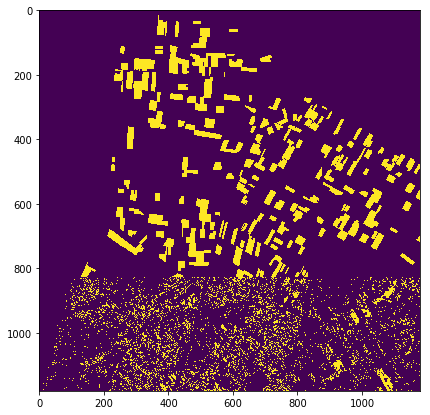

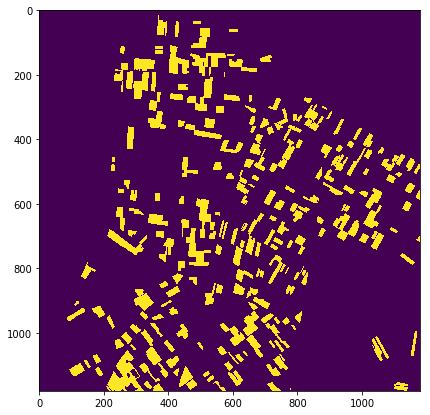

In [147]:
plot_image(y_pred_image)
plot_image(np.append(y_train, y_test).reshape(1180,1180))

In [167]:
#4D tabela bands je sestavljena iz 120različnih datumov slikanja, 1180širina, 1180višina, 13različnih bandov
#Zgornjo sliko razrežemo, da dobimo le en dolg trak, širine enega piksla
X = bands[108][:,:].flatten().reshape(1180*1180, 13)

In [168]:
dates[108]

datetime.datetime(2018, 3, 27, 10, 7, 34)

In [169]:
#
y = mask_full_t.flatten()

In [170]:
#Nastavitev, da bo se program na naključnih 70% pikslov učil in na 30% pikslov napovedal
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=42, shuffle=False)

In [171]:
len(X_train)+len(X_test)

1392400

In [172]:
len(X)

1392400

In [173]:
#Faza učenja
from sklearn import tree
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn import svm

clf = tree.DecisionTreeClassifier()
#clf = RandomForestClassifier()
#clf = LogisticRegression()
#clf = svm.SVC()
clf = clf.fit(X_train, y_train)

In [154]:
#Faza predikcije
y_pred = clf.predict(X_test)

In [143]:
y_pred
np.savetxt('predikcija', y_pred)

In [144]:
y_pred_image = np.append(y_train, y_pred).reshape(1180,1180)

In [128]:
np.zeros(10)

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])

In [102]:
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score

In [155]:
#Primerjava rezultatov
precision_score(y_test, y_pred)

0.16351733998710366

In [156]:
recall_score(y_test, y_pred)

0.2187734433608402

In [157]:
f1_score(y_test, y_pred)

0.18715204800333715

In [106]:
#Vizualna upodobitev drevesa
import graphviz as gv
dot_data = tree.export_graphviz(clf, out_file=None) 

#graph.render("iris") 
g1 = gv.Graph(format='png')
g1 = gv.Source(dot_data) 

In [107]:
#Shrani drevo kot pdf
decisiontree = g1.render("decisiontree")

print(decisiontree)

KeyboardInterrupt: 

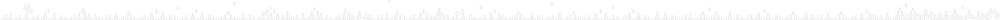

In [73]:
g1